# GAN example

In [1]:
# import necessary packages

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.layers import LeakyReLU, Reshape, Conv2DTranspose, UpSampling2D, Embedding, Concatenate

import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import random
    import sklearn
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, cohen_kappa_score

In [2]:
noise_dim = 100 

In [3]:
import cv2
import os
import numpy as np
def load_img(indir):
    samples = []
    labels = []
    for class_dir in os.listdir(indir):
        the_class = class_dir
        print(the_class)
        for file in os.listdir(indir+'/'+class_dir):
            #print(file)
            #print("{}/{}/{}".format(indir,class_dir,file))
            if file.endswith('ppm'):
                image = cv2.imread("{}/{}/{}".format(indir,class_dir,file))
                image = cv2.resize(image, (32,32))
                image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                image = np.expand_dims(image,axis=2)
                samples.append(image)
                labels.append(the_class)
    samples = np.array(samples)
    labels = np.array(labels)
    return samples,labels

In [16]:
#from helper import load_img
samples, labels = load_img('signs')
print('loaded',len(samples),' samples')
print('classes',set(labels))
samples = samples/255

encoder = sklearn.preprocessing.LabelEncoder() # encoder
labels = encoder.fit_transform(labels)
print(labels[:10])
#print(intlabels[:10])

00001
00007
00014
00016
loaded 3300  samples
classes {'00016', '00001', '00014', '00007'}
[0 0 0 0 0 0 0 0 0 0]


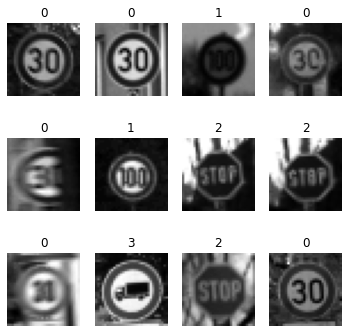

In [17]:
import random
plt.figure(figsize=(6, 6))
for i in range(12):
    ax = plt.subplot(3, 4, i + 1)
    r = random.randint(0,samples.shape[0])
    plt.imshow(samples[r][:,:,0],cmap='gray')
    plt.title(labels[r])
    plt.axis("off")

In [14]:
# Generator gets a noise vector of size noise_dim and generates an image of size (32 x 32 x 1)
# Our aim: we want the image to be as similar to real images (generated above) as possible
def make_generator_model():
    
    
    input_layer = tf.keras.layers.Input(shape=(noise_dim,))
    x = Dense(8*8*256, use_bias=False)(input_layer)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Reshape((8, 8, 256))(x)

    
    # tu wpiąć generację z klasy = input, embedding(50), reshape 8x8x1 i na koniec concatenate
    input_label = tf.keras.layers.Input(shape=(1,))
    # embedding for categorical input
    y = Embedding(4, 50)(input_label)
    # scale up to image dimensions with linear activation
    y = Dense(8*8)(y)
    y = Reshape((8, 8, 1))(y)
    
    merged = Concatenate()([x, y])
 #   merged = y
    
    x = Conv2D(128, (3, 3), strides=(1, 1), padding='same', use_bias=False)(merged)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    # output: 8 x 8 x 128

    x = UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
    x = Conv2D(64, (3, 3), strides=(1, 1), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    # output: 16 x 16 x 64

    x = UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest")(x)
    output_layer = Conv2D(1, (3, 3), strides=(1, 1), padding='same', use_bias=False, activation='sigmoid')(x)
    # output: 32 x 32 x 1 (our image)

    model = tf.keras.models.Model(inputs=[input_layer,input_label], outputs=output_layer)
    model.summary()
    return model



generator = make_generator_model()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
dense_4 (Dense)                 (None, 16384)        1638400     input_5[0][0]                    
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
batch_normalization_3 (BatchNor (None, 16384)        65536       dense_4[0][0]                    
____________________________________________________________________________________________

In [18]:
# Discriminator gets image of size (32 x 32 x 1) and decides if it is real or fake
# The result of the discriminator is used by generator to improve 'faking'

def make_discriminator_model():
    
    
    # zacząć od generację z klasy = input, embedding(50), reshape 32x32x1 i na koniec concatenate
    input_label = tf.keras.layers.Input(shape=(1,))
    # embedding for categorical input
    y = Embedding(4, 50)(input_label)
    # scale up to image dimensions with linear activation
    y = Dense(32*32)(y)
    y = Reshape((32, 32, 1))(y)
 
    
    
    input_layer = tf.keras.layers.Input(shape=(32, 32, 1))
    
    merged = Concatenate()([input_layer, y])
    x = Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 1])(merged)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Conv2D(128, (5, 5), strides=(2, 2), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Flatten()(x)
    output_layer = Dense(1,activation='sigmoid')(x)
    model = tf.keras.models.Model(inputs=[input_layer,input_label], outputs=output_layer)
    #model.add(Dense(1))
    # output: one number 0-fake, 1-real
    model.summary()

    return model

discriminator = make_discriminator_model()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 1, 50)        200         input_9[0][0]                    
__________________________________________________________________________________________________
dense_8 (Dense)                 (None, 1, 1024)      52224       embedding_4[0][0]                
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 32, 32, 1)]  0                                            
____________________________________________________________________________________________

In [19]:
# returns randomly choosen n samples

def sample_from_dataset(n,samples):
    prev_numbers = []
    new_samples = []
    new_labels = []
    while len(new_samples)<n:
        number = random.randrange(len(samples))
        if number in prev_numbers: continue
        prev_numbers.append(number)
        new_samples.append(samples[number])
        new_labels.append(labels[number])
    new_samples = np.array(new_samples,dtype=float)    
    new_labels = np.array(new_labels)    
    return new_samples,new_labels

In [20]:
# training parameters
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)
#cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
cross_entropy = tf.keras.losses.BinaryCrossentropy()


In [58]:
from numpy.random import randn

def calc_ok(vct):
    ok = 0
    for x in vct: 
        if x>=0.5: 
            ok+=1 
    return ok

# The training step

#history = []
##@tf.function
def do_step(images, labels):
    batch_size = len(images)
    images = np.array(images)
    labels = np.expand_dims(labels,axis=1)
    # create random noise for generator
    input_noise = randn(batch_size * noise_dim)
    input_noise = input_noise.reshape(batch_size, noise_dim)
    input_noise = tf.convert_to_tensor(input_noise)
    #noise = tf.random.normal([batch_size, noise_dim])

    random_labels = np.random.randint(4, size=batch_size)
    random_labels = np.expand_dims(random_labels,axis=1)
  #  print(input_noise.shape)
  #  print(random_labels.shape)
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # generate fake image using noise
        generated_images = generator([input_noise,random_labels], training=True)
        # evaluate fake images
        fake_output = discriminator([generated_images,random_labels], training=True)
        fake_acc = (batch_size-calc_ok(fake_output))/batch_size
        # generator want all images to be accepted (output=1)!
        gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
        
        # evaluate real images
        real_output = discriminator([images,labels], training=True)
        real_acc = calc_ok(real_output)/batch_size
        # discriminator wants to classify all real images as 1 and fake images as 0
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        disc_loss = real_loss + fake_loss # sum up both losses

    # calculate how to change generator to minimze its loss
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables) # step 4. calculate the gradient of the losses
    # calculate how to change discriminator to minimze its loss
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # update weights for both networks
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables)) # step 5. Apply the optimizers and update weights
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    if epoch % 10 == 0:
        print("Epoch",epoch+60000,'g_loss=',gen_loss.numpy(),'d_loss=',disc_loss.numpy(),"real_acc=",real_acc,"fake_acc=",fake_acc)
    history.append([gen_loss.numpy(),disc_loss.numpy(),real_acc,fake_acc])
    

Epoch 60000 g_loss= 0.99772924 d_loss= 1.1283588 real_acc= 0.8 fake_acc= 0.68


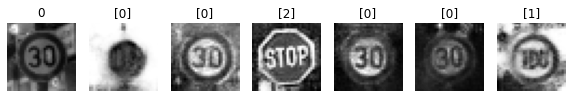

Epoch 60010 g_loss= 0.93735796 d_loss= 1.2502466 real_acc= 0.7 fake_acc= 0.62
Epoch 60020 g_loss= 0.9156892 d_loss= 1.1723331 real_acc= 0.78 fake_acc= 0.62
Epoch 60030 g_loss= 0.89179504 d_loss= 1.286612 real_acc= 0.7 fake_acc= 0.56
Epoch 60040 g_loss= 1.0788281 d_loss= 1.1245246 real_acc= 0.8 fake_acc= 0.64
Epoch 60050 g_loss= 1.1055875 d_loss= 1.2363238 real_acc= 0.46 fake_acc= 0.76
Epoch 60060 g_loss= 0.98395175 d_loss= 1.210686 real_acc= 0.68 fake_acc= 0.64
Epoch 60070 g_loss= 1.0786716 d_loss= 1.1223187 real_acc= 0.72 fake_acc= 0.58
Epoch 60080 g_loss= 1.1349541 d_loss= 1.4295301 real_acc= 0.5 fake_acc= 0.68
Epoch 60090 g_loss= 1.03089 d_loss= 1.2037094 real_acc= 0.6 fake_acc= 0.8
Epoch 60100 g_loss= 0.7939104 d_loss= 1.3280822 real_acc= 0.7 fake_acc= 0.46


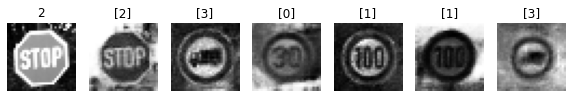

Epoch 60110 g_loss= 1.0990373 d_loss= 1.1246797 real_acc= 0.66 fake_acc= 0.78
Epoch 60120 g_loss= 0.9824751 d_loss= 1.2327305 real_acc= 0.58 fake_acc= 0.68
Epoch 60130 g_loss= 1.2330936 d_loss= 1.1630149 real_acc= 0.56 fake_acc= 0.8
Epoch 60140 g_loss= 1.1350788 d_loss= 1.1808336 real_acc= 0.6 fake_acc= 0.7
Epoch 60150 g_loss= 1.0250186 d_loss= 1.145063 real_acc= 0.74 fake_acc= 0.72
Epoch 60160 g_loss= 1.1360584 d_loss= 1.069272 real_acc= 0.76 fake_acc= 0.62
Epoch 60170 g_loss= 1.2448411 d_loss= 0.9936516 real_acc= 0.7 fake_acc= 0.8
Epoch 60180 g_loss= 0.9941951 d_loss= 1.1710969 real_acc= 0.68 fake_acc= 0.68
Epoch 60190 g_loss= 0.8580619 d_loss= 1.2622523 real_acc= 0.72 fake_acc= 0.56
Epoch 60200 g_loss= 0.9271567 d_loss= 1.1183201 real_acc= 0.78 fake_acc= 0.62


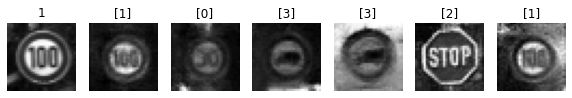

Epoch 60210 g_loss= 1.1394889 d_loss= 1.1614912 real_acc= 0.58 fake_acc= 0.76
Epoch 60220 g_loss= 0.94959646 d_loss= 1.3712319 real_acc= 0.46 fake_acc= 0.64
Epoch 60230 g_loss= 0.94094664 d_loss= 1.2252107 real_acc= 0.76 fake_acc= 0.66
Epoch 60240 g_loss= 1.1353061 d_loss= 1.2669909 real_acc= 0.52 fake_acc= 0.72
Epoch 60250 g_loss= 1.0418868 d_loss= 1.2137128 real_acc= 0.72 fake_acc= 0.7
Epoch 60260 g_loss= 0.996167 d_loss= 1.2293816 real_acc= 0.64 fake_acc= 0.6
Epoch 60270 g_loss= 1.0078764 d_loss= 1.131574 real_acc= 0.64 fake_acc= 0.74
Epoch 60280 g_loss= 1.0671638 d_loss= 1.0847287 real_acc= 0.72 fake_acc= 0.78
Epoch 60290 g_loss= 1.1289152 d_loss= 1.0366757 real_acc= 0.66 fake_acc= 0.8
Epoch 60300 g_loss= 0.9875183 d_loss= 1.22536 real_acc= 0.64 fake_acc= 0.62


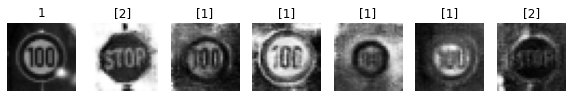

Epoch 60310 g_loss= 1.0240723 d_loss= 1.077488 real_acc= 0.78 fake_acc= 0.64
Epoch 60320 g_loss= 1.0428586 d_loss= 1.1252277 real_acc= 0.64 fake_acc= 0.72
Epoch 60330 g_loss= 0.9945517 d_loss= 1.1211051 real_acc= 0.78 fake_acc= 0.54
Epoch 60340 g_loss= 1.0241697 d_loss= 1.1437925 real_acc= 0.68 fake_acc= 0.7
Epoch 60350 g_loss= 1.0018878 d_loss= 1.3039211 real_acc= 0.64 fake_acc= 0.6
Epoch 60360 g_loss= 1.0143543 d_loss= 1.292404 real_acc= 0.66 fake_acc= 0.58
Epoch 60370 g_loss= 1.091706 d_loss= 0.9827447 real_acc= 0.74 fake_acc= 0.74
Epoch 60380 g_loss= 1.1495175 d_loss= 1.2109313 real_acc= 0.54 fake_acc= 0.76
Epoch 60390 g_loss= 0.92453074 d_loss= 1.0812904 real_acc= 0.78 fake_acc= 0.6
Epoch 60400 g_loss= 0.8958258 d_loss= 1.1870117 real_acc= 0.72 fake_acc= 0.58


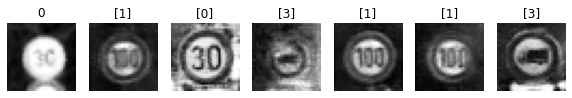

Epoch 60410 g_loss= 1.0367652 d_loss= 1.2065117 real_acc= 0.78 fake_acc= 0.56
Epoch 60420 g_loss= 1.3878818 d_loss= 1.1740029 real_acc= 0.6 fake_acc= 0.82
Epoch 60430 g_loss= 1.0444543 d_loss= 1.0556133 real_acc= 0.8 fake_acc= 0.72
Epoch 60440 g_loss= 1.0304334 d_loss= 1.1368597 real_acc= 0.76 fake_acc= 0.74
Epoch 60450 g_loss= 1.0672257 d_loss= 1.1992651 real_acc= 0.6 fake_acc= 0.76
Epoch 60460 g_loss= 0.96419054 d_loss= 1.1540725 real_acc= 0.74 fake_acc= 0.6
Epoch 60470 g_loss= 0.9127933 d_loss= 1.2505426 real_acc= 0.56 fake_acc= 0.64
Epoch 60480 g_loss= 1.1667454 d_loss= 1.1132555 real_acc= 0.66 fake_acc= 0.74
Epoch 60490 g_loss= 1.0151447 d_loss= 1.0613581 real_acc= 0.7 fake_acc= 0.66
Epoch 60500 g_loss= 1.0568364 d_loss= 1.1370673 real_acc= 0.66 fake_acc= 0.66


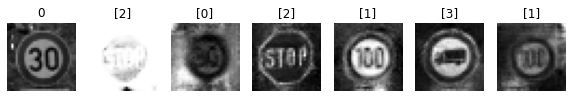

Epoch 60510 g_loss= 0.9910687 d_loss= 1.126205 real_acc= 0.72 fake_acc= 0.7
Epoch 60520 g_loss= 1.0928032 d_loss= 1.2093074 real_acc= 0.68 fake_acc= 0.6
Epoch 60530 g_loss= 1.1627812 d_loss= 1.2051446 real_acc= 0.6 fake_acc= 0.72
Epoch 60540 g_loss= 0.9514953 d_loss= 1.1250038 real_acc= 0.78 fake_acc= 0.54
Epoch 60550 g_loss= 1.0338057 d_loss= 1.1137979 real_acc= 0.8 fake_acc= 0.6
Epoch 60560 g_loss= 1.1972933 d_loss= 1.0711577 real_acc= 0.76 fake_acc= 0.78
Epoch 60570 g_loss= 1.0954335 d_loss= 1.1328794 real_acc= 0.78 fake_acc= 0.7
Epoch 60580 g_loss= 0.8590908 d_loss= 1.3108544 real_acc= 0.76 fake_acc= 0.62
Epoch 60590 g_loss= 0.9253284 d_loss= 1.1812446 real_acc= 0.64 fake_acc= 0.6
Epoch 60600 g_loss= 1.1435736 d_loss= 1.1002147 real_acc= 0.6 fake_acc= 0.88


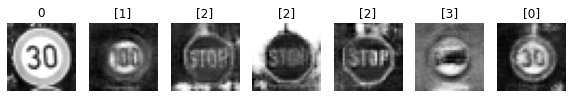

Epoch 60610 g_loss= 0.96366674 d_loss= 1.1760225 real_acc= 0.68 fake_acc= 0.6
Epoch 60620 g_loss= 0.99147034 d_loss= 1.1391194 real_acc= 0.76 fake_acc= 0.62
Epoch 60630 g_loss= 0.9666915 d_loss= 1.2651134 real_acc= 0.64 fake_acc= 0.56
Epoch 60640 g_loss= 0.903572 d_loss= 1.257993 real_acc= 0.66 fake_acc= 0.6
Epoch 60650 g_loss= 0.9016132 d_loss= 1.2651384 real_acc= 0.76 fake_acc= 0.66
Epoch 60660 g_loss= 0.88636583 d_loss= 1.282769 real_acc= 0.7 fake_acc= 0.58
Epoch 60670 g_loss= 0.9451703 d_loss= 1.2088175 real_acc= 0.7 fake_acc= 0.68
Epoch 60680 g_loss= 1.2173461 d_loss= 1.2335757 real_acc= 0.52 fake_acc= 0.82
Epoch 60690 g_loss= 1.0947498 d_loss= 1.053039 real_acc= 0.82 fake_acc= 0.66
Epoch 60700 g_loss= 1.1484413 d_loss= 1.0302985 real_acc= 0.74 fake_acc= 0.72


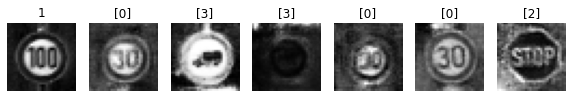

Epoch 60710 g_loss= 1.1502986 d_loss= 1.1579356 real_acc= 0.66 fake_acc= 0.62
Epoch 60720 g_loss= 1.0802827 d_loss= 1.1660182 real_acc= 0.78 fake_acc= 0.68
Epoch 60730 g_loss= 1.0590197 d_loss= 1.2084134 real_acc= 0.68 fake_acc= 0.64
Epoch 60740 g_loss= 1.1167345 d_loss= 1.1478903 real_acc= 0.6 fake_acc= 0.74
Epoch 60750 g_loss= 1.0304885 d_loss= 1.2023573 real_acc= 0.68 fake_acc= 0.66
Epoch 60760 g_loss= 0.8942249 d_loss= 1.3007139 real_acc= 0.58 fake_acc= 0.64
Epoch 60770 g_loss= 1.0219696 d_loss= 1.0504766 real_acc= 0.82 fake_acc= 0.7
Epoch 60780 g_loss= 1.2794784 d_loss= 0.999125 real_acc= 0.68 fake_acc= 0.82
Epoch 60790 g_loss= 1.0141083 d_loss= 1.105036 real_acc= 0.64 fake_acc= 0.68
Epoch 60800 g_loss= 1.0960673 d_loss= 1.1570966 real_acc= 0.68 fake_acc= 0.76


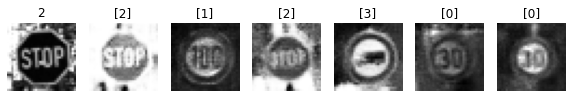

Epoch 60810 g_loss= 1.212221 d_loss= 1.0723715 real_acc= 0.7 fake_acc= 0.78
Epoch 60820 g_loss= 0.9120381 d_loss= 1.3853543 real_acc= 0.62 fake_acc= 0.5
Epoch 60830 g_loss= 0.9992566 d_loss= 1.1447694 real_acc= 0.68 fake_acc= 0.64
Epoch 60840 g_loss= 0.9793206 d_loss= 1.1547763 real_acc= 0.8 fake_acc= 0.66
Epoch 60850 g_loss= 0.994403 d_loss= 1.150094 real_acc= 0.62 fake_acc= 0.72
Epoch 60860 g_loss= 1.0826775 d_loss= 1.1308615 real_acc= 0.78 fake_acc= 0.62
Epoch 60870 g_loss= 0.9221265 d_loss= 1.1257439 real_acc= 0.86 fake_acc= 0.6
Epoch 60880 g_loss= 0.9699105 d_loss= 1.206821 real_acc= 0.68 fake_acc= 0.66
Epoch 60890 g_loss= 1.0462435 d_loss= 1.2200794 real_acc= 0.64 fake_acc= 0.68
Epoch 60900 g_loss= 1.0780529 d_loss= 1.1168438 real_acc= 0.7 fake_acc= 0.72


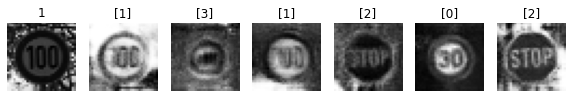

Epoch 60910 g_loss= 1.0765724 d_loss= 1.2058636 real_acc= 0.58 fake_acc= 0.66
Epoch 60920 g_loss= 1.0060121 d_loss= 1.1745628 real_acc= 0.7 fake_acc= 0.66
Epoch 60930 g_loss= 1.087778 d_loss= 1.1880956 real_acc= 0.6 fake_acc= 0.7
Epoch 60940 g_loss= 1.1281275 d_loss= 1.1959898 real_acc= 0.62 fake_acc= 0.66
Epoch 60950 g_loss= 0.89372355 d_loss= 1.2781472 real_acc= 0.62 fake_acc= 0.6
Epoch 60960 g_loss= 1.0830575 d_loss= 1.088109 real_acc= 0.76 fake_acc= 0.66
Epoch 60970 g_loss= 1.1928239 d_loss= 0.97636825 real_acc= 0.78 fake_acc= 0.78
Epoch 60980 g_loss= 0.8938636 d_loss= 1.2906197 real_acc= 0.68 fake_acc= 0.56
Epoch 60990 g_loss= 1.0349067 d_loss= 1.1412044 real_acc= 0.66 fake_acc= 0.72
Epoch 61000 g_loss= 0.77269113 d_loss= 1.2287498 real_acc= 0.78 fake_acc= 0.52


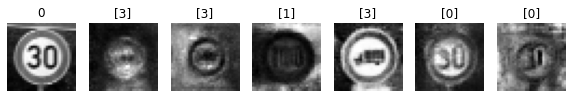

Epoch 61010 g_loss= 1.1112497 d_loss= 1.2158933 real_acc= 0.52 fake_acc= 0.72
Epoch 61020 g_loss= 1.0114845 d_loss= 1.0688086 real_acc= 0.72 fake_acc= 0.72
Epoch 61030 g_loss= 0.98271215 d_loss= 1.1866245 real_acc= 0.66 fake_acc= 0.74
Epoch 61040 g_loss= 0.88547736 d_loss= 1.1142542 real_acc= 0.82 fake_acc= 0.68
Epoch 61050 g_loss= 0.9370324 d_loss= 1.2008221 real_acc= 0.72 fake_acc= 0.68
Epoch 61060 g_loss= 1.0701884 d_loss= 1.1792445 real_acc= 0.64 fake_acc= 0.78
Epoch 61070 g_loss= 0.9699535 d_loss= 1.1377592 real_acc= 0.72 fake_acc= 0.64
Epoch 61080 g_loss= 1.1560098 d_loss= 1.2951436 real_acc= 0.6 fake_acc= 0.7
Epoch 61090 g_loss= 1.1564453 d_loss= 1.1235654 real_acc= 0.76 fake_acc= 0.72
Epoch 61100 g_loss= 0.8630313 d_loss= 1.2725718 real_acc= 0.74 fake_acc= 0.52


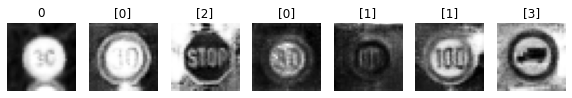

Epoch 61110 g_loss= 1.1971122 d_loss= 1.1890111 real_acc= 0.54 fake_acc= 0.74
Epoch 61120 g_loss= 0.9557389 d_loss= 1.1171613 real_acc= 0.74 fake_acc= 0.62
Epoch 61130 g_loss= 0.85249853 d_loss= 1.2512372 real_acc= 0.7 fake_acc= 0.54
Epoch 61140 g_loss= 1.0760541 d_loss= 1.1792517 real_acc= 0.76 fake_acc= 0.64
Epoch 61150 g_loss= 0.8542001 d_loss= 1.2456524 real_acc= 0.72 fake_acc= 0.54
Epoch 61160 g_loss= 1.1675967 d_loss= 1.2056769 real_acc= 0.58 fake_acc= 0.72
Epoch 61170 g_loss= 0.94244605 d_loss= 1.2341228 real_acc= 0.64 fake_acc= 0.64
Epoch 61180 g_loss= 0.9447861 d_loss= 1.2378542 real_acc= 0.62 fake_acc= 0.62
Epoch 61190 g_loss= 1.1012635 d_loss= 1.1328228 real_acc= 0.64 fake_acc= 0.74
Epoch 61200 g_loss= 0.9672163 d_loss= 1.1559951 real_acc= 0.7 fake_acc= 0.74


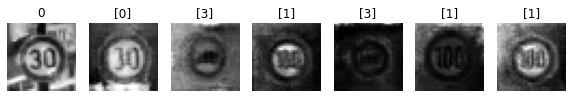

Epoch 61210 g_loss= 0.9288004 d_loss= 1.1109152 real_acc= 0.8 fake_acc= 0.56
Epoch 61220 g_loss= 1.1047997 d_loss= 1.2409017 real_acc= 0.5 fake_acc= 0.74
Epoch 61230 g_loss= 1.0082045 d_loss= 1.0625921 real_acc= 0.78 fake_acc= 0.7
Epoch 61240 g_loss= 1.0848354 d_loss= 1.2417012 real_acc= 0.56 fake_acc= 0.72
Epoch 61250 g_loss= 0.95916915 d_loss= 1.1681824 real_acc= 0.68 fake_acc= 0.54
Epoch 61260 g_loss= 0.9936643 d_loss= 1.0477996 real_acc= 0.84 fake_acc= 0.58
Epoch 61270 g_loss= 1.1806184 d_loss= 1.1532841 real_acc= 0.8 fake_acc= 0.72
Epoch 61280 g_loss= 1.166579 d_loss= 1.3217776 real_acc= 0.58 fake_acc= 0.66
Epoch 61290 g_loss= 1.088751 d_loss= 1.1136773 real_acc= 0.74 fake_acc= 0.64
Epoch 61300 g_loss= 1.1084757 d_loss= 1.1276394 real_acc= 0.72 fake_acc= 0.7


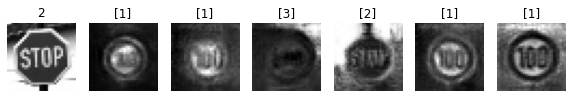

Epoch 61310 g_loss= 1.1311024 d_loss= 1.1435795 real_acc= 0.7 fake_acc= 0.8
Epoch 61320 g_loss= 1.0425497 d_loss= 1.1883774 real_acc= 0.64 fake_acc= 0.72
Epoch 61330 g_loss= 1.1371151 d_loss= 1.1407044 real_acc= 0.54 fake_acc= 0.8
Epoch 61340 g_loss= 0.9403877 d_loss= 1.1848344 real_acc= 0.68 fake_acc= 0.64
Epoch 61350 g_loss= 1.0953983 d_loss= 1.0857074 real_acc= 0.8 fake_acc= 0.74
Epoch 61360 g_loss= 1.2096586 d_loss= 1.1636496 real_acc= 0.68 fake_acc= 0.7
Epoch 61370 g_loss= 1.1954448 d_loss= 1.1082435 real_acc= 0.66 fake_acc= 0.7
Epoch 61380 g_loss= 0.9933854 d_loss= 1.1466062 real_acc= 0.76 fake_acc= 0.62
Epoch 61390 g_loss= 1.2058263 d_loss= 1.0932877 real_acc= 0.7 fake_acc= 0.74
Epoch 61400 g_loss= 1.0684339 d_loss= 1.2128023 real_acc= 0.62 fake_acc= 0.66


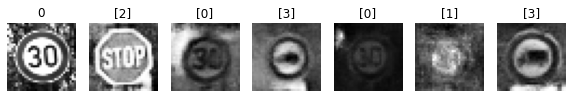

Epoch 61410 g_loss= 0.9637223 d_loss= 1.1483631 real_acc= 0.8 fake_acc= 0.6
Epoch 61420 g_loss= 1.0105041 d_loss= 1.1761389 real_acc= 0.72 fake_acc= 0.68
Epoch 61430 g_loss= 0.9696607 d_loss= 1.1251106 real_acc= 0.64 fake_acc= 0.68
Epoch 61440 g_loss= 1.0848835 d_loss= 0.97018456 real_acc= 0.76 fake_acc= 0.84
Epoch 61450 g_loss= 0.8646309 d_loss= 1.279103 real_acc= 0.68 fake_acc= 0.6
Epoch 61460 g_loss= 0.8489325 d_loss= 1.1782578 real_acc= 0.8 fake_acc= 0.6
Epoch 61470 g_loss= 1.0608518 d_loss= 1.0364008 real_acc= 0.82 fake_acc= 0.64
Epoch 61480 g_loss= 0.94348663 d_loss= 1.153523 real_acc= 0.78 fake_acc= 0.6
Epoch 61490 g_loss= 1.2028091 d_loss= 1.1234026 real_acc= 0.7 fake_acc= 0.68
Epoch 61500 g_loss= 0.8949897 d_loss= 1.2621374 real_acc= 0.72 fake_acc= 0.6


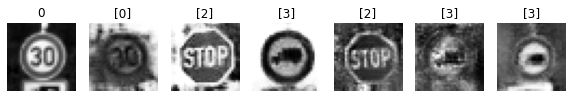

Epoch 61510 g_loss= 1.0740339 d_loss= 1.2569327 real_acc= 0.58 fake_acc= 0.62
Epoch 61520 g_loss= 1.0853269 d_loss= 1.1684703 real_acc= 0.62 fake_acc= 0.72
Epoch 61530 g_loss= 0.98723215 d_loss= 1.1970422 real_acc= 0.64 fake_acc= 0.66
Epoch 61540 g_loss= 1.0633422 d_loss= 1.1766746 real_acc= 0.72 fake_acc= 0.82
Epoch 61550 g_loss= 0.77953345 d_loss= 1.3344705 real_acc= 0.78 fake_acc= 0.44
Epoch 61560 g_loss= 0.92374223 d_loss= 1.195709 real_acc= 0.7 fake_acc= 0.62
Epoch 61570 g_loss= 1.0452473 d_loss= 1.2138762 real_acc= 0.58 fake_acc= 0.62
Epoch 61580 g_loss= 0.966816 d_loss= 1.3105409 real_acc= 0.64 fake_acc= 0.62
Epoch 61590 g_loss= 0.9145839 d_loss= 1.162177 real_acc= 0.7 fake_acc= 0.7
Epoch 61600 g_loss= 0.8866462 d_loss= 1.2057335 real_acc= 0.64 fake_acc= 0.62


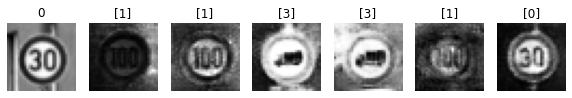

Epoch 61610 g_loss= 1.0102544 d_loss= 1.1841068 real_acc= 0.62 fake_acc= 0.68
Epoch 61620 g_loss= 1.2248303 d_loss= 1.0413136 real_acc= 0.72 fake_acc= 0.8
Epoch 61630 g_loss= 0.9087053 d_loss= 1.1213828 real_acc= 0.86 fake_acc= 0.56
Epoch 61640 g_loss= 0.90858835 d_loss= 1.2276261 real_acc= 0.72 fake_acc= 0.62
Epoch 61650 g_loss= 1.1289219 d_loss= 1.0724473 real_acc= 0.76 fake_acc= 0.68
Epoch 61660 g_loss= 0.8536132 d_loss= 1.3008265 real_acc= 0.64 fake_acc= 0.6
Epoch 61670 g_loss= 0.9645491 d_loss= 1.1810846 real_acc= 0.78 fake_acc= 0.62
Epoch 61680 g_loss= 0.9407814 d_loss= 1.1040418 real_acc= 0.78 fake_acc= 0.66
Epoch 61690 g_loss= 1.1520343 d_loss= 1.0995601 real_acc= 0.66 fake_acc= 0.78
Epoch 61700 g_loss= 1.0784904 d_loss= 1.079864 real_acc= 0.76 fake_acc= 0.74


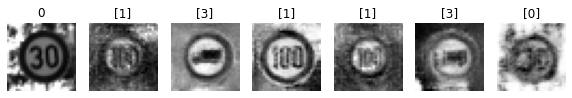

Epoch 61710 g_loss= 0.9462804 d_loss= 1.193618 real_acc= 0.74 fake_acc= 0.56
Epoch 61720 g_loss= 0.92381334 d_loss= 1.2364091 real_acc= 0.6 fake_acc= 0.62
Epoch 61730 g_loss= 1.0788487 d_loss= 1.1191218 real_acc= 0.74 fake_acc= 0.64
Epoch 61740 g_loss= 1.1405516 d_loss= 1.1195314 real_acc= 0.78 fake_acc= 0.6
Epoch 61750 g_loss= 1.2157537 d_loss= 1.0681088 real_acc= 0.72 fake_acc= 0.78
Epoch 61760 g_loss= 0.92548025 d_loss= 1.1828066 real_acc= 0.64 fake_acc= 0.76
Epoch 61770 g_loss= 0.9246617 d_loss= 1.1858554 real_acc= 0.68 fake_acc= 0.58
Epoch 61780 g_loss= 1.045391 d_loss= 1.0904653 real_acc= 0.68 fake_acc= 0.74
Epoch 61790 g_loss= 1.0242746 d_loss= 1.12432 real_acc= 0.58 fake_acc= 0.72
Epoch 61800 g_loss= 1.0077507 d_loss= 1.1485527 real_acc= 0.72 fake_acc= 0.62


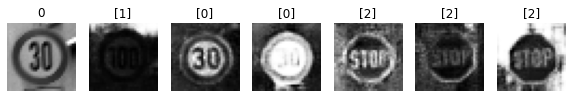

Epoch 61810 g_loss= 1.0254053 d_loss= 1.2695179 real_acc= 0.7 fake_acc= 0.64
Epoch 61820 g_loss= 1.0847021 d_loss= 1.0936071 real_acc= 0.74 fake_acc= 0.68
Epoch 61830 g_loss= 0.983623 d_loss= 1.1305277 real_acc= 0.76 fake_acc= 0.68
Epoch 61840 g_loss= 1.022461 d_loss= 1.1815999 real_acc= 0.62 fake_acc= 0.7
Epoch 61850 g_loss= 1.1022626 d_loss= 1.0832787 real_acc= 0.62 fake_acc= 0.68
Epoch 61860 g_loss= 1.0747156 d_loss= 1.1533802 real_acc= 0.62 fake_acc= 0.76
Epoch 61870 g_loss= 0.9973262 d_loss= 1.0873349 real_acc= 0.82 fake_acc= 0.72
Epoch 61880 g_loss= 0.972635 d_loss= 1.1717327 real_acc= 0.74 fake_acc= 0.56
Epoch 61890 g_loss= 0.97189337 d_loss= 1.2059418 real_acc= 0.64 fake_acc= 0.64
Epoch 61900 g_loss= 1.0263152 d_loss= 1.1292751 real_acc= 0.78 fake_acc= 0.68


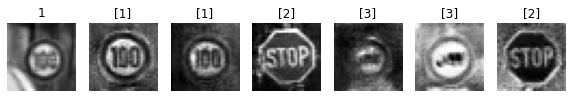

Epoch 61910 g_loss= 1.0520899 d_loss= 1.1515656 real_acc= 0.62 fake_acc= 0.78
Epoch 61920 g_loss= 0.9677957 d_loss= 1.2307595 real_acc= 0.6 fake_acc= 0.58
Epoch 61930 g_loss= 0.9310118 d_loss= 1.161866 real_acc= 0.78 fake_acc= 0.7
Epoch 61940 g_loss= 0.9742762 d_loss= 1.126854 real_acc= 0.7 fake_acc= 0.7
Epoch 61950 g_loss= 0.9388807 d_loss= 1.2282825 real_acc= 0.68 fake_acc= 0.68
Epoch 61960 g_loss= 0.9488815 d_loss= 1.1066589 real_acc= 0.7 fake_acc= 0.66
Epoch 61970 g_loss= 0.953628 d_loss= 1.1320251 real_acc= 0.68 fake_acc= 0.7
Epoch 61980 g_loss= 1.2360071 d_loss= 1.20679 real_acc= 0.56 fake_acc= 0.72
Epoch 61990 g_loss= 0.94764525 d_loss= 1.1150289 real_acc= 0.82 fake_acc= 0.58
Epoch 62000 g_loss= 1.0738133 d_loss= 1.027811 real_acc= 0.78 fake_acc= 0.8


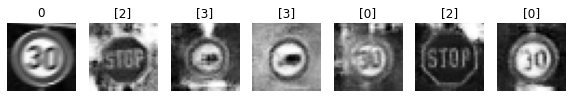

Epoch 62010 g_loss= 1.0565562 d_loss= 1.1735706 real_acc= 0.64 fake_acc= 0.72
Epoch 62020 g_loss= 0.93992287 d_loss= 1.129508 real_acc= 0.76 fake_acc= 0.58
Epoch 62030 g_loss= 1.1269346 d_loss= 1.1251684 real_acc= 0.6 fake_acc= 0.8
Epoch 62040 g_loss= 1.0761137 d_loss= 1.1135857 real_acc= 0.66 fake_acc= 0.84
Epoch 62050 g_loss= 0.9746908 d_loss= 1.1424457 real_acc= 0.82 fake_acc= 0.66
Epoch 62060 g_loss= 1.1767613 d_loss= 1.151928 real_acc= 0.62 fake_acc= 0.82
Epoch 62070 g_loss= 1.068024 d_loss= 1.1632085 real_acc= 0.66 fake_acc= 0.74
Epoch 62080 g_loss= 0.9655132 d_loss= 1.153334 real_acc= 0.72 fake_acc= 0.7
Epoch 62090 g_loss= 0.9756428 d_loss= 1.0831555 real_acc= 0.82 fake_acc= 0.72
Epoch 62100 g_loss= 1.1159104 d_loss= 1.1356738 real_acc= 0.7 fake_acc= 0.72


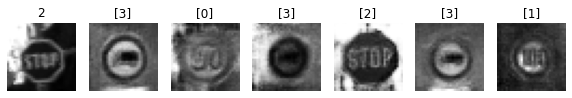

Epoch 62110 g_loss= 0.9515397 d_loss= 1.2245817 real_acc= 0.68 fake_acc= 0.64
Epoch 62120 g_loss= 0.8699979 d_loss= 1.2451148 real_acc= 0.62 fake_acc= 0.58
Epoch 62130 g_loss= 1.0525743 d_loss= 1.1302254 real_acc= 0.72 fake_acc= 0.7
Epoch 62140 g_loss= 1.1286646 d_loss= 1.2332641 real_acc= 0.54 fake_acc= 0.8
Epoch 62150 g_loss= 1.0664083 d_loss= 1.1176683 real_acc= 0.7 fake_acc= 0.68
Epoch 62160 g_loss= 1.0000427 d_loss= 1.1291288 real_acc= 0.76 fake_acc= 0.62
Epoch 62170 g_loss= 0.9578131 d_loss= 1.2787112 real_acc= 0.66 fake_acc= 0.64
Epoch 62180 g_loss= 1.1263263 d_loss= 1.0766418 real_acc= 0.66 fake_acc= 0.8
Epoch 62190 g_loss= 1.0382634 d_loss= 1.11021 real_acc= 0.82 fake_acc= 0.62
Epoch 62200 g_loss= 1.1720036 d_loss= 1.2883046 real_acc= 0.6 fake_acc= 0.72


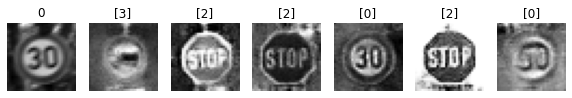

Epoch 62210 g_loss= 1.0185205 d_loss= 1.1694323 real_acc= 0.7 fake_acc= 0.66
Epoch 62220 g_loss= 0.86344993 d_loss= 1.3797607 real_acc= 0.54 fake_acc= 0.62
Epoch 62230 g_loss= 0.8734957 d_loss= 1.1240401 real_acc= 0.88 fake_acc= 0.64
Epoch 62240 g_loss= 0.9943137 d_loss= 1.220122 real_acc= 0.6 fake_acc= 0.72
Epoch 62250 g_loss= 1.1330177 d_loss= 1.1197853 real_acc= 0.7 fake_acc= 0.78
Epoch 62260 g_loss= 1.0459125 d_loss= 1.1440994 real_acc= 0.7 fake_acc= 0.68
Epoch 62270 g_loss= 0.8538217 d_loss= 1.2934401 real_acc= 0.6 fake_acc= 0.5
Epoch 62280 g_loss= 1.0882472 d_loss= 1.1167691 real_acc= 0.78 fake_acc= 0.72
Epoch 62290 g_loss= 1.1091077 d_loss= 1.1891885 real_acc= 0.64 fake_acc= 0.62
Epoch 62300 g_loss= 1.0935457 d_loss= 1.1756675 real_acc= 0.66 fake_acc= 0.74


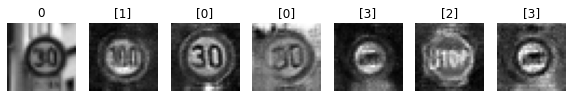

Epoch 62310 g_loss= 0.99379504 d_loss= 1.1448302 real_acc= 0.76 fake_acc= 0.64
Epoch 62320 g_loss= 0.9980562 d_loss= 1.0383948 real_acc= 0.82 fake_acc= 0.64
Epoch 62330 g_loss= 0.9990814 d_loss= 1.1762071 real_acc= 0.68 fake_acc= 0.74
Epoch 62340 g_loss= 0.889091 d_loss= 1.300516 real_acc= 0.6 fake_acc= 0.56
Epoch 62350 g_loss= 1.0188259 d_loss= 1.2156463 real_acc= 0.56 fake_acc= 0.66
Epoch 62360 g_loss= 1.1117817 d_loss= 1.2376001 real_acc= 0.52 fake_acc= 0.72
Epoch 62370 g_loss= 1.0498073 d_loss= 1.1451324 real_acc= 0.7 fake_acc= 0.66
Epoch 62380 g_loss= 1.1017666 d_loss= 1.0903244 real_acc= 0.74 fake_acc= 0.72
Epoch 62390 g_loss= 1.044741 d_loss= 1.1545117 real_acc= 0.76 fake_acc= 0.62
Epoch 62400 g_loss= 0.9293361 d_loss= 1.108772 real_acc= 0.78 fake_acc= 0.64


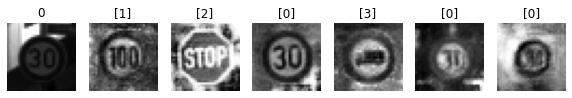

Epoch 62410 g_loss= 0.9554539 d_loss= 1.2737248 real_acc= 0.56 fake_acc= 0.7
Epoch 62420 g_loss= 1.0225245 d_loss= 1.1668507 real_acc= 0.7 fake_acc= 0.62
Epoch 62430 g_loss= 0.8541791 d_loss= 1.2918737 real_acc= 0.82 fake_acc= 0.46
Epoch 62440 g_loss= 1.1492448 d_loss= 1.0890049 real_acc= 0.72 fake_acc= 0.72
Epoch 62450 g_loss= 1.1718814 d_loss= 1.167357 real_acc= 0.62 fake_acc= 0.7
Epoch 62460 g_loss= 1.053677 d_loss= 1.2226483 real_acc= 0.7 fake_acc= 0.68
Epoch 62470 g_loss= 1.1963563 d_loss= 1.1472688 real_acc= 0.68 fake_acc= 0.8
Epoch 62480 g_loss= 1.0443593 d_loss= 1.2284412 real_acc= 0.74 fake_acc= 0.56
Epoch 62490 g_loss= 1.0976951 d_loss= 1.1310501 real_acc= 0.72 fake_acc= 0.68
Epoch 62500 g_loss= 1.0592865 d_loss= 1.0909717 real_acc= 0.68 fake_acc= 0.68


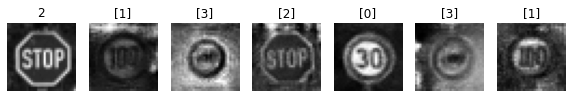

Epoch 62510 g_loss= 1.187671 d_loss= 1.0625889 real_acc= 0.64 fake_acc= 0.84
Epoch 62520 g_loss= 1.1608865 d_loss= 1.1340618 real_acc= 0.76 fake_acc= 0.78
Epoch 62530 g_loss= 1.1728916 d_loss= 1.082196 real_acc= 0.62 fake_acc= 0.78
Epoch 62540 g_loss= 0.9895346 d_loss= 1.228875 real_acc= 0.56 fake_acc= 0.6
Epoch 62550 g_loss= 0.8733005 d_loss= 1.1892395 real_acc= 0.76 fake_acc= 0.52
Epoch 62560 g_loss= 1.0120999 d_loss= 1.1590686 real_acc= 0.74 fake_acc= 0.62
Epoch 62570 g_loss= 1.1043609 d_loss= 1.1477475 real_acc= 0.76 fake_acc= 0.72
Epoch 62580 g_loss= 1.1657864 d_loss= 1.1100914 real_acc= 0.72 fake_acc= 0.78
Epoch 62590 g_loss= 1.0081593 d_loss= 1.1320343 real_acc= 0.76 fake_acc= 0.64
Epoch 62600 g_loss= 0.89105016 d_loss= 1.0789474 real_acc= 0.76 fake_acc= 0.56


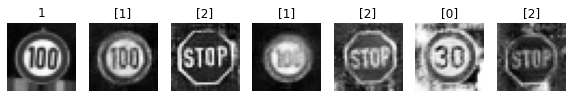

Epoch 62610 g_loss= 0.80629563 d_loss= 1.2409381 real_acc= 0.76 fake_acc= 0.58
Epoch 62620 g_loss= 1.1972659 d_loss= 1.1814886 real_acc= 0.64 fake_acc= 0.82
Epoch 62630 g_loss= 1.0657855 d_loss= 1.1536808 real_acc= 0.78 fake_acc= 0.62
Epoch 62640 g_loss= 1.0321616 d_loss= 1.1864313 real_acc= 0.74 fake_acc= 0.68
Epoch 62650 g_loss= 0.97958696 d_loss= 1.2158792 real_acc= 0.68 fake_acc= 0.56
Epoch 62660 g_loss= 1.1131406 d_loss= 1.0782719 real_acc= 0.76 fake_acc= 0.74
Epoch 62670 g_loss= 1.0879916 d_loss= 1.0500506 real_acc= 0.72 fake_acc= 0.82
Epoch 62680 g_loss= 1.0049368 d_loss= 1.1429518 real_acc= 0.74 fake_acc= 0.62
Epoch 62690 g_loss= 0.92796355 d_loss= 1.2848678 real_acc= 0.66 fake_acc= 0.54
Epoch 62700 g_loss= 0.8651644 d_loss= 1.2070776 real_acc= 0.8 fake_acc= 0.48


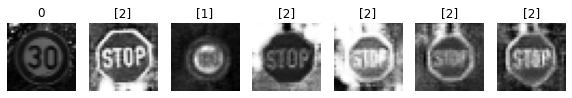

Epoch 62710 g_loss= 1.1509987 d_loss= 1.1342974 real_acc= 0.66 fake_acc= 0.76
Epoch 62720 g_loss= 0.9798541 d_loss= 1.1761281 real_acc= 0.66 fake_acc= 0.66
Epoch 62730 g_loss= 1.0508285 d_loss= 1.0926703 real_acc= 0.74 fake_acc= 0.64
Epoch 62740 g_loss= 1.1167327 d_loss= 1.1878967 real_acc= 0.6 fake_acc= 0.64
Epoch 62750 g_loss= 0.836837 d_loss= 1.2644845 real_acc= 0.7 fake_acc= 0.52
Epoch 62760 g_loss= 1.0784595 d_loss= 1.1560733 real_acc= 0.68 fake_acc= 0.72
Epoch 62770 g_loss= 1.0539099 d_loss= 1.2372715 real_acc= 0.64 fake_acc= 0.76
Epoch 62780 g_loss= 1.1735482 d_loss= 1.0828158 real_acc= 0.68 fake_acc= 0.7
Epoch 62790 g_loss= 0.96686286 d_loss= 1.225853 real_acc= 0.7 fake_acc= 0.7
Epoch 62800 g_loss= 1.130433 d_loss= 1.1983445 real_acc= 0.58 fake_acc= 0.7


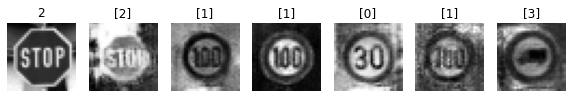

Epoch 62810 g_loss= 1.177752 d_loss= 1.1213405 real_acc= 0.68 fake_acc= 0.7
Epoch 62820 g_loss= 1.0570642 d_loss= 1.1335824 real_acc= 0.74 fake_acc= 0.7
Epoch 62830 g_loss= 0.96076155 d_loss= 1.2056597 real_acc= 0.68 fake_acc= 0.62
Epoch 62840 g_loss= 1.0388198 d_loss= 1.1025573 real_acc= 0.68 fake_acc= 0.7
Epoch 62850 g_loss= 0.952241 d_loss= 1.229193 real_acc= 0.68 fake_acc= 0.64
Epoch 62860 g_loss= 0.8997865 d_loss= 1.1390347 real_acc= 0.8 fake_acc= 0.64
Epoch 62870 g_loss= 1.0127748 d_loss= 1.2142321 real_acc= 0.66 fake_acc= 0.7
Epoch 62880 g_loss= 1.1186049 d_loss= 1.1999342 real_acc= 0.56 fake_acc= 0.74
Epoch 62890 g_loss= 0.90688026 d_loss= 1.3427889 real_acc= 0.64 fake_acc= 0.6
Epoch 62900 g_loss= 1.1054333 d_loss= 1.1589216 real_acc= 0.72 fake_acc= 0.64


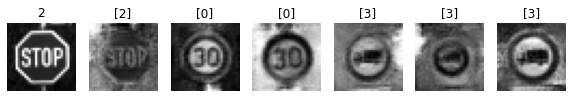

Epoch 62910 g_loss= 0.9593742 d_loss= 1.208327 real_acc= 0.76 fake_acc= 0.62
Epoch 62920 g_loss= 0.9399534 d_loss= 1.1212927 real_acc= 0.76 fake_acc= 0.64
Epoch 62930 g_loss= 1.1062392 d_loss= 1.1160798 real_acc= 0.72 fake_acc= 0.58
Epoch 62940 g_loss= 1.046127 d_loss= 1.201249 real_acc= 0.64 fake_acc= 0.68
Epoch 62950 g_loss= 0.9844096 d_loss= 1.2400665 real_acc= 0.64 fake_acc= 0.56
Epoch 62960 g_loss= 1.0415794 d_loss= 1.2303321 real_acc= 0.6 fake_acc= 0.72
Epoch 62970 g_loss= 0.9481156 d_loss= 1.3302529 real_acc= 0.68 fake_acc= 0.64
Epoch 62980 g_loss= 1.0438707 d_loss= 1.0950289 real_acc= 0.7 fake_acc= 0.68
Epoch 62990 g_loss= 1.3025571 d_loss= 1.1550069 real_acc= 0.6 fake_acc= 0.8
Epoch 63000 g_loss= 0.89389414 d_loss= 1.1102576 real_acc= 0.88 fake_acc= 0.6


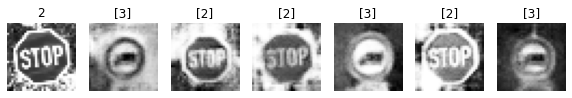

Epoch 63010 g_loss= 0.9388427 d_loss= 1.2197928 real_acc= 0.64 fake_acc= 0.66
Epoch 63020 g_loss= 0.9035274 d_loss= 1.2126353 real_acc= 0.74 fake_acc= 0.58
Epoch 63030 g_loss= 1.1366805 d_loss= 1.1652873 real_acc= 0.56 fake_acc= 0.8
Epoch 63040 g_loss= 1.2265973 d_loss= 1.2285949 real_acc= 0.52 fake_acc= 0.74
Epoch 63050 g_loss= 0.9911229 d_loss= 1.1509991 real_acc= 0.66 fake_acc= 0.7
Epoch 63060 g_loss= 0.8315043 d_loss= 1.3064414 real_acc= 0.66 fake_acc= 0.64
Epoch 63070 g_loss= 1.0799682 d_loss= 1.1720713 real_acc= 0.68 fake_acc= 0.66
Epoch 63080 g_loss= 0.9598377 d_loss= 1.2585614 real_acc= 0.7 fake_acc= 0.58
Epoch 63090 g_loss= 1.0330411 d_loss= 1.0816095 real_acc= 0.7 fake_acc= 0.76
Epoch 63100 g_loss= 0.95274186 d_loss= 1.184922 real_acc= 0.68 fake_acc= 0.7


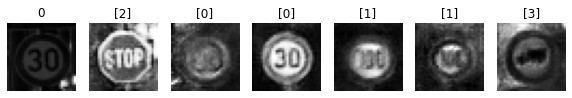

Epoch 63110 g_loss= 0.9489557 d_loss= 1.1985252 real_acc= 0.78 fake_acc= 0.58
Epoch 63120 g_loss= 1.0096444 d_loss= 1.2283757 real_acc= 0.62 fake_acc= 0.7
Epoch 63130 g_loss= 1.0291055 d_loss= 1.1582845 real_acc= 0.74 fake_acc= 0.64
Epoch 63140 g_loss= 1.0100284 d_loss= 1.2198277 real_acc= 0.6 fake_acc= 0.7
Epoch 63150 g_loss= 1.0721031 d_loss= 1.1000466 real_acc= 0.76 fake_acc= 0.64
Epoch 63160 g_loss= 0.97023153 d_loss= 1.2187948 real_acc= 0.6 fake_acc= 0.68
Epoch 63170 g_loss= 1.0791159 d_loss= 1.2949247 real_acc= 0.56 fake_acc= 0.6
Epoch 63180 g_loss= 0.9309092 d_loss= 1.2974267 real_acc= 0.62 fake_acc= 0.62
Epoch 63190 g_loss= 0.9216203 d_loss= 1.1738846 real_acc= 0.8 fake_acc= 0.56
Epoch 63200 g_loss= 1.0885726 d_loss= 1.0820746 real_acc= 0.76 fake_acc= 0.74


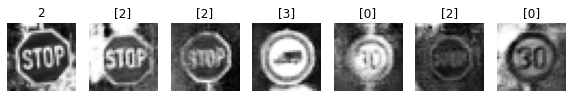

Epoch 63210 g_loss= 1.1781772 d_loss= 1.0456324 real_acc= 0.74 fake_acc= 0.8
Epoch 63220 g_loss= 0.9937961 d_loss= 1.2488497 real_acc= 0.62 fake_acc= 0.68
Epoch 63230 g_loss= 1.2078431 d_loss= 1.1505957 real_acc= 0.6 fake_acc= 0.84
Epoch 63240 g_loss= 0.9089554 d_loss= 1.2527356 real_acc= 0.76 fake_acc= 0.62
Epoch 63250 g_loss= 1.0104256 d_loss= 1.1150317 real_acc= 0.74 fake_acc= 0.7
Epoch 63260 g_loss= 1.0875669 d_loss= 1.0425184 real_acc= 0.76 fake_acc= 0.7
Epoch 63270 g_loss= 1.1256068 d_loss= 0.98347884 real_acc= 0.76 fake_acc= 0.76
Epoch 63280 g_loss= 0.9378755 d_loss= 1.1704695 real_acc= 0.7 fake_acc= 0.68
Epoch 63290 g_loss= 1.0806384 d_loss= 1.1167226 real_acc= 0.7 fake_acc= 0.74
Epoch 63300 g_loss= 0.9005363 d_loss= 1.1642594 real_acc= 0.68 fake_acc= 0.6


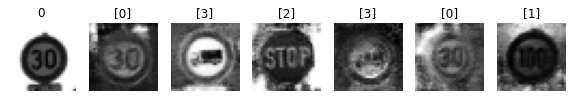

Epoch 63310 g_loss= 1.0122192 d_loss= 1.0911101 real_acc= 0.8 fake_acc= 0.66
Epoch 63320 g_loss= 1.0305423 d_loss= 1.1456101 real_acc= 0.74 fake_acc= 0.66
Epoch 63330 g_loss= 1.0028749 d_loss= 1.0826935 real_acc= 0.86 fake_acc= 0.62
Epoch 63340 g_loss= 1.1268333 d_loss= 1.0987214 real_acc= 0.7 fake_acc= 0.7
Epoch 63350 g_loss= 1.0720056 d_loss= 1.1322492 real_acc= 0.74 fake_acc= 0.6
Epoch 63360 g_loss= 1.0415771 d_loss= 1.2960006 real_acc= 0.58 fake_acc= 0.68
Epoch 63370 g_loss= 0.9224942 d_loss= 1.231313 real_acc= 0.76 fake_acc= 0.52
Epoch 63380 g_loss= 0.9582378 d_loss= 1.2057788 real_acc= 0.76 fake_acc= 0.6
Epoch 63390 g_loss= 1.0463016 d_loss= 1.1631579 real_acc= 0.58 fake_acc= 0.74
Epoch 63400 g_loss= 0.9309279 d_loss= 1.2602032 real_acc= 0.72 fake_acc= 0.56


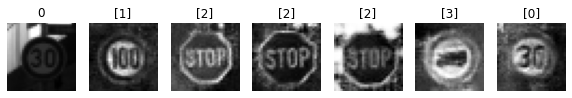

Epoch 63410 g_loss= 1.0139068 d_loss= 1.1444834 real_acc= 0.66 fake_acc= 0.68
Epoch 63420 g_loss= 1.2670182 d_loss= 1.0547627 real_acc= 0.7 fake_acc= 0.88
Epoch 63430 g_loss= 0.9925287 d_loss= 1.0824382 real_acc= 0.86 fake_acc= 0.6
Epoch 63440 g_loss= 0.9320031 d_loss= 1.255712 real_acc= 0.66 fake_acc= 0.58
Epoch 63450 g_loss= 0.93747365 d_loss= 1.2307384 real_acc= 0.68 fake_acc= 0.7
Epoch 63460 g_loss= 1.0945383 d_loss= 1.1002545 real_acc= 0.76 fake_acc= 0.7
Epoch 63470 g_loss= 0.99514437 d_loss= 1.2240031 real_acc= 0.6 fake_acc= 0.7
Epoch 63480 g_loss= 1.041529 d_loss= 1.1766404 real_acc= 0.62 fake_acc= 0.7
Epoch 63490 g_loss= 1.0989553 d_loss= 1.1775122 real_acc= 0.62 fake_acc= 0.66
Epoch 63500 g_loss= 1.043249 d_loss= 1.1524514 real_acc= 0.72 fake_acc= 0.7


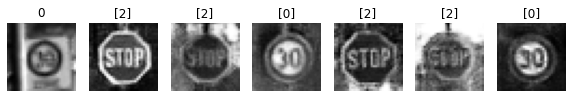

Epoch 63510 g_loss= 1.0495744 d_loss= 1.2234414 real_acc= 0.54 fake_acc= 0.66
Epoch 63520 g_loss= 0.93704194 d_loss= 1.2642953 real_acc= 0.68 fake_acc= 0.52
Epoch 63530 g_loss= 0.91084135 d_loss= 1.1951482 real_acc= 0.78 fake_acc= 0.52
Epoch 63540 g_loss= 0.98050356 d_loss= 1.1440444 real_acc= 0.84 fake_acc= 0.7
Epoch 63550 g_loss= 1.1070621 d_loss= 1.094993 real_acc= 0.7 fake_acc= 0.64
Epoch 63560 g_loss= 0.9910389 d_loss= 1.1731818 real_acc= 0.68 fake_acc= 0.54
Epoch 63570 g_loss= 0.9336493 d_loss= 1.1728721 real_acc= 0.68 fake_acc= 0.64
Epoch 63580 g_loss= 1.0330961 d_loss= 1.1167266 real_acc= 0.78 fake_acc= 0.64
Epoch 63590 g_loss= 0.8458709 d_loss= 1.3520522 real_acc= 0.68 fake_acc= 0.48
Epoch 63600 g_loss= 1.1425822 d_loss= 1.1460468 real_acc= 0.68 fake_acc= 0.68


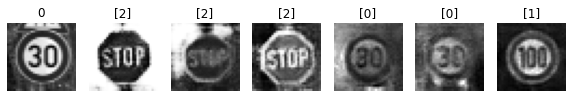

Epoch 63610 g_loss= 1.1157963 d_loss= 1.2063895 real_acc= 0.6 fake_acc= 0.74
Epoch 63620 g_loss= 0.9704798 d_loss= 1.1885624 real_acc= 0.7 fake_acc= 0.7
Epoch 63630 g_loss= 0.98747426 d_loss= 1.1325777 real_acc= 0.72 fake_acc= 0.66
Epoch 63640 g_loss= 1.0390934 d_loss= 1.2759008 real_acc= 0.6 fake_acc= 0.66
Epoch 63650 g_loss= 0.9473225 d_loss= 1.2330353 real_acc= 0.7 fake_acc= 0.68
Epoch 63660 g_loss= 0.9964418 d_loss= 1.3215569 real_acc= 0.64 fake_acc= 0.64
Epoch 63670 g_loss= 1.0138339 d_loss= 1.071123 real_acc= 0.76 fake_acc= 0.68
Epoch 63680 g_loss= 0.98270094 d_loss= 1.0319653 real_acc= 0.86 fake_acc= 0.62
Epoch 63690 g_loss= 1.0344474 d_loss= 1.0175366 real_acc= 0.76 fake_acc= 0.76
Epoch 63700 g_loss= 0.97607493 d_loss= 1.1247027 real_acc= 0.8 fake_acc= 0.62


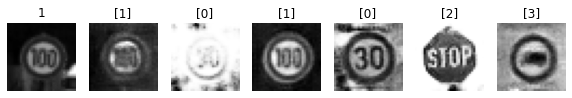

Epoch 63710 g_loss= 1.1266373 d_loss= 1.2364647 real_acc= 0.54 fake_acc= 0.68
Epoch 63720 g_loss= 0.9871474 d_loss= 1.213787 real_acc= 0.66 fake_acc= 0.62
Epoch 63730 g_loss= 0.9916194 d_loss= 1.1749253 real_acc= 0.76 fake_acc= 0.58
Epoch 63740 g_loss= 1.0480288 d_loss= 1.260473 real_acc= 0.6 fake_acc= 0.62
Epoch 63750 g_loss= 0.984493 d_loss= 1.1428521 real_acc= 0.74 fake_acc= 0.68
Epoch 63760 g_loss= 0.83377016 d_loss= 1.1845987 real_acc= 0.8 fake_acc= 0.6
Epoch 63770 g_loss= 1.1404694 d_loss= 1.132278 real_acc= 0.78 fake_acc= 0.66
Epoch 63780 g_loss= 1.0742644 d_loss= 1.1124582 real_acc= 0.7 fake_acc= 0.74
Epoch 63790 g_loss= 0.8245038 d_loss= 1.2957156 real_acc= 0.66 fake_acc= 0.5
Epoch 63800 g_loss= 0.96568835 d_loss= 1.1775677 real_acc= 0.76 fake_acc= 0.7


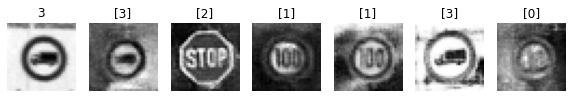

Epoch 63810 g_loss= 0.937027 d_loss= 1.2484303 real_acc= 0.72 fake_acc= 0.6
Epoch 63820 g_loss= 1.0334289 d_loss= 1.1902764 real_acc= 0.68 fake_acc= 0.74
Epoch 63830 g_loss= 1.1389219 d_loss= 1.1561 real_acc= 0.66 fake_acc= 0.66
Epoch 63840 g_loss= 1.2046279 d_loss= 1.144204 real_acc= 0.68 fake_acc= 0.78
Epoch 63850 g_loss= 1.1265246 d_loss= 1.0620236 real_acc= 0.78 fake_acc= 0.68
Epoch 63860 g_loss= 1.044806 d_loss= 1.2089906 real_acc= 0.64 fake_acc= 0.7
Epoch 63870 g_loss= 1.1003361 d_loss= 1.207233 real_acc= 0.62 fake_acc= 0.72
Epoch 63880 g_loss= 0.8604379 d_loss= 1.1751394 real_acc= 0.76 fake_acc= 0.56
Epoch 63890 g_loss= 0.9578909 d_loss= 1.1335272 real_acc= 0.84 fake_acc= 0.66
Epoch 63900 g_loss= 1.0644462 d_loss= 1.0758698 real_acc= 0.82 fake_acc= 0.76


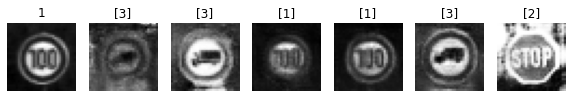

Epoch 63910 g_loss= 0.97465384 d_loss= 1.0946697 real_acc= 0.78 fake_acc= 0.74
Epoch 63920 g_loss= 1.0995997 d_loss= 1.2199469 real_acc= 0.64 fake_acc= 0.7
Epoch 63930 g_loss= 1.2321346 d_loss= 1.2209094 real_acc= 0.48 fake_acc= 0.78
Epoch 63940 g_loss= 1.0011485 d_loss= 1.1781812 real_acc= 0.7 fake_acc= 0.58
Epoch 63950 g_loss= 1.1507123 d_loss= 1.053633 real_acc= 0.7 fake_acc= 0.8
Epoch 63960 g_loss= 1.0123162 d_loss= 1.1700613 real_acc= 0.72 fake_acc= 0.58
Epoch 63970 g_loss= 1.0294055 d_loss= 1.0752378 real_acc= 0.8 fake_acc= 0.66
Epoch 63980 g_loss= 1.1159506 d_loss= 1.1474597 real_acc= 0.7 fake_acc= 0.7
Epoch 63990 g_loss= 1.0856284 d_loss= 1.0854114 real_acc= 0.7 fake_acc= 0.74
Epoch 64000 g_loss= 0.96591955 d_loss= 1.1434956 real_acc= 0.72 fake_acc= 0.62


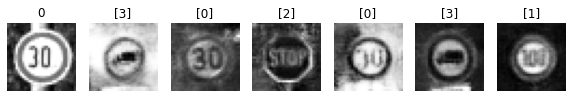

Epoch 64010 g_loss= 0.96656847 d_loss= 1.3164068 real_acc= 0.52 fake_acc= 0.6
Epoch 64020 g_loss= 1.0956807 d_loss= 0.98420393 real_acc= 0.84 fake_acc= 0.72
Epoch 64030 g_loss= 1.0362035 d_loss= 1.1007445 real_acc= 0.7 fake_acc= 0.74
Epoch 64040 g_loss= 1.0840255 d_loss= 1.0996144 real_acc= 0.54 fake_acc= 0.76
Epoch 64050 g_loss= 0.9779464 d_loss= 1.2163627 real_acc= 0.72 fake_acc= 0.52
Epoch 64060 g_loss= 0.8305357 d_loss= 1.2549255 real_acc= 0.7 fake_acc= 0.48
Epoch 64070 g_loss= 0.9258964 d_loss= 1.1889644 real_acc= 0.72 fake_acc= 0.62
Epoch 64080 g_loss= 0.969653 d_loss= 1.323592 real_acc= 0.58 fake_acc= 0.6
Epoch 64090 g_loss= 1.0674012 d_loss= 1.2891763 real_acc= 0.6 fake_acc= 0.66
Epoch 64100 g_loss= 1.132856 d_loss= 1.097762 real_acc= 0.68 fake_acc= 0.82


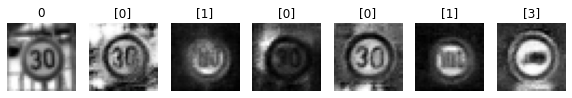

Epoch 64110 g_loss= 1.2179899 d_loss= 0.9338001 real_acc= 0.82 fake_acc= 0.78
Epoch 64120 g_loss= 1.1403633 d_loss= 1.2392116 real_acc= 0.68 fake_acc= 0.7
Epoch 64130 g_loss= 0.9958507 d_loss= 1.1167071 real_acc= 0.72 fake_acc= 0.66
Epoch 64140 g_loss= 1.0867707 d_loss= 1.2579944 real_acc= 0.66 fake_acc= 0.68
Epoch 64150 g_loss= 1.1343263 d_loss= 1.1762159 real_acc= 0.6 fake_acc= 0.68
Epoch 64160 g_loss= 1.1093762 d_loss= 1.1316798 real_acc= 0.74 fake_acc= 0.6
Epoch 64170 g_loss= 0.9926344 d_loss= 1.1662964 real_acc= 0.8 fake_acc= 0.58
Epoch 64180 g_loss= 1.0937563 d_loss= 1.0873151 real_acc= 0.72 fake_acc= 0.68
Epoch 64190 g_loss= 0.9649252 d_loss= 1.0895319 real_acc= 0.84 fake_acc= 0.62
Epoch 64200 g_loss= 0.9537288 d_loss= 1.2588139 real_acc= 0.66 fake_acc= 0.6


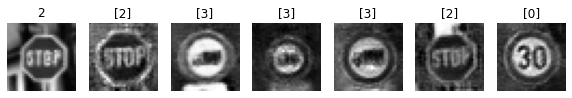

Epoch 64210 g_loss= 1.0630941 d_loss= 1.2060661 real_acc= 0.58 fake_acc= 0.72
Epoch 64220 g_loss= 1.1454167 d_loss= 1.0483422 real_acc= 0.66 fake_acc= 0.7
Epoch 64230 g_loss= 1.074141 d_loss= 1.0640624 real_acc= 0.86 fake_acc= 0.62
Epoch 64240 g_loss= 0.96042234 d_loss= 1.1524247 real_acc= 0.68 fake_acc= 0.66
Epoch 64250 g_loss= 0.96908975 d_loss= 1.1430886 real_acc= 0.74 fake_acc= 0.68
Epoch 64260 g_loss= 1.091593 d_loss= 1.1757538 real_acc= 0.64 fake_acc= 0.58
Epoch 64270 g_loss= 1.2388662 d_loss= 1.2017231 real_acc= 0.6 fake_acc= 0.76
Epoch 64280 g_loss= 1.2135665 d_loss= 1.1675396 real_acc= 0.7 fake_acc= 0.7
Epoch 64290 g_loss= 1.0746673 d_loss= 1.0870719 real_acc= 0.68 fake_acc= 0.7
Epoch 64300 g_loss= 0.99496734 d_loss= 1.1202538 real_acc= 0.76 fake_acc= 0.68


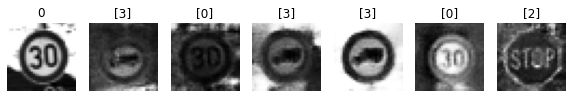

Epoch 64310 g_loss= 0.97867936 d_loss= 1.2196527 real_acc= 0.72 fake_acc= 0.62
Epoch 64320 g_loss= 1.1028082 d_loss= 1.1585168 real_acc= 0.72 fake_acc= 0.74
Epoch 64330 g_loss= 0.8644777 d_loss= 1.1912091 real_acc= 0.8 fake_acc= 0.54
Epoch 64340 g_loss= 1.031982 d_loss= 1.1443565 real_acc= 0.72 fake_acc= 0.58
Epoch 64350 g_loss= 1.0694312 d_loss= 1.2003925 real_acc= 0.62 fake_acc= 0.66
Epoch 64360 g_loss= 0.8137962 d_loss= 1.2596023 real_acc= 0.76 fake_acc= 0.5
Epoch 64370 g_loss= 1.1483951 d_loss= 1.1643217 real_acc= 0.58 fake_acc= 0.72
Epoch 64380 g_loss= 0.8602129 d_loss= 1.2873839 real_acc= 0.62 fake_acc= 0.58
Epoch 64390 g_loss= 1.0580053 d_loss= 1.1525366 real_acc= 0.58 fake_acc= 0.72
Epoch 64400 g_loss= 1.1233993 d_loss= 1.100146 real_acc= 0.64 fake_acc= 0.8


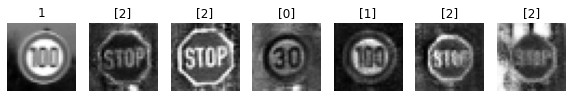

Epoch 64410 g_loss= 1.2126137 d_loss= 1.0789622 real_acc= 0.68 fake_acc= 0.78
Epoch 64420 g_loss= 0.8765717 d_loss= 1.20947 real_acc= 0.72 fake_acc= 0.66
Epoch 64430 g_loss= 0.9876968 d_loss= 1.1603792 real_acc= 0.66 fake_acc= 0.7
Epoch 64440 g_loss= 1.1035602 d_loss= 1.261831 real_acc= 0.52 fake_acc= 0.72
Epoch 64450 g_loss= 0.88627183 d_loss= 1.2396388 real_acc= 0.7 fake_acc= 0.48
Epoch 64460 g_loss= 1.2345288 d_loss= 1.0606923 real_acc= 0.66 fake_acc= 0.9
Epoch 64470 g_loss= 0.97128516 d_loss= 1.1611278 real_acc= 0.72 fake_acc= 0.62
Epoch 64480 g_loss= 0.88736284 d_loss= 1.2456504 real_acc= 0.72 fake_acc= 0.58
Epoch 64490 g_loss= 1.2335081 d_loss= 1.0815982 real_acc= 0.64 fake_acc= 0.8
Epoch 64500 g_loss= 1.0220951 d_loss= 1.3342507 real_acc= 0.58 fake_acc= 0.64


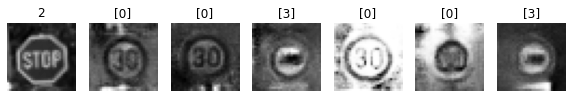

Epoch 64510 g_loss= 0.95910233 d_loss= 1.1498082 real_acc= 0.82 fake_acc= 0.6
Epoch 64520 g_loss= 1.0008107 d_loss= 1.2056093 real_acc= 0.78 fake_acc= 0.56
Epoch 64530 g_loss= 0.9827518 d_loss= 1.282686 real_acc= 0.58 fake_acc= 0.62
Epoch 64540 g_loss= 1.0984626 d_loss= 1.1333342 real_acc= 0.68 fake_acc= 0.66
Epoch 64550 g_loss= 1.0230218 d_loss= 1.1815033 real_acc= 0.58 fake_acc= 0.74
Epoch 64560 g_loss= 1.1851503 d_loss= 1.1397343 real_acc= 0.7 fake_acc= 0.62
Epoch 64570 g_loss= 1.1425246 d_loss= 1.1423262 real_acc= 0.6 fake_acc= 0.78
Epoch 64580 g_loss= 0.9937919 d_loss= 1.224662 real_acc= 0.66 fake_acc= 0.66
Epoch 64590 g_loss= 1.0264996 d_loss= 1.165273 real_acc= 0.64 fake_acc= 0.68
Epoch 64600 g_loss= 1.0080044 d_loss= 1.1841562 real_acc= 0.72 fake_acc= 0.64


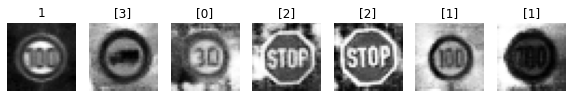

Epoch 64610 g_loss= 0.9663482 d_loss= 1.267867 real_acc= 0.66 fake_acc= 0.56
Epoch 64620 g_loss= 0.9875737 d_loss= 1.140841 real_acc= 0.76 fake_acc= 0.58
Epoch 64630 g_loss= 0.98761153 d_loss= 1.175132 real_acc= 0.6 fake_acc= 0.76
Epoch 64640 g_loss= 0.93988806 d_loss= 1.3449914 real_acc= 0.68 fake_acc= 0.54
Epoch 64650 g_loss= 0.99862885 d_loss= 1.1760113 real_acc= 0.72 fake_acc= 0.64
Epoch 64660 g_loss= 0.8960485 d_loss= 1.3003795 real_acc= 0.58 fake_acc= 0.66
Epoch 64670 g_loss= 1.061326 d_loss= 1.243866 real_acc= 0.6 fake_acc= 0.66
Epoch 64680 g_loss= 1.155565 d_loss= 1.060697 real_acc= 0.68 fake_acc= 0.72
Epoch 64690 g_loss= 1.1193833 d_loss= 1.1570668 real_acc= 0.62 fake_acc= 0.68
Epoch 64700 g_loss= 0.93826747 d_loss= 1.2878759 real_acc= 0.6 fake_acc= 0.6


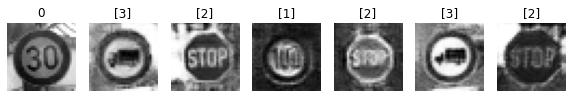

Epoch 64710 g_loss= 0.9129352 d_loss= 1.2325001 real_acc= 0.72 fake_acc= 0.58
Epoch 64720 g_loss= 1.074328 d_loss= 1.1176112 real_acc= 0.76 fake_acc= 0.72
Epoch 64730 g_loss= 1.043579 d_loss= 1.2256486 real_acc= 0.68 fake_acc= 0.7
Epoch 64740 g_loss= 0.949235 d_loss= 1.1653419 real_acc= 0.7 fake_acc= 0.64
Epoch 64750 g_loss= 1.1597027 d_loss= 1.0785197 real_acc= 0.66 fake_acc= 0.76
Epoch 64760 g_loss= 0.96877855 d_loss= 1.1144083 real_acc= 0.78 fake_acc= 0.64
Epoch 64770 g_loss= 0.93796617 d_loss= 1.2657275 real_acc= 0.64 fake_acc= 0.62
Epoch 64780 g_loss= 1.0560138 d_loss= 1.1447889 real_acc= 0.66 fake_acc= 0.74
Epoch 64790 g_loss= 1.1750287 d_loss= 1.2750384 real_acc= 0.7 fake_acc= 0.66
Epoch 64800 g_loss= 1.0093621 d_loss= 1.1244572 real_acc= 0.7 fake_acc= 0.64


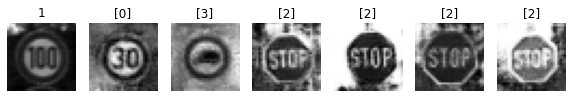

Epoch 64810 g_loss= 1.0429893 d_loss= 1.0651443 real_acc= 0.68 fake_acc= 0.78
Epoch 64820 g_loss= 1.035992 d_loss= 1.1642692 real_acc= 0.74 fake_acc= 0.64
Epoch 64830 g_loss= 0.92175585 d_loss= 1.2460564 real_acc= 0.74 fake_acc= 0.48
Epoch 64840 g_loss= 0.9087282 d_loss= 1.1266592 real_acc= 0.82 fake_acc= 0.66
Epoch 64850 g_loss= 1.0097593 d_loss= 1.2001493 real_acc= 0.62 fake_acc= 0.72
Epoch 64860 g_loss= 0.8708897 d_loss= 1.2631652 real_acc= 0.68 fake_acc= 0.62
Epoch 64870 g_loss= 0.99661696 d_loss= 1.1711335 real_acc= 0.7 fake_acc= 0.68
Epoch 64880 g_loss= 0.94792753 d_loss= 1.1630933 real_acc= 0.66 fake_acc= 0.58
Epoch 64890 g_loss= 1.2242577 d_loss= 1.0878521 real_acc= 0.62 fake_acc= 0.78
Epoch 64900 g_loss= 0.91832626 d_loss= 1.2737042 real_acc= 0.72 fake_acc= 0.64


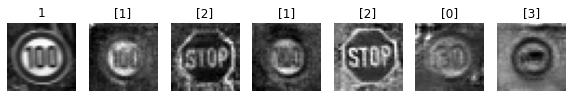

Epoch 64910 g_loss= 1.0615052 d_loss= 1.1332102 real_acc= 0.68 fake_acc= 0.74
Epoch 64920 g_loss= 1.0918286 d_loss= 1.3106928 real_acc= 0.56 fake_acc= 0.68
Epoch 64930 g_loss= 0.8936454 d_loss= 1.2552371 real_acc= 0.6 fake_acc= 0.6
Epoch 64940 g_loss= 0.93561876 d_loss= 1.2029994 real_acc= 0.76 fake_acc= 0.52
Epoch 64950 g_loss= 0.96383864 d_loss= 1.254889 real_acc= 0.64 fake_acc= 0.62
Epoch 64960 g_loss= 1.0051408 d_loss= 1.1441925 real_acc= 0.8 fake_acc= 0.64
Epoch 64970 g_loss= 1.0905745 d_loss= 1.0952047 real_acc= 0.7 fake_acc= 0.76
Epoch 64980 g_loss= 1.0620247 d_loss= 1.1669093 real_acc= 0.58 fake_acc= 0.6
Epoch 64990 g_loss= 1.04964 d_loss= 1.144903 real_acc= 0.64 fake_acc= 0.8
Epoch 65000 g_loss= 1.1536137 d_loss= 1.1132293 real_acc= 0.58 fake_acc= 0.8


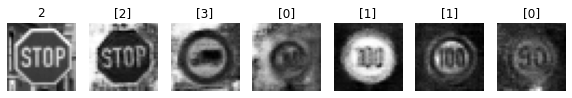

Epoch 65010 g_loss= 1.0660855 d_loss= 1.1696303 real_acc= 0.68 fake_acc= 0.74
Epoch 65020 g_loss= 0.9052214 d_loss= 1.2132865 real_acc= 0.82 fake_acc= 0.56
Epoch 65030 g_loss= 1.1164787 d_loss= 1.0105898 real_acc= 0.74 fake_acc= 0.68
Epoch 65040 g_loss= 1.0639759 d_loss= 1.1481278 real_acc= 0.68 fake_acc= 0.7
Epoch 65050 g_loss= 1.1278834 d_loss= 1.1984811 real_acc= 0.6 fake_acc= 0.68
Epoch 65060 g_loss= 0.9362547 d_loss= 1.1758323 real_acc= 0.7 fake_acc= 0.6
Epoch 65070 g_loss= 1.1122922 d_loss= 1.0548704 real_acc= 0.8 fake_acc= 0.7
Epoch 65080 g_loss= 0.97492063 d_loss= 1.2110252 real_acc= 0.76 fake_acc= 0.68
Epoch 65090 g_loss= 0.985 d_loss= 1.1038008 real_acc= 0.76 fake_acc= 0.68
Epoch 65100 g_loss= 0.95269096 d_loss= 1.2292297 real_acc= 0.68 fake_acc= 0.64


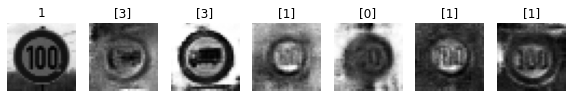

Epoch 65110 g_loss= 0.85633254 d_loss= 1.2585423 real_acc= 0.82 fake_acc= 0.48
Epoch 65120 g_loss= 1.1036409 d_loss= 1.1138895 real_acc= 0.74 fake_acc= 0.76
Epoch 65130 g_loss= 1.0343559 d_loss= 1.1079407 real_acc= 0.72 fake_acc= 0.74
Epoch 65140 g_loss= 1.0104687 d_loss= 1.209938 real_acc= 0.66 fake_acc= 0.66
Epoch 65150 g_loss= 1.0694189 d_loss= 1.2053843 real_acc= 0.6 fake_acc= 0.7
Epoch 65160 g_loss= 0.9293692 d_loss= 1.131974 real_acc= 0.72 fake_acc= 0.6
Epoch 65170 g_loss= 1.1297272 d_loss= 1.1121428 real_acc= 0.72 fake_acc= 0.74
Epoch 65180 g_loss= 1.0694407 d_loss= 1.124968 real_acc= 0.68 fake_acc= 0.62
Epoch 65190 g_loss= 0.9311474 d_loss= 1.225641 real_acc= 0.72 fake_acc= 0.72
Epoch 65200 g_loss= 0.98935544 d_loss= 1.2647376 real_acc= 0.7 fake_acc= 0.6


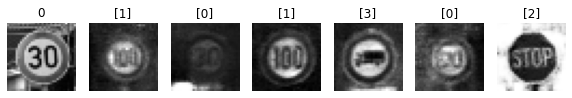

Epoch 65210 g_loss= 0.9430115 d_loss= 1.2542484 real_acc= 0.72 fake_acc= 0.6
Epoch 65220 g_loss= 0.9003129 d_loss= 1.2275764 real_acc= 0.74 fake_acc= 0.7
Epoch 65230 g_loss= 1.1335844 d_loss= 1.1137195 real_acc= 0.76 fake_acc= 0.72
Epoch 65240 g_loss= 1.0533152 d_loss= 1.0778929 real_acc= 0.74 fake_acc= 0.74
Epoch 65250 g_loss= 0.8568938 d_loss= 1.3506742 real_acc= 0.74 fake_acc= 0.56
Epoch 65260 g_loss= 1.0083503 d_loss= 1.1113234 real_acc= 0.7 fake_acc= 0.68
Epoch 65270 g_loss= 0.93372023 d_loss= 1.2935355 real_acc= 0.66 fake_acc= 0.58
Epoch 65280 g_loss= 0.97110677 d_loss= 1.1261365 real_acc= 0.8 fake_acc= 0.66
Epoch 65290 g_loss= 1.2154326 d_loss= 1.004318 real_acc= 0.74 fake_acc= 0.78
Epoch 65300 g_loss= 0.9775887 d_loss= 1.2893178 real_acc= 0.66 fake_acc= 0.6


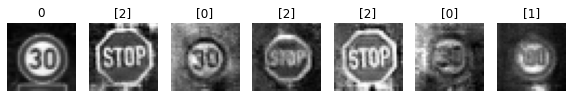

Epoch 65310 g_loss= 1.1544112 d_loss= 1.0531518 real_acc= 0.76 fake_acc= 0.76
Epoch 65320 g_loss= 1.0731148 d_loss= 1.1413608 real_acc= 0.72 fake_acc= 0.72
Epoch 65330 g_loss= 0.9683143 d_loss= 1.2123218 real_acc= 0.7 fake_acc= 0.62
Epoch 65340 g_loss= 1.157329 d_loss= 1.0948055 real_acc= 0.64 fake_acc= 0.76
Epoch 65350 g_loss= 0.9446508 d_loss= 1.2106694 real_acc= 0.66 fake_acc= 0.64
Epoch 65360 g_loss= 0.83704585 d_loss= 1.2927191 real_acc= 0.74 fake_acc= 0.52
Epoch 65370 g_loss= 1.124447 d_loss= 1.1239765 real_acc= 0.76 fake_acc= 0.72
Epoch 65380 g_loss= 1.1129472 d_loss= 1.2483101 real_acc= 0.58 fake_acc= 0.7
Epoch 65390 g_loss= 0.99162245 d_loss= 1.2248238 real_acc= 0.58 fake_acc= 0.6
Epoch 65400 g_loss= 0.87125266 d_loss= 1.2576218 real_acc= 0.74 fake_acc= 0.58


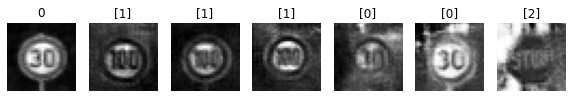

Epoch 65410 g_loss= 1.0464578 d_loss= 1.1606231 real_acc= 0.72 fake_acc= 0.7
Epoch 65420 g_loss= 0.90399015 d_loss= 1.2986972 real_acc= 0.66 fake_acc= 0.6
Epoch 65430 g_loss= 1.1482742 d_loss= 1.0424739 real_acc= 0.76 fake_acc= 0.8
Epoch 65440 g_loss= 1.0710753 d_loss= 1.0719951 real_acc= 0.68 fake_acc= 0.74
Epoch 65450 g_loss= 1.1395487 d_loss= 1.0461212 real_acc= 0.74 fake_acc= 0.74
Epoch 65460 g_loss= 0.9838147 d_loss= 1.1662897 real_acc= 0.76 fake_acc= 0.66
Epoch 65470 g_loss= 1.1537361 d_loss= 0.97551334 real_acc= 0.76 fake_acc= 0.68
Epoch 65480 g_loss= 1.2750921 d_loss= 1.1460197 real_acc= 0.64 fake_acc= 0.76
Epoch 65490 g_loss= 1.0467004 d_loss= 1.1416787 real_acc= 0.72 fake_acc= 0.58
Epoch 65500 g_loss= 0.8747802 d_loss= 1.1512735 real_acc= 0.78 fake_acc= 0.58


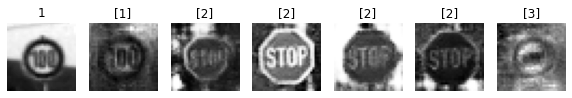

Epoch 65510 g_loss= 1.1639055 d_loss= 1.1118386 real_acc= 0.64 fake_acc= 0.82
Epoch 65520 g_loss= 1.0516999 d_loss= 1.0761031 real_acc= 0.78 fake_acc= 0.68
Epoch 65530 g_loss= 0.9052899 d_loss= 1.1008694 real_acc= 0.78 fake_acc= 0.62
Epoch 65540 g_loss= 0.92463565 d_loss= 1.1593055 real_acc= 0.84 fake_acc= 0.58
Epoch 65550 g_loss= 1.1625556 d_loss= 1.1017958 real_acc= 0.78 fake_acc= 0.68
Epoch 65560 g_loss= 1.137361 d_loss= 1.2018361 real_acc= 0.54 fake_acc= 0.74
Epoch 65570 g_loss= 1.0321637 d_loss= 1.074255 real_acc= 0.76 fake_acc= 0.68
Epoch 65580 g_loss= 0.97241485 d_loss= 1.118139 real_acc= 0.72 fake_acc= 0.66
Epoch 65590 g_loss= 0.96656555 d_loss= 1.1448379 real_acc= 0.74 fake_acc= 0.66
Epoch 65600 g_loss= 1.059574 d_loss= 1.1318607 real_acc= 0.74 fake_acc= 0.64


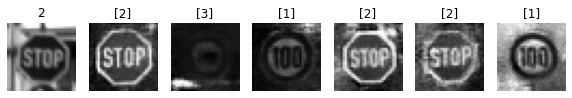

Epoch 65610 g_loss= 1.0494727 d_loss= 1.2301345 real_acc= 0.7 fake_acc= 0.66
Epoch 65620 g_loss= 1.0349277 d_loss= 1.1246715 real_acc= 0.78 fake_acc= 0.64
Epoch 65630 g_loss= 1.0729644 d_loss= 1.1483569 real_acc= 0.62 fake_acc= 0.72
Epoch 65640 g_loss= 1.17525 d_loss= 1.0976107 real_acc= 0.76 fake_acc= 0.68
Epoch 65650 g_loss= 0.87189865 d_loss= 1.1744689 real_acc= 0.82 fake_acc= 0.5
Epoch 65660 g_loss= 1.1001694 d_loss= 1.1804047 real_acc= 0.64 fake_acc= 0.78
Epoch 65670 g_loss= 1.238721 d_loss= 1.1757628 real_acc= 0.6 fake_acc= 0.74
Epoch 65680 g_loss= 0.87748533 d_loss= 1.4074539 real_acc= 0.58 fake_acc= 0.56
Epoch 65690 g_loss= 1.0403526 d_loss= 1.1036832 real_acc= 0.76 fake_acc= 0.66
Epoch 65700 g_loss= 1.0305995 d_loss= 1.1336956 real_acc= 0.72 fake_acc= 0.74


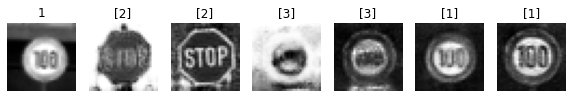

Epoch 65710 g_loss= 1.0516807 d_loss= 1.1620042 real_acc= 0.72 fake_acc= 0.8
Epoch 65720 g_loss= 1.1075568 d_loss= 1.1726849 real_acc= 0.74 fake_acc= 0.64
Epoch 65730 g_loss= 0.7657166 d_loss= 1.2752434 real_acc= 0.84 fake_acc= 0.5
Epoch 65740 g_loss= 1.100245 d_loss= 1.1937895 real_acc= 0.58 fake_acc= 0.8
Epoch 65750 g_loss= 1.2033278 d_loss= 1.1280919 real_acc= 0.64 fake_acc= 0.84
Epoch 65760 g_loss= 0.9754811 d_loss= 1.1891097 real_acc= 0.7 fake_acc= 0.58
Epoch 65770 g_loss= 0.94576234 d_loss= 1.2490902 real_acc= 0.58 fake_acc= 0.76
Epoch 65780 g_loss= 1.1742557 d_loss= 1.0836523 real_acc= 0.56 fake_acc= 0.9
Epoch 65790 g_loss= 0.79980123 d_loss= 1.2543087 real_acc= 0.74 fake_acc= 0.62
Epoch 65800 g_loss= 1.0159332 d_loss= 1.1452191 real_acc= 0.66 fake_acc= 0.68


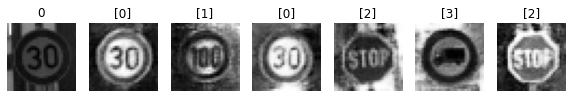

Epoch 65810 g_loss= 0.9531234 d_loss= 1.246983 real_acc= 0.66 fake_acc= 0.64
Epoch 65820 g_loss= 0.98255754 d_loss= 1.202525 real_acc= 0.66 fake_acc= 0.7
Epoch 65830 g_loss= 1.1207435 d_loss= 1.1381642 real_acc= 0.62 fake_acc= 0.76
Epoch 65840 g_loss= 1.07709 d_loss= 1.2450819 real_acc= 0.66 fake_acc= 0.6
Epoch 65850 g_loss= 1.085772 d_loss= 1.1517195 real_acc= 0.68 fake_acc= 0.72
Epoch 65860 g_loss= 1.1745205 d_loss= 1.1782272 real_acc= 0.58 fake_acc= 0.78
Epoch 65870 g_loss= 0.9383935 d_loss= 1.2169057 real_acc= 0.66 fake_acc= 0.6
Epoch 65880 g_loss= 0.8798314 d_loss= 1.2223035 real_acc= 0.78 fake_acc= 0.52
Epoch 65890 g_loss= 1.1222548 d_loss= 1.3270106 real_acc= 0.52 fake_acc= 0.68
Epoch 65900 g_loss= 0.99934226 d_loss= 1.144239 real_acc= 0.74 fake_acc= 0.58


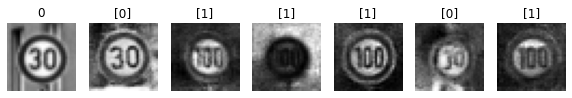

Epoch 65910 g_loss= 1.0826036 d_loss= 1.1166918 real_acc= 0.72 fake_acc= 0.76
Epoch 65920 g_loss= 0.93112534 d_loss= 1.1520863 real_acc= 0.74 fake_acc= 0.6
Epoch 65930 g_loss= 1.1643589 d_loss= 1.1080828 real_acc= 0.7 fake_acc= 0.68
Epoch 65940 g_loss= 1.0368407 d_loss= 1.1607169 real_acc= 0.7 fake_acc= 0.72
Epoch 65950 g_loss= 1.0372609 d_loss= 1.1718438 real_acc= 0.74 fake_acc= 0.64
Epoch 65960 g_loss= 0.9663069 d_loss= 1.1560267 real_acc= 0.66 fake_acc= 0.66
Epoch 65970 g_loss= 1.0442786 d_loss= 1.102038 real_acc= 0.7 fake_acc= 0.72
Epoch 65980 g_loss= 1.0886964 d_loss= 1.0546744 real_acc= 0.72 fake_acc= 0.76
Epoch 65990 g_loss= 1.344556 d_loss= 1.0053778 real_acc= 0.72 fake_acc= 0.78
Epoch 66000 g_loss= 1.0012498 d_loss= 1.0652225 real_acc= 0.8 fake_acc= 0.64


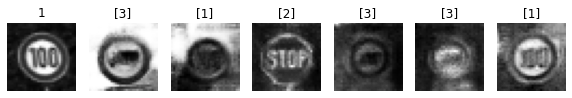

Epoch 66010 g_loss= 1.0701036 d_loss= 1.2307072 real_acc= 0.6 fake_acc= 0.68
Epoch 66020 g_loss= 0.8949094 d_loss= 1.1835787 real_acc= 0.7 fake_acc= 0.64
Epoch 66030 g_loss= 0.9546871 d_loss= 1.226258 real_acc= 0.62 fake_acc= 0.72
Epoch 66040 g_loss= 1.060147 d_loss= 1.1017524 real_acc= 0.76 fake_acc= 0.74
Epoch 66050 g_loss= 1.0113232 d_loss= 1.1627994 real_acc= 0.74 fake_acc= 0.78
Epoch 66060 g_loss= 1.0176008 d_loss= 1.2860985 real_acc= 0.6 fake_acc= 0.7
Epoch 66070 g_loss= 0.9865249 d_loss= 1.1615839 real_acc= 0.66 fake_acc= 0.74
Epoch 66080 g_loss= 0.97966266 d_loss= 1.1634945 real_acc= 0.76 fake_acc= 0.7
Epoch 66090 g_loss= 1.1140122 d_loss= 1.0830109 real_acc= 0.66 fake_acc= 0.7
Epoch 66100 g_loss= 0.9570492 d_loss= 1.1720995 real_acc= 0.62 fake_acc= 0.64


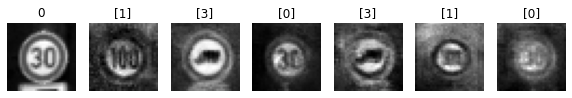

Epoch 66110 g_loss= 0.9532484 d_loss= 1.1848269 real_acc= 0.72 fake_acc= 0.58
Epoch 66120 g_loss= 1.1250262 d_loss= 1.1733458 real_acc= 0.62 fake_acc= 0.68
Epoch 66130 g_loss= 1.1703649 d_loss= 1.1375208 real_acc= 0.76 fake_acc= 0.64
Epoch 66140 g_loss= 1.0137585 d_loss= 1.123215 real_acc= 0.76 fake_acc= 0.66
Epoch 66150 g_loss= 1.0022475 d_loss= 1.2143261 real_acc= 0.74 fake_acc= 0.62
Epoch 66160 g_loss= 1.0982449 d_loss= 1.0741752 real_acc= 0.74 fake_acc= 0.7
Epoch 66170 g_loss= 1.088654 d_loss= 1.2183928 real_acc= 0.72 fake_acc= 0.68
Epoch 66180 g_loss= 1.0233587 d_loss= 1.2214859 real_acc= 0.72 fake_acc= 0.72
Epoch 66190 g_loss= 1.0607827 d_loss= 1.168823 real_acc= 0.7 fake_acc= 0.68
Epoch 66200 g_loss= 1.1357193 d_loss= 1.12721 real_acc= 0.64 fake_acc= 0.7


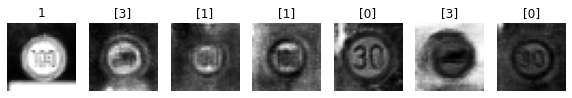

Epoch 66210 g_loss= 1.0530834 d_loss= 1.2291768 real_acc= 0.62 fake_acc= 0.74
Epoch 66220 g_loss= 0.9352455 d_loss= 1.0866816 real_acc= 0.78 fake_acc= 0.56
Epoch 66230 g_loss= 0.96981657 d_loss= 1.1883726 real_acc= 0.76 fake_acc= 0.58
Epoch 66240 g_loss= 0.9937983 d_loss= 1.1674122 real_acc= 0.74 fake_acc= 0.66
Epoch 66250 g_loss= 1.0427188 d_loss= 1.1185755 real_acc= 0.68 fake_acc= 0.76
Epoch 66260 g_loss= 1.0665513 d_loss= 1.0621761 real_acc= 0.8 fake_acc= 0.66
Epoch 66270 g_loss= 1.0722871 d_loss= 1.0569535 real_acc= 0.82 fake_acc= 0.64
Epoch 66280 g_loss= 1.1079527 d_loss= 1.1504462 real_acc= 0.74 fake_acc= 0.58
Epoch 66290 g_loss= 1.0391765 d_loss= 1.1849093 real_acc= 0.68 fake_acc= 0.6
Epoch 66300 g_loss= 0.99447495 d_loss= 1.2682018 real_acc= 0.66 fake_acc= 0.72


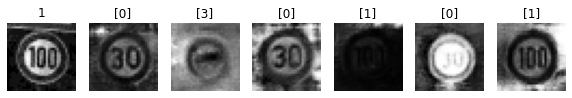

Epoch 66310 g_loss= 1.206957 d_loss= 1.1559937 real_acc= 0.52 fake_acc= 0.82
Epoch 66320 g_loss= 1.1967078 d_loss= 1.2220788 real_acc= 0.64 fake_acc= 0.7
Epoch 66330 g_loss= 1.3294384 d_loss= 1.0463154 real_acc= 0.68 fake_acc= 0.74
Epoch 66340 g_loss= 1.1001976 d_loss= 1.1186345 real_acc= 0.8 fake_acc= 0.7
Epoch 66350 g_loss= 1.0542405 d_loss= 1.1644493 real_acc= 0.66 fake_acc= 0.7
Epoch 66360 g_loss= 1.094547 d_loss= 1.157604 real_acc= 0.7 fake_acc= 0.64
Epoch 66370 g_loss= 0.9925655 d_loss= 1.1468433 real_acc= 0.72 fake_acc= 0.66
Epoch 66380 g_loss= 0.92165965 d_loss= 1.2479993 real_acc= 0.6 fake_acc= 0.64
Epoch 66390 g_loss= 1.0415661 d_loss= 1.1382995 real_acc= 0.72 fake_acc= 0.7
Epoch 66400 g_loss= 0.9513367 d_loss= 1.1406758 real_acc= 0.8 fake_acc= 0.6


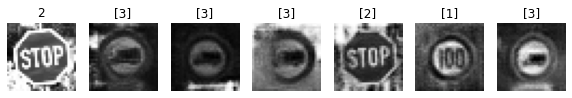

Epoch 66410 g_loss= 1.0572718 d_loss= 1.1468062 real_acc= 0.74 fake_acc= 0.76
Epoch 66420 g_loss= 0.9550877 d_loss= 1.1754478 real_acc= 0.74 fake_acc= 0.58
Epoch 66430 g_loss= 0.82228476 d_loss= 1.2216326 real_acc= 0.76 fake_acc= 0.44
Epoch 66440 g_loss= 1.0479121 d_loss= 1.0938251 real_acc= 0.76 fake_acc= 0.64
Epoch 66450 g_loss= 1.1326283 d_loss= 1.1464949 real_acc= 0.74 fake_acc= 0.72
Epoch 66460 g_loss= 1.0362027 d_loss= 1.1542659 real_acc= 0.66 fake_acc= 0.72
Epoch 66470 g_loss= 0.9336734 d_loss= 1.134514 real_acc= 0.78 fake_acc= 0.64
Epoch 66480 g_loss= 0.9278052 d_loss= 1.0956297 real_acc= 0.82 fake_acc= 0.68
Epoch 66490 g_loss= 1.1584452 d_loss= 1.0554234 real_acc= 0.68 fake_acc= 0.74
Epoch 66500 g_loss= 1.0540614 d_loss= 1.2140157 real_acc= 0.74 fake_acc= 0.58


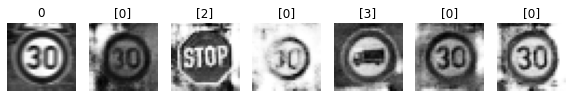

Epoch 66510 g_loss= 1.0657527 d_loss= 1.1044722 real_acc= 0.76 fake_acc= 0.62
Epoch 66520 g_loss= 0.9731048 d_loss= 1.27601 real_acc= 0.68 fake_acc= 0.56
Epoch 66530 g_loss= 1.069993 d_loss= 1.0402851 real_acc= 0.74 fake_acc= 0.6
Epoch 66540 g_loss= 1.0231649 d_loss= 1.0925717 real_acc= 0.68 fake_acc= 0.76
Epoch 66550 g_loss= 0.9858861 d_loss= 1.135448 real_acc= 0.86 fake_acc= 0.54
Epoch 66560 g_loss= 0.9347657 d_loss= 1.113159 real_acc= 0.78 fake_acc= 0.56
Epoch 66570 g_loss= 1.1463398 d_loss= 1.085311 real_acc= 0.68 fake_acc= 0.72
Epoch 66580 g_loss= 1.0021214 d_loss= 1.1770904 real_acc= 0.8 fake_acc= 0.6
Epoch 66590 g_loss= 1.2229427 d_loss= 1.0533563 real_acc= 0.68 fake_acc= 0.82
Epoch 66600 g_loss= 1.1788185 d_loss= 1.1093316 real_acc= 0.66 fake_acc= 0.72


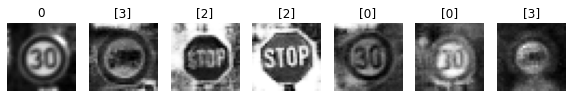

Epoch 66610 g_loss= 1.1815715 d_loss= 1.15694 real_acc= 0.68 fake_acc= 0.7
Epoch 66620 g_loss= 0.89306945 d_loss= 1.2458183 real_acc= 0.68 fake_acc= 0.6
Epoch 66630 g_loss= 0.9430301 d_loss= 1.1123916 real_acc= 0.82 fake_acc= 0.68
Epoch 66640 g_loss= 0.99900365 d_loss= 1.0652549 real_acc= 0.76 fake_acc= 0.72
Epoch 66650 g_loss= 1.0376798 d_loss= 1.2245655 real_acc= 0.64 fake_acc= 0.7
Epoch 66660 g_loss= 1.2220911 d_loss= 1.0523776 real_acc= 0.72 fake_acc= 0.76
Epoch 66670 g_loss= 1.0887104 d_loss= 1.2406645 real_acc= 0.64 fake_acc= 0.72
Epoch 66680 g_loss= 1.0470452 d_loss= 1.3317612 real_acc= 0.6 fake_acc= 0.56
Epoch 66690 g_loss= 1.0069835 d_loss= 1.2527652 real_acc= 0.76 fake_acc= 0.56
Epoch 66700 g_loss= 1.0343262 d_loss= 1.1995037 real_acc= 0.68 fake_acc= 0.72


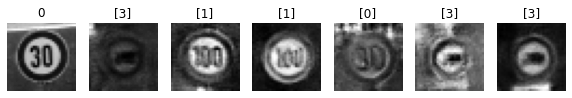

Epoch 66710 g_loss= 0.91426605 d_loss= 1.2697463 real_acc= 0.68 fake_acc= 0.6
Epoch 66720 g_loss= 0.9021641 d_loss= 1.1652008 real_acc= 0.72 fake_acc= 0.66
Epoch 66730 g_loss= 1.0919635 d_loss= 1.1278086 real_acc= 0.66 fake_acc= 0.7
Epoch 66740 g_loss= 1.0488935 d_loss= 1.1943513 real_acc= 0.58 fake_acc= 0.56
Epoch 66750 g_loss= 1.0377994 d_loss= 1.1863937 real_acc= 0.68 fake_acc= 0.66
Epoch 66760 g_loss= 1.0588638 d_loss= 1.0970225 real_acc= 0.64 fake_acc= 0.76
Epoch 66770 g_loss= 1.1151515 d_loss= 1.1296589 real_acc= 0.66 fake_acc= 0.76
Epoch 66780 g_loss= 1.073096 d_loss= 1.2054092 real_acc= 0.66 fake_acc= 0.62
Epoch 66790 g_loss= 0.84010565 d_loss= 1.3222942 real_acc= 0.68 fake_acc= 0.54
Epoch 66800 g_loss= 0.95305276 d_loss= 1.192164 real_acc= 0.66 fake_acc= 0.66


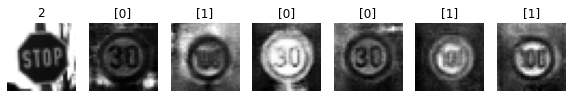

Epoch 66810 g_loss= 0.99856967 d_loss= 1.1132846 real_acc= 0.64 fake_acc= 0.72
Epoch 66820 g_loss= 1.2930319 d_loss= 1.0163746 real_acc= 0.74 fake_acc= 0.74
Epoch 66830 g_loss= 1.0894649 d_loss= 0.97855306 real_acc= 0.84 fake_acc= 0.7
Epoch 66840 g_loss= 1.1375175 d_loss= 1.0241243 real_acc= 0.72 fake_acc= 0.72
Epoch 66850 g_loss= 0.8439585 d_loss= 1.240607 real_acc= 0.7 fake_acc= 0.46
Epoch 66860 g_loss= 0.93289584 d_loss= 1.1098053 real_acc= 0.76 fake_acc= 0.58
Epoch 66870 g_loss= 0.9286546 d_loss= 1.2132785 real_acc= 0.66 fake_acc= 0.66
Epoch 66880 g_loss= 1.1588722 d_loss= 1.2030807 real_acc= 0.6 fake_acc= 0.74
Epoch 66890 g_loss= 1.009622 d_loss= 1.1129136 real_acc= 0.78 fake_acc= 0.7
Epoch 66900 g_loss= 1.0039831 d_loss= 1.1862307 real_acc= 0.72 fake_acc= 0.58


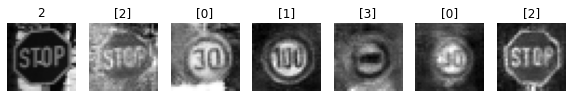

Epoch 66910 g_loss= 1.0686693 d_loss= 1.179631 real_acc= 0.78 fake_acc= 0.68
Epoch 66920 g_loss= 0.82781976 d_loss= 1.2777113 real_acc= 0.62 fake_acc= 0.6
Epoch 66930 g_loss= 0.85825396 d_loss= 1.1903528 real_acc= 0.82 fake_acc= 0.58
Epoch 66940 g_loss= 1.1426796 d_loss= 1.1055585 real_acc= 0.78 fake_acc= 0.68
Epoch 66950 g_loss= 1.1594551 d_loss= 1.1803604 real_acc= 0.62 fake_acc= 0.7
Epoch 66960 g_loss= 0.9350537 d_loss= 1.2509634 real_acc= 0.72 fake_acc= 0.62
Epoch 66970 g_loss= 1.0844102 d_loss= 1.0519265 real_acc= 0.74 fake_acc= 0.78
Epoch 66980 g_loss= 0.97127616 d_loss= 1.1963767 real_acc= 0.68 fake_acc= 0.6
Epoch 66990 g_loss= 0.9826149 d_loss= 1.1518258 real_acc= 0.7 fake_acc= 0.72
Epoch 67000 g_loss= 1.0638949 d_loss= 1.2312541 real_acc= 0.62 fake_acc= 0.7


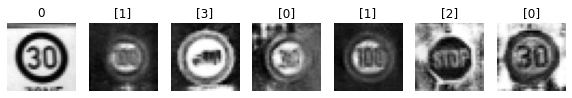

Epoch 67010 g_loss= 1.0623091 d_loss= 1.1569643 real_acc= 0.74 fake_acc= 0.68
Epoch 67020 g_loss= 1.1378373 d_loss= 1.1677687 real_acc= 0.6 fake_acc= 0.7
Epoch 67030 g_loss= 1.0585274 d_loss= 1.0615814 real_acc= 0.7 fake_acc= 0.74
Epoch 67040 g_loss= 1.062004 d_loss= 1.3968744 real_acc= 0.52 fake_acc= 0.68
Epoch 67050 g_loss= 1.0326735 d_loss= 1.2712536 real_acc= 0.58 fake_acc= 0.62
Epoch 67060 g_loss= 1.0069405 d_loss= 1.2443779 real_acc= 0.7 fake_acc= 0.66
Epoch 67070 g_loss= 0.88082814 d_loss= 1.1230711 real_acc= 0.88 fake_acc= 0.52
Epoch 67080 g_loss= 0.9664938 d_loss= 1.148663 real_acc= 0.76 fake_acc= 0.58
Epoch 67090 g_loss= 1.0635165 d_loss= 1.1131423 real_acc= 0.74 fake_acc= 0.62
Epoch 67100 g_loss= 1.1857055 d_loss= 1.012384 real_acc= 0.7 fake_acc= 0.9


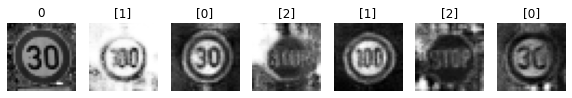

Epoch 67110 g_loss= 0.9902861 d_loss= 1.173046 real_acc= 0.68 fake_acc= 0.56
Epoch 67120 g_loss= 1.0660348 d_loss= 1.2202008 real_acc= 0.66 fake_acc= 0.66
Epoch 67130 g_loss= 1.2564101 d_loss= 1.1408908 real_acc= 0.56 fake_acc= 0.78
Epoch 67140 g_loss= 0.9718789 d_loss= 1.1716945 real_acc= 0.74 fake_acc= 0.58
Epoch 67150 g_loss= 1.0527494 d_loss= 1.174636 real_acc= 0.7 fake_acc= 0.66
Epoch 67160 g_loss= 1.038742 d_loss= 1.219455 real_acc= 0.6 fake_acc= 0.64
Epoch 67170 g_loss= 1.0176915 d_loss= 1.1487995 real_acc= 0.64 fake_acc= 0.66
Epoch 67180 g_loss= 0.9715075 d_loss= 1.2704486 real_acc= 0.6 fake_acc= 0.62
Epoch 67190 g_loss= 1.0035843 d_loss= 1.1531222 real_acc= 0.68 fake_acc= 0.72
Epoch 67200 g_loss= 1.104321 d_loss= 1.0425011 real_acc= 0.68 fake_acc= 0.7


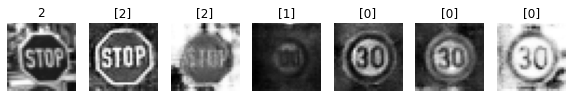

Epoch 67210 g_loss= 0.9509992 d_loss= 1.1826644 real_acc= 0.68 fake_acc= 0.62
Epoch 67220 g_loss= 1.026455 d_loss= 0.99946815 real_acc= 0.84 fake_acc= 0.64
Epoch 67230 g_loss= 1.193776 d_loss= 1.0200552 real_acc= 0.66 fake_acc= 0.82
Epoch 67240 g_loss= 1.0506576 d_loss= 1.1322562 real_acc= 0.68 fake_acc= 0.72
Epoch 67250 g_loss= 0.87916595 d_loss= 1.1595156 real_acc= 0.82 fake_acc= 0.6
Epoch 67260 g_loss= 1.15225 d_loss= 0.9780214 real_acc= 0.84 fake_acc= 0.64
Epoch 67270 g_loss= 1.1317872 d_loss= 1.1598017 real_acc= 0.68 fake_acc= 0.66
Epoch 67280 g_loss= 0.91322845 d_loss= 1.1766369 real_acc= 0.74 fake_acc= 0.54
Epoch 67290 g_loss= 0.7703035 d_loss= 1.2236719 real_acc= 0.72 fake_acc= 0.52
Epoch 67300 g_loss= 1.0506103 d_loss= 1.2062309 real_acc= 0.7 fake_acc= 0.64


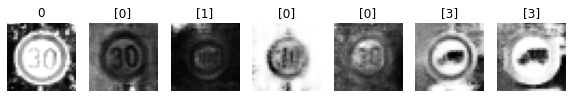

Epoch 67310 g_loss= 1.2466698 d_loss= 1.069319 real_acc= 0.6 fake_acc= 0.88
Epoch 67320 g_loss= 0.9630486 d_loss= 1.1665425 real_acc= 0.64 fake_acc= 0.72
Epoch 67330 g_loss= 1.1028517 d_loss= 1.0792465 real_acc= 0.8 fake_acc= 0.7
Epoch 67340 g_loss= 0.9289802 d_loss= 1.28195 real_acc= 0.6 fake_acc= 0.68
Epoch 67350 g_loss= 1.0001391 d_loss= 1.2012086 real_acc= 0.72 fake_acc= 0.56
Epoch 67360 g_loss= 0.7403317 d_loss= 1.2106632 real_acc= 0.8 fake_acc= 0.44
Epoch 67370 g_loss= 1.2054722 d_loss= 1.167901 real_acc= 0.58 fake_acc= 0.74
Epoch 67380 g_loss= 1.1286225 d_loss= 1.2694488 real_acc= 0.58 fake_acc= 0.64
Epoch 67390 g_loss= 0.87331307 d_loss= 1.1504637 real_acc= 0.76 fake_acc= 0.58
Epoch 67400 g_loss= 1.0712143 d_loss= 1.1656048 real_acc= 0.64 fake_acc= 0.64


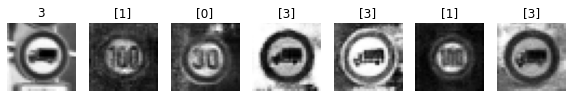

Epoch 67410 g_loss= 1.1082785 d_loss= 1.1885705 real_acc= 0.6 fake_acc= 0.8
Epoch 67420 g_loss= 1.083464 d_loss= 1.2630544 real_acc= 0.48 fake_acc= 0.72
Epoch 67430 g_loss= 1.0299108 d_loss= 1.0983629 real_acc= 0.78 fake_acc= 0.76
Epoch 67440 g_loss= 1.1565295 d_loss= 1.1212165 real_acc= 0.76 fake_acc= 0.64
Epoch 67450 g_loss= 1.1001096 d_loss= 1.1902671 real_acc= 0.58 fake_acc= 0.6
Epoch 67460 g_loss= 1.1913269 d_loss= 1.0703053 real_acc= 0.68 fake_acc= 0.8
Epoch 67470 g_loss= 1.1631392 d_loss= 1.1559048 real_acc= 0.64 fake_acc= 0.76
Epoch 67480 g_loss= 1.0164905 d_loss= 1.2384491 real_acc= 0.64 fake_acc= 0.64
Epoch 67490 g_loss= 0.971151 d_loss= 1.1329415 real_acc= 0.74 fake_acc= 0.66
Epoch 67500 g_loss= 0.97037053 d_loss= 1.2516972 real_acc= 0.66 fake_acc= 0.62


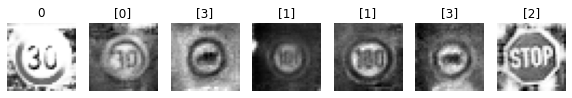

Epoch 67510 g_loss= 0.9962516 d_loss= 1.1742214 real_acc= 0.66 fake_acc= 0.66
Epoch 67520 g_loss= 0.9570458 d_loss= 1.2115319 real_acc= 0.72 fake_acc= 0.56
Epoch 67530 g_loss= 1.2168883 d_loss= 1.1133487 real_acc= 0.66 fake_acc= 0.82
Epoch 67540 g_loss= 1.1228255 d_loss= 1.1268396 real_acc= 0.62 fake_acc= 0.74
Epoch 67550 g_loss= 1.126764 d_loss= 0.98274493 real_acc= 0.8 fake_acc= 0.82
Epoch 67560 g_loss= 1.1005232 d_loss= 1.17308 real_acc= 0.64 fake_acc= 0.8
Epoch 67570 g_loss= 0.8934512 d_loss= 1.2832146 real_acc= 0.72 fake_acc= 0.5
Epoch 67580 g_loss= 1.0170722 d_loss= 1.0515661 real_acc= 0.82 fake_acc= 0.72
Epoch 67590 g_loss= 1.2743298 d_loss= 1.1775026 real_acc= 0.6 fake_acc= 0.78
Epoch 67600 g_loss= 1.0674908 d_loss= 1.1454985 real_acc= 0.72 fake_acc= 0.6


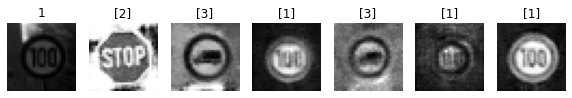

Epoch 67610 g_loss= 1.0552036 d_loss= 1.1306853 real_acc= 0.74 fake_acc= 0.66
Epoch 67620 g_loss= 1.0351632 d_loss= 1.1923709 real_acc= 0.66 fake_acc= 0.6
Epoch 67630 g_loss= 0.9834645 d_loss= 1.3420105 real_acc= 0.64 fake_acc= 0.7
Epoch 67640 g_loss= 1.094114 d_loss= 1.1185187 real_acc= 0.82 fake_acc= 0.66
Epoch 67650 g_loss= 1.1328237 d_loss= 1.0800164 real_acc= 0.68 fake_acc= 0.76
Epoch 67660 g_loss= 0.8252713 d_loss= 1.3138003 real_acc= 0.74 fake_acc= 0.48
Epoch 67670 g_loss= 1.017629 d_loss= 1.1966742 real_acc= 0.62 fake_acc= 0.76
Epoch 67680 g_loss= 1.1544316 d_loss= 1.0936885 real_acc= 0.66 fake_acc= 0.76
Epoch 67690 g_loss= 1.049648 d_loss= 1.0708325 real_acc= 0.68 fake_acc= 0.68
Epoch 67700 g_loss= 1.0779943 d_loss= 1.1173642 real_acc= 0.76 fake_acc= 0.68


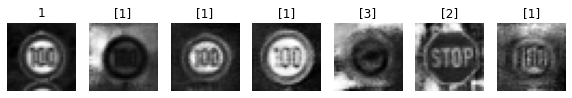

Epoch 67710 g_loss= 1.1698084 d_loss= 1.1016629 real_acc= 0.7 fake_acc= 0.76
Epoch 67720 g_loss= 0.940409 d_loss= 1.2365057 real_acc= 0.64 fake_acc= 0.56
Epoch 67730 g_loss= 0.91316926 d_loss= 1.1702056 real_acc= 0.76 fake_acc= 0.6
Epoch 67740 g_loss= 0.8862553 d_loss= 1.150085 real_acc= 0.74 fake_acc= 0.58
Epoch 67750 g_loss= 1.0116194 d_loss= 1.2599175 real_acc= 0.76 fake_acc= 0.66
Epoch 67760 g_loss= 1.0606977 d_loss= 1.1664796 real_acc= 0.66 fake_acc= 0.66
Epoch 67770 g_loss= 1.4356015 d_loss= 1.081619 real_acc= 0.58 fake_acc= 0.82
Epoch 67780 g_loss= 0.91123694 d_loss= 1.212739 real_acc= 0.78 fake_acc= 0.54
Epoch 67790 g_loss= 1.0872846 d_loss= 1.1326001 real_acc= 0.66 fake_acc= 0.72
Epoch 67800 g_loss= 0.98978853 d_loss= 1.1501187 real_acc= 0.72 fake_acc= 0.56


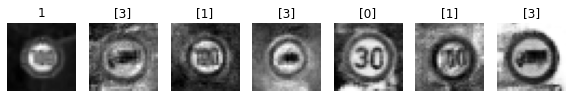

Epoch 67810 g_loss= 1.0303379 d_loss= 1.1380455 real_acc= 0.7 fake_acc= 0.7
Epoch 67820 g_loss= 0.9263916 d_loss= 1.1985384 real_acc= 0.7 fake_acc= 0.68
Epoch 67830 g_loss= 1.032143 d_loss= 1.133558 real_acc= 0.62 fake_acc= 0.7
Epoch 67840 g_loss= 0.98547465 d_loss= 1.2082827 real_acc= 0.58 fake_acc= 0.78
Epoch 67850 g_loss= 0.8678347 d_loss= 1.1937363 real_acc= 0.66 fake_acc= 0.58
Epoch 67860 g_loss= 1.1222934 d_loss= 1.1431105 real_acc= 0.56 fake_acc= 0.78
Epoch 67870 g_loss= 0.9497967 d_loss= 1.2081308 real_acc= 0.68 fake_acc= 0.62
Epoch 67880 g_loss= 1.0070299 d_loss= 1.0549765 real_acc= 0.88 fake_acc= 0.58
Epoch 67890 g_loss= 1.1311256 d_loss= 1.1280401 real_acc= 0.54 fake_acc= 0.78
Epoch 67900 g_loss= 1.0935227 d_loss= 1.2183752 real_acc= 0.62 fake_acc= 0.62


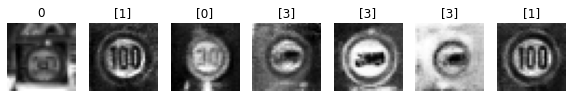

Epoch 67910 g_loss= 1.0678674 d_loss= 1.0639836 real_acc= 0.76 fake_acc= 0.64
Epoch 67920 g_loss= 1.0697448 d_loss= 1.1024463 real_acc= 0.76 fake_acc= 0.66
Epoch 67930 g_loss= 1.2400166 d_loss= 1.069311 real_acc= 0.58 fake_acc= 0.8
Epoch 67940 g_loss= 1.0631279 d_loss= 1.1542642 real_acc= 0.64 fake_acc= 0.68
Epoch 67950 g_loss= 1.1716073 d_loss= 1.0970423 real_acc= 0.52 fake_acc= 0.84
Epoch 67960 g_loss= 1.1509867 d_loss= 1.0633447 real_acc= 0.66 fake_acc= 0.72
Epoch 67970 g_loss= 1.0338401 d_loss= 1.0062177 real_acc= 0.88 fake_acc= 0.66
Epoch 67980 g_loss= 1.1529489 d_loss= 1.0655134 real_acc= 0.72 fake_acc= 0.72
Epoch 67990 g_loss= 1.049164 d_loss= 1.157685 real_acc= 0.68 fake_acc= 0.7
Epoch 68000 g_loss= 1.0626808 d_loss= 1.2122192 real_acc= 0.6 fake_acc= 0.68


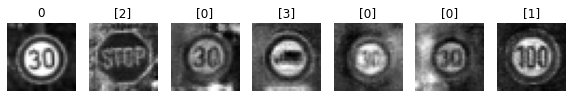

Epoch 68010 g_loss= 0.9053443 d_loss= 1.1486145 real_acc= 0.78 fake_acc= 0.56
Epoch 68020 g_loss= 1.177325 d_loss= 1.2653763 real_acc= 0.5 fake_acc= 0.68
Epoch 68030 g_loss= 1.0439345 d_loss= 1.2273021 real_acc= 0.58 fake_acc= 0.68
Epoch 68040 g_loss= 1.1510358 d_loss= 1.1824393 real_acc= 0.6 fake_acc= 0.74
Epoch 68050 g_loss= 0.95603293 d_loss= 1.1438088 real_acc= 0.74 fake_acc= 0.66
Epoch 68060 g_loss= 1.0702469 d_loss= 1.0672922 real_acc= 0.76 fake_acc= 0.72
Epoch 68070 g_loss= 1.0074407 d_loss= 1.0999593 real_acc= 0.74 fake_acc= 0.7
Epoch 68080 g_loss= 0.79971087 d_loss= 1.266108 real_acc= 0.74 fake_acc= 0.54
Epoch 68090 g_loss= 1.2199649 d_loss= 1.088752 real_acc= 0.7 fake_acc= 0.76
Epoch 68100 g_loss= 1.0189499 d_loss= 1.1470602 real_acc= 0.68 fake_acc= 0.76


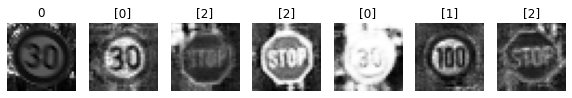

Epoch 68110 g_loss= 0.83255106 d_loss= 1.2680173 real_acc= 0.74 fake_acc= 0.5
Epoch 68120 g_loss= 0.86944747 d_loss= 1.3690219 real_acc= 0.58 fake_acc= 0.52
Epoch 68130 g_loss= 0.9765955 d_loss= 1.2086227 real_acc= 0.76 fake_acc= 0.54
Epoch 68140 g_loss= 1.1153408 d_loss= 1.036175 real_acc= 0.78 fake_acc= 0.78
Epoch 68150 g_loss= 1.207032 d_loss= 1.1298041 real_acc= 0.62 fake_acc= 0.72
Epoch 68160 g_loss= 1.2623458 d_loss= 1.0620682 real_acc= 0.7 fake_acc= 0.84
Epoch 68170 g_loss= 1.130041 d_loss= 1.1468984 real_acc= 0.58 fake_acc= 0.8
Epoch 68180 g_loss= 0.97652644 d_loss= 1.216949 real_acc= 0.7 fake_acc= 0.68
Epoch 68190 g_loss= 1.0546973 d_loss= 1.3493063 real_acc= 0.56 fake_acc= 0.7
Epoch 68200 g_loss= 0.98782957 d_loss= 1.1249713 real_acc= 0.74 fake_acc= 0.58


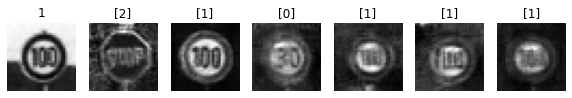

Epoch 68210 g_loss= 1.0133505 d_loss= 1.13538 real_acc= 0.76 fake_acc= 0.68
Epoch 68220 g_loss= 1.0656555 d_loss= 1.2757306 real_acc= 0.56 fake_acc= 0.64
Epoch 68230 g_loss= 0.988085 d_loss= 1.1043143 real_acc= 0.74 fake_acc= 0.62
Epoch 68240 g_loss= 0.9690325 d_loss= 1.2433808 real_acc= 0.68 fake_acc= 0.56
Epoch 68250 g_loss= 1.0294982 d_loss= 1.0770404 real_acc= 0.8 fake_acc= 0.72
Epoch 68260 g_loss= 1.0033431 d_loss= 1.2546155 real_acc= 0.64 fake_acc= 0.68
Epoch 68270 g_loss= 1.0118852 d_loss= 1.1194735 real_acc= 0.66 fake_acc= 0.72
Epoch 68280 g_loss= 1.0458934 d_loss= 1.2191569 real_acc= 0.6 fake_acc= 0.7
Epoch 68290 g_loss= 0.9776862 d_loss= 1.0924908 real_acc= 0.76 fake_acc= 0.76
Epoch 68300 g_loss= 0.91945577 d_loss= 1.2277642 real_acc= 0.68 fake_acc= 0.6


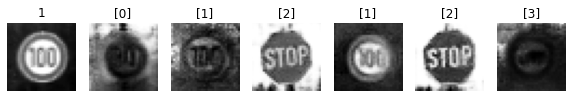

Epoch 68310 g_loss= 0.9607798 d_loss= 1.2487875 real_acc= 0.62 fake_acc= 0.66
Epoch 68320 g_loss= 1.1947563 d_loss= 1.0978866 real_acc= 0.6 fake_acc= 0.76
Epoch 68330 g_loss= 1.1798538 d_loss= 1.148729 real_acc= 0.72 fake_acc= 0.72
Epoch 68340 g_loss= 0.96949774 d_loss= 1.2100831 real_acc= 0.7 fake_acc= 0.56
Epoch 68350 g_loss= 0.9796993 d_loss= 1.1811773 real_acc= 0.68 fake_acc= 0.68
Epoch 68360 g_loss= 0.897497 d_loss= 1.2411009 real_acc= 0.66 fake_acc= 0.64
Epoch 68370 g_loss= 1.1887958 d_loss= 1.015591 real_acc= 0.6 fake_acc= 0.94
Epoch 68380 g_loss= 0.96809787 d_loss= 1.1350702 real_acc= 0.72 fake_acc= 0.68
Epoch 68390 g_loss= 0.8648083 d_loss= 1.2947086 real_acc= 0.66 fake_acc= 0.58
Epoch 68400 g_loss= 0.92347074 d_loss= 1.2949743 real_acc= 0.66 fake_acc= 0.6


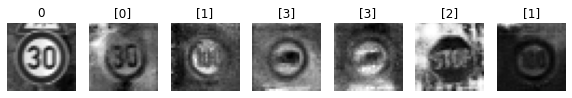

Epoch 68410 g_loss= 1.030959 d_loss= 1.1023641 real_acc= 0.78 fake_acc= 0.66
Epoch 68420 g_loss= 1.0965259 d_loss= 1.1463149 real_acc= 0.7 fake_acc= 0.68
Epoch 68430 g_loss= 1.2161548 d_loss= 1.0617083 real_acc= 0.68 fake_acc= 0.8
Epoch 68440 g_loss= 0.95519865 d_loss= 1.2105993 real_acc= 0.66 fake_acc= 0.64
Epoch 68450 g_loss= 1.0240554 d_loss= 1.1770457 real_acc= 0.72 fake_acc= 0.62
Epoch 68460 g_loss= 1.0604533 d_loss= 1.0629203 real_acc= 0.72 fake_acc= 0.72
Epoch 68470 g_loss= 1.0482707 d_loss= 1.1127008 real_acc= 0.7 fake_acc= 0.66
Epoch 68480 g_loss= 1.1477945 d_loss= 1.2284434 real_acc= 0.6 fake_acc= 0.74
Epoch 68490 g_loss= 1.1288043 d_loss= 1.1173208 real_acc= 0.76 fake_acc= 0.66
Epoch 68500 g_loss= 0.9999401 d_loss= 1.2686901 real_acc= 0.68 fake_acc= 0.62


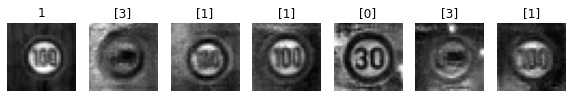

Epoch 68510 g_loss= 0.8710773 d_loss= 1.4268364 real_acc= 0.56 fake_acc= 0.54
Epoch 68520 g_loss= 1.0566621 d_loss= 1.1946381 real_acc= 0.56 fake_acc= 0.82
Epoch 68530 g_loss= 1.0438874 d_loss= 1.1546626 real_acc= 0.66 fake_acc= 0.68
Epoch 68540 g_loss= 0.9057381 d_loss= 1.2967547 real_acc= 0.78 fake_acc= 0.46
Epoch 68550 g_loss= 1.0342902 d_loss= 1.1327502 real_acc= 0.72 fake_acc= 0.68
Epoch 68560 g_loss= 1.0941592 d_loss= 1.2177813 real_acc= 0.7 fake_acc= 0.58
Epoch 68570 g_loss= 1.0647281 d_loss= 1.1137615 real_acc= 0.68 fake_acc= 0.68
Epoch 68580 g_loss= 1.1443492 d_loss= 1.158394 real_acc= 0.74 fake_acc= 0.66
Epoch 68590 g_loss= 1.0857097 d_loss= 1.1172632 real_acc= 0.86 fake_acc= 0.66
Epoch 68600 g_loss= 1.0674751 d_loss= 1.1305714 real_acc= 0.74 fake_acc= 0.74


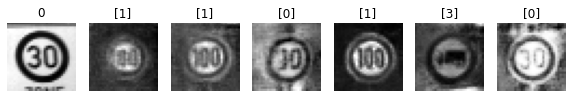

Epoch 68610 g_loss= 1.1508011 d_loss= 1.0084617 real_acc= 0.8 fake_acc= 0.74
Epoch 68620 g_loss= 1.037722 d_loss= 1.1407424 real_acc= 0.72 fake_acc= 0.62
Epoch 68630 g_loss= 1.1257143 d_loss= 1.1371423 real_acc= 0.64 fake_acc= 0.76
Epoch 68640 g_loss= 1.1242492 d_loss= 1.193279 real_acc= 0.62 fake_acc= 0.76
Epoch 68650 g_loss= 1.052596 d_loss= 1.2242477 real_acc= 0.7 fake_acc= 0.68
Epoch 68660 g_loss= 1.0251542 d_loss= 1.1938524 real_acc= 0.56 fake_acc= 0.72
Epoch 68670 g_loss= 1.0542921 d_loss= 1.1587648 real_acc= 0.68 fake_acc= 0.68
Epoch 68680 g_loss= 1.2721012 d_loss= 1.0914007 real_acc= 0.6 fake_acc= 0.78
Epoch 68690 g_loss= 1.151639 d_loss= 1.0229737 real_acc= 0.88 fake_acc= 0.68
Epoch 68700 g_loss= 1.0752765 d_loss= 1.2197411 real_acc= 0.62 fake_acc= 0.66


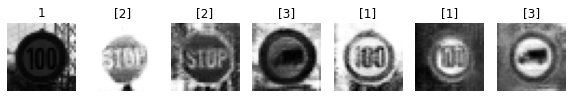

Epoch 68710 g_loss= 1.1784356 d_loss= 1.1719198 real_acc= 0.68 fake_acc= 0.66
Epoch 68720 g_loss= 0.97734904 d_loss= 1.3125978 real_acc= 0.68 fake_acc= 0.62
Epoch 68730 g_loss= 0.9516861 d_loss= 1.205555 real_acc= 0.66 fake_acc= 0.66
Epoch 68740 g_loss= 0.96548533 d_loss= 1.167105 real_acc= 0.74 fake_acc= 0.7
Epoch 68750 g_loss= 1.0592008 d_loss= 1.0843004 real_acc= 0.78 fake_acc= 0.6
Epoch 68760 g_loss= 0.9168274 d_loss= 1.2539785 real_acc= 0.68 fake_acc= 0.58
Epoch 68770 g_loss= 1.1934346 d_loss= 1.0564029 real_acc= 0.74 fake_acc= 0.74
Epoch 68780 g_loss= 1.0212715 d_loss= 1.1929374 real_acc= 0.7 fake_acc= 0.64
Epoch 68790 g_loss= 1.0749321 d_loss= 1.035215 real_acc= 0.76 fake_acc= 0.74
Epoch 68800 g_loss= 0.97177374 d_loss= 1.2357152 real_acc= 0.68 fake_acc= 0.66


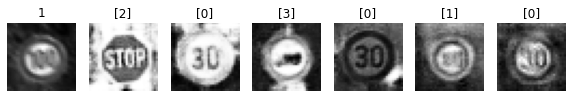

Epoch 68810 g_loss= 1.0151255 d_loss= 1.1033444 real_acc= 0.66 fake_acc= 0.68
Epoch 68820 g_loss= 0.86325055 d_loss= 1.176754 real_acc= 0.72 fake_acc= 0.6
Epoch 68830 g_loss= 0.95448744 d_loss= 1.1683645 real_acc= 0.64 fake_acc= 0.7
Epoch 68840 g_loss= 1.0120679 d_loss= 1.0187473 real_acc= 0.82 fake_acc= 0.7
Epoch 68850 g_loss= 1.011666 d_loss= 1.1706445 real_acc= 0.62 fake_acc= 0.64
Epoch 68860 g_loss= 0.90957564 d_loss= 1.1508602 real_acc= 0.8 fake_acc= 0.54
Epoch 68870 g_loss= 1.0794897 d_loss= 1.160099 real_acc= 0.68 fake_acc= 0.76
Epoch 68880 g_loss= 0.9246949 d_loss= 1.2720461 real_acc= 0.62 fake_acc= 0.58
Epoch 68890 g_loss= 0.9334041 d_loss= 1.1953814 real_acc= 0.8 fake_acc= 0.54
Epoch 68900 g_loss= 1.1336004 d_loss= 1.0690988 real_acc= 0.74 fake_acc= 0.72


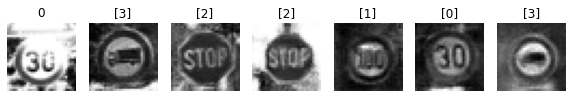

Epoch 68910 g_loss= 1.1598046 d_loss= 1.167356 real_acc= 0.64 fake_acc= 0.82
Epoch 68920 g_loss= 1.1127084 d_loss= 1.1893698 real_acc= 0.64 fake_acc= 0.68
Epoch 68930 g_loss= 0.9692111 d_loss= 1.2480242 real_acc= 0.68 fake_acc= 0.58
Epoch 68940 g_loss= 0.8701666 d_loss= 1.1498712 real_acc= 0.76 fake_acc= 0.62
Epoch 68950 g_loss= 1.1593207 d_loss= 1.0862904 real_acc= 0.64 fake_acc= 0.88
Epoch 68960 g_loss= 1.1610849 d_loss= 1.0680239 real_acc= 0.72 fake_acc= 0.72
Epoch 68970 g_loss= 1.0499246 d_loss= 1.223603 real_acc= 0.6 fake_acc= 0.76
Epoch 68980 g_loss= 0.8946396 d_loss= 1.1310036 real_acc= 0.8 fake_acc= 0.68
Epoch 68990 g_loss= 1.2269921 d_loss= 1.1841832 real_acc= 0.56 fake_acc= 0.68
Epoch 69000 g_loss= 1.1225089 d_loss= 1.1242497 real_acc= 0.62 fake_acc= 0.76


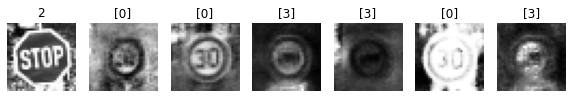

Epoch 69010 g_loss= 1.1285081 d_loss= 1.1786549 real_acc= 0.64 fake_acc= 0.62
Epoch 69020 g_loss= 0.9408371 d_loss= 1.1831012 real_acc= 0.68 fake_acc= 0.66
Epoch 69030 g_loss= 1.18086 d_loss= 1.1469475 real_acc= 0.66 fake_acc= 0.72
Epoch 69040 g_loss= 1.0285075 d_loss= 1.1238436 real_acc= 0.74 fake_acc= 0.66
Epoch 69050 g_loss= 0.91786474 d_loss= 1.2948793 real_acc= 0.58 fake_acc= 0.54
Epoch 69060 g_loss= 0.9163726 d_loss= 1.2376604 real_acc= 0.7 fake_acc= 0.64
Epoch 69070 g_loss= 1.187768 d_loss= 1.1287856 real_acc= 0.66 fake_acc= 0.72
Epoch 69080 g_loss= 0.9870711 d_loss= 1.1413568 real_acc= 0.74 fake_acc= 0.56
Epoch 69090 g_loss= 1.026725 d_loss= 1.1982698 real_acc= 0.72 fake_acc= 0.68
Epoch 69100 g_loss= 1.1078312 d_loss= 1.0139269 real_acc= 0.68 fake_acc= 0.82


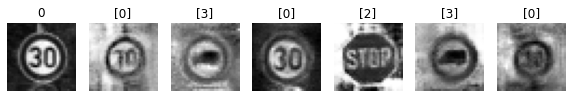

Epoch 69110 g_loss= 1.2939447 d_loss= 1.1332788 real_acc= 0.52 fake_acc= 0.78
Epoch 69120 g_loss= 0.94562757 d_loss= 1.2345681 real_acc= 0.68 fake_acc= 0.58
Epoch 69130 g_loss= 0.95879686 d_loss= 1.2528825 real_acc= 0.58 fake_acc= 0.6
Epoch 69140 g_loss= 0.97734904 d_loss= 1.1968241 real_acc= 0.78 fake_acc= 0.64
Epoch 69150 g_loss= 1.0504882 d_loss= 1.074616 real_acc= 0.82 fake_acc= 0.68
Epoch 69160 g_loss= 0.97631145 d_loss= 1.3776042 real_acc= 0.68 fake_acc= 0.6
Epoch 69170 g_loss= 1.0386392 d_loss= 1.0960796 real_acc= 0.72 fake_acc= 0.66
Epoch 69180 g_loss= 1.2312485 d_loss= 1.1329279 real_acc= 0.7 fake_acc= 0.8
Epoch 69190 g_loss= 1.001982 d_loss= 1.1065671 real_acc= 0.78 fake_acc= 0.54
Epoch 69200 g_loss= 0.92487365 d_loss= 1.133482 real_acc= 0.78 fake_acc= 0.68


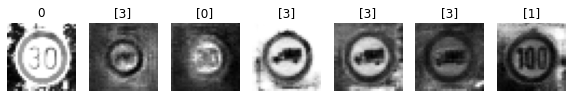

Epoch 69210 g_loss= 1.103022 d_loss= 1.1774695 real_acc= 0.6 fake_acc= 0.7
Epoch 69220 g_loss= 0.8777374 d_loss= 1.2533104 real_acc= 0.58 fake_acc= 0.66
Epoch 69230 g_loss= 0.91977584 d_loss= 1.1396445 real_acc= 0.8 fake_acc= 0.56
Epoch 69240 g_loss= 1.0395782 d_loss= 1.1770626 real_acc= 0.66 fake_acc= 0.7
Epoch 69250 g_loss= 1.126019 d_loss= 1.132114 real_acc= 0.72 fake_acc= 0.72
Epoch 69260 g_loss= 0.98131394 d_loss= 1.2062204 real_acc= 0.68 fake_acc= 0.68
Epoch 69270 g_loss= 0.9504912 d_loss= 1.3567102 real_acc= 0.62 fake_acc= 0.56
Epoch 69280 g_loss= 1.0040528 d_loss= 1.288827 real_acc= 0.58 fake_acc= 0.62
Epoch 69290 g_loss= 0.95128065 d_loss= 1.1456449 real_acc= 0.74 fake_acc= 0.64
Epoch 69300 g_loss= 0.9481498 d_loss= 1.1487521 real_acc= 0.76 fake_acc= 0.62


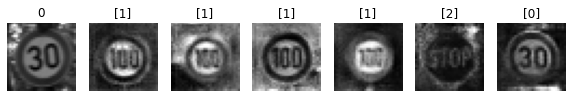

Epoch 69310 g_loss= 1.0316877 d_loss= 1.1005952 real_acc= 0.72 fake_acc= 0.74
Epoch 69320 g_loss= 1.0959666 d_loss= 1.0789213 real_acc= 0.78 fake_acc= 0.7
Epoch 69330 g_loss= 1.1120785 d_loss= 1.1226976 real_acc= 0.6 fake_acc= 0.8
Epoch 69340 g_loss= 1.0381601 d_loss= 1.2862859 real_acc= 0.54 fake_acc= 0.68
Epoch 69350 g_loss= 1.1448214 d_loss= 1.1220417 real_acc= 0.76 fake_acc= 0.68
Epoch 69360 g_loss= 1.0565468 d_loss= 1.1481197 real_acc= 0.72 fake_acc= 0.6
Epoch 69370 g_loss= 1.0822939 d_loss= 1.1216683 real_acc= 0.66 fake_acc= 0.78
Epoch 69380 g_loss= 0.9496567 d_loss= 1.1791028 real_acc= 0.7 fake_acc= 0.64
Epoch 69390 g_loss= 0.91956663 d_loss= 1.0918775 real_acc= 0.78 fake_acc= 0.72
Epoch 69400 g_loss= 1.0090897 d_loss= 1.2222025 real_acc= 0.6 fake_acc= 0.66


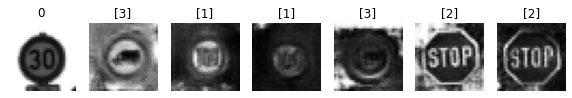

Epoch 69410 g_loss= 1.066975 d_loss= 1.0981164 real_acc= 0.7 fake_acc= 0.68
Epoch 69420 g_loss= 1.0651922 d_loss= 1.13863 real_acc= 0.66 fake_acc= 0.68
Epoch 69430 g_loss= 1.2230169 d_loss= 1.1884334 real_acc= 0.58 fake_acc= 0.68
Epoch 69440 g_loss= 1.0814135 d_loss= 1.1435041 real_acc= 0.68 fake_acc= 0.76
Epoch 69450 g_loss= 0.9911532 d_loss= 1.1267803 real_acc= 0.66 fake_acc= 0.8
Epoch 69460 g_loss= 0.96125764 d_loss= 1.3504505 real_acc= 0.64 fake_acc= 0.6
Epoch 69470 g_loss= 1.0769258 d_loss= 1.2045598 real_acc= 0.66 fake_acc= 0.68
Epoch 69480 g_loss= 0.9536052 d_loss= 1.1401862 real_acc= 0.76 fake_acc= 0.58
Epoch 69490 g_loss= 1.1007233 d_loss= 1.2190604 real_acc= 0.62 fake_acc= 0.58
Epoch 69500 g_loss= 1.0064156 d_loss= 1.1989182 real_acc= 0.7 fake_acc= 0.66


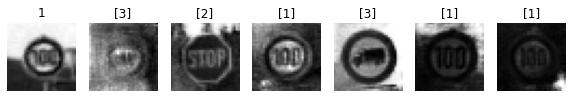

Epoch 69510 g_loss= 1.1340297 d_loss= 1.0236219 real_acc= 0.78 fake_acc= 0.68
Epoch 69520 g_loss= 1.1414958 d_loss= 1.1250854 real_acc= 0.7 fake_acc= 0.76
Epoch 69530 g_loss= 1.1240892 d_loss= 1.0343194 real_acc= 0.74 fake_acc= 0.72
Epoch 69540 g_loss= 1.1662533 d_loss= 1.0955937 real_acc= 0.66 fake_acc= 0.74
Epoch 69550 g_loss= 1.0253654 d_loss= 1.0940907 real_acc= 0.72 fake_acc= 0.74
Epoch 69560 g_loss= 1.0223913 d_loss= 1.1484398 real_acc= 0.72 fake_acc= 0.72
Epoch 69570 g_loss= 1.1253103 d_loss= 1.1676552 real_acc= 0.72 fake_acc= 0.64
Epoch 69580 g_loss= 0.9045915 d_loss= 1.2909863 real_acc= 0.72 fake_acc= 0.58
Epoch 69590 g_loss= 1.0465735 d_loss= 1.1450529 real_acc= 0.68 fake_acc= 0.76
Epoch 69600 g_loss= 1.0505953 d_loss= 1.1334968 real_acc= 0.74 fake_acc= 0.7


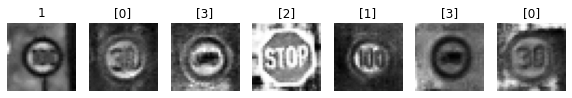

Epoch 69610 g_loss= 1.0996014 d_loss= 1.1448468 real_acc= 0.62 fake_acc= 0.66
Epoch 69620 g_loss= 1.0913347 d_loss= 1.206254 real_acc= 0.6 fake_acc= 0.6
Epoch 69630 g_loss= 0.98264503 d_loss= 1.2840817 real_acc= 0.76 fake_acc= 0.56
Epoch 69640 g_loss= 0.94535714 d_loss= 1.232456 real_acc= 0.74 fake_acc= 0.62
Epoch 69650 g_loss= 0.96860385 d_loss= 1.2795455 real_acc= 0.58 fake_acc= 0.66
Epoch 69660 g_loss= 1.0148894 d_loss= 1.2401735 real_acc= 0.6 fake_acc= 0.74
Epoch 69670 g_loss= 1.0877467 d_loss= 1.0537989 real_acc= 0.72 fake_acc= 0.72
Epoch 69680 g_loss= 1.0453275 d_loss= 1.043936 real_acc= 0.7 fake_acc= 0.72
Epoch 69690 g_loss= 0.9647085 d_loss= 1.2042695 real_acc= 0.72 fake_acc= 0.64
Epoch 69700 g_loss= 1.0719618 d_loss= 1.2155976 real_acc= 0.62 fake_acc= 0.68


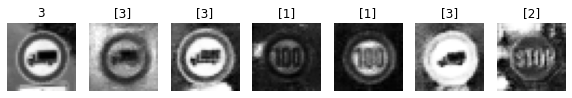

Epoch 69710 g_loss= 1.0629051 d_loss= 1.1213747 real_acc= 0.66 fake_acc= 0.76
Epoch 69720 g_loss= 0.94440687 d_loss= 1.1888305 real_acc= 0.66 fake_acc= 0.66
Epoch 69730 g_loss= 1.0041405 d_loss= 1.3231179 real_acc= 0.66 fake_acc= 0.68
Epoch 69740 g_loss= 0.86008894 d_loss= 1.1932786 real_acc= 0.84 fake_acc= 0.54
Epoch 69750 g_loss= 0.90885764 d_loss= 1.2668767 real_acc= 0.6 fake_acc= 0.68
Epoch 69760 g_loss= 0.9416717 d_loss= 1.2584293 real_acc= 0.6 fake_acc= 0.58
Epoch 69770 g_loss= 1.1212244 d_loss= 1.1867149 real_acc= 0.74 fake_acc= 0.6
Epoch 69780 g_loss= 1.0569533 d_loss= 1.102824 real_acc= 0.62 fake_acc= 0.7
Epoch 69790 g_loss= 0.9489737 d_loss= 1.1537898 real_acc= 0.7 fake_acc= 0.62
Epoch 69800 g_loss= 1.0552468 d_loss= 1.1835126 real_acc= 0.68 fake_acc= 0.66


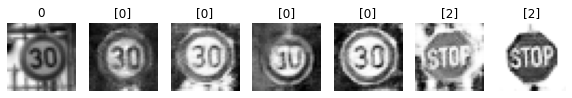

Epoch 69810 g_loss= 1.0176301 d_loss= 1.2087553 real_acc= 0.66 fake_acc= 0.6
Epoch 69820 g_loss= 0.98472726 d_loss= 1.1644027 real_acc= 0.68 fake_acc= 0.64
Epoch 69830 g_loss= 0.93317765 d_loss= 1.1585237 real_acc= 0.72 fake_acc= 0.54
Epoch 69840 g_loss= 1.0867821 d_loss= 1.1863925 real_acc= 0.72 fake_acc= 0.72
Epoch 69850 g_loss= 0.9951783 d_loss= 1.2192601 real_acc= 0.68 fake_acc= 0.6
Epoch 69860 g_loss= 1.2119831 d_loss= 1.1375303 real_acc= 0.6 fake_acc= 0.72
Epoch 69870 g_loss= 0.96167 d_loss= 1.1170381 real_acc= 0.76 fake_acc= 0.66
Epoch 69880 g_loss= 0.85267717 d_loss= 1.2375264 real_acc= 0.8 fake_acc= 0.58
Epoch 69890 g_loss= 1.2007698 d_loss= 1.1176499 real_acc= 0.66 fake_acc= 0.82
Epoch 69900 g_loss= 0.8303206 d_loss= 1.2644787 real_acc= 0.74 fake_acc= 0.5


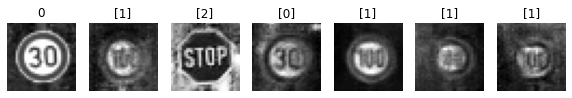

Epoch 69910 g_loss= 1.0275816 d_loss= 1.2438309 real_acc= 0.74 fake_acc= 0.52
Epoch 69920 g_loss= 1.0437185 d_loss= 1.0576991 real_acc= 0.74 fake_acc= 0.64
Epoch 69930 g_loss= 1.1310008 d_loss= 1.0404139 real_acc= 0.76 fake_acc= 0.72
Epoch 69940 g_loss= 0.97054935 d_loss= 1.1065053 real_acc= 0.82 fake_acc= 0.58
Epoch 69950 g_loss= 1.1824231 d_loss= 1.054276 real_acc= 0.72 fake_acc= 0.76
Epoch 69960 g_loss= 1.119949 d_loss= 1.2201594 real_acc= 0.64 fake_acc= 0.72
Epoch 69970 g_loss= 0.9928753 d_loss= 1.1093602 real_acc= 0.8 fake_acc= 0.72
Epoch 69980 g_loss= 1.0251055 d_loss= 1.1401074 real_acc= 0.74 fake_acc= 0.6
Epoch 69990 g_loss= 0.96432024 d_loss= 1.0148518 real_acc= 0.82 fake_acc= 0.7
Epoch 70000 g_loss= 0.9374637 d_loss= 1.2519512 real_acc= 0.62 fake_acc= 0.66


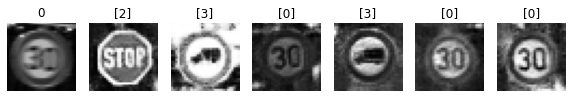

Epoch 70010 g_loss= 1.0408882 d_loss= 1.2312112 real_acc= 0.6 fake_acc= 0.72
Epoch 70020 g_loss= 0.8912743 d_loss= 1.2024186 real_acc= 0.7 fake_acc= 0.56
Epoch 70030 g_loss= 1.0344081 d_loss= 1.1636889 real_acc= 0.7 fake_acc= 0.78
Epoch 70040 g_loss= 0.9439502 d_loss= 1.2998327 real_acc= 0.68 fake_acc= 0.64
Epoch 70050 g_loss= 0.8182484 d_loss= 1.1992317 real_acc= 0.8 fake_acc= 0.56
Epoch 70060 g_loss= 1.0122901 d_loss= 1.0550752 real_acc= 0.76 fake_acc= 0.76
Epoch 70070 g_loss= 1.1080903 d_loss= 1.1534823 real_acc= 0.6 fake_acc= 0.76
Epoch 70080 g_loss= 0.89220273 d_loss= 1.1685004 real_acc= 0.76 fake_acc= 0.52
Epoch 70090 g_loss= 0.9687309 d_loss= 1.1652515 real_acc= 0.72 fake_acc= 0.66
Epoch 70100 g_loss= 1.0008165 d_loss= 1.1415424 real_acc= 0.72 fake_acc= 0.66


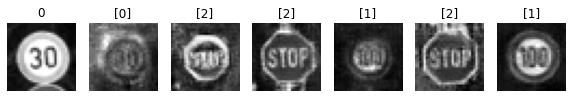

Epoch 70110 g_loss= 1.0164758 d_loss= 1.2551296 real_acc= 0.66 fake_acc= 0.62
Epoch 70120 g_loss= 1.144299 d_loss= 1.109556 real_acc= 0.68 fake_acc= 0.82
Epoch 70130 g_loss= 1.0043072 d_loss= 1.2207067 real_acc= 0.7 fake_acc= 0.64
Epoch 70140 g_loss= 1.0338435 d_loss= 1.1242845 real_acc= 0.76 fake_acc= 0.72
Epoch 70150 g_loss= 1.1930846 d_loss= 1.0529923 real_acc= 0.7 fake_acc= 0.84
Epoch 70160 g_loss= 1.1141368 d_loss= 1.1104214 real_acc= 0.64 fake_acc= 0.76
Epoch 70170 g_loss= 1.0134767 d_loss= 1.1557573 real_acc= 0.68 fake_acc= 0.56
Epoch 70180 g_loss= 1.1075308 d_loss= 1.1915376 real_acc= 0.68 fake_acc= 0.66
Epoch 70190 g_loss= 1.1518527 d_loss= 1.0220699 real_acc= 0.84 fake_acc= 0.72
Epoch 70200 g_loss= 1.10943 d_loss= 1.1334976 real_acc= 0.7 fake_acc= 0.76


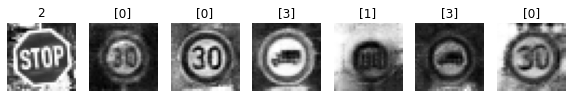

Epoch 70210 g_loss= 0.98940206 d_loss= 1.2374742 real_acc= 0.74 fake_acc= 0.66
Epoch 70220 g_loss= 1.0875366 d_loss= 1.1388258 real_acc= 0.7 fake_acc= 0.68
Epoch 70230 g_loss= 0.95456505 d_loss= 1.2348752 real_acc= 0.58 fake_acc= 0.68
Epoch 70240 g_loss= 1.0537424 d_loss= 1.2107918 real_acc= 0.68 fake_acc= 0.7
Epoch 70250 g_loss= 0.8182451 d_loss= 1.1942533 real_acc= 0.82 fake_acc= 0.54
Epoch 70260 g_loss= 0.9805562 d_loss= 1.1295502 real_acc= 0.74 fake_acc= 0.7
Epoch 70270 g_loss= 1.224509 d_loss= 1.1112878 real_acc= 0.76 fake_acc= 0.68
Epoch 70280 g_loss= 0.91915184 d_loss= 1.1555045 real_acc= 0.7 fake_acc= 0.6
Epoch 70290 g_loss= 1.0304347 d_loss= 1.0946445 real_acc= 0.76 fake_acc= 0.66
Epoch 70300 g_loss= 1.1161419 d_loss= 1.2326413 real_acc= 0.56 fake_acc= 0.7


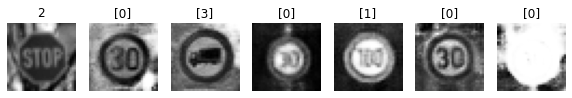

Epoch 70310 g_loss= 0.8993512 d_loss= 1.2317134 real_acc= 0.7 fake_acc= 0.58
Epoch 70320 g_loss= 1.0262809 d_loss= 1.22384 real_acc= 0.74 fake_acc= 0.64
Epoch 70330 g_loss= 1.1392626 d_loss= 1.1002629 real_acc= 0.74 fake_acc= 0.76
Epoch 70340 g_loss= 0.97329444 d_loss= 1.1932368 real_acc= 0.74 fake_acc= 0.52
Epoch 70350 g_loss= 1.0635947 d_loss= 1.1406657 real_acc= 0.74 fake_acc= 0.58
Epoch 70360 g_loss= 0.973659 d_loss= 1.1858171 real_acc= 0.64 fake_acc= 0.7
Epoch 70370 g_loss= 1.0965793 d_loss= 1.2012299 real_acc= 0.54 fake_acc= 0.76
Epoch 70380 g_loss= 1.0020838 d_loss= 1.3027387 real_acc= 0.6 fake_acc= 0.6
Epoch 70390 g_loss= 1.1271224 d_loss= 1.0893018 real_acc= 0.62 fake_acc= 0.78
Epoch 70400 g_loss= 1.0905163 d_loss= 1.1177545 real_acc= 0.68 fake_acc= 0.68


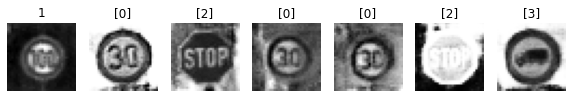

Epoch 70410 g_loss= 1.1540275 d_loss= 1.1734937 real_acc= 0.68 fake_acc= 0.72
Epoch 70420 g_loss= 1.2359425 d_loss= 0.99856097 real_acc= 0.66 fake_acc= 0.86
Epoch 70430 g_loss= 1.1158175 d_loss= 1.1090126 real_acc= 0.72 fake_acc= 0.8
Epoch 70440 g_loss= 1.013093 d_loss= 1.248728 real_acc= 0.58 fake_acc= 0.72
Epoch 70450 g_loss= 0.96718305 d_loss= 1.1611369 real_acc= 0.64 fake_acc= 0.66
Epoch 70460 g_loss= 1.2222008 d_loss= 1.0199986 real_acc= 0.72 fake_acc= 0.8
Epoch 70470 g_loss= 1.0782988 d_loss= 1.1061875 real_acc= 0.76 fake_acc= 0.66
Epoch 70480 g_loss= 1.0063208 d_loss= 1.1658065 real_acc= 0.74 fake_acc= 0.66
Epoch 70490 g_loss= 1.0049638 d_loss= 1.0754608 real_acc= 0.76 fake_acc= 0.74
Epoch 70500 g_loss= 0.97691846 d_loss= 1.0945787 real_acc= 0.76 fake_acc= 0.6


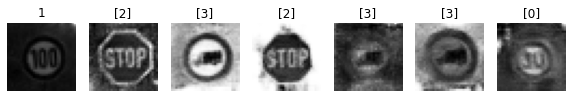

Epoch 70510 g_loss= 1.0627764 d_loss= 1.097876 real_acc= 0.8 fake_acc= 0.62
Epoch 70520 g_loss= 1.0497334 d_loss= 1.2072058 real_acc= 0.62 fake_acc= 0.76
Epoch 70530 g_loss= 1.0588875 d_loss= 1.2773875 real_acc= 0.62 fake_acc= 0.72
Epoch 70540 g_loss= 0.91642016 d_loss= 1.1210921 real_acc= 0.82 fake_acc= 0.62
Epoch 70550 g_loss= 1.0285779 d_loss= 1.2989461 real_acc= 0.6 fake_acc= 0.66
Epoch 70560 g_loss= 0.9820127 d_loss= 1.1479931 real_acc= 0.7 fake_acc= 0.68
Epoch 70570 g_loss= 0.87482834 d_loss= 1.2216057 real_acc= 0.74 fake_acc= 0.62
Epoch 70580 g_loss= 1.0863667 d_loss= 1.2780209 real_acc= 0.58 fake_acc= 0.68
Epoch 70590 g_loss= 1.1786056 d_loss= 1.104009 real_acc= 0.64 fake_acc= 0.74
Epoch 70600 g_loss= 0.9788345 d_loss= 1.1399728 real_acc= 0.78 fake_acc= 0.62


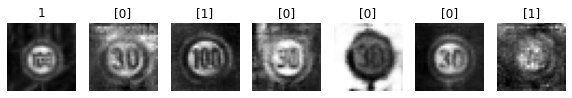

Epoch 70610 g_loss= 0.92984986 d_loss= 1.1547611 real_acc= 0.76 fake_acc= 0.52
Epoch 70620 g_loss= 1.0206895 d_loss= 1.1536903 real_acc= 0.66 fake_acc= 0.7
Epoch 70630 g_loss= 0.89709014 d_loss= 1.1585343 real_acc= 0.84 fake_acc= 0.52
Epoch 70640 g_loss= 0.92787284 d_loss= 1.2316968 real_acc= 0.62 fake_acc= 0.68
Epoch 70650 g_loss= 0.949692 d_loss= 1.2315975 real_acc= 0.62 fake_acc= 0.68
Epoch 70660 g_loss= 0.97272766 d_loss= 1.1830374 real_acc= 0.66 fake_acc= 0.66
Epoch 70670 g_loss= 1.0759366 d_loss= 1.2413785 real_acc= 0.6 fake_acc= 0.64
Epoch 70680 g_loss= 1.1103177 d_loss= 1.2338364 real_acc= 0.6 fake_acc= 0.68
Epoch 70690 g_loss= 0.8532357 d_loss= 1.2733507 real_acc= 0.72 fake_acc= 0.56
Epoch 70700 g_loss= 1.0217098 d_loss= 1.268492 real_acc= 0.5 fake_acc= 0.62


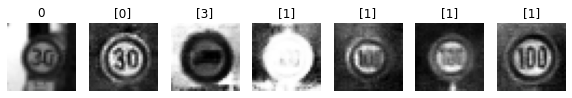

Epoch 70710 g_loss= 0.9763236 d_loss= 1.2349203 real_acc= 0.68 fake_acc= 0.66
Epoch 70720 g_loss= 0.88742685 d_loss= 1.268991 real_acc= 0.74 fake_acc= 0.6
Epoch 70730 g_loss= 1.2514405 d_loss= 1.1837513 real_acc= 0.6 fake_acc= 0.78
Epoch 70740 g_loss= 0.9734596 d_loss= 1.0603615 real_acc= 0.84 fake_acc= 0.64
Epoch 70750 g_loss= 1.211288 d_loss= 1.0964854 real_acc= 0.58 fake_acc= 0.8
Epoch 70760 g_loss= 1.1295555 d_loss= 1.2278386 real_acc= 0.6 fake_acc= 0.74
Epoch 70770 g_loss= 0.93314135 d_loss= 1.2404478 real_acc= 0.76 fake_acc= 0.64
Epoch 70780 g_loss= 0.9615898 d_loss= 1.2368724 real_acc= 0.6 fake_acc= 0.66
Epoch 70790 g_loss= 0.8743943 d_loss= 1.2627933 real_acc= 0.68 fake_acc= 0.64
Epoch 70800 g_loss= 1.0446105 d_loss= 1.1064727 real_acc= 0.7 fake_acc= 0.62


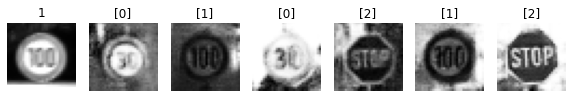

Epoch 70810 g_loss= 1.1973674 d_loss= 1.1898831 real_acc= 0.6 fake_acc= 0.8
Epoch 70820 g_loss= 0.9657138 d_loss= 1.0840962 real_acc= 0.76 fake_acc= 0.68
Epoch 70830 g_loss= 1.0109379 d_loss= 1.1615518 real_acc= 0.7 fake_acc= 0.72
Epoch 70840 g_loss= 1.0695355 d_loss= 1.1959927 real_acc= 0.56 fake_acc= 0.78
Epoch 70850 g_loss= 1.0149205 d_loss= 1.1554954 real_acc= 0.7 fake_acc= 0.62
Epoch 70860 g_loss= 1.1626912 d_loss= 1.1524699 real_acc= 0.64 fake_acc= 0.62
Epoch 70870 g_loss= 1.0787706 d_loss= 1.2067373 real_acc= 0.74 fake_acc= 0.7
Epoch 70880 g_loss= 0.92967546 d_loss= 1.1453311 real_acc= 0.8 fake_acc= 0.6
Epoch 70890 g_loss= 0.98197234 d_loss= 1.1001267 real_acc= 0.78 fake_acc= 0.72
Epoch 70900 g_loss= 1.174103 d_loss= 1.2205575 real_acc= 0.54 fake_acc= 0.8


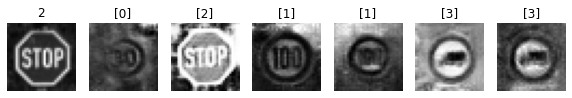

Epoch 70910 g_loss= 0.99046725 d_loss= 1.1331656 real_acc= 0.84 fake_acc= 0.54
Epoch 70920 g_loss= 1.0197328 d_loss= 1.2048552 real_acc= 0.74 fake_acc= 0.66
Epoch 70930 g_loss= 0.94944435 d_loss= 1.2025843 real_acc= 0.64 fake_acc= 0.68
Epoch 70940 g_loss= 1.1120553 d_loss= 1.1106968 real_acc= 0.7 fake_acc= 0.78
Epoch 70950 g_loss= 1.0180563 d_loss= 1.2269301 real_acc= 0.68 fake_acc= 0.6
Epoch 70960 g_loss= 1.0171734 d_loss= 1.2329333 real_acc= 0.56 fake_acc= 0.7
Epoch 70970 g_loss= 1.2319863 d_loss= 1.0594171 real_acc= 0.68 fake_acc= 0.72
Epoch 70980 g_loss= 0.9466147 d_loss= 1.2216296 real_acc= 0.66 fake_acc= 0.56
Epoch 70990 g_loss= 1.3058138 d_loss= 1.0498989 real_acc= 0.72 fake_acc= 0.78
Epoch 71000 g_loss= 1.0909975 d_loss= 1.1931489 real_acc= 0.56 fake_acc= 0.7


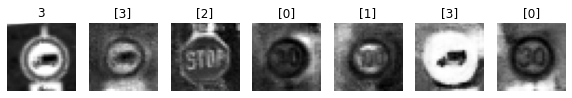

Epoch 71010 g_loss= 0.95023996 d_loss= 1.2957559 real_acc= 0.54 fake_acc= 0.6
Epoch 71020 g_loss= 0.9221472 d_loss= 1.1292818 real_acc= 0.8 fake_acc= 0.6
Epoch 71030 g_loss= 1.1745062 d_loss= 1.1066687 real_acc= 0.7 fake_acc= 0.74
Epoch 71040 g_loss= 1.2080033 d_loss= 1.1159486 real_acc= 0.58 fake_acc= 0.76
Epoch 71050 g_loss= 1.0341485 d_loss= 1.2786708 real_acc= 0.6 fake_acc= 0.62
Epoch 71060 g_loss= 0.844371 d_loss= 1.2873064 real_acc= 0.72 fake_acc= 0.54
Epoch 71070 g_loss= 0.9816432 d_loss= 1.2542331 real_acc= 0.58 fake_acc= 0.64
Epoch 71080 g_loss= 1.1590536 d_loss= 1.0036178 real_acc= 0.78 fake_acc= 0.84
Epoch 71090 g_loss= 1.0339212 d_loss= 1.2081357 real_acc= 0.66 fake_acc= 0.68
Epoch 71100 g_loss= 1.0122197 d_loss= 1.1831226 real_acc= 0.7 fake_acc= 0.6


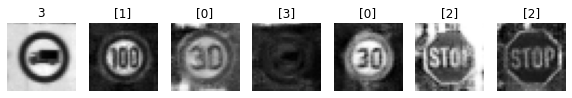

Epoch 71110 g_loss= 0.9312075 d_loss= 1.1759343 real_acc= 0.78 fake_acc= 0.68
Epoch 71120 g_loss= 1.0699685 d_loss= 1.1528205 real_acc= 0.66 fake_acc= 0.7
Epoch 71130 g_loss= 0.9060355 d_loss= 1.2890677 real_acc= 0.54 fake_acc= 0.56
Epoch 71140 g_loss= 0.9148312 d_loss= 1.2048571 real_acc= 0.62 fake_acc= 0.6
Epoch 71150 g_loss= 1.1740667 d_loss= 1.151896 real_acc= 0.58 fake_acc= 0.78
Epoch 71160 g_loss= 1.1788936 d_loss= 1.1305668 real_acc= 0.72 fake_acc= 0.66
Epoch 71170 g_loss= 0.8425612 d_loss= 1.2708454 real_acc= 0.72 fake_acc= 0.44
Epoch 71180 g_loss= 1.1025181 d_loss= 1.2054263 real_acc= 0.6 fake_acc= 0.66
Epoch 71190 g_loss= 1.1694508 d_loss= 1.239287 real_acc= 0.6 fake_acc= 0.7
Epoch 71200 g_loss= 1.0771308 d_loss= 1.020183 real_acc= 0.86 fake_acc= 0.62


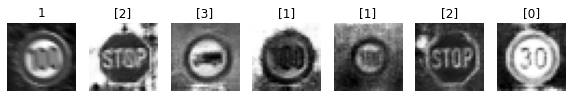

Epoch 71210 g_loss= 1.1368442 d_loss= 1.0465113 real_acc= 0.62 fake_acc= 0.7
Epoch 71220 g_loss= 1.1272368 d_loss= 1.2059593 real_acc= 0.56 fake_acc= 0.7
Epoch 71230 g_loss= 1.0556582 d_loss= 1.195308 real_acc= 0.66 fake_acc= 0.66
Epoch 71240 g_loss= 0.99516386 d_loss= 1.1136715 real_acc= 0.74 fake_acc= 0.62
Epoch 71250 g_loss= 1.2029274 d_loss= 1.0909839 real_acc= 0.7 fake_acc= 0.74
Epoch 71260 g_loss= 0.968238 d_loss= 1.138675 real_acc= 0.78 fake_acc= 0.6
Epoch 71270 g_loss= 1.0793301 d_loss= 1.167517 real_acc= 0.7 fake_acc= 0.72
Epoch 71280 g_loss= 0.9665272 d_loss= 1.143674 real_acc= 0.74 fake_acc= 0.58
Epoch 71290 g_loss= 0.9306214 d_loss= 1.2028898 real_acc= 0.72 fake_acc= 0.68
Epoch 71300 g_loss= 0.89804476 d_loss= 1.2092586 real_acc= 0.6 fake_acc= 0.56


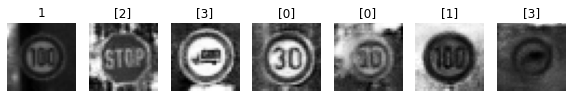

Epoch 71310 g_loss= 1.0724134 d_loss= 1.1113214 real_acc= 0.66 fake_acc= 0.76
Epoch 71320 g_loss= 1.0279142 d_loss= 1.2673349 real_acc= 0.58 fake_acc= 0.64
Epoch 71330 g_loss= 1.1544505 d_loss= 0.91960835 real_acc= 0.8 fake_acc= 0.74
Epoch 71340 g_loss= 0.933162 d_loss= 1.1504228 real_acc= 0.76 fake_acc= 0.58
Epoch 71350 g_loss= 1.0878376 d_loss= 1.1059886 real_acc= 0.8 fake_acc= 0.7
Epoch 71360 g_loss= 1.1598378 d_loss= 1.2541119 real_acc= 0.64 fake_acc= 0.7
Epoch 71370 g_loss= 1.1300707 d_loss= 1.1096607 real_acc= 0.58 fake_acc= 0.76
Epoch 71380 g_loss= 0.9693638 d_loss= 1.0139618 real_acc= 0.88 fake_acc= 0.56
Epoch 71390 g_loss= 1.2035679 d_loss= 1.062711 real_acc= 0.7 fake_acc= 0.66
Epoch 71400 g_loss= 1.2146237 d_loss= 1.0453283 real_acc= 0.72 fake_acc= 0.86


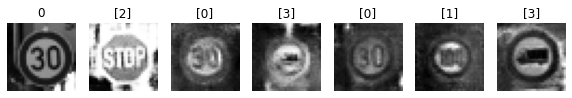

Epoch 71410 g_loss= 0.9218015 d_loss= 1.100211 real_acc= 0.8 fake_acc= 0.66
Epoch 71420 g_loss= 0.92517966 d_loss= 1.1025828 real_acc= 0.86 fake_acc= 0.62
Epoch 71430 g_loss= 1.1416801 d_loss= 1.0965686 real_acc= 0.62 fake_acc= 0.72
Epoch 71440 g_loss= 0.89854723 d_loss= 1.1878552 real_acc= 0.72 fake_acc= 0.6
Epoch 71450 g_loss= 1.0411918 d_loss= 1.1392645 real_acc= 0.64 fake_acc= 0.74
Epoch 71460 g_loss= 1.1679875 d_loss= 1.0940828 real_acc= 0.62 fake_acc= 0.7
Epoch 71470 g_loss= 1.0139942 d_loss= 1.0741876 real_acc= 0.82 fake_acc= 0.68
Epoch 71480 g_loss= 1.0317894 d_loss= 1.1250081 real_acc= 0.72 fake_acc= 0.68
Epoch 71490 g_loss= 1.1203237 d_loss= 1.072677 real_acc= 0.7 fake_acc= 0.74
Epoch 71500 g_loss= 0.93549705 d_loss= 1.1825721 real_acc= 0.72 fake_acc= 0.6


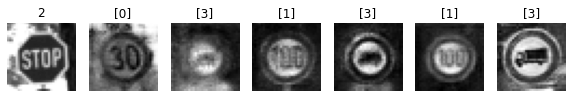

Epoch 71510 g_loss= 0.93434983 d_loss= 1.059261 real_acc= 0.84 fake_acc= 0.58
Epoch 71520 g_loss= 0.9996597 d_loss= 1.1852331 real_acc= 0.64 fake_acc= 0.68
Epoch 71530 g_loss= 1.1389493 d_loss= 1.0978341 real_acc= 0.68 fake_acc= 0.76
Epoch 71540 g_loss= 1.0730078 d_loss= 1.1388605 real_acc= 0.66 fake_acc= 0.64
Epoch 71550 g_loss= 1.0187831 d_loss= 1.1209753 real_acc= 0.68 fake_acc= 0.66
Epoch 71560 g_loss= 0.99498177 d_loss= 1.2756469 real_acc= 0.6 fake_acc= 0.7
Epoch 71570 g_loss= 1.0603088 d_loss= 1.1040406 real_acc= 0.72 fake_acc= 0.68
Epoch 71580 g_loss= 1.0127586 d_loss= 1.1556028 real_acc= 0.68 fake_acc= 0.64
Epoch 71590 g_loss= 1.021989 d_loss= 1.1150186 real_acc= 0.7 fake_acc= 0.76
Epoch 71600 g_loss= 1.0343099 d_loss= 1.2040173 real_acc= 0.7 fake_acc= 0.62


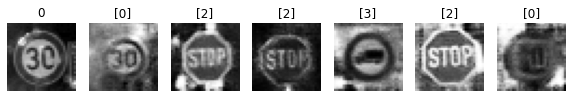

Epoch 71610 g_loss= 1.0846758 d_loss= 1.11203 real_acc= 0.66 fake_acc= 0.7
Epoch 71620 g_loss= 1.1400377 d_loss= 0.96529186 real_acc= 0.76 fake_acc= 0.82
Epoch 71630 g_loss= 1.0514841 d_loss= 1.1097038 real_acc= 0.78 fake_acc= 0.68
Epoch 71640 g_loss= 1.0044931 d_loss= 1.192117 real_acc= 0.62 fake_acc= 0.72
Epoch 71650 g_loss= 1.0831633 d_loss= 1.0631596 real_acc= 0.76 fake_acc= 0.76
Epoch 71660 g_loss= 1.0049832 d_loss= 1.2026498 real_acc= 0.78 fake_acc= 0.6
Epoch 71670 g_loss= 0.9806607 d_loss= 1.1222664 real_acc= 0.88 fake_acc= 0.58
Epoch 71680 g_loss= 1.1302884 d_loss= 1.2421962 real_acc= 0.5 fake_acc= 0.8
Epoch 71690 g_loss= 1.0047178 d_loss= 1.2720716 real_acc= 0.56 fake_acc= 0.68
Epoch 71700 g_loss= 1.1207283 d_loss= 1.1053096 real_acc= 0.64 fake_acc= 0.74


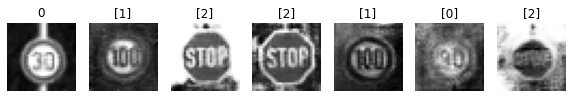

Epoch 71710 g_loss= 1.0366762 d_loss= 1.1121038 real_acc= 0.76 fake_acc= 0.6
Epoch 71720 g_loss= 0.99202186 d_loss= 1.23162 real_acc= 0.76 fake_acc= 0.58
Epoch 71730 g_loss= 1.0370423 d_loss= 1.2108269 real_acc= 0.64 fake_acc= 0.66
Epoch 71740 g_loss= 1.1406988 d_loss= 1.0584116 real_acc= 0.72 fake_acc= 0.68
Epoch 71750 g_loss= 1.2790177 d_loss= 1.1625922 real_acc= 0.56 fake_acc= 0.78
Epoch 71760 g_loss= 0.9917667 d_loss= 1.2044661 real_acc= 0.66 fake_acc= 0.6
Epoch 71770 g_loss= 0.97422963 d_loss= 1.13505 real_acc= 0.76 fake_acc= 0.64
Epoch 71780 g_loss= 1.2845763 d_loss= 1.3488152 real_acc= 0.48 fake_acc= 0.76
Epoch 71790 g_loss= 0.9297142 d_loss= 1.176379 real_acc= 0.72 fake_acc= 0.68
Epoch 71800 g_loss= 1.0625825 d_loss= 0.9988258 real_acc= 0.82 fake_acc= 0.74


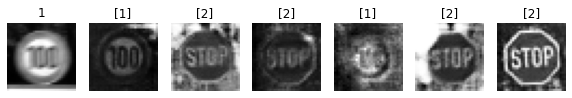

Epoch 71810 g_loss= 1.1534978 d_loss= 1.3004416 real_acc= 0.54 fake_acc= 0.68
Epoch 71820 g_loss= 1.0887933 d_loss= 1.070456 real_acc= 0.78 fake_acc= 0.66
Epoch 71830 g_loss= 1.1056467 d_loss= 1.1896329 real_acc= 0.7 fake_acc= 0.62
Epoch 71840 g_loss= 1.1889658 d_loss= 1.1343815 real_acc= 0.64 fake_acc= 0.74
Epoch 71850 g_loss= 1.0336815 d_loss= 1.1282871 real_acc= 0.76 fake_acc= 0.68
Epoch 71860 g_loss= 0.9252251 d_loss= 1.2547414 real_acc= 0.82 fake_acc= 0.56
Epoch 71870 g_loss= 1.0044129 d_loss= 1.1304815 real_acc= 0.76 fake_acc= 0.74
Epoch 71880 g_loss= 1.1501337 d_loss= 1.0717986 real_acc= 0.64 fake_acc= 0.76
Epoch 71890 g_loss= 1.0529643 d_loss= 1.3054116 real_acc= 0.58 fake_acc= 0.7
Epoch 71900 g_loss= 0.98347116 d_loss= 1.2108353 real_acc= 0.74 fake_acc= 0.58


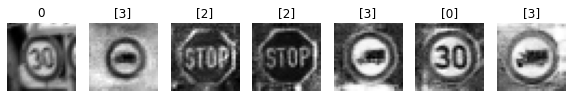

Epoch 71910 g_loss= 1.1285422 d_loss= 1.0505486 real_acc= 0.72 fake_acc= 0.8
Epoch 71920 g_loss= 1.0057262 d_loss= 1.2258211 real_acc= 0.66 fake_acc= 0.58
Epoch 71930 g_loss= 1.0776216 d_loss= 1.1592385 real_acc= 0.68 fake_acc= 0.68
Epoch 71940 g_loss= 1.1608174 d_loss= 1.0618031 real_acc= 0.76 fake_acc= 0.78
Epoch 71950 g_loss= 0.9862534 d_loss= 1.0781469 real_acc= 0.86 fake_acc= 0.56
Epoch 71960 g_loss= 1.1528858 d_loss= 1.1684513 real_acc= 0.64 fake_acc= 0.64
Epoch 71970 g_loss= 1.058111 d_loss= 1.2854614 real_acc= 0.6 fake_acc= 0.64
Epoch 71980 g_loss= 0.9542971 d_loss= 1.166322 real_acc= 0.68 fake_acc= 0.56
Epoch 71990 g_loss= 1.2025102 d_loss= 1.3262832 real_acc= 0.48 fake_acc= 0.84
Epoch 72000 g_loss= 1.0349809 d_loss= 1.1498187 real_acc= 0.74 fake_acc= 0.64


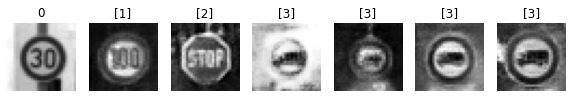

Epoch 72010 g_loss= 0.9256908 d_loss= 1.167119 real_acc= 0.68 fake_acc= 0.64
Epoch 72020 g_loss= 0.916757 d_loss= 1.1659372 real_acc= 0.7 fake_acc= 0.66
Epoch 72030 g_loss= 1.1914887 d_loss= 1.2184753 real_acc= 0.54 fake_acc= 0.78
Epoch 72040 g_loss= 1.0030993 d_loss= 1.1487062 real_acc= 0.82 fake_acc= 0.6
Epoch 72050 g_loss= 1.1510835 d_loss= 1.18173 real_acc= 0.64 fake_acc= 0.68
Epoch 72060 g_loss= 1.2315636 d_loss= 1.0206122 real_acc= 0.76 fake_acc= 0.72
Epoch 72070 g_loss= 0.9391325 d_loss= 1.1729099 real_acc= 0.68 fake_acc= 0.5
Epoch 72080 g_loss= 1.2352257 d_loss= 1.1473918 real_acc= 0.54 fake_acc= 0.76
Epoch 72090 g_loss= 0.96424764 d_loss= 1.1732683 real_acc= 0.66 fake_acc= 0.64
Epoch 72100 g_loss= 0.98843354 d_loss= 1.0692437 real_acc= 0.82 fake_acc= 0.62


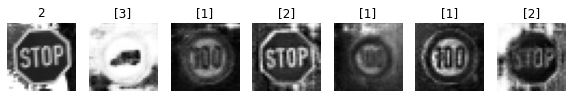

Epoch 72110 g_loss= 1.176172 d_loss= 1.1989237 real_acc= 0.56 fake_acc= 0.8
Epoch 72120 g_loss= 1.1723428 d_loss= 1.234335 real_acc= 0.58 fake_acc= 0.78
Epoch 72130 g_loss= 1.0693183 d_loss= 1.1001847 real_acc= 0.84 fake_acc= 0.7
Epoch 72140 g_loss= 1.0909144 d_loss= 1.2023644 real_acc= 0.7 fake_acc= 0.68
Epoch 72150 g_loss= 1.1433196 d_loss= 1.2107418 real_acc= 0.58 fake_acc= 0.68
Epoch 72160 g_loss= 1.1345407 d_loss= 1.1996939 real_acc= 0.66 fake_acc= 0.74
Epoch 72170 g_loss= 1.040469 d_loss= 1.1058002 real_acc= 0.78 fake_acc= 0.62
Epoch 72180 g_loss= 1.0002605 d_loss= 1.3311198 real_acc= 0.6 fake_acc= 0.6
Epoch 72190 g_loss= 1.0608268 d_loss= 1.1756351 real_acc= 0.64 fake_acc= 0.68
Epoch 72200 g_loss= 0.93797857 d_loss= 1.1374767 real_acc= 0.72 fake_acc= 0.66


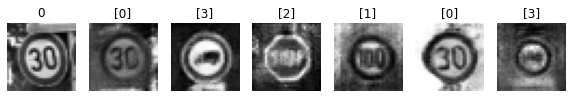

Epoch 72210 g_loss= 1.1627069 d_loss= 1.1269432 real_acc= 0.66 fake_acc= 0.7
Epoch 72220 g_loss= 1.124096 d_loss= 0.9781999 real_acc= 0.88 fake_acc= 0.68
Epoch 72230 g_loss= 1.0395848 d_loss= 1.1438886 real_acc= 0.68 fake_acc= 0.74
Epoch 72240 g_loss= 1.0266548 d_loss= 1.2040008 real_acc= 0.62 fake_acc= 0.86
Epoch 72250 g_loss= 1.1729748 d_loss= 1.1700646 real_acc= 0.68 fake_acc= 0.8
Epoch 72260 g_loss= 1.2615577 d_loss= 1.1275024 real_acc= 0.74 fake_acc= 0.76
Epoch 72270 g_loss= 1.1842103 d_loss= 1.0943911 real_acc= 0.74 fake_acc= 0.72
Epoch 72280 g_loss= 1.1442063 d_loss= 1.096854 real_acc= 0.76 fake_acc= 0.72
Epoch 72290 g_loss= 0.8335618 d_loss= 1.3744495 real_acc= 0.64 fake_acc= 0.54
Epoch 72300 g_loss= 1.1020589 d_loss= 1.2416563 real_acc= 0.56 fake_acc= 0.76


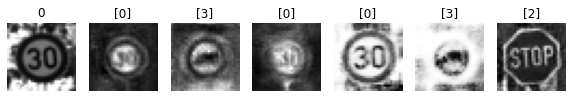

Epoch 72310 g_loss= 1.0492598 d_loss= 1.136556 real_acc= 0.64 fake_acc= 0.66
Epoch 72320 g_loss= 1.0019249 d_loss= 1.1038936 real_acc= 0.74 fake_acc= 0.6
Epoch 72330 g_loss= 1.3238088 d_loss= 1.0105461 real_acc= 0.7 fake_acc= 0.8
Epoch 72340 g_loss= 0.98903376 d_loss= 1.0431383 real_acc= 0.8 fake_acc= 0.74
Epoch 72350 g_loss= 0.9055493 d_loss= 1.2298064 real_acc= 0.76 fake_acc= 0.54
Epoch 72360 g_loss= 1.0327518 d_loss= 1.0419098 real_acc= 0.76 fake_acc= 0.68
Epoch 72370 g_loss= 1.0709437 d_loss= 1.0972431 real_acc= 0.78 fake_acc= 0.7
Epoch 72380 g_loss= 1.1170378 d_loss= 1.192191 real_acc= 0.56 fake_acc= 0.68
Epoch 72390 g_loss= 0.9545482 d_loss= 1.2511353 real_acc= 0.64 fake_acc= 0.64
Epoch 72400 g_loss= 1.1409017 d_loss= 1.1526117 real_acc= 0.66 fake_acc= 0.82


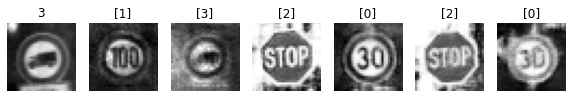

Epoch 72410 g_loss= 1.1147782 d_loss= 1.1429265 real_acc= 0.64 fake_acc= 0.82
Epoch 72420 g_loss= 0.93835145 d_loss= 1.170372 real_acc= 0.84 fake_acc= 0.52
Epoch 72430 g_loss= 1.1815548 d_loss= 1.0427003 real_acc= 0.72 fake_acc= 0.76
Epoch 72440 g_loss= 1.0690892 d_loss= 1.159434 real_acc= 0.7 fake_acc= 0.68
Epoch 72450 g_loss= 1.0818537 d_loss= 1.134503 real_acc= 0.68 fake_acc= 0.68
Epoch 72460 g_loss= 0.88183945 d_loss= 1.2436569 real_acc= 0.68 fake_acc= 0.56
Epoch 72470 g_loss= 1.13667 d_loss= 1.1032065 real_acc= 0.6 fake_acc= 0.74
Epoch 72480 g_loss= 1.0471983 d_loss= 1.1875927 real_acc= 0.72 fake_acc= 0.74
Epoch 72490 g_loss= 1.0421025 d_loss= 1.1672246 real_acc= 0.78 fake_acc= 0.66
Epoch 72500 g_loss= 1.1436303 d_loss= 1.1560752 real_acc= 0.58 fake_acc= 0.76


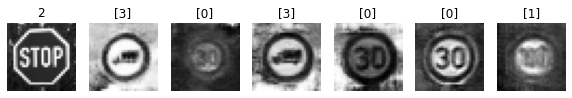

Epoch 72510 g_loss= 1.1386563 d_loss= 1.1715419 real_acc= 0.6 fake_acc= 0.7
Epoch 72520 g_loss= 1.0022694 d_loss= 1.174709 real_acc= 0.64 fake_acc= 0.66
Epoch 72530 g_loss= 0.86885667 d_loss= 1.1625135 real_acc= 0.76 fake_acc= 0.52
Epoch 72540 g_loss= 0.925539 d_loss= 1.1862638 real_acc= 0.68 fake_acc= 0.62
Epoch 72550 g_loss= 1.1696087 d_loss= 1.0840865 real_acc= 0.7 fake_acc= 0.72
Epoch 72560 g_loss= 0.99571973 d_loss= 1.1342807 real_acc= 0.8 fake_acc= 0.72
Epoch 72570 g_loss= 0.9959524 d_loss= 1.0585515 real_acc= 0.82 fake_acc= 0.76
Epoch 72580 g_loss= 1.0833071 d_loss= 1.1269946 real_acc= 0.62 fake_acc= 0.72
Epoch 72590 g_loss= 1.146742 d_loss= 1.0935776 real_acc= 0.58 fake_acc= 0.8
Epoch 72600 g_loss= 1.0419967 d_loss= 1.135299 real_acc= 0.78 fake_acc= 0.64


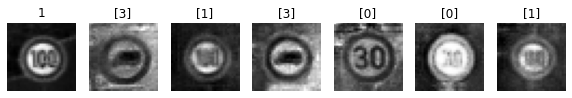

Epoch 72610 g_loss= 0.9336644 d_loss= 1.0920436 real_acc= 0.8 fake_acc= 0.66
Epoch 72620 g_loss= 0.9086103 d_loss= 1.228121 real_acc= 0.7 fake_acc= 0.64
Epoch 72630 g_loss= 0.90646416 d_loss= 1.1978879 real_acc= 0.72 fake_acc= 0.68
Epoch 72640 g_loss= 0.96962714 d_loss= 1.2805904 real_acc= 0.72 fake_acc= 0.54
Epoch 72650 g_loss= 1.0049735 d_loss= 1.1465805 real_acc= 0.76 fake_acc= 0.7
Epoch 72660 g_loss= 0.9612784 d_loss= 1.0810816 real_acc= 0.84 fake_acc= 0.72
Epoch 72670 g_loss= 1.0463086 d_loss= 1.156726 real_acc= 0.68 fake_acc= 0.64
Epoch 72680 g_loss= 1.198314 d_loss= 1.1668439 real_acc= 0.62 fake_acc= 0.74
Epoch 72690 g_loss= 1.1499228 d_loss= 1.3177309 real_acc= 0.48 fake_acc= 0.66
Epoch 72700 g_loss= 0.9448117 d_loss= 1.0973427 real_acc= 0.78 fake_acc= 0.62


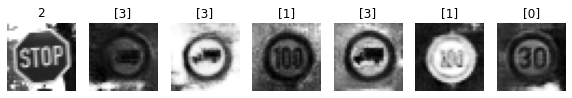

Epoch 72710 g_loss= 1.1074502 d_loss= 1.1839626 real_acc= 0.68 fake_acc= 0.66
Epoch 72720 g_loss= 1.0362772 d_loss= 1.1846333 real_acc= 0.7 fake_acc= 0.74
Epoch 72730 g_loss= 0.98951983 d_loss= 1.2531116 real_acc= 0.7 fake_acc= 0.64
Epoch 72740 g_loss= 1.0233921 d_loss= 1.141294 real_acc= 0.74 fake_acc= 0.66
Epoch 72750 g_loss= 0.90808517 d_loss= 1.3740699 real_acc= 0.64 fake_acc= 0.54
Epoch 72760 g_loss= 1.109265 d_loss= 1.1189144 real_acc= 0.68 fake_acc= 0.7
Epoch 72770 g_loss= 1.0985011 d_loss= 1.1027955 real_acc= 0.72 fake_acc= 0.72
Epoch 72780 g_loss= 0.9819721 d_loss= 1.1795719 real_acc= 0.72 fake_acc= 0.68
Epoch 72790 g_loss= 1.0238185 d_loss= 1.1194189 real_acc= 0.74 fake_acc= 0.64
Epoch 72800 g_loss= 1.1136088 d_loss= 1.2353523 real_acc= 0.58 fake_acc= 0.72


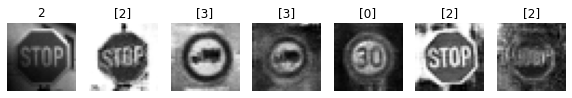

Epoch 72810 g_loss= 0.98537636 d_loss= 1.1426034 real_acc= 0.72 fake_acc= 0.66
Epoch 72820 g_loss= 1.0191942 d_loss= 1.2006884 real_acc= 0.64 fake_acc= 0.7
Epoch 72830 g_loss= 1.2293838 d_loss= 1.0209594 real_acc= 0.74 fake_acc= 0.82
Epoch 72840 g_loss= 1.0878047 d_loss= 1.0367117 real_acc= 0.8 fake_acc= 0.74
Epoch 72850 g_loss= 0.8173569 d_loss= 1.311753 real_acc= 0.68 fake_acc= 0.48
Epoch 72860 g_loss= 1.0560402 d_loss= 1.1189682 real_acc= 0.68 fake_acc= 0.68
Epoch 72870 g_loss= 1.095314 d_loss= 1.2490419 real_acc= 0.56 fake_acc= 0.74
Epoch 72880 g_loss= 1.0006927 d_loss= 1.1891595 real_acc= 0.76 fake_acc= 0.56
Epoch 72890 g_loss= 0.92962515 d_loss= 1.1622689 real_acc= 0.8 fake_acc= 0.66
Epoch 72900 g_loss= 1.0490237 d_loss= 1.2964635 real_acc= 0.56 fake_acc= 0.76


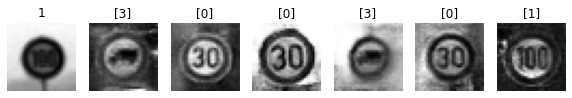

Epoch 72910 g_loss= 0.91312927 d_loss= 1.2374618 real_acc= 0.64 fake_acc= 0.56
Epoch 72920 g_loss= 0.9924657 d_loss= 1.2079163 real_acc= 0.62 fake_acc= 0.58
Epoch 72930 g_loss= 1.0620617 d_loss= 1.1915541 real_acc= 0.68 fake_acc= 0.7
Epoch 72940 g_loss= 1.024633 d_loss= 1.1091839 real_acc= 0.84 fake_acc= 0.7
Epoch 72950 g_loss= 1.0497667 d_loss= 1.1624647 real_acc= 0.7 fake_acc= 0.68
Epoch 72960 g_loss= 1.2026206 d_loss= 1.0565317 real_acc= 0.66 fake_acc= 0.8
Epoch 72970 g_loss= 1.0039314 d_loss= 1.1943398 real_acc= 0.72 fake_acc= 0.64
Epoch 72980 g_loss= 1.0510812 d_loss= 1.260391 real_acc= 0.62 fake_acc= 0.64
Epoch 72990 g_loss= 1.2466159 d_loss= 1.0652742 real_acc= 0.7 fake_acc= 0.84
Epoch 73000 g_loss= 0.9675104 d_loss= 1.1092234 real_acc= 0.84 fake_acc= 0.58


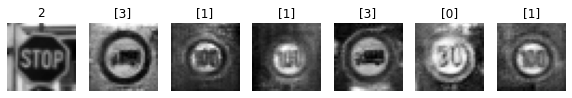

Epoch 73010 g_loss= 1.0231501 d_loss= 1.1134716 real_acc= 0.74 fake_acc= 0.62
Epoch 73020 g_loss= 1.0503623 d_loss= 1.1098835 real_acc= 0.76 fake_acc= 0.64
Epoch 73030 g_loss= 1.1104274 d_loss= 1.0755498 real_acc= 0.66 fake_acc= 0.74
Epoch 73040 g_loss= 1.0943328 d_loss= 1.1263766 real_acc= 0.68 fake_acc= 0.78
Epoch 73050 g_loss= 1.0168511 d_loss= 1.1619005 real_acc= 0.68 fake_acc= 0.72
Epoch 73060 g_loss= 1.1482204 d_loss= 1.093348 real_acc= 0.64 fake_acc= 0.7
Epoch 73070 g_loss= 1.0468888 d_loss= 1.14552 real_acc= 0.68 fake_acc= 0.7
Epoch 73080 g_loss= 0.9389344 d_loss= 1.253236 real_acc= 0.74 fake_acc= 0.5
Epoch 73090 g_loss= 1.119487 d_loss= 1.1095057 real_acc= 0.66 fake_acc= 0.78
Epoch 73100 g_loss= 1.0262009 d_loss= 1.2089763 real_acc= 0.68 fake_acc= 0.66


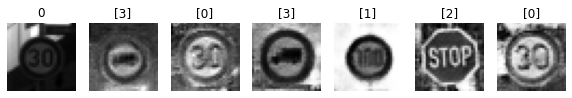

Epoch 73110 g_loss= 1.0044383 d_loss= 1.223861 real_acc= 0.68 fake_acc= 0.72
Epoch 73120 g_loss= 1.1324562 d_loss= 1.1095468 real_acc= 0.7 fake_acc= 0.76
Epoch 73130 g_loss= 0.93853647 d_loss= 1.0726122 real_acc= 0.76 fake_acc= 0.64
Epoch 73140 g_loss= 0.97902334 d_loss= 1.170894 real_acc= 0.64 fake_acc= 0.68
Epoch 73150 g_loss= 1.2184174 d_loss= 1.2697444 real_acc= 0.5 fake_acc= 0.8
Epoch 73160 g_loss= 1.1033672 d_loss= 1.1600269 real_acc= 0.64 fake_acc= 0.68
Epoch 73170 g_loss= 1.3421156 d_loss= 1.0096898 real_acc= 0.68 fake_acc= 0.78
Epoch 73180 g_loss= 0.981463 d_loss= 1.2178129 real_acc= 0.68 fake_acc= 0.64
Epoch 73190 g_loss= 1.0462953 d_loss= 1.1518083 real_acc= 0.72 fake_acc= 0.58
Epoch 73200 g_loss= 1.0384805 d_loss= 1.1689091 real_acc= 0.68 fake_acc= 0.58


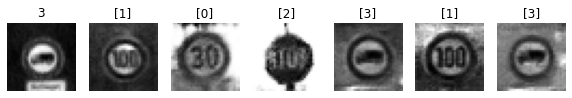

Epoch 73210 g_loss= 1.2151679 d_loss= 1.103678 real_acc= 0.76 fake_acc= 0.76
Epoch 73220 g_loss= 1.1055042 d_loss= 1.0353897 real_acc= 0.78 fake_acc= 0.8
Epoch 73230 g_loss= 1.0810367 d_loss= 1.2114804 real_acc= 0.64 fake_acc= 0.6
Epoch 73240 g_loss= 0.8910935 d_loss= 1.2091811 real_acc= 0.76 fake_acc= 0.54
Epoch 73250 g_loss= 0.996237 d_loss= 1.1577914 real_acc= 0.66 fake_acc= 0.62
Epoch 73260 g_loss= 1.180025 d_loss= 1.1136212 real_acc= 0.6 fake_acc= 0.76
Epoch 73270 g_loss= 1.2240434 d_loss= 1.1647105 real_acc= 0.56 fake_acc= 0.76
Epoch 73280 g_loss= 1.0122895 d_loss= 1.1069407 real_acc= 0.76 fake_acc= 0.66
Epoch 73290 g_loss= 1.122462 d_loss= 1.0966104 real_acc= 0.62 fake_acc= 0.76
Epoch 73300 g_loss= 0.7878658 d_loss= 1.2631147 real_acc= 0.68 fake_acc= 0.54


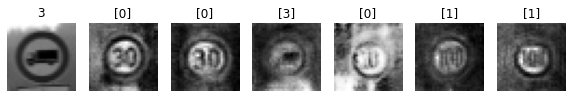

Epoch 73310 g_loss= 1.0632566 d_loss= 1.1974201 real_acc= 0.68 fake_acc= 0.66
Epoch 73320 g_loss= 1.0183257 d_loss= 1.1678517 real_acc= 0.58 fake_acc= 0.72
Epoch 73330 g_loss= 1.0297283 d_loss= 1.1391048 real_acc= 0.72 fake_acc= 0.72
Epoch 73340 g_loss= 1.0078098 d_loss= 1.1366196 real_acc= 0.72 fake_acc= 0.66
Epoch 73350 g_loss= 1.0593804 d_loss= 1.3029058 real_acc= 0.58 fake_acc= 0.7
Epoch 73360 g_loss= 1.0454587 d_loss= 1.105235 real_acc= 0.68 fake_acc= 0.64
Epoch 73370 g_loss= 1.0572542 d_loss= 1.2598246 real_acc= 0.56 fake_acc= 0.68
Epoch 73380 g_loss= 0.98972267 d_loss= 1.1918483 real_acc= 0.62 fake_acc= 0.64
Epoch 73390 g_loss= 1.0673865 d_loss= 1.1195952 real_acc= 0.74 fake_acc= 0.72
Epoch 73400 g_loss= 0.9951779 d_loss= 1.2893326 real_acc= 0.62 fake_acc= 0.6


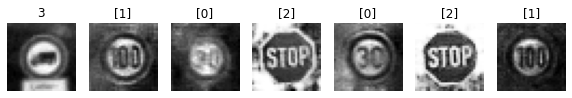

Epoch 73410 g_loss= 0.8831643 d_loss= 1.2732725 real_acc= 0.7 fake_acc= 0.48
Epoch 73420 g_loss= 1.1496733 d_loss= 1.0666103 real_acc= 0.8 fake_acc= 0.7
Epoch 73430 g_loss= 1.0970621 d_loss= 1.1444924 real_acc= 0.78 fake_acc= 0.6
Epoch 73440 g_loss= 1.009593 d_loss= 1.2558264 real_acc= 0.58 fake_acc= 0.74
Epoch 73450 g_loss= 1.03613 d_loss= 1.240337 real_acc= 0.62 fake_acc= 0.72
Epoch 73460 g_loss= 1.035153 d_loss= 1.1408346 real_acc= 0.7 fake_acc= 0.72
Epoch 73470 g_loss= 1.0519643 d_loss= 1.2421826 real_acc= 0.62 fake_acc= 0.8
Epoch 73480 g_loss= 1.134989 d_loss= 1.0629888 real_acc= 0.7 fake_acc= 0.76
Epoch 73490 g_loss= 1.0698347 d_loss= 1.1230915 real_acc= 0.72 fake_acc= 0.7
Epoch 73500 g_loss= 1.1144438 d_loss= 1.1486335 real_acc= 0.72 fake_acc= 0.62


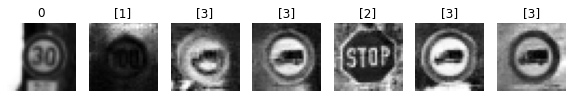

Epoch 73510 g_loss= 1.129909 d_loss= 1.1087592 real_acc= 0.72 fake_acc= 0.74
Epoch 73520 g_loss= 1.2116646 d_loss= 1.1079298 real_acc= 0.62 fake_acc= 0.74
Epoch 73530 g_loss= 1.028315 d_loss= 1.1718001 real_acc= 0.72 fake_acc= 0.7
Epoch 73540 g_loss= 1.0530658 d_loss= 1.0792851 real_acc= 0.78 fake_acc= 0.6
Epoch 73550 g_loss= 1.1194841 d_loss= 1.1114355 real_acc= 0.66 fake_acc= 0.74
Epoch 73560 g_loss= 1.129502 d_loss= 1.1909125 real_acc= 0.58 fake_acc= 0.7
Epoch 73570 g_loss= 0.9162915 d_loss= 1.1793925 real_acc= 0.72 fake_acc= 0.56
Epoch 73580 g_loss= 1.2139502 d_loss= 0.95187986 real_acc= 0.82 fake_acc= 0.76
Epoch 73590 g_loss= 1.1152968 d_loss= 1.144661 real_acc= 0.76 fake_acc= 0.72
Epoch 73600 g_loss= 0.99003595 d_loss= 1.208967 real_acc= 0.74 fake_acc= 0.46


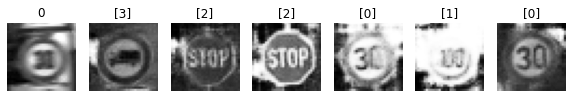

Epoch 73610 g_loss= 1.1518397 d_loss= 1.0149983 real_acc= 0.7 fake_acc= 0.72
Epoch 73620 g_loss= 1.1003473 d_loss= 1.2401649 real_acc= 0.64 fake_acc= 0.74
Epoch 73630 g_loss= 0.937512 d_loss= 1.1655682 real_acc= 0.84 fake_acc= 0.6
Epoch 73640 g_loss= 1.1151291 d_loss= 1.2088962 real_acc= 0.58 fake_acc= 0.7
Epoch 73650 g_loss= 1.0710258 d_loss= 1.2483325 real_acc= 0.54 fake_acc= 0.72
Epoch 73660 g_loss= 0.94179094 d_loss= 1.1475534 real_acc= 0.74 fake_acc= 0.56
Epoch 73670 g_loss= 0.86582834 d_loss= 1.1359136 real_acc= 0.8 fake_acc= 0.64
Epoch 73680 g_loss= 1.220533 d_loss= 1.1111723 real_acc= 0.58 fake_acc= 0.84
Epoch 73690 g_loss= 1.1448429 d_loss= 1.1240294 real_acc= 0.68 fake_acc= 0.78
Epoch 73700 g_loss= 1.0980521 d_loss= 1.1094673 real_acc= 0.7 fake_acc= 0.64


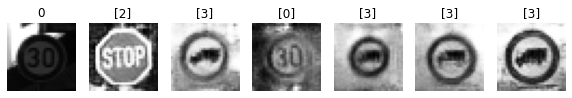

Epoch 73710 g_loss= 1.1262497 d_loss= 1.1846147 real_acc= 0.58 fake_acc= 0.66
Epoch 73720 g_loss= 0.9710125 d_loss= 1.053926 real_acc= 0.86 fake_acc= 0.62
Epoch 73730 g_loss= 1.0976379 d_loss= 1.0903499 real_acc= 0.66 fake_acc= 0.76
Epoch 73740 g_loss= 1.1901981 d_loss= 1.2021513 real_acc= 0.52 fake_acc= 0.82
Epoch 73750 g_loss= 1.0796278 d_loss= 1.1875396 real_acc= 0.6 fake_acc= 0.7
Epoch 73760 g_loss= 0.93898726 d_loss= 1.1957932 real_acc= 0.66 fake_acc= 0.66
Epoch 73770 g_loss= 1.0321459 d_loss= 1.1800866 real_acc= 0.64 fake_acc= 0.6
Epoch 73780 g_loss= 0.942221 d_loss= 1.2081869 real_acc= 0.66 fake_acc= 0.64
Epoch 73790 g_loss= 1.1552131 d_loss= 1.010647 real_acc= 0.76 fake_acc= 0.82
Epoch 73800 g_loss= 0.92712015 d_loss= 1.1757715 real_acc= 0.8 fake_acc= 0.56


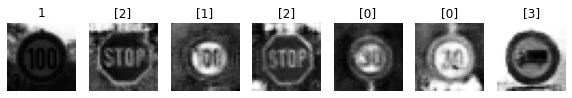

Epoch 73810 g_loss= 1.0684466 d_loss= 1.205432 real_acc= 0.62 fake_acc= 0.6
Epoch 73820 g_loss= 1.1774302 d_loss= 1.1353709 real_acc= 0.62 fake_acc= 0.7
Epoch 73830 g_loss= 1.0468552 d_loss= 1.2324394 real_acc= 0.68 fake_acc= 0.64
Epoch 73840 g_loss= 1.0961773 d_loss= 1.1833466 real_acc= 0.64 fake_acc= 0.68
Epoch 73850 g_loss= 0.9288417 d_loss= 1.1083643 real_acc= 0.78 fake_acc= 0.64
Epoch 73860 g_loss= 0.9573953 d_loss= 1.0878594 real_acc= 0.8 fake_acc= 0.72
Epoch 73870 g_loss= 0.9584356 d_loss= 1.3148172 real_acc= 0.58 fake_acc= 0.64
Epoch 73880 g_loss= 0.96699446 d_loss= 1.1527183 real_acc= 0.74 fake_acc= 0.62
Epoch 73890 g_loss= 0.9825472 d_loss= 1.1405824 real_acc= 0.8 fake_acc= 0.66
Epoch 73900 g_loss= 1.0596701 d_loss= 1.1650357 real_acc= 0.74 fake_acc= 0.72


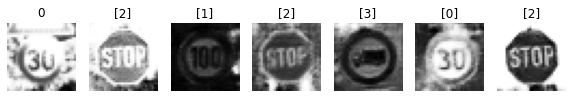

Epoch 73910 g_loss= 1.2347142 d_loss= 1.1741569 real_acc= 0.68 fake_acc= 0.78
Epoch 73920 g_loss= 0.9281251 d_loss= 1.1039147 real_acc= 0.82 fake_acc= 0.64
Epoch 73930 g_loss= 1.0407668 d_loss= 1.1368814 real_acc= 0.72 fake_acc= 0.7
Epoch 73940 g_loss= 1.0576187 d_loss= 1.1526315 real_acc= 0.66 fake_acc= 0.76
Epoch 73950 g_loss= 1.0568657 d_loss= 1.1885831 real_acc= 0.76 fake_acc= 0.64
Epoch 73960 g_loss= 0.96854883 d_loss= 1.0491985 real_acc= 0.76 fake_acc= 0.66
Epoch 73970 g_loss= 1.157455 d_loss= 1.2041883 real_acc= 0.74 fake_acc= 0.72
Epoch 73980 g_loss= 0.85881597 d_loss= 1.2583978 real_acc= 0.68 fake_acc= 0.56
Epoch 73990 g_loss= 0.8942394 d_loss= 1.1874142 real_acc= 0.68 fake_acc= 0.56
Epoch 74000 g_loss= 0.9089808 d_loss= 1.2611305 real_acc= 0.7 fake_acc= 0.5


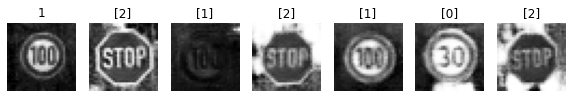

Epoch 74010 g_loss= 1.0181584 d_loss= 1.1530364 real_acc= 0.78 fake_acc= 0.6
Epoch 74020 g_loss= 1.2670919 d_loss= 1.0154017 real_acc= 0.7 fake_acc= 0.88
Epoch 74030 g_loss= 1.243238 d_loss= 1.004973 real_acc= 0.76 fake_acc= 0.76
Epoch 74040 g_loss= 1.0633091 d_loss= 1.1531564 real_acc= 0.7 fake_acc= 0.66
Epoch 74050 g_loss= 1.1274828 d_loss= 1.0844445 real_acc= 0.74 fake_acc= 0.78
Epoch 74060 g_loss= 1.1160698 d_loss= 1.1439269 real_acc= 0.6 fake_acc= 0.72
Epoch 74070 g_loss= 1.1276642 d_loss= 1.1751652 real_acc= 0.64 fake_acc= 0.72
Epoch 74080 g_loss= 1.2639289 d_loss= 1.2446023 real_acc= 0.58 fake_acc= 0.66
Epoch 74090 g_loss= 1.110191 d_loss= 1.0390043 real_acc= 0.84 fake_acc= 0.7
Epoch 74100 g_loss= 1.0435768 d_loss= 1.1802007 real_acc= 0.76 fake_acc= 0.6


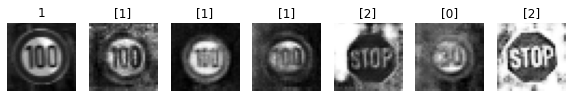

Epoch 74110 g_loss= 1.2109932 d_loss= 1.0886682 real_acc= 0.72 fake_acc= 0.76
Epoch 74120 g_loss= 1.3044642 d_loss= 1.1640341 real_acc= 0.6 fake_acc= 0.78
Epoch 74130 g_loss= 1.0097162 d_loss= 1.2022009 real_acc= 0.68 fake_acc= 0.72
Epoch 74140 g_loss= 1.0835019 d_loss= 1.1267898 real_acc= 0.7 fake_acc= 0.72
Epoch 74150 g_loss= 1.081002 d_loss= 1.1825867 real_acc= 0.66 fake_acc= 0.62
Epoch 74160 g_loss= 1.0412221 d_loss= 1.2055357 real_acc= 0.66 fake_acc= 0.64
Epoch 74170 g_loss= 1.0881083 d_loss= 1.0252331 real_acc= 0.68 fake_acc= 0.78
Epoch 74180 g_loss= 1.076421 d_loss= 1.0092524 real_acc= 0.86 fake_acc= 0.76
Epoch 74190 g_loss= 0.96003526 d_loss= 1.2053378 real_acc= 0.7 fake_acc= 0.62
Epoch 74200 g_loss= 1.0452844 d_loss= 1.1624458 real_acc= 0.66 fake_acc= 0.68


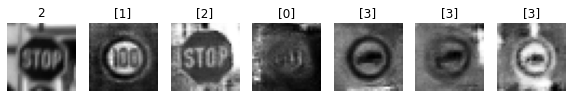

Epoch 74210 g_loss= 1.0925322 d_loss= 1.0001725 real_acc= 0.78 fake_acc= 0.76
Epoch 74220 g_loss= 1.127432 d_loss= 1.0720096 real_acc= 0.7 fake_acc= 0.7
Epoch 74230 g_loss= 0.96338934 d_loss= 1.1843 real_acc= 0.7 fake_acc= 0.56
Epoch 74240 g_loss= 0.864457 d_loss= 1.1959977 real_acc= 0.8 fake_acc= 0.58
Epoch 74250 g_loss= 1.0735469 d_loss= 1.2683308 real_acc= 0.6 fake_acc= 0.66
Epoch 74260 g_loss= 1.1752391 d_loss= 1.0720481 real_acc= 0.7 fake_acc= 0.78
Epoch 74270 g_loss= 1.0115726 d_loss= 1.2413744 real_acc= 0.68 fake_acc= 0.64
Epoch 74280 g_loss= 1.0653387 d_loss= 1.2281733 real_acc= 0.58 fake_acc= 0.64
Epoch 74290 g_loss= 0.92442596 d_loss= 1.2202262 real_acc= 0.7 fake_acc= 0.56
Epoch 74300 g_loss= 1.1657817 d_loss= 1.0810661 real_acc= 0.68 fake_acc= 0.84


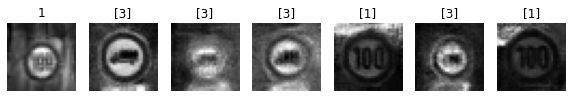

Epoch 74310 g_loss= 0.9447115 d_loss= 1.2394553 real_acc= 0.72 fake_acc= 0.56
Epoch 74320 g_loss= 1.2730725 d_loss= 1.0748422 real_acc= 0.68 fake_acc= 0.74
Epoch 74330 g_loss= 1.0327575 d_loss= 1.1010466 real_acc= 0.66 fake_acc= 0.72
Epoch 74340 g_loss= 1.1363173 d_loss= 1.1849148 real_acc= 0.62 fake_acc= 0.68
Epoch 74350 g_loss= 0.92088914 d_loss= 1.1942184 real_acc= 0.7 fake_acc= 0.58
Epoch 74360 g_loss= 1.1475769 d_loss= 1.14743 real_acc= 0.74 fake_acc= 0.72
Epoch 74370 g_loss= 1.1046994 d_loss= 1.0957154 real_acc= 0.72 fake_acc= 0.72
Epoch 74380 g_loss= 1.0285319 d_loss= 1.1780665 real_acc= 0.62 fake_acc= 0.62
Epoch 74390 g_loss= 0.88045555 d_loss= 1.2422767 real_acc= 0.78 fake_acc= 0.56
Epoch 74400 g_loss= 1.0613805 d_loss= 1.2054374 real_acc= 0.62 fake_acc= 0.64


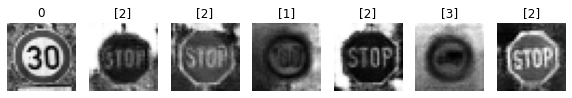

Epoch 74410 g_loss= 1.0750734 d_loss= 1.2719989 real_acc= 0.66 fake_acc= 0.64
Epoch 74420 g_loss= 0.9251756 d_loss= 1.2066712 real_acc= 0.82 fake_acc= 0.58
Epoch 74430 g_loss= 0.7678873 d_loss= 1.2454183 real_acc= 0.72 fake_acc= 0.48
Epoch 74440 g_loss= 0.88605005 d_loss= 1.2028365 real_acc= 0.74 fake_acc= 0.52
Epoch 74450 g_loss= 0.97937065 d_loss= 1.3574069 real_acc= 0.56 fake_acc= 0.54
Epoch 74460 g_loss= 1.0100813 d_loss= 1.2457701 real_acc= 0.74 fake_acc= 0.54
Epoch 74470 g_loss= 0.94895345 d_loss= 1.1976461 real_acc= 0.76 fake_acc= 0.56
Epoch 74480 g_loss= 1.0523564 d_loss= 1.1455033 real_acc= 0.72 fake_acc= 0.76
Epoch 74490 g_loss= 1.2731901 d_loss= 1.0729964 real_acc= 0.58 fake_acc= 0.88
Epoch 74500 g_loss= 1.2368951 d_loss= 0.91093427 real_acc= 0.86 fake_acc= 0.78


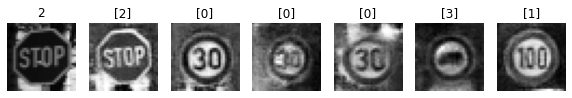

Epoch 74510 g_loss= 0.91477084 d_loss= 1.2512693 real_acc= 0.62 fake_acc= 0.56
Epoch 74520 g_loss= 1.0844492 d_loss= 1.0661538 real_acc= 0.68 fake_acc= 0.74
Epoch 74530 g_loss= 1.0907757 d_loss= 1.1321366 real_acc= 0.76 fake_acc= 0.72
Epoch 74540 g_loss= 1.1649406 d_loss= 1.1548948 real_acc= 0.62 fake_acc= 0.76
Epoch 74550 g_loss= 0.90853906 d_loss= 1.2642212 real_acc= 0.8 fake_acc= 0.62
Epoch 74560 g_loss= 1.0581428 d_loss= 1.1449108 real_acc= 0.76 fake_acc= 0.66
Epoch 74570 g_loss= 1.0769949 d_loss= 1.1138594 real_acc= 0.68 fake_acc= 0.7
Epoch 74580 g_loss= 0.9744993 d_loss= 1.2272416 real_acc= 0.66 fake_acc= 0.54
Epoch 74590 g_loss= 1.0569388 d_loss= 1.1264577 real_acc= 0.74 fake_acc= 0.68
Epoch 74600 g_loss= 1.1406137 d_loss= 1.1447463 real_acc= 0.7 fake_acc= 0.64


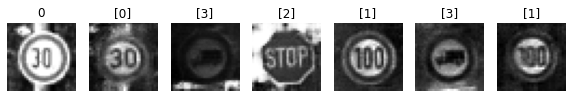

Epoch 74610 g_loss= 1.125096 d_loss= 1.1107037 real_acc= 0.72 fake_acc= 0.7
Epoch 74620 g_loss= 1.0717345 d_loss= 1.0495847 real_acc= 0.76 fake_acc= 0.72
Epoch 74630 g_loss= 0.9483854 d_loss= 1.2679455 real_acc= 0.74 fake_acc= 0.6
Epoch 74640 g_loss= 0.9534581 d_loss= 1.1926417 real_acc= 0.72 fake_acc= 0.62
Epoch 74650 g_loss= 1.0617942 d_loss= 1.1329644 real_acc= 0.62 fake_acc= 0.72
Epoch 74660 g_loss= 0.96080506 d_loss= 1.1019717 real_acc= 0.8 fake_acc= 0.58
Epoch 74670 g_loss= 0.8670576 d_loss= 1.3465257 real_acc= 0.68 fake_acc= 0.52
Epoch 74680 g_loss= 1.1405098 d_loss= 1.0683874 real_acc= 0.78 fake_acc= 0.74
Epoch 74690 g_loss= 1.1340065 d_loss= 1.0573146 real_acc= 0.74 fake_acc= 0.76
Epoch 74700 g_loss= 1.0223001 d_loss= 1.1426966 real_acc= 0.74 fake_acc= 0.7


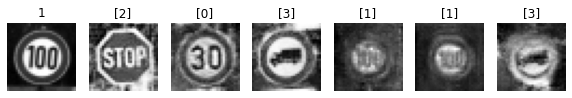

Epoch 74710 g_loss= 1.2125077 d_loss= 1.1300364 real_acc= 0.64 fake_acc= 0.74
Epoch 74720 g_loss= 0.95406747 d_loss= 1.1500882 real_acc= 0.7 fake_acc= 0.58
Epoch 74730 g_loss= 0.95487356 d_loss= 1.1033957 real_acc= 0.68 fake_acc= 0.58
Epoch 74740 g_loss= 1.1779609 d_loss= 1.1470486 real_acc= 0.6 fake_acc= 0.74
Epoch 74750 g_loss= 1.2889639 d_loss= 1.0967443 real_acc= 0.64 fake_acc= 0.84
Epoch 74760 g_loss= 0.99779725 d_loss= 1.1079774 real_acc= 0.66 fake_acc= 0.68
Epoch 74770 g_loss= 0.955753 d_loss= 1.208963 real_acc= 0.64 fake_acc= 0.64
Epoch 74780 g_loss= 0.9149947 d_loss= 1.3857412 real_acc= 0.54 fake_acc= 0.6
Epoch 74790 g_loss= 0.81947726 d_loss= 1.2036979 real_acc= 0.78 fake_acc= 0.54
Epoch 74800 g_loss= 1.0073607 d_loss= 1.16174 real_acc= 0.74 fake_acc= 0.6


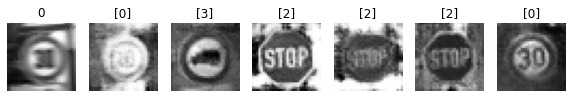

Epoch 74810 g_loss= 1.0323043 d_loss= 1.1492673 real_acc= 0.72 fake_acc= 0.66
Epoch 74820 g_loss= 1.1406639 d_loss= 1.1579156 real_acc= 0.72 fake_acc= 0.66
Epoch 74830 g_loss= 0.9945031 d_loss= 1.2891157 real_acc= 0.66 fake_acc= 0.54
Epoch 74840 g_loss= 1.0899369 d_loss= 1.093888 real_acc= 0.7 fake_acc= 0.7
Epoch 74850 g_loss= 0.9041585 d_loss= 1.2195852 real_acc= 0.7 fake_acc= 0.62
Epoch 74860 g_loss= 1.006103 d_loss= 1.147589 real_acc= 0.72 fake_acc= 0.62
Epoch 74870 g_loss= 1.0088543 d_loss= 1.2538785 real_acc= 0.74 fake_acc= 0.64
Epoch 74880 g_loss= 0.9286712 d_loss= 0.9823301 real_acc= 0.9 fake_acc= 0.56
Epoch 74890 g_loss= 0.8641309 d_loss= 1.3515103 real_acc= 0.7 fake_acc= 0.52
Epoch 74900 g_loss= 0.9604887 d_loss= 1.1458155 real_acc= 0.68 fake_acc= 0.68


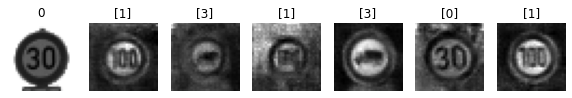

Epoch 74910 g_loss= 0.857908 d_loss= 1.1137935 real_acc= 0.92 fake_acc= 0.5
Epoch 74920 g_loss= 1.0983357 d_loss= 1.1252128 real_acc= 0.8 fake_acc= 0.72
Epoch 74930 g_loss= 1.1780994 d_loss= 1.064593 real_acc= 0.62 fake_acc= 0.68
Epoch 74940 g_loss= 1.0531468 d_loss= 1.08333 real_acc= 0.72 fake_acc= 0.8
Epoch 74950 g_loss= 1.0531977 d_loss= 1.0931997 real_acc= 0.74 fake_acc= 0.66
Epoch 74960 g_loss= 1.1112522 d_loss= 1.2152631 real_acc= 0.58 fake_acc= 0.76
Epoch 74970 g_loss= 0.8709128 d_loss= 1.3353453 real_acc= 0.64 fake_acc= 0.52
Epoch 74980 g_loss= 1.1253489 d_loss= 1.1242567 real_acc= 0.72 fake_acc= 0.78
Epoch 74990 g_loss= 0.97902817 d_loss= 1.2213018 real_acc= 0.68 fake_acc= 0.64
Epoch 75000 g_loss= 1.0863848 d_loss= 1.007429 real_acc= 0.8 fake_acc= 0.66


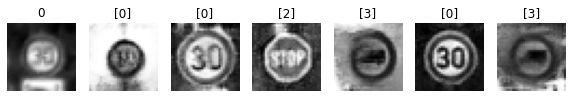

Epoch 75010 g_loss= 1.0654442 d_loss= 1.1615293 real_acc= 0.66 fake_acc= 0.7
Epoch 75020 g_loss= 0.9302295 d_loss= 1.1862184 real_acc= 0.7 fake_acc= 0.66
Epoch 75030 g_loss= 0.9794085 d_loss= 1.2380296 real_acc= 0.62 fake_acc= 0.68
Epoch 75040 g_loss= 0.9409022 d_loss= 1.1132519 real_acc= 0.76 fake_acc= 0.58
Epoch 75050 g_loss= 1.0328271 d_loss= 1.1162095 real_acc= 0.7 fake_acc= 0.74
Epoch 75060 g_loss= 1.1167966 d_loss= 1.0529792 real_acc= 0.7 fake_acc= 0.74
Epoch 75070 g_loss= 1.0264167 d_loss= 1.0696632 real_acc= 0.8 fake_acc= 0.64
Epoch 75080 g_loss= 1.0782161 d_loss= 1.2725837 real_acc= 0.5 fake_acc= 0.66
Epoch 75090 g_loss= 1.0695033 d_loss= 1.2242675 real_acc= 0.56 fake_acc= 0.68
Epoch 75100 g_loss= 1.033393 d_loss= 1.0976155 real_acc= 0.7 fake_acc= 0.62


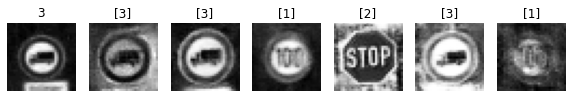

Epoch 75110 g_loss= 1.129594 d_loss= 1.1132901 real_acc= 0.78 fake_acc= 0.72
Epoch 75120 g_loss= 1.056221 d_loss= 0.99326986 real_acc= 0.9 fake_acc= 0.66
Epoch 75130 g_loss= 1.1374271 d_loss= 1.0512702 real_acc= 0.78 fake_acc= 0.78
Epoch 75140 g_loss= 1.1039646 d_loss= 1.0801699 real_acc= 0.78 fake_acc= 0.72
Epoch 75150 g_loss= 1.0772413 d_loss= 1.1496782 real_acc= 0.78 fake_acc= 0.66
Epoch 75160 g_loss= 1.102566 d_loss= 1.2814665 real_acc= 0.46 fake_acc= 0.78
Epoch 75170 g_loss= 0.9344218 d_loss= 1.255576 real_acc= 0.64 fake_acc= 0.64
Epoch 75180 g_loss= 0.9624244 d_loss= 1.1288035 real_acc= 0.7 fake_acc= 0.68
Epoch 75190 g_loss= 1.1831219 d_loss= 1.1863236 real_acc= 0.74 fake_acc= 0.64
Epoch 75200 g_loss= 0.9076054 d_loss= 1.215586 real_acc= 0.7 fake_acc= 0.56


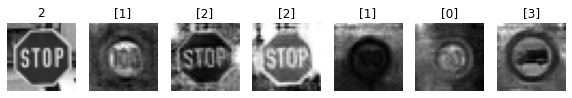

Epoch 75210 g_loss= 0.9871167 d_loss= 1.1897937 real_acc= 0.6 fake_acc= 0.74
Epoch 75220 g_loss= 0.88010836 d_loss= 1.2547697 real_acc= 0.62 fake_acc= 0.54
Epoch 75230 g_loss= 1.1101457 d_loss= 1.188937 real_acc= 0.7 fake_acc= 0.76
Epoch 75240 g_loss= 1.1692939 d_loss= 1.0703512 real_acc= 0.64 fake_acc= 0.82
Epoch 75250 g_loss= 0.93704796 d_loss= 1.2494628 real_acc= 0.72 fake_acc= 0.6
Epoch 75260 g_loss= 0.8958256 d_loss= 1.2857785 real_acc= 0.68 fake_acc= 0.5
Epoch 75270 g_loss= 1.1785637 d_loss= 1.1310632 real_acc= 0.64 fake_acc= 0.74
Epoch 75280 g_loss= 1.0643047 d_loss= 1.0816109 real_acc= 0.74 fake_acc= 0.68
Epoch 75290 g_loss= 1.0147067 d_loss= 1.1641958 real_acc= 0.68 fake_acc= 0.78
Epoch 75300 g_loss= 0.92333573 d_loss= 1.1467793 real_acc= 0.66 fake_acc= 0.68


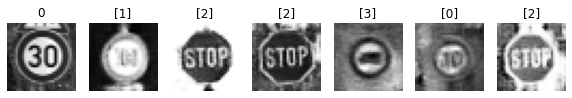

Epoch 75310 g_loss= 1.0068715 d_loss= 1.0236659 real_acc= 0.82 fake_acc= 0.7
Epoch 75320 g_loss= 1.0536797 d_loss= 1.1864297 real_acc= 0.74 fake_acc= 0.62
Epoch 75330 g_loss= 1.1689519 d_loss= 1.0349263 real_acc= 0.68 fake_acc= 0.78
Epoch 75340 g_loss= 0.8629541 d_loss= 1.1709248 real_acc= 0.8 fake_acc= 0.44
Epoch 75350 g_loss= 1.2305214 d_loss= 1.0465147 real_acc= 0.68 fake_acc= 0.76
Epoch 75360 g_loss= 1.0257449 d_loss= 1.162982 real_acc= 0.62 fake_acc= 0.72
Epoch 75370 g_loss= 1.0497735 d_loss= 1.1953971 real_acc= 0.72 fake_acc= 0.68
Epoch 75380 g_loss= 1.3519915 d_loss= 0.97136176 real_acc= 0.76 fake_acc= 0.7
Epoch 75390 g_loss= 1.0618309 d_loss= 1.0427548 real_acc= 0.66 fake_acc= 0.7
Epoch 75400 g_loss= 1.0766083 d_loss= 1.1957104 real_acc= 0.62 fake_acc= 0.8


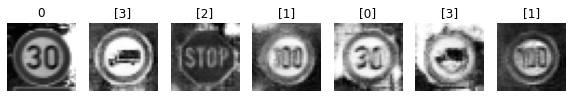

Epoch 75410 g_loss= 1.046258 d_loss= 1.1431022 real_acc= 0.68 fake_acc= 0.62
Epoch 75420 g_loss= 1.0505226 d_loss= 1.1878633 real_acc= 0.66 fake_acc= 0.68
Epoch 75430 g_loss= 1.0211378 d_loss= 1.2295303 real_acc= 0.6 fake_acc= 0.66
Epoch 75440 g_loss= 1.1684817 d_loss= 1.1179202 real_acc= 0.6 fake_acc= 0.7
Epoch 75450 g_loss= 1.1755582 d_loss= 1.0627058 real_acc= 0.7 fake_acc= 0.8
Epoch 75460 g_loss= 1.0024033 d_loss= 1.1417143 real_acc= 0.74 fake_acc= 0.68
Epoch 75470 g_loss= 0.9831411 d_loss= 1.2875636 real_acc= 0.46 fake_acc= 0.74
Epoch 75480 g_loss= 1.1558667 d_loss= 1.084681 real_acc= 0.68 fake_acc= 0.76
Epoch 75490 g_loss= 1.1159273 d_loss= 1.1043102 real_acc= 0.78 fake_acc= 0.64
Epoch 75500 g_loss= 1.1020834 d_loss= 1.0908058 real_acc= 0.72 fake_acc= 0.74


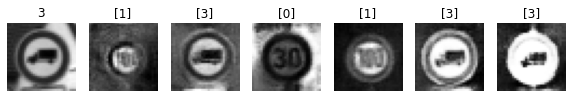

Epoch 75510 g_loss= 1.1042687 d_loss= 1.2003373 real_acc= 0.68 fake_acc= 0.62
Epoch 75520 g_loss= 1.0400555 d_loss= 1.0478394 real_acc= 0.82 fake_acc= 0.64
Epoch 75530 g_loss= 1.0855896 d_loss= 1.1029518 real_acc= 0.7 fake_acc= 0.76
Epoch 75540 g_loss= 0.95332617 d_loss= 1.0515673 real_acc= 0.84 fake_acc= 0.66
Epoch 75550 g_loss= 1.2934945 d_loss= 1.0511053 real_acc= 0.74 fake_acc= 0.8
Epoch 75560 g_loss= 0.9846116 d_loss= 1.1348848 real_acc= 0.76 fake_acc= 0.56
Epoch 75570 g_loss= 1.0716282 d_loss= 1.1771822 real_acc= 0.7 fake_acc= 0.64
Epoch 75580 g_loss= 1.088439 d_loss= 1.2474556 real_acc= 0.5 fake_acc= 0.62
Epoch 75590 g_loss= 1.0844914 d_loss= 1.1559808 real_acc= 0.64 fake_acc= 0.62
Epoch 75600 g_loss= 0.93722725 d_loss= 1.221787 real_acc= 0.62 fake_acc= 0.66


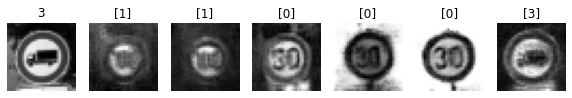

Epoch 75610 g_loss= 1.1729969 d_loss= 1.0791565 real_acc= 0.64 fake_acc= 0.8
Epoch 75620 g_loss= 1.0859821 d_loss= 1.0437157 real_acc= 0.74 fake_acc= 0.74
Epoch 75630 g_loss= 0.90448844 d_loss= 1.1767352 real_acc= 0.74 fake_acc= 0.54
Epoch 75640 g_loss= 1.0481045 d_loss= 1.0443658 real_acc= 0.78 fake_acc= 0.6
Epoch 75650 g_loss= 0.94431365 d_loss= 1.2355152 real_acc= 0.6 fake_acc= 0.7
Epoch 75660 g_loss= 0.8772625 d_loss= 1.2171609 real_acc= 0.7 fake_acc= 0.52
Epoch 75670 g_loss= 1.0527681 d_loss= 1.0798239 real_acc= 0.82 fake_acc= 0.76
Epoch 75680 g_loss= 1.1169369 d_loss= 1.1067381 real_acc= 0.7 fake_acc= 0.72
Epoch 75690 g_loss= 1.0133414 d_loss= 1.2858367 real_acc= 0.6 fake_acc= 0.7
Epoch 75700 g_loss= 0.9758807 d_loss= 1.2536492 real_acc= 0.64 fake_acc= 0.64


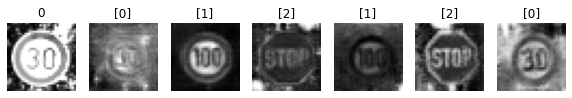

Epoch 75710 g_loss= 1.1039689 d_loss= 1.0955884 real_acc= 0.72 fake_acc= 0.76
Epoch 75720 g_loss= 1.0834966 d_loss= 1.035189 real_acc= 0.76 fake_acc= 0.78
Epoch 75730 g_loss= 1.0776345 d_loss= 1.1849715 real_acc= 0.68 fake_acc= 0.76
Epoch 75740 g_loss= 0.9624565 d_loss= 1.1639562 real_acc= 0.7 fake_acc= 0.6
Epoch 75750 g_loss= 1.0829428 d_loss= 1.2721608 real_acc= 0.66 fake_acc= 0.68
Epoch 75760 g_loss= 0.9900959 d_loss= 1.1065942 real_acc= 0.66 fake_acc= 0.66
Epoch 75770 g_loss= 1.175835 d_loss= 1.1271616 real_acc= 0.66 fake_acc= 0.82
Epoch 75780 g_loss= 1.1446208 d_loss= 1.1855075 real_acc= 0.52 fake_acc= 0.72
Epoch 75790 g_loss= 1.0760583 d_loss= 1.1244164 real_acc= 0.64 fake_acc= 0.72
Epoch 75800 g_loss= 0.966234 d_loss= 1.1947755 real_acc= 0.68 fake_acc= 0.6


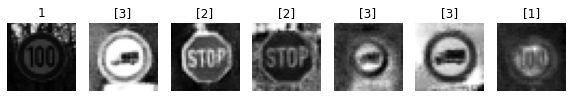

Epoch 75810 g_loss= 1.043812 d_loss= 1.238086 real_acc= 0.64 fake_acc= 0.64
Epoch 75820 g_loss= 1.0269592 d_loss= 1.2318227 real_acc= 0.62 fake_acc= 0.64
Epoch 75830 g_loss= 1.3145499 d_loss= 1.2438451 real_acc= 0.66 fake_acc= 0.72
Epoch 75840 g_loss= 0.985033 d_loss= 1.1457554 real_acc= 0.8 fake_acc= 0.62
Epoch 75850 g_loss= 1.1778008 d_loss= 1.0435287 real_acc= 0.74 fake_acc= 0.76
Epoch 75860 g_loss= 1.000278 d_loss= 1.2134657 real_acc= 0.7 fake_acc= 0.64
Epoch 75870 g_loss= 1.030158 d_loss= 1.12076 real_acc= 0.72 fake_acc= 0.62
Epoch 75880 g_loss= 1.1521392 d_loss= 1.2636101 real_acc= 0.68 fake_acc= 0.66
Epoch 75890 g_loss= 1.0588814 d_loss= 1.3188674 real_acc= 0.66 fake_acc= 0.62
Epoch 75900 g_loss= 0.87700975 d_loss= 1.1271132 real_acc= 0.82 fake_acc= 0.62


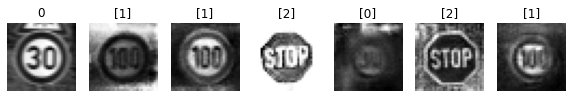

Epoch 75910 g_loss= 1.0520828 d_loss= 1.0842657 real_acc= 0.7 fake_acc= 0.7
Epoch 75920 g_loss= 1.222287 d_loss= 1.1796522 real_acc= 0.58 fake_acc= 0.82
Epoch 75930 g_loss= 1.0113134 d_loss= 1.2662778 real_acc= 0.62 fake_acc= 0.62
Epoch 75940 g_loss= 1.0530407 d_loss= 1.1567025 real_acc= 0.8 fake_acc= 0.62
Epoch 75950 g_loss= 0.8982438 d_loss= 1.1970568 real_acc= 0.78 fake_acc= 0.56
Epoch 75960 g_loss= 1.1507521 d_loss= 1.1377773 real_acc= 0.7 fake_acc= 0.66
Epoch 75970 g_loss= 1.0358936 d_loss= 1.1987193 real_acc= 0.7 fake_acc= 0.62
Epoch 75980 g_loss= 1.0868714 d_loss= 1.0425918 real_acc= 0.78 fake_acc= 0.82
Epoch 75990 g_loss= 1.0282105 d_loss= 1.1314061 real_acc= 0.7 fake_acc= 0.68
Epoch 76000 g_loss= 0.88236856 d_loss= 1.3007457 real_acc= 0.7 fake_acc= 0.58


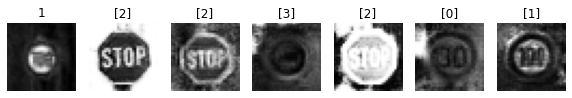

Epoch 76010 g_loss= 1.0900519 d_loss= 1.1152351 real_acc= 0.68 fake_acc= 0.7
Epoch 76020 g_loss= 1.0624347 d_loss= 1.1491277 real_acc= 0.62 fake_acc= 0.72
Epoch 76030 g_loss= 0.99160975 d_loss= 1.1556432 real_acc= 0.78 fake_acc= 0.64
Epoch 76040 g_loss= 1.050917 d_loss= 1.0824535 real_acc= 0.72 fake_acc= 0.74
Epoch 76050 g_loss= 1.0482296 d_loss= 1.1588974 real_acc= 0.72 fake_acc= 0.68
Epoch 76060 g_loss= 0.99698496 d_loss= 1.1377058 real_acc= 0.74 fake_acc= 0.6
Epoch 76070 g_loss= 1.1326802 d_loss= 1.051039 real_acc= 0.72 fake_acc= 0.76
Epoch 76080 g_loss= 1.0622056 d_loss= 1.1999639 real_acc= 0.66 fake_acc= 0.74
Epoch 76090 g_loss= 1.1783607 d_loss= 1.125711 real_acc= 0.62 fake_acc= 0.8
Epoch 76100 g_loss= 0.9427705 d_loss= 1.0132437 real_acc= 0.9 fake_acc= 0.62


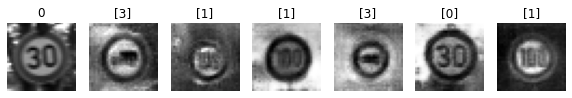

Epoch 76110 g_loss= 1.0972663 d_loss= 1.0886428 real_acc= 0.72 fake_acc= 0.7
Epoch 76120 g_loss= 1.1896126 d_loss= 1.1399078 real_acc= 0.62 fake_acc= 0.66
Epoch 76130 g_loss= 0.8964238 d_loss= 1.2936561 real_acc= 0.6 fake_acc= 0.58
Epoch 76140 g_loss= 1.1930208 d_loss= 1.2379649 real_acc= 0.62 fake_acc= 0.7
Epoch 76150 g_loss= 1.2198699 d_loss= 1.094177 real_acc= 0.72 fake_acc= 0.78
Epoch 76160 g_loss= 0.96196777 d_loss= 1.1270541 real_acc= 0.84 fake_acc= 0.58
Epoch 76170 g_loss= 1.0408416 d_loss= 1.2033014 real_acc= 0.6 fake_acc= 0.68
Epoch 76180 g_loss= 0.97412753 d_loss= 1.1792367 real_acc= 0.72 fake_acc= 0.66
Epoch 76190 g_loss= 1.1671776 d_loss= 1.1162153 real_acc= 0.62 fake_acc= 0.86
Epoch 76200 g_loss= 1.1197984 d_loss= 1.198749 real_acc= 0.6 fake_acc= 0.78


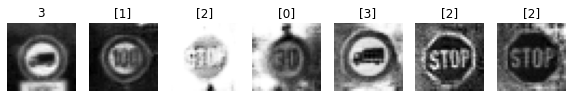

Epoch 76210 g_loss= 0.97365034 d_loss= 1.15464 real_acc= 0.68 fake_acc= 0.66
Epoch 76220 g_loss= 0.9748247 d_loss= 1.1109238 real_acc= 0.8 fake_acc= 0.6
Epoch 76230 g_loss= 1.2922828 d_loss= 1.1177669 real_acc= 0.5 fake_acc= 0.86
Epoch 76240 g_loss= 1.1522909 d_loss= 1.1503584 real_acc= 0.68 fake_acc= 0.68
Epoch 76250 g_loss= 1.1262592 d_loss= 1.0571408 real_acc= 0.78 fake_acc= 0.72
Epoch 76260 g_loss= 1.0516723 d_loss= 1.2601535 real_acc= 0.54 fake_acc= 0.64
Epoch 76270 g_loss= 0.9441798 d_loss= 1.1294076 real_acc= 0.74 fake_acc= 0.54
Epoch 76280 g_loss= 1.2412299 d_loss= 1.0730709 real_acc= 0.7 fake_acc= 0.78
Epoch 76290 g_loss= 1.1138144 d_loss= 1.1645576 real_acc= 0.78 fake_acc= 0.64
Epoch 76300 g_loss= 1.0549153 d_loss= 1.3654455 real_acc= 0.56 fake_acc= 0.7


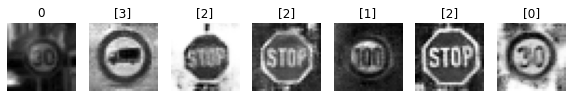

Epoch 76310 g_loss= 0.9041949 d_loss= 1.0323408 real_acc= 0.9 fake_acc= 0.66
Epoch 76320 g_loss= 0.9384438 d_loss= 1.1223142 real_acc= 0.8 fake_acc= 0.6
Epoch 76330 g_loss= 1.0733638 d_loss= 1.15966 real_acc= 0.62 fake_acc= 0.84
Epoch 76340 g_loss= 0.99410605 d_loss= 1.2405542 real_acc= 0.68 fake_acc= 0.68
Epoch 76350 g_loss= 0.97248495 d_loss= 1.1471653 real_acc= 0.8 fake_acc= 0.54
Epoch 76360 g_loss= 1.1188232 d_loss= 1.1514435 real_acc= 0.62 fake_acc= 0.68
Epoch 76370 g_loss= 1.0961021 d_loss= 1.0983917 real_acc= 0.68 fake_acc= 0.68
Epoch 76380 g_loss= 0.9987284 d_loss= 1.216064 real_acc= 0.6 fake_acc= 0.54
Epoch 76390 g_loss= 1.181131 d_loss= 1.0786132 real_acc= 0.7 fake_acc= 0.82
Epoch 76400 g_loss= 1.2545066 d_loss= 1.1773298 real_acc= 0.54 fake_acc= 0.8


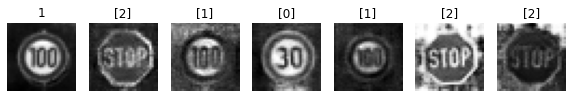

Epoch 76410 g_loss= 1.0255175 d_loss= 1.2236955 real_acc= 0.6 fake_acc= 0.78
Epoch 76420 g_loss= 1.1627287 d_loss= 1.1701069 real_acc= 0.64 fake_acc= 0.7
Epoch 76430 g_loss= 1.1402646 d_loss= 1.11533 real_acc= 0.76 fake_acc= 0.62
Epoch 76440 g_loss= 1.151078 d_loss= 1.2058284 real_acc= 0.62 fake_acc= 0.76
Epoch 76450 g_loss= 0.9617329 d_loss= 1.0023183 real_acc= 0.8 fake_acc= 0.64
Epoch 76460 g_loss= 0.96328217 d_loss= 1.1957111 real_acc= 0.66 fake_acc= 0.7
Epoch 76470 g_loss= 0.97173065 d_loss= 1.2120917 real_acc= 0.7 fake_acc= 0.66
Epoch 76480 g_loss= 1.0458857 d_loss= 1.1548768 real_acc= 0.64 fake_acc= 0.68
Epoch 76490 g_loss= 1.1932552 d_loss= 1.1139853 real_acc= 0.64 fake_acc= 0.68
Epoch 76500 g_loss= 0.8981634 d_loss= 1.1581755 real_acc= 0.78 fake_acc= 0.58


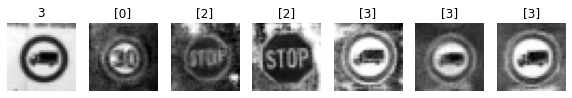

Epoch 76510 g_loss= 0.91547066 d_loss= 1.2766849 real_acc= 0.76 fake_acc= 0.46
Epoch 76520 g_loss= 1.1697339 d_loss= 1.1742872 real_acc= 0.6 fake_acc= 0.8
Epoch 76530 g_loss= 1.0279139 d_loss= 1.228589 real_acc= 0.58 fake_acc= 0.56
Epoch 76540 g_loss= 1.1848074 d_loss= 1.1050603 real_acc= 0.68 fake_acc= 0.74
Epoch 76550 g_loss= 0.99502724 d_loss= 1.1609935 real_acc= 0.76 fake_acc= 0.7
Epoch 76560 g_loss= 1.1106281 d_loss= 1.0872558 real_acc= 0.7 fake_acc= 0.74
Epoch 76570 g_loss= 1.1394415 d_loss= 1.1417375 real_acc= 0.62 fake_acc= 0.68
Epoch 76580 g_loss= 0.8657851 d_loss= 1.241318 real_acc= 0.76 fake_acc= 0.46
Epoch 76590 g_loss= 1.10686 d_loss= 1.2009804 real_acc= 0.64 fake_acc= 0.74
Epoch 76600 g_loss= 0.891267 d_loss= 1.1460564 real_acc= 0.78 fake_acc= 0.6


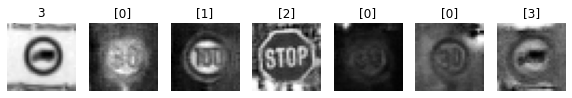

Epoch 76610 g_loss= 0.9073743 d_loss= 1.2234969 real_acc= 0.68 fake_acc= 0.6
Epoch 76620 g_loss= 1.1818751 d_loss= 1.0094271 real_acc= 0.74 fake_acc= 0.74
Epoch 76630 g_loss= 1.2023494 d_loss= 1.2053586 real_acc= 0.56 fake_acc= 0.78
Epoch 76640 g_loss= 0.93510073 d_loss= 1.1013353 real_acc= 0.8 fake_acc= 0.56
Epoch 76650 g_loss= 0.9878093 d_loss= 1.2436641 real_acc= 0.74 fake_acc= 0.58
Epoch 76660 g_loss= 1.0579127 d_loss= 1.1904955 real_acc= 0.64 fake_acc= 0.74
Epoch 76670 g_loss= 1.0185905 d_loss= 1.0175347 real_acc= 0.82 fake_acc= 0.7
Epoch 76680 g_loss= 1.0838643 d_loss= 1.1039088 real_acc= 0.74 fake_acc= 0.7
Epoch 76690 g_loss= 1.2267206 d_loss= 1.0590296 real_acc= 0.62 fake_acc= 0.7
Epoch 76700 g_loss= 1.0974793 d_loss= 1.2475896 real_acc= 0.52 fake_acc= 0.82


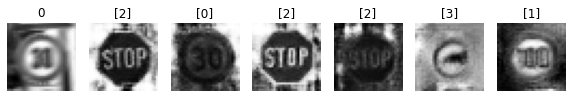

Epoch 76710 g_loss= 1.0000726 d_loss= 1.2090765 real_acc= 0.72 fake_acc= 0.58
Epoch 76720 g_loss= 0.94190645 d_loss= 1.155906 real_acc= 0.74 fake_acc= 0.58
Epoch 76730 g_loss= 0.98427844 d_loss= 1.1624223 real_acc= 0.66 fake_acc= 0.54
Epoch 76740 g_loss= 0.96512854 d_loss= 1.1609557 real_acc= 0.76 fake_acc= 0.54
Epoch 76750 g_loss= 1.0618522 d_loss= 1.1874113 real_acc= 0.72 fake_acc= 0.68
Epoch 76760 g_loss= 0.98006934 d_loss= 1.2575309 real_acc= 0.7 fake_acc= 0.58
Epoch 76770 g_loss= 1.1328925 d_loss= 1.1069455 real_acc= 0.66 fake_acc= 0.64
Epoch 76780 g_loss= 0.87088466 d_loss= 1.2475741 real_acc= 0.68 fake_acc= 0.6
Epoch 76790 g_loss= 1.1178617 d_loss= 1.0868385 real_acc= 0.68 fake_acc= 0.72
Epoch 76800 g_loss= 1.0244087 d_loss= 1.1343718 real_acc= 0.72 fake_acc= 0.7


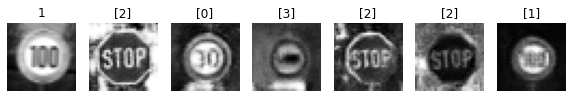

Epoch 76810 g_loss= 0.9364158 d_loss= 1.2160914 real_acc= 0.66 fake_acc= 0.58
Epoch 76820 g_loss= 1.1510152 d_loss= 1.1762061 real_acc= 0.48 fake_acc= 0.82
Epoch 76830 g_loss= 1.1031803 d_loss= 1.0777733 real_acc= 0.72 fake_acc= 0.74
Epoch 76840 g_loss= 0.9648524 d_loss= 1.2493814 real_acc= 0.66 fake_acc= 0.66
Epoch 76850 g_loss= 1.0715251 d_loss= 1.140969 real_acc= 0.62 fake_acc= 0.76
Epoch 76860 g_loss= 0.91325986 d_loss= 1.277061 real_acc= 0.64 fake_acc= 0.6
Epoch 76870 g_loss= 1.1448169 d_loss= 1.2391449 real_acc= 0.6 fake_acc= 0.74
Epoch 76880 g_loss= 1.0208127 d_loss= 1.1722512 real_acc= 0.66 fake_acc= 0.78
Epoch 76890 g_loss= 1.1891761 d_loss= 1.0672326 real_acc= 0.82 fake_acc= 0.72
Epoch 76900 g_loss= 1.0011628 d_loss= 1.0714512 real_acc= 0.76 fake_acc= 0.74


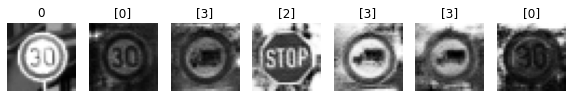

Epoch 76910 g_loss= 1.0457366 d_loss= 1.1674808 real_acc= 0.74 fake_acc= 0.6
Epoch 76920 g_loss= 0.9598898 d_loss= 1.2654134 real_acc= 0.62 fake_acc= 0.6
Epoch 76930 g_loss= 0.95945686 d_loss= 1.2016128 real_acc= 0.74 fake_acc= 0.54
Epoch 76940 g_loss= 1.0842485 d_loss= 1.1765223 real_acc= 0.68 fake_acc= 0.7
Epoch 76950 g_loss= 0.9462702 d_loss= 1.2343557 real_acc= 0.7 fake_acc= 0.7
Epoch 76960 g_loss= 0.9577653 d_loss= 1.2251302 real_acc= 0.68 fake_acc= 0.64
Epoch 76970 g_loss= 1.1267581 d_loss= 1.096823 real_acc= 0.72 fake_acc= 0.68
Epoch 76980 g_loss= 1.2851634 d_loss= 1.0342969 real_acc= 0.7 fake_acc= 0.88
Epoch 76990 g_loss= 1.0729196 d_loss= 1.2029605 real_acc= 0.72 fake_acc= 0.64
Epoch 77000 g_loss= 1.115344 d_loss= 1.0482153 real_acc= 0.7 fake_acc= 0.78


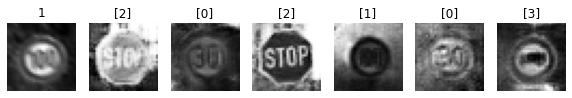

Epoch 77010 g_loss= 1.0233344 d_loss= 1.0589842 real_acc= 0.76 fake_acc= 0.7
Epoch 77020 g_loss= 1.0462152 d_loss= 1.2338052 real_acc= 0.62 fake_acc= 0.72
Epoch 77030 g_loss= 0.962102 d_loss= 1.1094093 real_acc= 0.76 fake_acc= 0.6
Epoch 77040 g_loss= 1.1188008 d_loss= 1.1451855 real_acc= 0.76 fake_acc= 0.68
Epoch 77050 g_loss= 1.1445887 d_loss= 1.0627558 real_acc= 0.7 fake_acc= 0.68
Epoch 77060 g_loss= 1.106813 d_loss= 1.0500221 real_acc= 0.68 fake_acc= 0.74
Epoch 77070 g_loss= 1.2385063 d_loss= 1.1360174 real_acc= 0.62 fake_acc= 0.86
Epoch 77080 g_loss= 1.0826224 d_loss= 1.1608377 real_acc= 0.74 fake_acc= 0.64
Epoch 77090 g_loss= 1.0169902 d_loss= 1.0672967 real_acc= 0.78 fake_acc= 0.68
Epoch 77100 g_loss= 1.0046508 d_loss= 1.1018105 real_acc= 0.8 fake_acc= 0.64


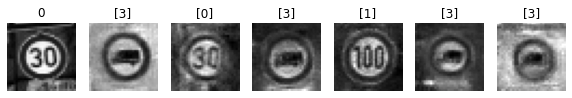

Epoch 77110 g_loss= 1.1973335 d_loss= 1.182457 real_acc= 0.64 fake_acc= 0.7
Epoch 77120 g_loss= 1.193221 d_loss= 1.0736368 real_acc= 0.7 fake_acc= 0.76
Epoch 77130 g_loss= 1.1007628 d_loss= 1.0467521 real_acc= 0.86 fake_acc= 0.66
Epoch 77140 g_loss= 1.0964993 d_loss= 1.1929908 real_acc= 0.76 fake_acc= 0.74
Epoch 77150 g_loss= 1.0045679 d_loss= 1.2682996 real_acc= 0.66 fake_acc= 0.7
Epoch 77160 g_loss= 0.9174935 d_loss= 1.3200619 real_acc= 0.54 fake_acc= 0.64
Epoch 77170 g_loss= 1.2553345 d_loss= 1.0228391 real_acc= 0.72 fake_acc= 0.78
Epoch 77180 g_loss= 0.99171793 d_loss= 1.1844008 real_acc= 0.6 fake_acc= 0.64
Epoch 77190 g_loss= 1.1534071 d_loss= 1.012243 real_acc= 0.82 fake_acc= 0.7
Epoch 77200 g_loss= 1.0011001 d_loss= 1.1794821 real_acc= 0.72 fake_acc= 0.58


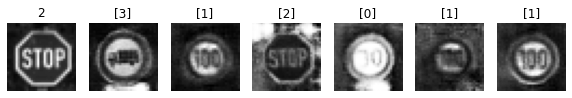

Epoch 77210 g_loss= 0.94708467 d_loss= 1.2098922 real_acc= 0.7 fake_acc= 0.58
Epoch 77220 g_loss= 1.0029842 d_loss= 1.2320683 real_acc= 0.64 fake_acc= 0.68
Epoch 77230 g_loss= 0.9594727 d_loss= 1.1629211 real_acc= 0.66 fake_acc= 0.76
Epoch 77240 g_loss= 1.0493343 d_loss= 1.2870705 real_acc= 0.66 fake_acc= 0.64
Epoch 77250 g_loss= 0.96382594 d_loss= 1.1630087 real_acc= 0.7 fake_acc= 0.58
Epoch 77260 g_loss= 1.0166687 d_loss= 1.2032378 real_acc= 0.54 fake_acc= 0.68
Epoch 77270 g_loss= 1.190459 d_loss= 1.0987439 real_acc= 0.68 fake_acc= 0.74
Epoch 77280 g_loss= 0.9343302 d_loss= 1.1145182 real_acc= 0.82 fake_acc= 0.6
Epoch 77290 g_loss= 1.0542203 d_loss= 1.1317441 real_acc= 0.76 fake_acc= 0.74
Epoch 77300 g_loss= 1.1729821 d_loss= 1.0780419 real_acc= 0.72 fake_acc= 0.74


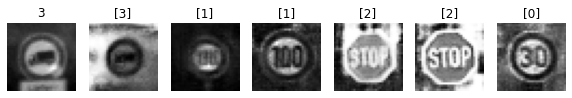

Epoch 77310 g_loss= 1.0277283 d_loss= 1.1335489 real_acc= 0.72 fake_acc= 0.6
Epoch 77320 g_loss= 1.0744567 d_loss= 1.1388783 real_acc= 0.72 fake_acc= 0.68
Epoch 77330 g_loss= 1.1659051 d_loss= 1.1370624 real_acc= 0.64 fake_acc= 0.76
Epoch 77340 g_loss= 1.167038 d_loss= 1.160357 real_acc= 0.76 fake_acc= 0.74
Epoch 77350 g_loss= 0.79836905 d_loss= 1.2188528 real_acc= 0.84 fake_acc= 0.46
Epoch 77360 g_loss= 0.9768578 d_loss= 1.1685538 real_acc= 0.74 fake_acc= 0.66
Epoch 77370 g_loss= 1.0212486 d_loss= 1.2940304 real_acc= 0.56 fake_acc= 0.68
Epoch 77380 g_loss= 0.8685755 d_loss= 1.2653117 real_acc= 0.7 fake_acc= 0.66
Epoch 77390 g_loss= 1.0392814 d_loss= 1.1035464 real_acc= 0.8 fake_acc= 0.66
Epoch 77400 g_loss= 0.9210772 d_loss= 1.1892259 real_acc= 0.74 fake_acc= 0.54


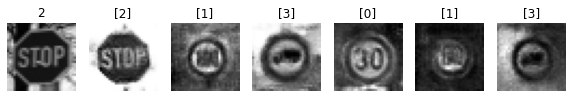

Epoch 77410 g_loss= 1.0695832 d_loss= 1.1057203 real_acc= 0.6 fake_acc= 0.78
Epoch 77420 g_loss= 0.9556397 d_loss= 1.2491751 real_acc= 0.72 fake_acc= 0.54
Epoch 77430 g_loss= 1.0640162 d_loss= 1.0976379 real_acc= 0.7 fake_acc= 0.7
Epoch 77440 g_loss= 1.0458767 d_loss= 1.1655972 real_acc= 0.62 fake_acc= 0.8
Epoch 77450 g_loss= 1.0517043 d_loss= 1.17225 real_acc= 0.62 fake_acc= 0.76
Epoch 77460 g_loss= 1.0414441 d_loss= 1.1539662 real_acc= 0.74 fake_acc= 0.62
Epoch 77470 g_loss= 1.1481218 d_loss= 1.1609771 real_acc= 0.58 fake_acc= 0.66
Epoch 77480 g_loss= 1.1391168 d_loss= 1.1740317 real_acc= 0.58 fake_acc= 0.76
Epoch 77490 g_loss= 1.1870399 d_loss= 1.2017064 real_acc= 0.56 fake_acc= 0.76
Epoch 77500 g_loss= 1.0191302 d_loss= 1.1892343 real_acc= 0.74 fake_acc= 0.66


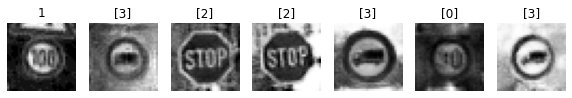

Epoch 77510 g_loss= 1.046468 d_loss= 1.1708896 real_acc= 0.74 fake_acc= 0.66
Epoch 77520 g_loss= 1.106239 d_loss= 1.0531914 real_acc= 0.64 fake_acc= 0.72
Epoch 77530 g_loss= 1.1755399 d_loss= 1.0575416 real_acc= 0.7 fake_acc= 0.76
Epoch 77540 g_loss= 1.0641837 d_loss= 1.1575092 real_acc= 0.8 fake_acc= 0.64
Epoch 77550 g_loss= 0.89843994 d_loss= 1.1748205 real_acc= 0.8 fake_acc= 0.54
Epoch 77560 g_loss= 1.1122772 d_loss= 1.2380219 real_acc= 0.56 fake_acc= 0.68
Epoch 77570 g_loss= 1.3865155 d_loss= 1.1383798 real_acc= 0.52 fake_acc= 0.84
Epoch 77580 g_loss= 1.07122 d_loss= 1.1882846 real_acc= 0.66 fake_acc= 0.76
Epoch 77590 g_loss= 1.0028554 d_loss= 1.1783706 real_acc= 0.6 fake_acc= 0.7
Epoch 77600 g_loss= 0.95294577 d_loss= 1.2785869 real_acc= 0.68 fake_acc= 0.66


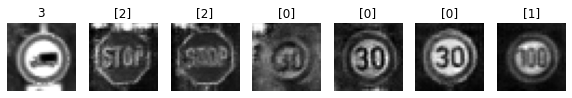

Epoch 77610 g_loss= 0.9936716 d_loss= 1.1540315 real_acc= 0.64 fake_acc= 0.7
Epoch 77620 g_loss= 0.9549373 d_loss= 1.119544 real_acc= 0.76 fake_acc= 0.62
Epoch 77630 g_loss= 1.2372522 d_loss= 1.0185463 real_acc= 0.8 fake_acc= 0.78
Epoch 77640 g_loss= 0.96069276 d_loss= 1.2063837 real_acc= 0.7 fake_acc= 0.58
Epoch 77650 g_loss= 1.1362382 d_loss= 1.1894962 real_acc= 0.62 fake_acc= 0.8
Epoch 77660 g_loss= 0.8651825 d_loss= 1.2113881 real_acc= 0.74 fake_acc= 0.52
Epoch 77670 g_loss= 1.0240141 d_loss= 1.099627 real_acc= 0.74 fake_acc= 0.7
Epoch 77680 g_loss= 1.1242738 d_loss= 1.1585187 real_acc= 0.64 fake_acc= 0.74
Epoch 77690 g_loss= 1.079348 d_loss= 1.0894496 real_acc= 0.76 fake_acc= 0.7
Epoch 77700 g_loss= 0.918842 d_loss= 1.2145146 real_acc= 0.74 fake_acc= 0.54


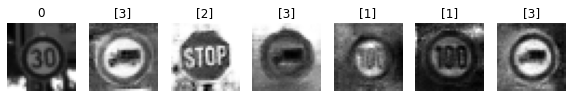

Epoch 77710 g_loss= 1.0056827 d_loss= 1.2285514 real_acc= 0.78 fake_acc= 0.52
Epoch 77720 g_loss= 1.1435968 d_loss= 1.3042326 real_acc= 0.4 fake_acc= 0.76
Epoch 77730 g_loss= 1.0087748 d_loss= 1.070312 real_acc= 0.82 fake_acc= 0.74
Epoch 77740 g_loss= 1.1307209 d_loss= 0.973825 real_acc= 0.84 fake_acc= 0.76
Epoch 77750 g_loss= 1.1292334 d_loss= 1.0133606 real_acc= 0.76 fake_acc= 0.7
Epoch 77760 g_loss= 1.133071 d_loss= 1.2553015 real_acc= 0.68 fake_acc= 0.68
Epoch 77770 g_loss= 1.030202 d_loss= 1.0606456 real_acc= 0.8 fake_acc= 0.72
Epoch 77780 g_loss= 0.9973466 d_loss= 1.1827443 real_acc= 0.76 fake_acc= 0.6
Epoch 77790 g_loss= 1.021537 d_loss= 1.1529284 real_acc= 0.7 fake_acc= 0.66
Epoch 77800 g_loss= 0.9015013 d_loss= 1.1980367 real_acc= 0.74 fake_acc= 0.58


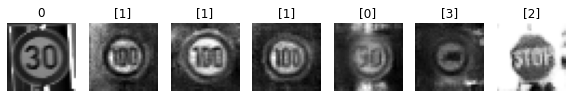

Epoch 77810 g_loss= 0.9009504 d_loss= 1.196691 real_acc= 0.68 fake_acc= 0.58
Epoch 77820 g_loss= 0.98722047 d_loss= 1.2434144 real_acc= 0.68 fake_acc= 0.62
Epoch 77830 g_loss= 1.077609 d_loss= 1.2380414 real_acc= 0.62 fake_acc= 0.62
Epoch 77840 g_loss= 1.1538281 d_loss= 1.2052162 real_acc= 0.6 fake_acc= 0.72
Epoch 77850 g_loss= 0.94224226 d_loss= 1.2839148 real_acc= 0.62 fake_acc= 0.66
Epoch 77860 g_loss= 1.02444 d_loss= 1.1914117 real_acc= 0.7 fake_acc= 0.62
Epoch 77870 g_loss= 1.18891 d_loss= 1.0313895 real_acc= 0.66 fake_acc= 0.82
Epoch 77880 g_loss= 1.1869316 d_loss= 1.0831486 real_acc= 0.72 fake_acc= 0.68
Epoch 77890 g_loss= 1.0710224 d_loss= 1.1516337 real_acc= 0.72 fake_acc= 0.64
Epoch 77900 g_loss= 1.1858883 d_loss= 1.1420329 real_acc= 0.6 fake_acc= 0.8


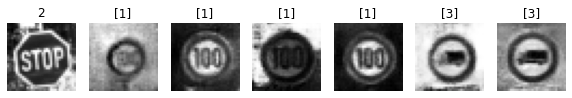

Epoch 77910 g_loss= 1.0008726 d_loss= 1.1087484 real_acc= 0.72 fake_acc= 0.7
Epoch 77920 g_loss= 0.8957253 d_loss= 1.2542679 real_acc= 0.74 fake_acc= 0.6
Epoch 77930 g_loss= 0.9787853 d_loss= 1.2000858 real_acc= 0.6 fake_acc= 0.76
Epoch 77940 g_loss= 0.9935511 d_loss= 1.1908627 real_acc= 0.7 fake_acc= 0.62
Epoch 77950 g_loss= 0.8507584 d_loss= 1.2438905 real_acc= 0.8 fake_acc= 0.58
Epoch 77960 g_loss= 1.0843928 d_loss= 1.1661563 real_acc= 0.62 fake_acc= 0.72
Epoch 77970 g_loss= 1.121978 d_loss= 1.0914435 real_acc= 0.68 fake_acc= 0.7
Epoch 77980 g_loss= 0.989814 d_loss= 1.2574196 real_acc= 0.6 fake_acc= 0.7
Epoch 77990 g_loss= 0.9912606 d_loss= 1.2129905 real_acc= 0.68 fake_acc= 0.66
Epoch 78000 g_loss= 1.0410438 d_loss= 1.1115315 real_acc= 0.76 fake_acc= 0.66


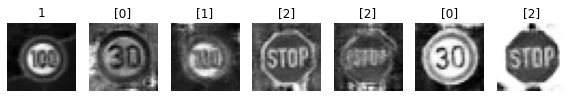

Epoch 78010 g_loss= 1.0487918 d_loss= 1.1229018 real_acc= 0.74 fake_acc= 0.66
Epoch 78020 g_loss= 1.2562488 d_loss= 1.0062809 real_acc= 0.66 fake_acc= 0.76
Epoch 78030 g_loss= 1.0145143 d_loss= 1.1701748 real_acc= 0.74 fake_acc= 0.64
Epoch 78040 g_loss= 0.9947749 d_loss= 1.2103463 real_acc= 0.66 fake_acc= 0.66
Epoch 78050 g_loss= 1.0598432 d_loss= 1.2113454 real_acc= 0.6 fake_acc= 0.66
Epoch 78060 g_loss= 0.95337486 d_loss= 1.1940105 real_acc= 0.76 fake_acc= 0.68
Epoch 78070 g_loss= 1.109227 d_loss= 1.0431099 real_acc= 0.74 fake_acc= 0.62
Epoch 78080 g_loss= 1.0247439 d_loss= 1.1396742 real_acc= 0.74 fake_acc= 0.68
Epoch 78090 g_loss= 0.9356189 d_loss= 1.1848401 real_acc= 0.78 fake_acc= 0.54
Epoch 78100 g_loss= 1.0714084 d_loss= 1.2028877 real_acc= 0.74 fake_acc= 0.62


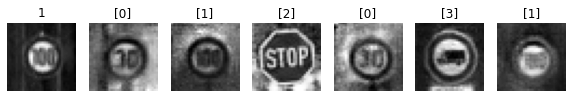

Epoch 78110 g_loss= 1.0705078 d_loss= 1.1180415 real_acc= 0.68 fake_acc= 0.72
Epoch 78120 g_loss= 0.99082273 d_loss= 1.0860591 real_acc= 0.8 fake_acc= 0.68
Epoch 78130 g_loss= 1.2336526 d_loss= 1.2458677 real_acc= 0.56 fake_acc= 0.8
Epoch 78140 g_loss= 1.0189834 d_loss= 1.2696469 real_acc= 0.62 fake_acc= 0.6
Epoch 78150 g_loss= 1.0531348 d_loss= 1.1015134 real_acc= 0.66 fake_acc= 0.7
Epoch 78160 g_loss= 1.201187 d_loss= 1.0215894 real_acc= 0.72 fake_acc= 0.84
Epoch 78170 g_loss= 0.89378214 d_loss= 1.2306103 real_acc= 0.8 fake_acc= 0.58
Epoch 78180 g_loss= 0.94446355 d_loss= 1.1240494 real_acc= 0.74 fake_acc= 0.72
Epoch 78190 g_loss= 1.1202843 d_loss= 1.1831038 real_acc= 0.7 fake_acc= 0.66
Epoch 78200 g_loss= 1.2720075 d_loss= 1.0363381 real_acc= 0.76 fake_acc= 0.78


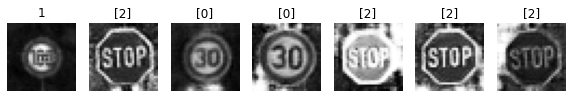

Epoch 78210 g_loss= 1.0763088 d_loss= 1.2613406 real_acc= 0.6 fake_acc= 0.8
Epoch 78220 g_loss= 0.95527357 d_loss= 1.2036455 real_acc= 0.68 fake_acc= 0.54
Epoch 78230 g_loss= 1.203077 d_loss= 1.0406082 real_acc= 0.64 fake_acc= 0.78
Epoch 78240 g_loss= 1.1819043 d_loss= 1.0294636 real_acc= 0.72 fake_acc= 0.72
Epoch 78250 g_loss= 1.1709452 d_loss= 1.1470141 real_acc= 0.6 fake_acc= 0.74
Epoch 78260 g_loss= 0.9680745 d_loss= 1.1699696 real_acc= 0.64 fake_acc= 0.7
Epoch 78270 g_loss= 0.9778816 d_loss= 1.1497324 real_acc= 0.8 fake_acc= 0.48
Epoch 78280 g_loss= 1.0495218 d_loss= 1.1357696 real_acc= 0.74 fake_acc= 0.68
Epoch 78290 g_loss= 1.1291225 d_loss= 1.1264358 real_acc= 0.72 fake_acc= 0.64
Epoch 78300 g_loss= 1.0615095 d_loss= 1.1019255 real_acc= 0.78 fake_acc= 0.64


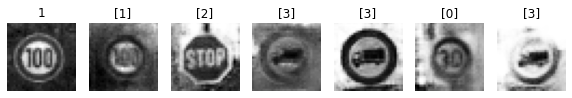

Epoch 78310 g_loss= 1.0722635 d_loss= 1.1258876 real_acc= 0.62 fake_acc= 0.7
Epoch 78320 g_loss= 1.198871 d_loss= 1.0778323 real_acc= 0.7 fake_acc= 0.62
Epoch 78330 g_loss= 0.96049035 d_loss= 1.214704 real_acc= 0.68 fake_acc= 0.6
Epoch 78340 g_loss= 0.92909044 d_loss= 1.4245896 real_acc= 0.52 fake_acc= 0.58
Epoch 78350 g_loss= 1.0236576 d_loss= 1.1952131 real_acc= 0.58 fake_acc= 0.74
Epoch 78360 g_loss= 1.125326 d_loss= 1.0710545 real_acc= 0.72 fake_acc= 0.68
Epoch 78370 g_loss= 1.088154 d_loss= 1.0603776 real_acc= 0.72 fake_acc= 0.7
Epoch 78380 g_loss= 1.0962801 d_loss= 1.1970844 real_acc= 0.64 fake_acc= 0.68
Epoch 78390 g_loss= 1.1171113 d_loss= 1.2648091 real_acc= 0.6 fake_acc= 0.66
Epoch 78400 g_loss= 1.1198577 d_loss= 1.1889222 real_acc= 0.7 fake_acc= 0.72


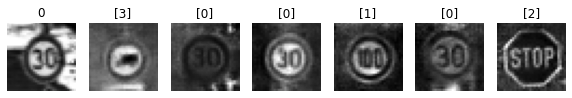

Epoch 78410 g_loss= 1.0532792 d_loss= 1.0879117 real_acc= 0.74 fake_acc= 0.7
Epoch 78420 g_loss= 1.2690204 d_loss= 1.0434351 real_acc= 0.66 fake_acc= 0.84
Epoch 78430 g_loss= 1.023654 d_loss= 1.1868002 real_acc= 0.7 fake_acc= 0.58
Epoch 78440 g_loss= 1.1178013 d_loss= 1.0674274 real_acc= 0.82 fake_acc= 0.72
Epoch 78450 g_loss= 1.1170228 d_loss= 1.1936512 real_acc= 0.54 fake_acc= 0.78
Epoch 78460 g_loss= 1.0622116 d_loss= 1.176487 real_acc= 0.8 fake_acc= 0.52
Epoch 78470 g_loss= 1.2666479 d_loss= 1.0892335 real_acc= 0.66 fake_acc= 0.8
Epoch 78480 g_loss= 1.238459 d_loss= 1.1692824 real_acc= 0.64 fake_acc= 0.62
Epoch 78490 g_loss= 1.2183839 d_loss= 1.1165929 real_acc= 0.62 fake_acc= 0.76
Epoch 78500 g_loss= 0.94360656 d_loss= 1.1486287 real_acc= 0.76 fake_acc= 0.62


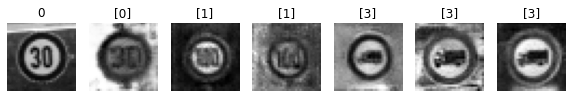

Epoch 78510 g_loss= 1.0334643 d_loss= 1.1942813 real_acc= 0.7 fake_acc= 0.7
Epoch 78520 g_loss= 1.0036559 d_loss= 1.2361133 real_acc= 0.76 fake_acc= 0.54
Epoch 78530 g_loss= 1.005261 d_loss= 1.1957948 real_acc= 0.8 fake_acc= 0.56
Epoch 78540 g_loss= 1.0943501 d_loss= 1.1346272 real_acc= 0.74 fake_acc= 0.7
Epoch 78550 g_loss= 1.1296182 d_loss= 1.0747762 real_acc= 0.66 fake_acc= 0.78
Epoch 78560 g_loss= 1.1430862 d_loss= 0.96744823 real_acc= 0.84 fake_acc= 0.72
Epoch 78570 g_loss= 1.0619686 d_loss= 1.1539359 real_acc= 0.6 fake_acc= 0.66
Epoch 78580 g_loss= 1.1789541 d_loss= 0.9741653 real_acc= 0.8 fake_acc= 0.8
Epoch 78590 g_loss= 0.87859285 d_loss= 1.1625237 real_acc= 0.72 fake_acc= 0.64
Epoch 78600 g_loss= 1.1417273 d_loss= 1.1017065 real_acc= 0.78 fake_acc= 0.6


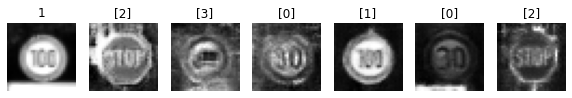

Epoch 78610 g_loss= 0.9735675 d_loss= 1.1689689 real_acc= 0.72 fake_acc= 0.68
Epoch 78620 g_loss= 1.0621023 d_loss= 1.0923975 real_acc= 0.74 fake_acc= 0.78
Epoch 78630 g_loss= 1.242081 d_loss= 1.1031168 real_acc= 0.66 fake_acc= 0.74
Epoch 78640 g_loss= 1.106231 d_loss= 1.2506366 real_acc= 0.64 fake_acc= 0.6
Epoch 78650 g_loss= 1.3614465 d_loss= 1.0599725 real_acc= 0.64 fake_acc= 0.84
Epoch 78660 g_loss= 1.0974202 d_loss= 1.152811 real_acc= 0.7 fake_acc= 0.78
Epoch 78670 g_loss= 1.0343869 d_loss= 1.1423228 real_acc= 0.72 fake_acc= 0.64
Epoch 78680 g_loss= 1.1837007 d_loss= 1.2772182 real_acc= 0.44 fake_acc= 0.8
Epoch 78690 g_loss= 1.0694051 d_loss= 1.100167 real_acc= 0.74 fake_acc= 0.74
Epoch 78700 g_loss= 1.001597 d_loss= 1.1710119 real_acc= 0.68 fake_acc= 0.62


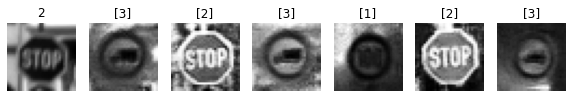

Epoch 78710 g_loss= 1.0068511 d_loss= 1.1633149 real_acc= 0.76 fake_acc= 0.62
Epoch 78720 g_loss= 0.97382337 d_loss= 1.2671069 real_acc= 0.66 fake_acc= 0.64
Epoch 78730 g_loss= 1.0395463 d_loss= 1.2507772 real_acc= 0.6 fake_acc= 0.62
Epoch 78740 g_loss= 1.0700399 d_loss= 1.134172 real_acc= 0.74 fake_acc= 0.64
Epoch 78750 g_loss= 1.1082848 d_loss= 1.207546 real_acc= 0.76 fake_acc= 0.64
Epoch 78760 g_loss= 1.06997 d_loss= 1.1847402 real_acc= 0.6 fake_acc= 0.7
Epoch 78770 g_loss= 1.2321411 d_loss= 1.0593818 real_acc= 0.68 fake_acc= 0.78
Epoch 78780 g_loss= 1.3275646 d_loss= 1.1550282 real_acc= 0.58 fake_acc= 0.74
Epoch 78790 g_loss= 1.2563632 d_loss= 0.99213517 real_acc= 0.76 fake_acc= 0.74
Epoch 78800 g_loss= 0.9880477 d_loss= 1.1235843 real_acc= 0.74 fake_acc= 0.64


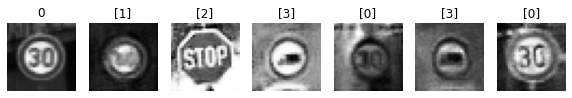

Epoch 78810 g_loss= 0.8911924 d_loss= 1.2296889 real_acc= 0.7 fake_acc= 0.62
Epoch 78820 g_loss= 1.1769948 d_loss= 1.1172173 real_acc= 0.7 fake_acc= 0.76
Epoch 78830 g_loss= 1.0970755 d_loss= 1.1477036 real_acc= 0.7 fake_acc= 0.7
Epoch 78840 g_loss= 1.1078305 d_loss= 1.0325799 real_acc= 0.74 fake_acc= 0.7
Epoch 78850 g_loss= 1.043809 d_loss= 1.1865265 real_acc= 0.62 fake_acc= 0.66
Epoch 78860 g_loss= 1.069243 d_loss= 1.2551379 real_acc= 0.56 fake_acc= 0.72
Epoch 78870 g_loss= 1.0265801 d_loss= 1.1889821 real_acc= 0.66 fake_acc= 0.6
Epoch 78880 g_loss= 0.9481043 d_loss= 1.2850718 real_acc= 0.7 fake_acc= 0.56
Epoch 78890 g_loss= 0.92441106 d_loss= 1.205321 real_acc= 0.76 fake_acc= 0.54
Epoch 78900 g_loss= 1.2279539 d_loss= 1.1442423 real_acc= 0.74 fake_acc= 0.68


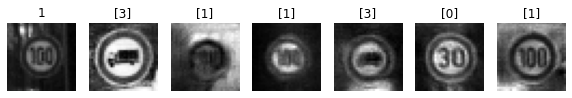

Epoch 78910 g_loss= 1.1347016 d_loss= 1.2567406 real_acc= 0.58 fake_acc= 0.8
Epoch 78920 g_loss= 1.1363395 d_loss= 1.1540807 real_acc= 0.58 fake_acc= 0.8
Epoch 78930 g_loss= 1.1690365 d_loss= 1.2262654 real_acc= 0.62 fake_acc= 0.86
Epoch 78940 g_loss= 0.8877932 d_loss= 0.9759108 real_acc= 0.9 fake_acc= 0.66
Epoch 78950 g_loss= 1.0584533 d_loss= 1.0920427 real_acc= 0.72 fake_acc= 0.7
Epoch 78960 g_loss= 1.1134238 d_loss= 1.1477621 real_acc= 0.7 fake_acc= 0.74
Epoch 78970 g_loss= 0.927285 d_loss= 1.2488171 real_acc= 0.74 fake_acc= 0.54
Epoch 78980 g_loss= 0.93670386 d_loss= 1.1756558 real_acc= 0.82 fake_acc= 0.6
Epoch 78990 g_loss= 1.0522375 d_loss= 1.2232717 real_acc= 0.62 fake_acc= 0.66
Epoch 79000 g_loss= 0.9673192 d_loss= 1.157826 real_acc= 0.78 fake_acc= 0.6


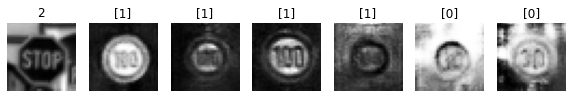

Epoch 79010 g_loss= 1.1983023 d_loss= 0.9976275 real_acc= 0.82 fake_acc= 0.72
Epoch 79020 g_loss= 1.2059321 d_loss= 1.1773986 real_acc= 0.56 fake_acc= 0.76
Epoch 79030 g_loss= 1.0963144 d_loss= 1.170509 real_acc= 0.62 fake_acc= 0.68
Epoch 79040 g_loss= 0.89271635 d_loss= 1.2843077 real_acc= 0.7 fake_acc= 0.56
Epoch 79050 g_loss= 0.96271414 d_loss= 1.2922857 real_acc= 0.68 fake_acc= 0.64
Epoch 79060 g_loss= 1.028821 d_loss= 1.1516788 real_acc= 0.76 fake_acc= 0.64
Epoch 79070 g_loss= 0.97654676 d_loss= 1.1739732 real_acc= 0.72 fake_acc= 0.64
Epoch 79080 g_loss= 1.0832675 d_loss= 1.2041689 real_acc= 0.62 fake_acc= 0.72
Epoch 79090 g_loss= 1.0933796 d_loss= 1.3901854 real_acc= 0.48 fake_acc= 0.64
Epoch 79100 g_loss= 1.0178896 d_loss= 1.1588343 real_acc= 0.76 fake_acc= 0.68


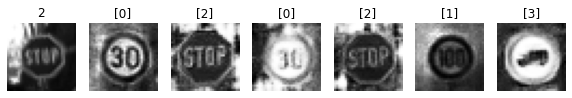

Epoch 79110 g_loss= 0.9965309 d_loss= 1.1244292 real_acc= 0.7 fake_acc= 0.72
Epoch 79120 g_loss= 1.0741637 d_loss= 1.1349401 real_acc= 0.7 fake_acc= 0.7
Epoch 79130 g_loss= 1.0155219 d_loss= 1.1355393 real_acc= 0.72 fake_acc= 0.7
Epoch 79140 g_loss= 0.9519542 d_loss= 1.1317748 real_acc= 0.72 fake_acc= 0.68
Epoch 79150 g_loss= 0.9602541 d_loss= 1.1428164 real_acc= 0.74 fake_acc= 0.62
Epoch 79160 g_loss= 1.3050503 d_loss= 1.0810411 real_acc= 0.56 fake_acc= 0.82
Epoch 79170 g_loss= 1.0367321 d_loss= 1.1180048 real_acc= 0.7 fake_acc= 0.58
Epoch 79180 g_loss= 0.8834454 d_loss= 1.1640264 real_acc= 0.74 fake_acc= 0.66
Epoch 79190 g_loss= 1.1134241 d_loss= 1.0455267 real_acc= 0.84 fake_acc= 0.7
Epoch 79200 g_loss= 1.1677287 d_loss= 1.0357224 real_acc= 0.66 fake_acc= 0.86


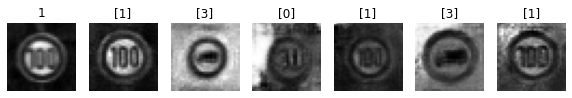

Epoch 79210 g_loss= 0.8725012 d_loss= 1.2844467 real_acc= 0.68 fake_acc= 0.58
Epoch 79220 g_loss= 1.0466635 d_loss= 1.1496603 real_acc= 0.74 fake_acc= 0.64
Epoch 79230 g_loss= 0.90942216 d_loss= 1.2160121 real_acc= 0.7 fake_acc= 0.52
Epoch 79240 g_loss= 0.92856246 d_loss= 1.1984644 real_acc= 0.76 fake_acc= 0.6
Epoch 79250 g_loss= 1.0318434 d_loss= 1.067701 real_acc= 0.74 fake_acc= 0.64
Epoch 79260 g_loss= 1.0780704 d_loss= 1.2328925 real_acc= 0.62 fake_acc= 0.76
Epoch 79270 g_loss= 0.9681343 d_loss= 1.125483 real_acc= 0.76 fake_acc= 0.68
Epoch 79280 g_loss= 1.1056705 d_loss= 1.1010878 real_acc= 0.82 fake_acc= 0.68
Epoch 79290 g_loss= 1.0835286 d_loss= 1.2329302 real_acc= 0.6 fake_acc= 0.68
Epoch 79300 g_loss= 1.1194391 d_loss= 1.0157747 real_acc= 0.76 fake_acc= 0.74


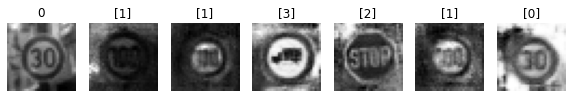

Epoch 79310 g_loss= 1.241581 d_loss= 1.0487845 real_acc= 0.72 fake_acc= 0.78
Epoch 79320 g_loss= 0.9446905 d_loss= 1.3070571 real_acc= 0.58 fake_acc= 0.64
Epoch 79330 g_loss= 1.140717 d_loss= 1.3396152 real_acc= 0.44 fake_acc= 0.7
Epoch 79340 g_loss= 1.0898795 d_loss= 1.1071525 real_acc= 0.56 fake_acc= 0.74
Epoch 79350 g_loss= 1.1019502 d_loss= 1.0248954 real_acc= 0.82 fake_acc= 0.74
Epoch 79360 g_loss= 1.1355853 d_loss= 1.2096215 real_acc= 0.62 fake_acc= 0.72
Epoch 79370 g_loss= 1.0800619 d_loss= 1.1733527 real_acc= 0.68 fake_acc= 0.78
Epoch 79380 g_loss= 1.2918569 d_loss= 0.99710643 real_acc= 0.78 fake_acc= 0.82
Epoch 79390 g_loss= 1.2669721 d_loss= 1.0880356 real_acc= 0.7 fake_acc= 0.78
Epoch 79400 g_loss= 1.1888583 d_loss= 1.0971489 real_acc= 0.74 fake_acc= 0.72


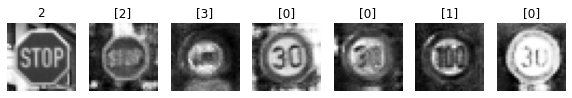

Epoch 79410 g_loss= 0.9449019 d_loss= 1.237982 real_acc= 0.7 fake_acc= 0.62
Epoch 79420 g_loss= 1.2232232 d_loss= 1.1563152 real_acc= 0.62 fake_acc= 0.86
Epoch 79430 g_loss= 0.92534035 d_loss= 1.2806085 real_acc= 0.8 fake_acc= 0.54
Epoch 79440 g_loss= 1.1488316 d_loss= 1.1361747 real_acc= 0.58 fake_acc= 0.74
Epoch 79450 g_loss= 1.2422386 d_loss= 1.0238878 real_acc= 0.78 fake_acc= 0.7
Epoch 79460 g_loss= 1.0664078 d_loss= 1.1924735 real_acc= 0.64 fake_acc= 0.66
Epoch 79470 g_loss= 1.0450811 d_loss= 1.0885768 real_acc= 0.74 fake_acc= 0.7
Epoch 79480 g_loss= 1.0981035 d_loss= 1.0851038 real_acc= 0.8 fake_acc= 0.74
Epoch 79490 g_loss= 1.0838611 d_loss= 1.0051821 real_acc= 0.78 fake_acc= 0.74
Epoch 79500 g_loss= 1.1771442 d_loss= 1.1627083 real_acc= 0.66 fake_acc= 0.76


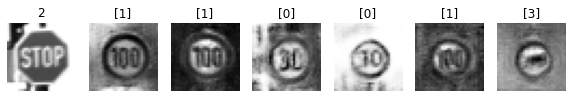

Epoch 79510 g_loss= 1.0797336 d_loss= 1.0585704 real_acc= 0.76 fake_acc= 0.7
Epoch 79520 g_loss= 1.0693368 d_loss= 1.1949698 real_acc= 0.76 fake_acc= 0.64
Epoch 79530 g_loss= 1.1819873 d_loss= 1.1412652 real_acc= 0.62 fake_acc= 0.74
Epoch 79540 g_loss= 1.1680508 d_loss= 1.2015476 real_acc= 0.5 fake_acc= 0.78
Epoch 79550 g_loss= 1.0230588 d_loss= 1.1844342 real_acc= 0.64 fake_acc= 0.64
Epoch 79560 g_loss= 0.8795604 d_loss= 1.1380683 real_acc= 0.84 fake_acc= 0.58
Epoch 79570 g_loss= 1.0471854 d_loss= 1.0652623 real_acc= 0.84 fake_acc= 0.66
Epoch 79580 g_loss= 1.309156 d_loss= 1.1212019 real_acc= 0.58 fake_acc= 0.74
Epoch 79590 g_loss= 1.0219202 d_loss= 1.2987707 real_acc= 0.6 fake_acc= 0.58
Epoch 79600 g_loss= 1.0633092 d_loss= 1.1703448 real_acc= 0.66 fake_acc= 0.7


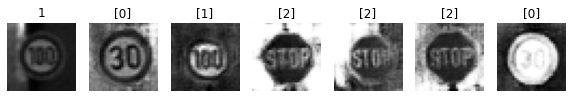

Epoch 79610 g_loss= 0.789702 d_loss= 1.2594002 real_acc= 0.74 fake_acc= 0.5
Epoch 79620 g_loss= 1.0933311 d_loss= 1.2015929 real_acc= 0.6 fake_acc= 0.78
Epoch 79630 g_loss= 1.0259687 d_loss= 1.1139283 real_acc= 0.66 fake_acc= 0.68
Epoch 79640 g_loss= 0.9539542 d_loss= 1.2192421 real_acc= 0.66 fake_acc= 0.64
Epoch 79650 g_loss= 0.8537282 d_loss= 1.2040501 real_acc= 0.78 fake_acc= 0.58
Epoch 79660 g_loss= 1.142917 d_loss= 1.0713689 real_acc= 0.82 fake_acc= 0.72
Epoch 79670 g_loss= 1.118419 d_loss= 1.16377 real_acc= 0.66 fake_acc= 0.64
Epoch 79680 g_loss= 1.1235034 d_loss= 1.1415844 real_acc= 0.58 fake_acc= 0.74
Epoch 79690 g_loss= 1.0241398 d_loss= 1.1766664 real_acc= 0.76 fake_acc= 0.62
Epoch 79700 g_loss= 1.1041095 d_loss= 1.2339923 real_acc= 0.56 fake_acc= 0.68


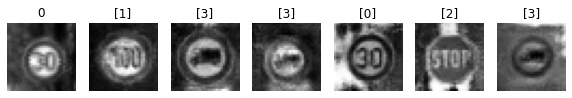

Epoch 79710 g_loss= 1.2509367 d_loss= 1.0397959 real_acc= 0.7 fake_acc= 0.76
Epoch 79720 g_loss= 1.0659201 d_loss= 1.2333485 real_acc= 0.56 fake_acc= 0.72
Epoch 79730 g_loss= 1.0847052 d_loss= 1.1188502 real_acc= 0.7 fake_acc= 0.74
Epoch 79740 g_loss= 1.0095637 d_loss= 1.1789296 real_acc= 0.7 fake_acc= 0.7
Epoch 79750 g_loss= 1.2871736 d_loss= 1.0613495 real_acc= 0.56 fake_acc= 0.84
Epoch 79760 g_loss= 1.0751262 d_loss= 1.156249 real_acc= 0.66 fake_acc= 0.7
Epoch 79770 g_loss= 0.95035154 d_loss= 1.1591516 real_acc= 0.8 fake_acc= 0.64
Epoch 79780 g_loss= 1.0756679 d_loss= 1.1506506 real_acc= 0.62 fake_acc= 0.76
Epoch 79790 g_loss= 1.0334762 d_loss= 1.1778104 real_acc= 0.56 fake_acc= 0.76
Epoch 79800 g_loss= 1.0075064 d_loss= 1.2322769 real_acc= 0.6 fake_acc= 0.68


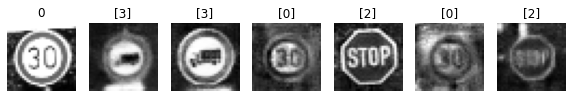

Epoch 79810 g_loss= 1.0949615 d_loss= 1.1230619 real_acc= 0.72 fake_acc= 0.6
Epoch 79820 g_loss= 0.9408752 d_loss= 1.2271147 real_acc= 0.72 fake_acc= 0.64
Epoch 79830 g_loss= 1.0972667 d_loss= 1.0530145 real_acc= 0.66 fake_acc= 0.78
Epoch 79840 g_loss= 1.0044873 d_loss= 1.0185862 real_acc= 0.72 fake_acc= 0.76
Epoch 79850 g_loss= 1.06133 d_loss= 1.066443 real_acc= 0.7 fake_acc= 0.72
Epoch 79860 g_loss= 1.2755059 d_loss= 1.1048126 real_acc= 0.6 fake_acc= 0.82
Epoch 79870 g_loss= 1.2262156 d_loss= 1.0626116 real_acc= 0.76 fake_acc= 0.74
Epoch 79880 g_loss= 0.9951246 d_loss= 1.18791 real_acc= 0.74 fake_acc= 0.64
Epoch 79890 g_loss= 1.0392818 d_loss= 1.1801162 real_acc= 0.62 fake_acc= 0.74
Epoch 79900 g_loss= 1.3215617 d_loss= 1.0771775 real_acc= 0.56 fake_acc= 0.88


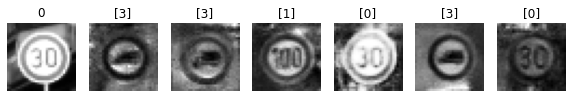

Epoch 79910 g_loss= 0.99412394 d_loss= 1.2123487 real_acc= 0.72 fake_acc= 0.62
Epoch 79920 g_loss= 0.9541239 d_loss= 1.1406696 real_acc= 0.8 fake_acc= 0.56
Epoch 79930 g_loss= 1.0365216 d_loss= 1.1373408 real_acc= 0.78 fake_acc= 0.58
Epoch 79940 g_loss= 1.0286576 d_loss= 1.198374 real_acc= 0.7 fake_acc= 0.66
Epoch 79950 g_loss= 1.1042519 d_loss= 1.0566468 real_acc= 0.74 fake_acc= 0.7
Epoch 79960 g_loss= 1.078592 d_loss= 1.0870067 real_acc= 0.7 fake_acc= 0.68
Epoch 79970 g_loss= 1.078068 d_loss= 1.0026015 real_acc= 0.86 fake_acc= 0.76
Epoch 79980 g_loss= 1.1759536 d_loss= 1.0232263 real_acc= 0.68 fake_acc= 0.76
Epoch 79990 g_loss= 1.1185312 d_loss= 1.1615548 real_acc= 0.66 fake_acc= 0.74
Epoch 80000 g_loss= 1.2934035 d_loss= 1.0427511 real_acc= 0.64 fake_acc= 0.78


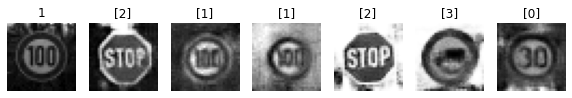

Epoch 80010 g_loss= 1.0431944 d_loss= 1.0416946 real_acc= 0.8 fake_acc= 0.6
Epoch 80020 g_loss= 1.071706 d_loss= 1.289818 real_acc= 0.58 fake_acc= 0.7
Epoch 80030 g_loss= 1.1902308 d_loss= 1.0785651 real_acc= 0.64 fake_acc= 0.8
Epoch 80040 g_loss= 1.0795065 d_loss= 1.1143105 real_acc= 0.74 fake_acc= 0.72
Epoch 80050 g_loss= 0.9124974 d_loss= 1.2291387 real_acc= 0.76 fake_acc= 0.52
Epoch 80060 g_loss= 1.1180578 d_loss= 1.0745277 real_acc= 0.6 fake_acc= 0.8
Epoch 80070 g_loss= 1.0076388 d_loss= 1.2622423 real_acc= 0.62 fake_acc= 0.74
Epoch 80080 g_loss= 0.9467662 d_loss= 1.1455253 real_acc= 0.8 fake_acc= 0.52
Epoch 80090 g_loss= 0.96794075 d_loss= 1.2048695 real_acc= 0.7 fake_acc= 0.52
Epoch 80100 g_loss= 1.0688891 d_loss= 0.9773034 real_acc= 0.86 fake_acc= 0.68


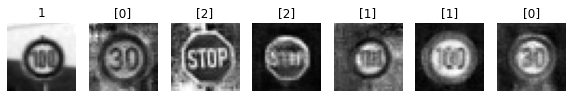

Epoch 80110 g_loss= 0.92607933 d_loss= 1.172945 real_acc= 0.78 fake_acc= 0.58
Epoch 80120 g_loss= 1.147585 d_loss= 1.0637121 real_acc= 0.78 fake_acc= 0.74
Epoch 80130 g_loss= 1.1403987 d_loss= 1.0665778 real_acc= 0.7 fake_acc= 0.74
Epoch 80140 g_loss= 1.0822476 d_loss= 1.0555326 real_acc= 0.78 fake_acc= 0.58
Epoch 80150 g_loss= 1.0554054 d_loss= 1.2562203 real_acc= 0.58 fake_acc= 0.72
Epoch 80160 g_loss= 1.1920929 d_loss= 1.1343633 real_acc= 0.62 fake_acc= 0.72
Epoch 80170 g_loss= 0.91555136 d_loss= 1.31425 real_acc= 0.62 fake_acc= 0.58
Epoch 80180 g_loss= 0.90868974 d_loss= 1.1333215 real_acc= 0.9 fake_acc= 0.48
Epoch 80190 g_loss= 1.1240929 d_loss= 1.2320843 real_acc= 0.6 fake_acc= 0.78
Epoch 80200 g_loss= 1.0567484 d_loss= 1.1042931 real_acc= 0.76 fake_acc= 0.82


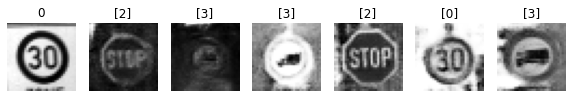

Epoch 80210 g_loss= 0.8799368 d_loss= 1.1865047 real_acc= 0.82 fake_acc= 0.5
Epoch 80220 g_loss= 0.9652684 d_loss= 1.1122081 real_acc= 0.78 fake_acc= 0.66
Epoch 80230 g_loss= 1.0521693 d_loss= 1.0537847 real_acc= 0.82 fake_acc= 0.7
Epoch 80240 g_loss= 1.094804 d_loss= 1.1983128 real_acc= 0.7 fake_acc= 0.72
Epoch 80250 g_loss= 1.0467634 d_loss= 1.0762285 real_acc= 0.8 fake_acc= 0.6
Epoch 80260 g_loss= 1.1040801 d_loss= 1.0268447 real_acc= 0.76 fake_acc= 0.62
Epoch 80270 g_loss= 1.1812426 d_loss= 1.1587796 real_acc= 0.58 fake_acc= 0.72
Epoch 80280 g_loss= 1.2577605 d_loss= 0.985018 real_acc= 0.7 fake_acc= 0.82
Epoch 80290 g_loss= 1.086633 d_loss= 1.1495944 real_acc= 0.62 fake_acc= 0.66
Epoch 80300 g_loss= 1.0815599 d_loss= 1.3248419 real_acc= 0.62 fake_acc= 0.66


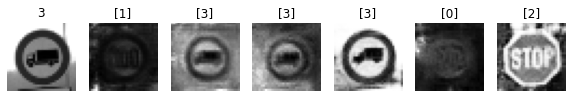

Epoch 80310 g_loss= 1.0240138 d_loss= 1.1271498 real_acc= 0.72 fake_acc= 0.62
Epoch 80320 g_loss= 1.1185291 d_loss= 1.1173453 real_acc= 0.76 fake_acc= 0.66
Epoch 80330 g_loss= 1.1278214 d_loss= 1.176042 real_acc= 0.56 fake_acc= 0.74
Epoch 80340 g_loss= 0.98122114 d_loss= 1.1729844 real_acc= 0.74 fake_acc= 0.54
Epoch 80350 g_loss= 1.1366237 d_loss= 1.0975982 real_acc= 0.68 fake_acc= 0.68
Epoch 80360 g_loss= 1.2466133 d_loss= 1.0901967 real_acc= 0.58 fake_acc= 0.76
Epoch 80370 g_loss= 1.2248415 d_loss= 1.0603727 real_acc= 0.78 fake_acc= 0.78
Epoch 80380 g_loss= 1.0032235 d_loss= 1.1200968 real_acc= 0.78 fake_acc= 0.68
Epoch 80390 g_loss= 1.0327253 d_loss= 1.2859708 real_acc= 0.64 fake_acc= 0.56
Epoch 80400 g_loss= 1.1047378 d_loss= 1.0945199 real_acc= 0.68 fake_acc= 0.8


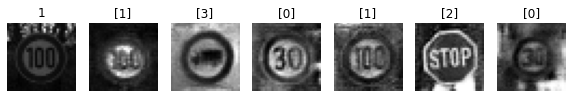

Epoch 80410 g_loss= 1.0944247 d_loss= 1.0615286 real_acc= 0.76 fake_acc= 0.78
Epoch 80420 g_loss= 1.0273 d_loss= 1.1465454 real_acc= 0.7 fake_acc= 0.72
Epoch 80430 g_loss= 1.1226102 d_loss= 1.1060848 real_acc= 0.72 fake_acc= 0.72
Epoch 80440 g_loss= 1.0618697 d_loss= 1.1164689 real_acc= 0.72 fake_acc= 0.72
Epoch 80450 g_loss= 0.8934375 d_loss= 1.2373228 real_acc= 0.78 fake_acc= 0.52
Epoch 80460 g_loss= 1.0507773 d_loss= 1.1095316 real_acc= 0.76 fake_acc= 0.66
Epoch 80470 g_loss= 1.3746456 d_loss= 1.0796379 real_acc= 0.64 fake_acc= 0.82
Epoch 80480 g_loss= 1.0010798 d_loss= 1.1870887 real_acc= 0.72 fake_acc= 0.58
Epoch 80490 g_loss= 0.90273774 d_loss= 1.3006935 real_acc= 0.66 fake_acc= 0.6
Epoch 80500 g_loss= 1.1241281 d_loss= 1.0608126 real_acc= 0.7 fake_acc= 0.76


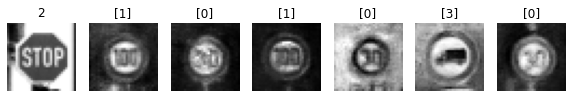

Epoch 80510 g_loss= 0.94956434 d_loss= 1.2714553 real_acc= 0.68 fake_acc= 0.6
Epoch 80520 g_loss= 0.8742436 d_loss= 1.2191371 real_acc= 0.8 fake_acc= 0.6
Epoch 80530 g_loss= 1.0559314 d_loss= 1.1966231 real_acc= 0.72 fake_acc= 0.62
Epoch 80540 g_loss= 1.1181087 d_loss= 1.1409537 real_acc= 0.62 fake_acc= 0.66
Epoch 80550 g_loss= 0.9407059 d_loss= 1.2571795 real_acc= 0.68 fake_acc= 0.52
Epoch 80560 g_loss= 1.1684921 d_loss= 1.140332 real_acc= 0.66 fake_acc= 0.62
Epoch 80570 g_loss= 1.1978186 d_loss= 1.091227 real_acc= 0.72 fake_acc= 0.68
Epoch 80580 g_loss= 1.1968037 d_loss= 1.0521262 real_acc= 0.8 fake_acc= 0.76
Epoch 80590 g_loss= 1.2767992 d_loss= 1.1172364 real_acc= 0.56 fake_acc= 0.82
Epoch 80600 g_loss= 0.92367333 d_loss= 1.1188061 real_acc= 0.7 fake_acc= 0.68


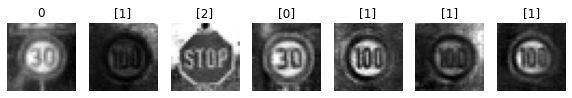

Epoch 80610 g_loss= 1.0494357 d_loss= 1.1035187 real_acc= 0.72 fake_acc= 0.74
Epoch 80620 g_loss= 0.9726058 d_loss= 1.1286671 real_acc= 0.68 fake_acc= 0.68
Epoch 80630 g_loss= 1.0173649 d_loss= 1.2522907 real_acc= 0.62 fake_acc= 0.54
Epoch 80640 g_loss= 1.114783 d_loss= 1.1206222 real_acc= 0.72 fake_acc= 0.7
Epoch 80650 g_loss= 1.0271398 d_loss= 1.1049616 real_acc= 0.72 fake_acc= 0.64
Epoch 80660 g_loss= 1.0512959 d_loss= 1.0603123 real_acc= 0.78 fake_acc= 0.62
Epoch 80670 g_loss= 1.1305544 d_loss= 1.2179763 real_acc= 0.58 fake_acc= 0.72
Epoch 80680 g_loss= 1.1478305 d_loss= 1.1281991 real_acc= 0.66 fake_acc= 0.78
Epoch 80690 g_loss= 0.998686 d_loss= 1.0657358 real_acc= 0.72 fake_acc= 0.72
Epoch 80700 g_loss= 1.1070967 d_loss= 1.152508 real_acc= 0.7 fake_acc= 0.62


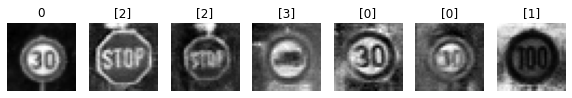

Epoch 80710 g_loss= 0.78419757 d_loss= 1.3021991 real_acc= 0.78 fake_acc= 0.42
Epoch 80720 g_loss= 1.10319 d_loss= 1.1468039 real_acc= 0.72 fake_acc= 0.68
Epoch 80730 g_loss= 1.0555383 d_loss= 1.1537453 real_acc= 0.74 fake_acc= 0.58
Epoch 80740 g_loss= 1.0009296 d_loss= 1.0941578 real_acc= 0.72 fake_acc= 0.7
Epoch 80750 g_loss= 0.985533 d_loss= 1.0562975 real_acc= 0.82 fake_acc= 0.7
Epoch 80760 g_loss= 1.0341522 d_loss= 1.14481 real_acc= 0.68 fake_acc= 0.68
Epoch 80770 g_loss= 1.0122834 d_loss= 1.2957528 real_acc= 0.6 fake_acc= 0.62
Epoch 80780 g_loss= 1.0341297 d_loss= 1.1516324 real_acc= 0.74 fake_acc= 0.64
Epoch 80790 g_loss= 1.0506397 d_loss= 1.0677308 real_acc= 0.74 fake_acc= 0.76
Epoch 80800 g_loss= 1.0657849 d_loss= 1.1682155 real_acc= 0.72 fake_acc= 0.7


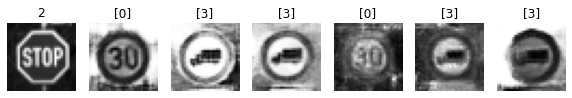

Epoch 80810 g_loss= 1.1654192 d_loss= 1.0992719 real_acc= 0.76 fake_acc= 0.74
Epoch 80820 g_loss= 1.0831387 d_loss= 1.1231003 real_acc= 0.7 fake_acc= 0.74
Epoch 80830 g_loss= 1.1792614 d_loss= 1.0939252 real_acc= 0.76 fake_acc= 0.74
Epoch 80840 g_loss= 1.2773612 d_loss= 1.0252615 real_acc= 0.74 fake_acc= 0.84
Epoch 80850 g_loss= 1.0752802 d_loss= 1.0977242 real_acc= 0.74 fake_acc= 0.64
Epoch 80860 g_loss= 1.1308731 d_loss= 1.0900476 real_acc= 0.7 fake_acc= 0.72
Epoch 80870 g_loss= 1.0208273 d_loss= 1.1750054 real_acc= 0.78 fake_acc= 0.62
Epoch 80880 g_loss= 1.1780617 d_loss= 1.1397357 real_acc= 0.62 fake_acc= 0.7
Epoch 80890 g_loss= 1.0722936 d_loss= 1.1457715 real_acc= 0.6 fake_acc= 0.7
Epoch 80900 g_loss= 0.901125 d_loss= 1.2423356 real_acc= 0.64 fake_acc= 0.62


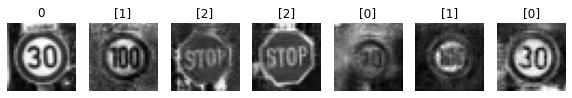

Epoch 80910 g_loss= 0.9650154 d_loss= 1.1705744 real_acc= 0.64 fake_acc= 0.66
Epoch 80920 g_loss= 1.0494602 d_loss= 1.0669512 real_acc= 0.74 fake_acc= 0.74
Epoch 80930 g_loss= 1.0519265 d_loss= 1.1308618 real_acc= 0.82 fake_acc= 0.6
Epoch 80940 g_loss= 0.9400327 d_loss= 1.15769 real_acc= 0.84 fake_acc= 0.62
Epoch 80950 g_loss= 1.05766 d_loss= 1.3115525 real_acc= 0.66 fake_acc= 0.7
Epoch 80960 g_loss= 1.0672529 d_loss= 1.1690121 real_acc= 0.58 fake_acc= 0.64
Epoch 80970 g_loss= 1.1422583 d_loss= 1.2344289 real_acc= 0.58 fake_acc= 0.78
Epoch 80980 g_loss= 1.0304807 d_loss= 1.153731 real_acc= 0.7 fake_acc= 0.68
Epoch 80990 g_loss= 0.98386216 d_loss= 1.1718045 real_acc= 0.8 fake_acc= 0.62
Epoch 81000 g_loss= 1.1418214 d_loss= 1.0236199 real_acc= 0.7 fake_acc= 0.78


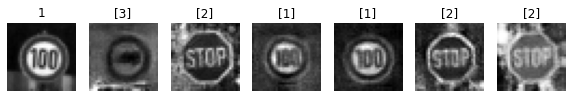

Epoch 81010 g_loss= 1.1634457 d_loss= 1.0468793 real_acc= 0.66 fake_acc= 0.76
Epoch 81020 g_loss= 1.0676224 d_loss= 1.088927 real_acc= 0.8 fake_acc= 0.66
Epoch 81030 g_loss= 0.9466308 d_loss= 1.221078 real_acc= 0.7 fake_acc= 0.52
Epoch 81040 g_loss= 1.1504607 d_loss= 1.0113406 real_acc= 0.8 fake_acc= 0.74
Epoch 81050 g_loss= 1.1674377 d_loss= 1.1663254 real_acc= 0.7 fake_acc= 0.62
Epoch 81060 g_loss= 0.9839779 d_loss= 1.0662929 real_acc= 0.82 fake_acc= 0.66
Epoch 81070 g_loss= 0.9845502 d_loss= 1.2774528 real_acc= 0.54 fake_acc= 0.64
Epoch 81080 g_loss= 1.113244 d_loss= 1.1707964 real_acc= 0.62 fake_acc= 0.7
Epoch 81090 g_loss= 1.2174578 d_loss= 1.0730134 real_acc= 0.72 fake_acc= 0.76
Epoch 81100 g_loss= 1.0982612 d_loss= 1.187448 real_acc= 0.74 fake_acc= 0.58


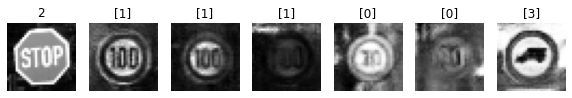

Epoch 81110 g_loss= 0.96011466 d_loss= 1.2442863 real_acc= 0.62 fake_acc= 0.64
Epoch 81120 g_loss= 1.2458808 d_loss= 0.9551041 real_acc= 0.78 fake_acc= 0.8
Epoch 81130 g_loss= 0.9939817 d_loss= 1.2519677 real_acc= 0.66 fake_acc= 0.62
Epoch 81140 g_loss= 0.876293 d_loss= 1.1967381 real_acc= 0.76 fake_acc= 0.58
Epoch 81150 g_loss= 1.0670688 d_loss= 1.1600418 real_acc= 0.66 fake_acc= 0.72
Epoch 81160 g_loss= 1.0760293 d_loss= 1.162118 real_acc= 0.7 fake_acc= 0.66
Epoch 81170 g_loss= 1.0618746 d_loss= 1.1882157 real_acc= 0.7 fake_acc= 0.7
Epoch 81180 g_loss= 1.2467108 d_loss= 1.0796158 real_acc= 0.7 fake_acc= 0.78
Epoch 81190 g_loss= 1.0981635 d_loss= 1.1226339 real_acc= 0.72 fake_acc= 0.8
Epoch 81200 g_loss= 1.106741 d_loss= 1.0493777 real_acc= 0.76 fake_acc= 0.68


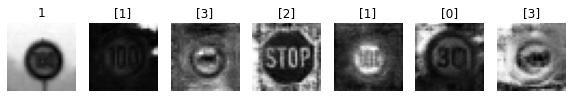

Epoch 81210 g_loss= 1.0872777 d_loss= 1.29255 real_acc= 0.56 fake_acc= 0.76
Epoch 81220 g_loss= 1.1723424 d_loss= 1.1760645 real_acc= 0.68 fake_acc= 0.76
Epoch 81230 g_loss= 1.1269023 d_loss= 1.0341859 real_acc= 0.76 fake_acc= 0.72
Epoch 81240 g_loss= 1.0506325 d_loss= 1.2756209 real_acc= 0.58 fake_acc= 0.6
Epoch 81250 g_loss= 1.0048494 d_loss= 1.1290176 real_acc= 0.78 fake_acc= 0.64
Epoch 81260 g_loss= 0.96612465 d_loss= 1.1751897 real_acc= 0.64 fake_acc= 0.7
Epoch 81270 g_loss= 1.0117341 d_loss= 1.1636368 real_acc= 0.76 fake_acc= 0.66
Epoch 81280 g_loss= 1.1653326 d_loss= 1.1491716 real_acc= 0.56 fake_acc= 0.78
Epoch 81290 g_loss= 1.1973606 d_loss= 1.258954 real_acc= 0.54 fake_acc= 0.7
Epoch 81300 g_loss= 1.1213908 d_loss= 1.2217079 real_acc= 0.6 fake_acc= 0.68


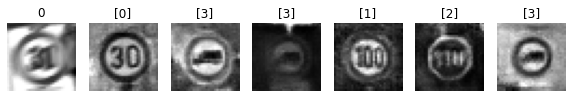

Epoch 81310 g_loss= 0.96137863 d_loss= 1.1244438 real_acc= 0.76 fake_acc= 0.62
Epoch 81320 g_loss= 0.95589846 d_loss= 1.0478995 real_acc= 0.86 fake_acc= 0.64
Epoch 81330 g_loss= 1.0968505 d_loss= 1.1639807 real_acc= 0.7 fake_acc= 0.64
Epoch 81340 g_loss= 1.0679127 d_loss= 1.2698162 real_acc= 0.62 fake_acc= 0.74
Epoch 81350 g_loss= 1.1594301 d_loss= 1.1940916 real_acc= 0.7 fake_acc= 0.68
Epoch 81360 g_loss= 1.0160426 d_loss= 1.1226981 real_acc= 0.76 fake_acc= 0.6
Epoch 81370 g_loss= 1.4048858 d_loss= 1.0244019 real_acc= 0.56 fake_acc= 0.8
Epoch 81380 g_loss= 1.1512245 d_loss= 1.0993769 real_acc= 0.8 fake_acc= 0.68
Epoch 81390 g_loss= 0.879983 d_loss= 1.1695571 real_acc= 0.68 fake_acc= 0.72
Epoch 81400 g_loss= 1.023029 d_loss= 1.1508374 real_acc= 0.74 fake_acc= 0.68


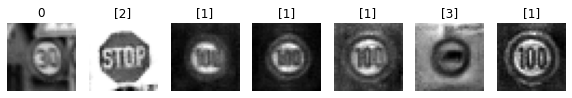

Epoch 81410 g_loss= 1.0580364 d_loss= 1.240654 real_acc= 0.64 fake_acc= 0.7
Epoch 81420 g_loss= 1.2050096 d_loss= 1.1247814 real_acc= 0.66 fake_acc= 0.72
Epoch 81430 g_loss= 1.1062332 d_loss= 1.1872228 real_acc= 0.68 fake_acc= 0.66
Epoch 81440 g_loss= 1.011273 d_loss= 1.1444669 real_acc= 0.66 fake_acc= 0.66
Epoch 81450 g_loss= 1.1317947 d_loss= 1.0409567 real_acc= 0.76 fake_acc= 0.64
Epoch 81460 g_loss= 0.9746352 d_loss= 1.1794734 real_acc= 0.74 fake_acc= 0.64
Epoch 81470 g_loss= 1.0656015 d_loss= 1.1049407 real_acc= 0.76 fake_acc= 0.72
Epoch 81480 g_loss= 1.0016977 d_loss= 1.1072683 real_acc= 0.72 fake_acc= 0.56
Epoch 81490 g_loss= 1.0836132 d_loss= 1.1102842 real_acc= 0.68 fake_acc= 0.76
Epoch 81500 g_loss= 1.1155596 d_loss= 1.0596433 real_acc= 0.7 fake_acc= 0.7


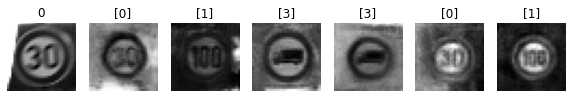

Epoch 81510 g_loss= 1.0893213 d_loss= 1.1898463 real_acc= 0.66 fake_acc= 0.62
Epoch 81520 g_loss= 1.2056491 d_loss= 1.1400609 real_acc= 0.66 fake_acc= 0.66
Epoch 81530 g_loss= 1.033836 d_loss= 1.1357026 real_acc= 0.76 fake_acc= 0.66
Epoch 81540 g_loss= 0.98422235 d_loss= 1.1248115 real_acc= 0.66 fake_acc= 0.76
Epoch 81550 g_loss= 1.0851977 d_loss= 1.2221147 real_acc= 0.56 fake_acc= 0.76
Epoch 81560 g_loss= 1.0947624 d_loss= 1.0919088 real_acc= 0.84 fake_acc= 0.6
Epoch 81570 g_loss= 1.2704297 d_loss= 0.92709047 real_acc= 0.76 fake_acc= 0.9
Epoch 81580 g_loss= 1.0686411 d_loss= 1.2499335 real_acc= 0.7 fake_acc= 0.64
Epoch 81590 g_loss= 0.89552224 d_loss= 1.1269692 real_acc= 0.76 fake_acc= 0.62
Epoch 81600 g_loss= 1.0913584 d_loss= 1.0029941 real_acc= 0.78 fake_acc= 0.8


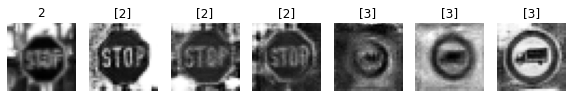

Epoch 81610 g_loss= 1.0636647 d_loss= 1.0930526 real_acc= 0.7 fake_acc= 0.66
Epoch 81620 g_loss= 1.1059521 d_loss= 1.0854913 real_acc= 0.66 fake_acc= 0.72
Epoch 81630 g_loss= 1.0915512 d_loss= 1.2795184 real_acc= 0.6 fake_acc= 0.66
Epoch 81640 g_loss= 0.8315072 d_loss= 1.3719552 real_acc= 0.72 fake_acc= 0.54
Epoch 81650 g_loss= 1.1659646 d_loss= 1.1162133 real_acc= 0.64 fake_acc= 0.74
Epoch 81660 g_loss= 1.0695105 d_loss= 1.150461 real_acc= 0.68 fake_acc= 0.7
Epoch 81670 g_loss= 0.9563715 d_loss= 1.0677485 real_acc= 0.82 fake_acc= 0.6
Epoch 81680 g_loss= 1.0734335 d_loss= 1.1329637 real_acc= 0.74 fake_acc= 0.66
Epoch 81690 g_loss= 1.1365693 d_loss= 1.1516964 real_acc= 0.68 fake_acc= 0.74
Epoch 81700 g_loss= 1.1533136 d_loss= 1.0824089 real_acc= 0.72 fake_acc= 0.72


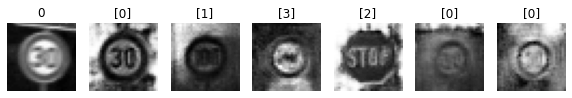

Epoch 81710 g_loss= 0.9084867 d_loss= 1.3353956 real_acc= 0.7 fake_acc= 0.5
Epoch 81720 g_loss= 0.94760513 d_loss= 1.1740968 real_acc= 0.74 fake_acc= 0.64
Epoch 81730 g_loss= 1.1484647 d_loss= 1.1698337 real_acc= 0.62 fake_acc= 0.78
Epoch 81740 g_loss= 1.1440893 d_loss= 1.1612103 real_acc= 0.68 fake_acc= 0.76
Epoch 81750 g_loss= 1.108498 d_loss= 1.128659 real_acc= 0.74 fake_acc= 0.72
Epoch 81760 g_loss= 1.0330735 d_loss= 1.1112999 real_acc= 0.74 fake_acc= 0.6
Epoch 81770 g_loss= 1.1353608 d_loss= 1.0410677 real_acc= 0.68 fake_acc= 0.84
Epoch 81780 g_loss= 0.8579883 d_loss= 1.1590868 real_acc= 0.78 fake_acc= 0.58
Epoch 81790 g_loss= 1.2045406 d_loss= 1.007198 real_acc= 0.78 fake_acc= 0.76
Epoch 81800 g_loss= 1.1487974 d_loss= 1.2034158 real_acc= 0.58 fake_acc= 0.68


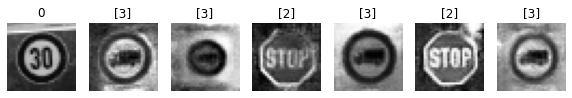

Epoch 81810 g_loss= 0.91878694 d_loss= 1.2649761 real_acc= 0.74 fake_acc= 0.66
Epoch 81820 g_loss= 0.9009386 d_loss= 1.1492356 real_acc= 0.8 fake_acc= 0.52
Epoch 81830 g_loss= 1.2922128 d_loss= 1.2118022 real_acc= 0.58 fake_acc= 0.78
Epoch 81840 g_loss= 0.81872904 d_loss= 1.3152158 real_acc= 0.74 fake_acc= 0.5
Epoch 81850 g_loss= 1.1181355 d_loss= 1.1557288 real_acc= 0.74 fake_acc= 0.74
Epoch 81860 g_loss= 1.1377908 d_loss= 1.1160591 real_acc= 0.6 fake_acc= 0.84
Epoch 81870 g_loss= 0.96329343 d_loss= 1.2009598 real_acc= 0.78 fake_acc= 0.6
Epoch 81880 g_loss= 1.1102711 d_loss= 1.1627669 real_acc= 0.68 fake_acc= 0.66
Epoch 81890 g_loss= 1.0317745 d_loss= 1.1698406 real_acc= 0.66 fake_acc= 0.6
Epoch 81900 g_loss= 0.90359306 d_loss= 1.1816399 real_acc= 0.7 fake_acc= 0.64


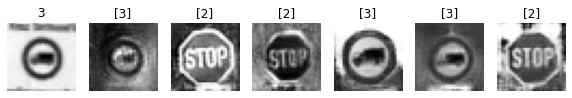

Epoch 81910 g_loss= 1.1546308 d_loss= 1.1611707 real_acc= 0.6 fake_acc= 0.76
Epoch 81920 g_loss= 0.97883606 d_loss= 1.1103401 real_acc= 0.82 fake_acc= 0.62
Epoch 81930 g_loss= 1.1980844 d_loss= 1.0690148 real_acc= 0.66 fake_acc= 0.76
Epoch 81940 g_loss= 1.0213872 d_loss= 1.1138765 real_acc= 0.76 fake_acc= 0.66
Epoch 81950 g_loss= 1.0486219 d_loss= 1.1651405 real_acc= 0.7 fake_acc= 0.7
Epoch 81960 g_loss= 1.0731963 d_loss= 1.0815345 real_acc= 0.7 fake_acc= 0.8
Epoch 81970 g_loss= 0.9721205 d_loss= 1.1927257 real_acc= 0.7 fake_acc= 0.62
Epoch 81980 g_loss= 1.0201001 d_loss= 1.2153349 real_acc= 0.76 fake_acc= 0.6
Epoch 81990 g_loss= 1.023686 d_loss= 1.0127472 real_acc= 0.86 fake_acc= 0.7
Epoch 82000 g_loss= 0.90921885 d_loss= 1.2310165 real_acc= 0.68 fake_acc= 0.62


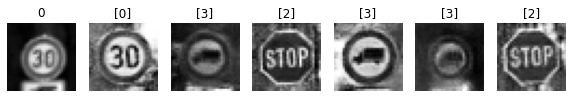

Epoch 82010 g_loss= 1.0937902 d_loss= 1.0459435 real_acc= 0.7 fake_acc= 0.78
Epoch 82020 g_loss= 1.1407949 d_loss= 1.2374706 real_acc= 0.62 fake_acc= 0.8
Epoch 82030 g_loss= 0.9599375 d_loss= 1.1368576 real_acc= 0.76 fake_acc= 0.62
Epoch 82040 g_loss= 1.1691389 d_loss= 1.1424608 real_acc= 0.54 fake_acc= 0.78
Epoch 82050 g_loss= 0.985441 d_loss= 1.2090664 real_acc= 0.72 fake_acc= 0.6
Epoch 82060 g_loss= 0.9646021 d_loss= 1.214351 real_acc= 0.74 fake_acc= 0.52
Epoch 82070 g_loss= 1.0185535 d_loss= 1.2161131 real_acc= 0.62 fake_acc= 0.72
Epoch 82080 g_loss= 1.0226573 d_loss= 1.1893497 real_acc= 0.7 fake_acc= 0.6
Epoch 82090 g_loss= 1.0395477 d_loss= 1.186175 real_acc= 0.68 fake_acc= 0.66
Epoch 82100 g_loss= 1.3141857 d_loss= 1.0692471 real_acc= 0.64 fake_acc= 0.78


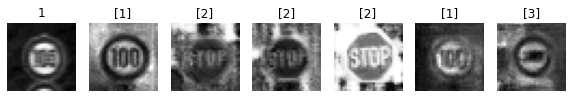

Epoch 82110 g_loss= 0.958361 d_loss= 1.165224 real_acc= 0.72 fake_acc= 0.56
Epoch 82120 g_loss= 1.184119 d_loss= 1.0114615 real_acc= 0.8 fake_acc= 0.76
Epoch 82130 g_loss= 1.2518641 d_loss= 1.0393454 real_acc= 0.62 fake_acc= 0.76
Epoch 82140 g_loss= 1.0028481 d_loss= 1.3014795 real_acc= 0.72 fake_acc= 0.64
Epoch 82150 g_loss= 1.0532842 d_loss= 1.1018274 real_acc= 0.84 fake_acc= 0.62
Epoch 82160 g_loss= 1.2082667 d_loss= 1.3313179 real_acc= 0.46 fake_acc= 0.84
Epoch 82170 g_loss= 1.0437897 d_loss= 1.1074245 real_acc= 0.76 fake_acc= 0.62
Epoch 82180 g_loss= 1.0258344 d_loss= 1.0354676 real_acc= 0.8 fake_acc= 0.74
Epoch 82190 g_loss= 1.4454231 d_loss= 1.0483049 real_acc= 0.6 fake_acc= 0.88
Epoch 82200 g_loss= 1.1726826 d_loss= 1.0640327 real_acc= 0.78 fake_acc= 0.62


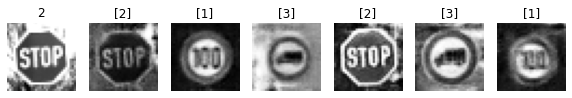

Epoch 82210 g_loss= 1.0517541 d_loss= 1.1165166 real_acc= 0.72 fake_acc= 0.62
Epoch 82220 g_loss= 0.95559865 d_loss= 1.0843446 real_acc= 0.74 fake_acc= 0.68
Epoch 82230 g_loss= 0.8653327 d_loss= 1.2425685 real_acc= 0.72 fake_acc= 0.58
Epoch 82240 g_loss= 1.1898898 d_loss= 1.0812635 real_acc= 0.7 fake_acc= 0.78
Epoch 82250 g_loss= 1.0957971 d_loss= 1.098834 real_acc= 0.54 fake_acc= 0.76
Epoch 82260 g_loss= 1.0314401 d_loss= 1.1792927 real_acc= 0.58 fake_acc= 0.68
Epoch 82270 g_loss= 1.097297 d_loss= 1.0997782 real_acc= 0.66 fake_acc= 0.74
Epoch 82280 g_loss= 1.0956708 d_loss= 1.0240753 real_acc= 0.78 fake_acc= 0.7
Epoch 82290 g_loss= 0.90410185 d_loss= 1.0768099 real_acc= 0.82 fake_acc= 0.64
Epoch 82300 g_loss= 1.0702702 d_loss= 1.165979 real_acc= 0.74 fake_acc= 0.66


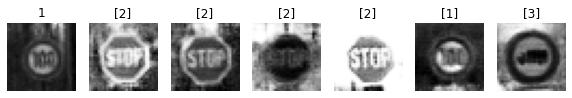

Epoch 82310 g_loss= 1.3027431 d_loss= 1.1460204 real_acc= 0.46 fake_acc= 0.76
Epoch 82320 g_loss= 1.0922753 d_loss= 1.162427 real_acc= 0.68 fake_acc= 0.6
Epoch 82330 g_loss= 1.1663429 d_loss= 1.1097538 real_acc= 0.68 fake_acc= 0.64
Epoch 82340 g_loss= 1.0617518 d_loss= 1.1990083 real_acc= 0.64 fake_acc= 0.68
Epoch 82350 g_loss= 1.262606 d_loss= 1.115173 real_acc= 0.6 fake_acc= 0.74
Epoch 82360 g_loss= 1.008588 d_loss= 1.1654346 real_acc= 0.6 fake_acc= 0.76
Epoch 82370 g_loss= 1.0073203 d_loss= 1.1227443 real_acc= 0.68 fake_acc= 0.7
Epoch 82380 g_loss= 1.1785672 d_loss= 1.2062635 real_acc= 0.5 fake_acc= 0.72
Epoch 82390 g_loss= 1.1201127 d_loss= 1.2330673 real_acc= 0.62 fake_acc= 0.6
Epoch 82400 g_loss= 1.0386688 d_loss= 1.2455089 real_acc= 0.62 fake_acc= 0.66


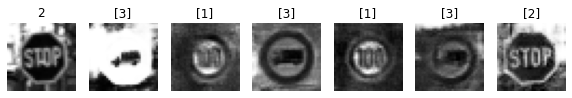

Epoch 82410 g_loss= 1.0889153 d_loss= 1.0971606 real_acc= 0.72 fake_acc= 0.74
Epoch 82420 g_loss= 1.1826727 d_loss= 1.1113355 real_acc= 0.56 fake_acc= 0.78
Epoch 82430 g_loss= 1.0564684 d_loss= 1.0842333 real_acc= 0.76 fake_acc= 0.7
Epoch 82440 g_loss= 1.163911 d_loss= 0.94867563 real_acc= 0.78 fake_acc= 0.76
Epoch 82450 g_loss= 1.2260154 d_loss= 1.0226257 real_acc= 0.74 fake_acc= 0.66
Epoch 82460 g_loss= 0.9578198 d_loss= 1.1258066 real_acc= 0.78 fake_acc= 0.6
Epoch 82470 g_loss= 0.9176124 d_loss= 1.4198443 real_acc= 0.66 fake_acc= 0.48
Epoch 82480 g_loss= 1.2025964 d_loss= 1.0891619 real_acc= 0.8 fake_acc= 0.6
Epoch 82490 g_loss= 1.2847724 d_loss= 1.0532165 real_acc= 0.72 fake_acc= 0.72
Epoch 82500 g_loss= 0.986856 d_loss= 1.1858813 real_acc= 0.7 fake_acc= 0.6


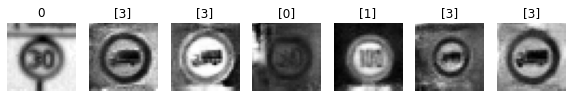

Epoch 82510 g_loss= 1.2237097 d_loss= 1.1725814 real_acc= 0.58 fake_acc= 0.72
Epoch 82520 g_loss= 1.0940956 d_loss= 1.1693562 real_acc= 0.68 fake_acc= 0.66
Epoch 82530 g_loss= 1.0280659 d_loss= 1.1990106 real_acc= 0.66 fake_acc= 0.72
Epoch 82540 g_loss= 1.0226514 d_loss= 1.1783087 real_acc= 0.7 fake_acc= 0.72
Epoch 82550 g_loss= 1.0550122 d_loss= 1.1551876 real_acc= 0.6 fake_acc= 0.64
Epoch 82560 g_loss= 0.9648031 d_loss= 1.1641724 real_acc= 0.72 fake_acc= 0.6
Epoch 82570 g_loss= 1.223738 d_loss= 1.0624621 real_acc= 0.6 fake_acc= 0.8
Epoch 82580 g_loss= 0.9942476 d_loss= 1.2085997 real_acc= 0.64 fake_acc= 0.7
Epoch 82590 g_loss= 1.000172 d_loss= 1.0991867 real_acc= 0.8 fake_acc= 0.62
Epoch 82600 g_loss= 0.9854499 d_loss= 1.0945333 real_acc= 0.74 fake_acc= 0.56


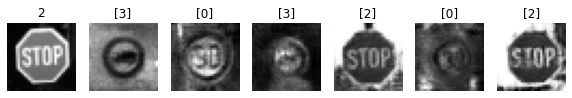

Epoch 82610 g_loss= 1.0068059 d_loss= 1.2031152 real_acc= 0.72 fake_acc= 0.64
Epoch 82620 g_loss= 1.1953088 d_loss= 1.1716084 real_acc= 0.62 fake_acc= 0.74
Epoch 82630 g_loss= 1.0792636 d_loss= 1.1969391 real_acc= 0.64 fake_acc= 0.7
Epoch 82640 g_loss= 1.1272459 d_loss= 1.3359063 real_acc= 0.52 fake_acc= 0.64
Epoch 82650 g_loss= 1.2170032 d_loss= 1.1731526 real_acc= 0.56 fake_acc= 0.78
Epoch 82660 g_loss= 0.9973155 d_loss= 1.2647662 real_acc= 0.7 fake_acc= 0.54
Epoch 82670 g_loss= 1.0019838 d_loss= 1.1405299 real_acc= 0.78 fake_acc= 0.68
Epoch 82680 g_loss= 1.0983753 d_loss= 1.0869509 real_acc= 0.76 fake_acc= 0.72
Epoch 82690 g_loss= 1.0813649 d_loss= 1.051249 real_acc= 0.7 fake_acc= 0.7
Epoch 82700 g_loss= 1.0619259 d_loss= 1.3222463 real_acc= 0.56 fake_acc= 0.68


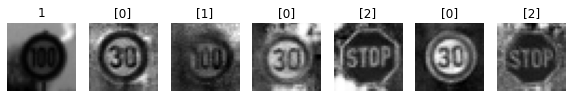

Epoch 82710 g_loss= 1.0605365 d_loss= 1.1526289 real_acc= 0.66 fake_acc= 0.7
Epoch 82720 g_loss= 1.0684267 d_loss= 1.1611824 real_acc= 0.64 fake_acc= 0.74
Epoch 82730 g_loss= 1.0284351 d_loss= 1.1889172 real_acc= 0.76 fake_acc= 0.66
Epoch 82740 g_loss= 1.1242268 d_loss= 1.1808395 real_acc= 0.72 fake_acc= 0.72
Epoch 82750 g_loss= 1.2394993 d_loss= 1.1726512 real_acc= 0.62 fake_acc= 0.72
Epoch 82760 g_loss= 1.0846733 d_loss= 1.1404781 real_acc= 0.72 fake_acc= 0.6
Epoch 82770 g_loss= 1.0331604 d_loss= 1.0322505 real_acc= 0.74 fake_acc= 0.8
Epoch 82780 g_loss= 1.0491341 d_loss= 1.1894765 real_acc= 0.66 fake_acc= 0.6
Epoch 82790 g_loss= 0.90974504 d_loss= 1.1150024 real_acc= 0.76 fake_acc= 0.58
Epoch 82800 g_loss= 1.1573178 d_loss= 1.1426768 real_acc= 0.66 fake_acc= 0.74


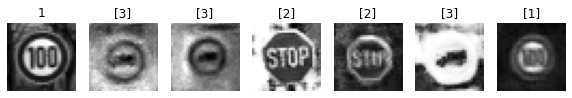

Epoch 82810 g_loss= 1.0143518 d_loss= 1.2548329 real_acc= 0.64 fake_acc= 0.6
Epoch 82820 g_loss= 1.0630774 d_loss= 1.111331 real_acc= 0.76 fake_acc= 0.62
Epoch 82830 g_loss= 1.1643527 d_loss= 1.1085852 real_acc= 0.7 fake_acc= 0.68
Epoch 82840 g_loss= 1.167575 d_loss= 1.1029723 real_acc= 0.74 fake_acc= 0.7
Epoch 82850 g_loss= 1.1743497 d_loss= 1.0446011 real_acc= 0.7 fake_acc= 0.82
Epoch 82860 g_loss= 1.1539285 d_loss= 1.1870388 real_acc= 0.6 fake_acc= 0.7
Epoch 82870 g_loss= 0.96712625 d_loss= 1.2152832 real_acc= 0.66 fake_acc= 0.72
Epoch 82880 g_loss= 0.95321864 d_loss= 1.1956419 real_acc= 0.76 fake_acc= 0.62
Epoch 82890 g_loss= 1.0320352 d_loss= 1.2756424 real_acc= 0.54 fake_acc= 0.72
Epoch 82900 g_loss= 1.1337025 d_loss= 1.2496114 real_acc= 0.62 fake_acc= 0.74


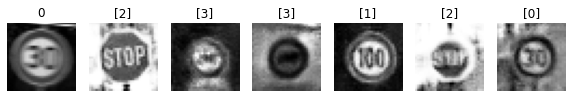

Epoch 82910 g_loss= 1.0000889 d_loss= 1.169131 real_acc= 0.78 fake_acc= 0.66
Epoch 82920 g_loss= 1.154699 d_loss= 1.2425709 real_acc= 0.6 fake_acc= 0.68
Epoch 82930 g_loss= 0.88247895 d_loss= 1.1793696 real_acc= 0.84 fake_acc= 0.58
Epoch 82940 g_loss= 1.0796663 d_loss= 1.1904054 real_acc= 0.54 fake_acc= 0.62
Epoch 82950 g_loss= 1.131119 d_loss= 1.0901318 real_acc= 0.72 fake_acc= 0.7
Epoch 82960 g_loss= 1.0195831 d_loss= 1.1255044 real_acc= 0.74 fake_acc= 0.66
Epoch 82970 g_loss= 1.074135 d_loss= 1.2370872 real_acc= 0.58 fake_acc= 0.74
Epoch 82980 g_loss= 1.1010239 d_loss= 1.1198282 real_acc= 0.62 fake_acc= 0.64
Epoch 82990 g_loss= 1.1481223 d_loss= 1.2167186 real_acc= 0.7 fake_acc= 0.68
Epoch 83000 g_loss= 0.93974704 d_loss= 1.3154573 real_acc= 0.6 fake_acc= 0.64


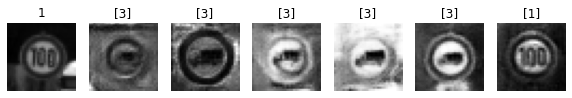

Epoch 83010 g_loss= 0.94968665 d_loss= 1.0648794 real_acc= 0.9 fake_acc= 0.56
Epoch 83020 g_loss= 1.1925178 d_loss= 1.0401103 real_acc= 0.72 fake_acc= 0.74
Epoch 83030 g_loss= 1.0076698 d_loss= 1.1429839 real_acc= 0.8 fake_acc= 0.64
Epoch 83040 g_loss= 0.9058162 d_loss= 1.2586496 real_acc= 0.66 fake_acc= 0.7
Epoch 83050 g_loss= 1.0998203 d_loss= 1.0584043 real_acc= 0.72 fake_acc= 0.7
Epoch 83060 g_loss= 0.9606253 d_loss= 1.174607 real_acc= 0.76 fake_acc= 0.6
Epoch 83070 g_loss= 1.1114138 d_loss= 1.0755832 real_acc= 0.74 fake_acc= 0.8
Epoch 83080 g_loss= 1.0699575 d_loss= 1.1796092 real_acc= 0.64 fake_acc= 0.58
Epoch 83090 g_loss= 1.0967468 d_loss= 1.073659 real_acc= 0.78 fake_acc= 0.7
Epoch 83100 g_loss= 1.0119531 d_loss= 1.1530735 real_acc= 0.74 fake_acc= 0.6


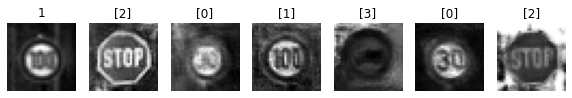

Epoch 83110 g_loss= 1.0556383 d_loss= 1.1948509 real_acc= 0.62 fake_acc= 0.74
Epoch 83120 g_loss= 1.0390543 d_loss= 1.1793586 real_acc= 0.62 fake_acc= 0.72
Epoch 83130 g_loss= 1.0420252 d_loss= 1.1109371 real_acc= 0.74 fake_acc= 0.68
Epoch 83140 g_loss= 1.144887 d_loss= 1.2043388 real_acc= 0.64 fake_acc= 0.66
Epoch 83150 g_loss= 1.0753673 d_loss= 1.037267 real_acc= 0.74 fake_acc= 0.72
Epoch 83160 g_loss= 0.8471581 d_loss= 1.2973206 real_acc= 0.78 fake_acc= 0.44
Epoch 83170 g_loss= 1.2450609 d_loss= 1.0781142 real_acc= 0.64 fake_acc= 0.7
Epoch 83180 g_loss= 0.9357419 d_loss= 1.2887542 real_acc= 0.66 fake_acc= 0.62
Epoch 83190 g_loss= 1.0476373 d_loss= 1.2062018 real_acc= 0.66 fake_acc= 0.64
Epoch 83200 g_loss= 0.8380655 d_loss= 1.1826999 real_acc= 0.8 fake_acc= 0.56


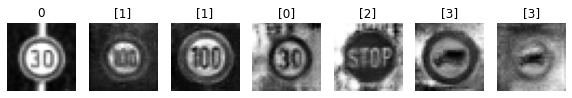

Epoch 83210 g_loss= 0.9799692 d_loss= 1.3239784 real_acc= 0.6 fake_acc= 0.58
Epoch 83220 g_loss= 1.2238872 d_loss= 1.0833806 real_acc= 0.68 fake_acc= 0.74
Epoch 83230 g_loss= 0.89086324 d_loss= 1.1943309 real_acc= 0.76 fake_acc= 0.62
Epoch 83240 g_loss= 1.1446598 d_loss= 1.0160978 real_acc= 0.78 fake_acc= 0.76
Epoch 83250 g_loss= 1.008097 d_loss= 1.1456034 real_acc= 0.66 fake_acc= 0.74
Epoch 83260 g_loss= 1.1246015 d_loss= 1.1701648 real_acc= 0.68 fake_acc= 0.68
Epoch 83270 g_loss= 1.163967 d_loss= 1.2364749 real_acc= 0.6 fake_acc= 0.76
Epoch 83280 g_loss= 0.93391585 d_loss= 1.2278192 real_acc= 0.68 fake_acc= 0.54
Epoch 83290 g_loss= 1.3824763 d_loss= 1.120472 real_acc= 0.66 fake_acc= 0.76
Epoch 83300 g_loss= 1.1353555 d_loss= 1.0100322 real_acc= 0.84 fake_acc= 0.66


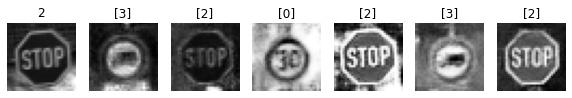

Epoch 83310 g_loss= 0.9126826 d_loss= 1.3062127 real_acc= 0.7 fake_acc= 0.5
Epoch 83320 g_loss= 1.1641992 d_loss= 1.1221939 real_acc= 0.66 fake_acc= 0.74
Epoch 83330 g_loss= 1.0113289 d_loss= 1.2515779 real_acc= 0.54 fake_acc= 0.76
Epoch 83340 g_loss= 0.8971136 d_loss= 1.1246376 real_acc= 0.82 fake_acc= 0.6
Epoch 83350 g_loss= 1.0844768 d_loss= 1.0648794 real_acc= 0.78 fake_acc= 0.74
Epoch 83360 g_loss= 1.0855668 d_loss= 1.1446016 real_acc= 0.6 fake_acc= 0.72
Epoch 83370 g_loss= 0.9293412 d_loss= 1.202173 real_acc= 0.8 fake_acc= 0.54
Epoch 83380 g_loss= 1.1159828 d_loss= 1.2607622 real_acc= 0.54 fake_acc= 0.72
Epoch 83390 g_loss= 0.9583485 d_loss= 1.2419676 real_acc= 0.7 fake_acc= 0.7
Epoch 83400 g_loss= 1.1407366 d_loss= 1.1032553 real_acc= 0.62 fake_acc= 0.72


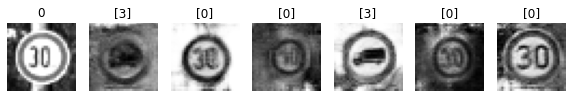

Epoch 83410 g_loss= 1.3190922 d_loss= 0.9960892 real_acc= 0.78 fake_acc= 0.82
Epoch 83420 g_loss= 0.84369624 d_loss= 1.250237 real_acc= 0.72 fake_acc= 0.54
Epoch 83430 g_loss= 0.96024156 d_loss= 1.1465783 real_acc= 0.86 fake_acc= 0.56
Epoch 83440 g_loss= 1.1278855 d_loss= 1.2472265 real_acc= 0.58 fake_acc= 0.68
Epoch 83450 g_loss= 0.939789 d_loss= 1.1764852 real_acc= 0.76 fake_acc= 0.62
Epoch 83460 g_loss= 1.0832851 d_loss= 1.2113642 real_acc= 0.66 fake_acc= 0.7
Epoch 83470 g_loss= 0.9403907 d_loss= 1.2499204 real_acc= 0.64 fake_acc= 0.54
Epoch 83480 g_loss= 1.1616236 d_loss= 1.0712507 real_acc= 0.76 fake_acc= 0.68
Epoch 83490 g_loss= 0.94803834 d_loss= 1.1271224 real_acc= 0.84 fake_acc= 0.52
Epoch 83500 g_loss= 0.9525376 d_loss= 1.1608019 real_acc= 0.7 fake_acc= 0.68


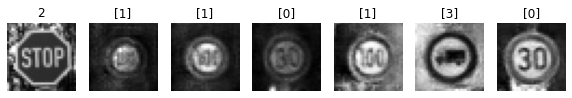

Epoch 83510 g_loss= 1.0900064 d_loss= 1.2368243 real_acc= 0.54 fake_acc= 0.72
Epoch 83520 g_loss= 1.060928 d_loss= 1.1870589 real_acc= 0.68 fake_acc= 0.66
Epoch 83530 g_loss= 0.9289418 d_loss= 1.185117 real_acc= 0.82 fake_acc= 0.56
Epoch 83540 g_loss= 1.0216993 d_loss= 1.1137587 real_acc= 0.78 fake_acc= 0.64
Epoch 83550 g_loss= 1.0728023 d_loss= 1.2211862 real_acc= 0.68 fake_acc= 0.66
Epoch 83560 g_loss= 0.98004127 d_loss= 1.2490017 real_acc= 0.66 fake_acc= 0.64
Epoch 83570 g_loss= 1.1677775 d_loss= 1.075521 real_acc= 0.74 fake_acc= 0.66
Epoch 83580 g_loss= 0.8762545 d_loss= 1.1702273 real_acc= 0.68 fake_acc= 0.54
Epoch 83590 g_loss= 1.0950834 d_loss= 1.0532092 real_acc= 0.76 fake_acc= 0.66
Epoch 83600 g_loss= 1.1773667 d_loss= 1.0486517 real_acc= 0.66 fake_acc= 0.7


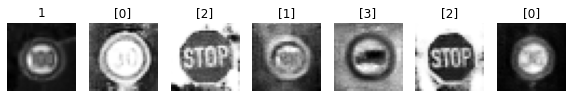

Epoch 83610 g_loss= 1.1272191 d_loss= 1.1022694 real_acc= 0.72 fake_acc= 0.7
Epoch 83620 g_loss= 1.089108 d_loss= 1.2095513 real_acc= 0.6 fake_acc= 0.68
Epoch 83630 g_loss= 1.110076 d_loss= 0.9801947 real_acc= 0.78 fake_acc= 0.74
Epoch 83640 g_loss= 1.1265591 d_loss= 1.169908 real_acc= 0.62 fake_acc= 0.68
Epoch 83650 g_loss= 1.0676291 d_loss= 1.0966733 real_acc= 0.74 fake_acc= 0.68
Epoch 83660 g_loss= 0.9489514 d_loss= 1.1047477 real_acc= 0.8 fake_acc= 0.6
Epoch 83670 g_loss= 1.2076356 d_loss= 1.0097585 real_acc= 0.78 fake_acc= 0.72
Epoch 83680 g_loss= 1.1422856 d_loss= 1.1489139 real_acc= 0.64 fake_acc= 0.74
Epoch 83690 g_loss= 0.95971435 d_loss= 1.0681057 real_acc= 0.82 fake_acc= 0.58
Epoch 83700 g_loss= 1.0372214 d_loss= 1.1503172 real_acc= 0.72 fake_acc= 0.62


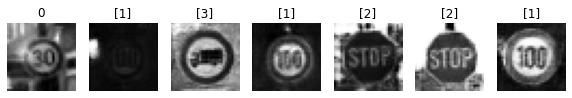

Epoch 83710 g_loss= 1.2639493 d_loss= 1.124876 real_acc= 0.6 fake_acc= 0.86
Epoch 83720 g_loss= 1.1910468 d_loss= 1.2065079 real_acc= 0.66 fake_acc= 0.7
Epoch 83730 g_loss= 1.0064611 d_loss= 1.2228903 real_acc= 0.68 fake_acc= 0.54
Epoch 83740 g_loss= 0.98711777 d_loss= 1.1895702 real_acc= 0.66 fake_acc= 0.72
Epoch 83750 g_loss= 1.1146122 d_loss= 1.1465038 real_acc= 0.66 fake_acc= 0.74
Epoch 83760 g_loss= 1.0439457 d_loss= 1.2571589 real_acc= 0.68 fake_acc= 0.66
Epoch 83770 g_loss= 0.9159182 d_loss= 1.1891869 real_acc= 0.7 fake_acc= 0.58
Epoch 83780 g_loss= 1.3309729 d_loss= 1.2223389 real_acc= 0.6 fake_acc= 0.7
Epoch 83790 g_loss= 1.20653 d_loss= 1.0921264 real_acc= 0.7 fake_acc= 0.7
Epoch 83800 g_loss= 1.0898464 d_loss= 1.2017986 real_acc= 0.7 fake_acc= 0.62


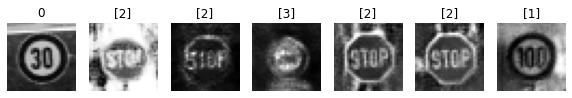

Epoch 83810 g_loss= 1.1285902 d_loss= 1.074363 real_acc= 0.78 fake_acc= 0.76
Epoch 83820 g_loss= 0.9604443 d_loss= 1.0988362 real_acc= 0.88 fake_acc= 0.5
Epoch 83830 g_loss= 1.2506176 d_loss= 1.1133819 real_acc= 0.66 fake_acc= 0.8
Epoch 83840 g_loss= 0.9512121 d_loss= 1.3246031 real_acc= 0.66 fake_acc= 0.64
Epoch 83850 g_loss= 1.0608556 d_loss= 1.1397343 real_acc= 0.76 fake_acc= 0.68
Epoch 83860 g_loss= 1.0312448 d_loss= 1.1657093 real_acc= 0.7 fake_acc= 0.82
Epoch 83870 g_loss= 1.0742612 d_loss= 1.0115049 real_acc= 0.84 fake_acc= 0.72
Epoch 83880 g_loss= 1.1028047 d_loss= 1.0823605 real_acc= 0.7 fake_acc= 0.72
Epoch 83890 g_loss= 0.9145477 d_loss= 1.2228844 real_acc= 0.62 fake_acc= 0.68
Epoch 83900 g_loss= 1.0400407 d_loss= 1.1935768 real_acc= 0.54 fake_acc= 0.76


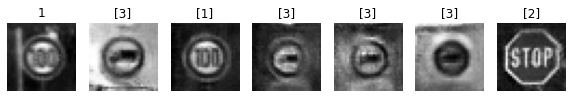

Epoch 83910 g_loss= 1.0491035 d_loss= 1.3749645 real_acc= 0.64 fake_acc= 0.58
Epoch 83920 g_loss= 0.96013486 d_loss= 1.1339446 real_acc= 0.76 fake_acc= 0.62
Epoch 83930 g_loss= 1.0869775 d_loss= 1.1100421 real_acc= 0.7 fake_acc= 0.74
Epoch 83940 g_loss= 0.89883614 d_loss= 1.131546 real_acc= 0.78 fake_acc= 0.58
Epoch 83950 g_loss= 0.90150833 d_loss= 1.1030484 real_acc= 0.86 fake_acc= 0.62
Epoch 83960 g_loss= 1.1830167 d_loss= 1.0558499 real_acc= 0.72 fake_acc= 0.76
Epoch 83970 g_loss= 0.99573684 d_loss= 1.1292615 real_acc= 0.72 fake_acc= 0.56
Epoch 83980 g_loss= 1.1234069 d_loss= 1.0261209 real_acc= 0.78 fake_acc= 0.66
Epoch 83990 g_loss= 1.1233996 d_loss= 1.0880474 real_acc= 0.64 fake_acc= 0.7
Epoch 84000 g_loss= 0.9978651 d_loss= 1.2942867 real_acc= 0.62 fake_acc= 0.66


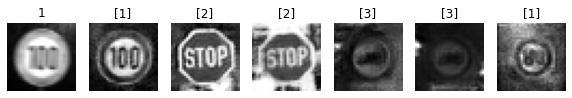

Epoch 84010 g_loss= 1.1116786 d_loss= 1.0172399 real_acc= 0.84 fake_acc= 0.72
Epoch 84020 g_loss= 1.1674634 d_loss= 1.0610634 real_acc= 0.72 fake_acc= 0.76
Epoch 84030 g_loss= 1.1851075 d_loss= 1.2130437 real_acc= 0.64 fake_acc= 0.72
Epoch 84040 g_loss= 1.1281246 d_loss= 1.132326 real_acc= 0.62 fake_acc= 0.76
Epoch 84050 g_loss= 1.0548677 d_loss= 1.1010025 real_acc= 0.74 fake_acc= 0.62
Epoch 84060 g_loss= 1.1445549 d_loss= 1.0561218 real_acc= 0.74 fake_acc= 0.7
Epoch 84070 g_loss= 1.1622406 d_loss= 1.0939634 real_acc= 0.6 fake_acc= 0.74
Epoch 84080 g_loss= 1.2205545 d_loss= 1.1381629 real_acc= 0.58 fake_acc= 0.78
Epoch 84090 g_loss= 1.1733454 d_loss= 1.1982065 real_acc= 0.6 fake_acc= 0.66
Epoch 84100 g_loss= 0.99545175 d_loss= 1.2028642 real_acc= 0.68 fake_acc= 0.7


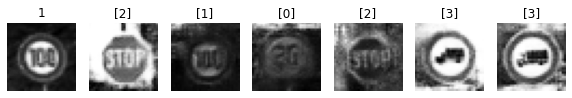

Epoch 84110 g_loss= 1.0782341 d_loss= 1.1142701 real_acc= 0.7 fake_acc= 0.68
Epoch 84120 g_loss= 1.254329 d_loss= 1.0874766 real_acc= 0.74 fake_acc= 0.72
Epoch 84130 g_loss= 1.0727592 d_loss= 0.9985461 real_acc= 0.82 fake_acc= 0.72
Epoch 84140 g_loss= 1.0292817 d_loss= 1.1236196 real_acc= 0.64 fake_acc= 0.7
Epoch 84150 g_loss= 1.2634109 d_loss= 1.0578172 real_acc= 0.7 fake_acc= 0.84
Epoch 84160 g_loss= 1.054155 d_loss= 1.2580037 real_acc= 0.64 fake_acc= 0.66
Epoch 84170 g_loss= 1.0423273 d_loss= 1.1178746 real_acc= 0.86 fake_acc= 0.58
Epoch 84180 g_loss= 1.0998278 d_loss= 1.0349828 real_acc= 0.86 fake_acc= 0.7
Epoch 84190 g_loss= 1.0278851 d_loss= 1.1493216 real_acc= 0.74 fake_acc= 0.6
Epoch 84200 g_loss= 1.0852413 d_loss= 1.1233866 real_acc= 0.68 fake_acc= 0.74


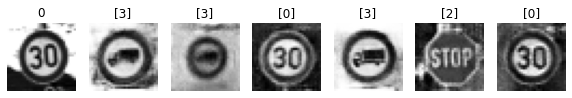

Epoch 84210 g_loss= 1.132909 d_loss= 1.0612308 real_acc= 0.72 fake_acc= 0.72
Epoch 84220 g_loss= 0.883606 d_loss= 1.2014208 real_acc= 0.76 fake_acc= 0.56
Epoch 84230 g_loss= 1.1391325 d_loss= 1.1798784 real_acc= 0.62 fake_acc= 0.72
Epoch 84240 g_loss= 1.0959411 d_loss= 1.1375194 real_acc= 0.78 fake_acc= 0.62
Epoch 84250 g_loss= 0.94044966 d_loss= 1.2691716 real_acc= 0.72 fake_acc= 0.6
Epoch 84260 g_loss= 0.9037615 d_loss= 1.2781982 real_acc= 0.7 fake_acc= 0.62
Epoch 84270 g_loss= 1.1402264 d_loss= 1.1173769 real_acc= 0.62 fake_acc= 0.78
Epoch 84280 g_loss= 1.0343804 d_loss= 1.1833628 real_acc= 0.66 fake_acc= 0.68
Epoch 84290 g_loss= 1.005683 d_loss= 1.0897249 real_acc= 0.8 fake_acc= 0.68
Epoch 84300 g_loss= 1.0534352 d_loss= 1.1313072 real_acc= 0.72 fake_acc= 0.64


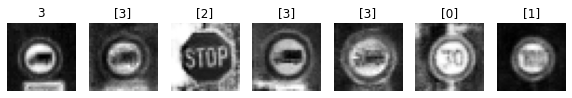

Epoch 84310 g_loss= 1.2034084 d_loss= 1.1207865 real_acc= 0.7 fake_acc= 0.64
Epoch 84320 g_loss= 1.0631866 d_loss= 1.067857 real_acc= 0.66 fake_acc= 0.68
Epoch 84330 g_loss= 0.98486274 d_loss= 1.1142521 real_acc= 0.72 fake_acc= 0.7
Epoch 84340 g_loss= 1.1110485 d_loss= 1.1749132 real_acc= 0.66 fake_acc= 0.66
Epoch 84350 g_loss= 0.9149617 d_loss= 1.110428 real_acc= 0.82 fake_acc= 0.56
Epoch 84360 g_loss= 1.0248679 d_loss= 1.1719029 real_acc= 0.72 fake_acc= 0.62
Epoch 84370 g_loss= 0.93559724 d_loss= 1.2214221 real_acc= 0.72 fake_acc= 0.56
Epoch 84380 g_loss= 1.2561386 d_loss= 1.0904634 real_acc= 0.66 fake_acc= 0.8
Epoch 84390 g_loss= 0.9289747 d_loss= 1.2162876 real_acc= 0.74 fake_acc= 0.62
Epoch 84400 g_loss= 1.0533485 d_loss= 1.0712646 real_acc= 0.74 fake_acc= 0.78


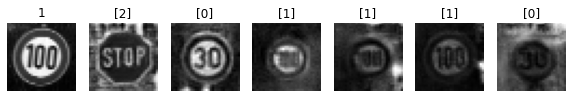

Epoch 84410 g_loss= 1.1348708 d_loss= 1.1477479 real_acc= 0.62 fake_acc= 0.76
Epoch 84420 g_loss= 0.95179826 d_loss= 1.244713 real_acc= 0.64 fake_acc= 0.5
Epoch 84430 g_loss= 1.0359085 d_loss= 1.1560867 real_acc= 0.72 fake_acc= 0.62
Epoch 84440 g_loss= 1.1206028 d_loss= 1.0818049 real_acc= 0.68 fake_acc= 0.74
Epoch 84450 g_loss= 1.118769 d_loss= 1.1671715 real_acc= 0.62 fake_acc= 0.68
Epoch 84460 g_loss= 1.1930233 d_loss= 0.9827639 real_acc= 0.8 fake_acc= 0.82
Epoch 84470 g_loss= 0.93070304 d_loss= 1.1432227 real_acc= 0.78 fake_acc= 0.6
Epoch 84480 g_loss= 0.93517655 d_loss= 1.1987034 real_acc= 0.74 fake_acc= 0.62
Epoch 84490 g_loss= 1.0277338 d_loss= 1.2167418 real_acc= 0.62 fake_acc= 0.68
Epoch 84500 g_loss= 1.0513357 d_loss= 1.0725033 real_acc= 0.76 fake_acc= 0.7


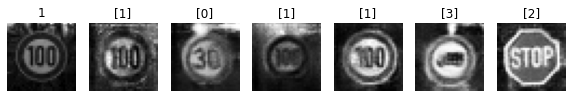

Epoch 84510 g_loss= 0.99754995 d_loss= 1.2397907 real_acc= 0.68 fake_acc= 0.58
Epoch 84520 g_loss= 1.2122153 d_loss= 1.0163541 real_acc= 0.74 fake_acc= 0.8
Epoch 84530 g_loss= 1.207579 d_loss= 1.1711687 real_acc= 0.68 fake_acc= 0.62
Epoch 84540 g_loss= 0.91662 d_loss= 1.3291899 real_acc= 0.58 fake_acc= 0.66
Epoch 84550 g_loss= 1.2016829 d_loss= 1.1553031 real_acc= 0.56 fake_acc= 0.7
Epoch 84560 g_loss= 1.1236135 d_loss= 1.0524633 real_acc= 0.82 fake_acc= 0.68
Epoch 84570 g_loss= 0.922862 d_loss= 1.1962123 real_acc= 0.64 fake_acc= 0.6
Epoch 84580 g_loss= 0.9162349 d_loss= 1.2178729 real_acc= 0.68 fake_acc= 0.62
Epoch 84590 g_loss= 0.93022317 d_loss= 1.2099869 real_acc= 0.76 fake_acc= 0.7
Epoch 84600 g_loss= 0.98780775 d_loss= 1.2505194 real_acc= 0.6 fake_acc= 0.6


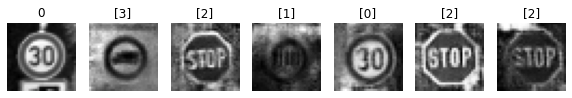

Epoch 84610 g_loss= 1.1137191 d_loss= 1.2125196 real_acc= 0.6 fake_acc= 0.66
Epoch 84620 g_loss= 0.9352554 d_loss= 1.34408 real_acc= 0.56 fake_acc= 0.54
Epoch 84630 g_loss= 0.97333753 d_loss= 1.1215792 real_acc= 0.7 fake_acc= 0.7
Epoch 84640 g_loss= 1.1276908 d_loss= 1.1709348 real_acc= 0.64 fake_acc= 0.62
Epoch 84650 g_loss= 1.1687152 d_loss= 1.0358363 real_acc= 0.8 fake_acc= 0.62
Epoch 84660 g_loss= 1.2720894 d_loss= 1.1420423 real_acc= 0.7 fake_acc= 0.7
Epoch 84670 g_loss= 1.1119672 d_loss= 1.2347913 real_acc= 0.68 fake_acc= 0.68
Epoch 84680 g_loss= 1.1250596 d_loss= 1.1198446 real_acc= 0.66 fake_acc= 0.7
Epoch 84690 g_loss= 1.1547447 d_loss= 1.1647093 real_acc= 0.68 fake_acc= 0.6
Epoch 84700 g_loss= 1.0527123 d_loss= 1.0741788 real_acc= 0.76 fake_acc= 0.68


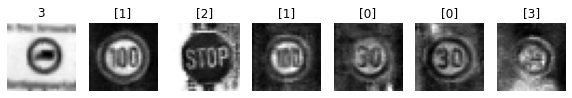

Epoch 84710 g_loss= 1.1978468 d_loss= 1.006458 real_acc= 0.7 fake_acc= 0.86
Epoch 84720 g_loss= 1.2131407 d_loss= 1.1093388 real_acc= 0.7 fake_acc= 0.8
Epoch 84730 g_loss= 1.0594841 d_loss= 1.034725 real_acc= 0.74 fake_acc= 0.76
Epoch 84740 g_loss= 1.1500974 d_loss= 1.1177773 real_acc= 0.64 fake_acc= 0.84
Epoch 84750 g_loss= 1.273269 d_loss= 1.1124798 real_acc= 0.56 fake_acc= 0.84
Epoch 84760 g_loss= 1.141099 d_loss= 1.1934376 real_acc= 0.66 fake_acc= 0.76
Epoch 84770 g_loss= 1.1179537 d_loss= 1.0542059 real_acc= 0.74 fake_acc= 0.72
Epoch 84780 g_loss= 0.9691592 d_loss= 1.1519282 real_acc= 0.68 fake_acc= 0.64
Epoch 84790 g_loss= 1.1297023 d_loss= 1.2220682 real_acc= 0.7 fake_acc= 0.66
Epoch 84800 g_loss= 1.2081921 d_loss= 1.1905658 real_acc= 0.54 fake_acc= 0.76


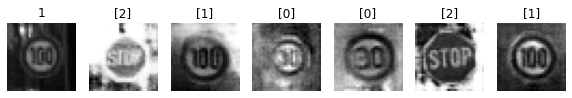

Epoch 84810 g_loss= 0.8447966 d_loss= 1.3555273 real_acc= 0.74 fake_acc= 0.44
Epoch 84820 g_loss= 1.1265826 d_loss= 1.3097839 real_acc= 0.56 fake_acc= 0.68
Epoch 84830 g_loss= 1.12227 d_loss= 1.2107856 real_acc= 0.66 fake_acc= 0.8
Epoch 84840 g_loss= 1.0803335 d_loss= 0.9768719 real_acc= 0.8 fake_acc= 0.68
Epoch 84850 g_loss= 1.1316532 d_loss= 1.1977999 real_acc= 0.6 fake_acc= 0.74
Epoch 84860 g_loss= 0.9671768 d_loss= 1.1429608 real_acc= 0.68 fake_acc= 0.72
Epoch 84870 g_loss= 0.92574394 d_loss= 1.0906315 real_acc= 0.78 fake_acc= 0.7
Epoch 84880 g_loss= 1.1352866 d_loss= 1.0974259 real_acc= 0.74 fake_acc= 0.68
Epoch 84890 g_loss= 1.3093925 d_loss= 1.0521419 real_acc= 0.72 fake_acc= 0.72
Epoch 84900 g_loss= 1.13855 d_loss= 1.0702477 real_acc= 0.72 fake_acc= 0.72


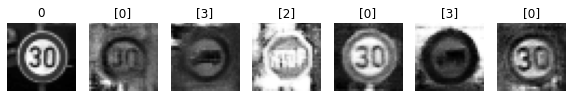

Epoch 84910 g_loss= 0.99612325 d_loss= 1.1521181 real_acc= 0.68 fake_acc= 0.62
Epoch 84920 g_loss= 1.045042 d_loss= 1.0994635 real_acc= 0.76 fake_acc= 0.72
Epoch 84930 g_loss= 1.0082756 d_loss= 1.1053348 real_acc= 0.82 fake_acc= 0.68
Epoch 84940 g_loss= 1.1226699 d_loss= 0.9877938 real_acc= 0.84 fake_acc= 0.62
Epoch 84950 g_loss= 1.0291817 d_loss= 1.1256568 real_acc= 0.74 fake_acc= 0.76
Epoch 84960 g_loss= 1.1224935 d_loss= 1.1990461 real_acc= 0.58 fake_acc= 0.74
Epoch 84970 g_loss= 1.1185504 d_loss= 1.0902143 real_acc= 0.68 fake_acc= 0.76
Epoch 84980 g_loss= 1.134242 d_loss= 1.1279099 real_acc= 0.6 fake_acc= 0.74
Epoch 84990 g_loss= 0.8595425 d_loss= 1.2553735 real_acc= 0.72 fake_acc= 0.54
Epoch 85000 g_loss= 1.0548623 d_loss= 1.1238451 real_acc= 0.72 fake_acc= 0.72


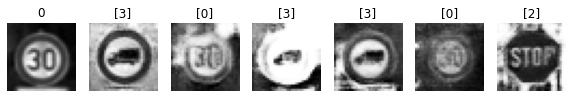

Epoch 85010 g_loss= 1.1619512 d_loss= 1.1549549 real_acc= 0.6 fake_acc= 0.74
Epoch 85020 g_loss= 1.1908165 d_loss= 1.0393662 real_acc= 0.78 fake_acc= 0.72
Epoch 85030 g_loss= 1.0079277 d_loss= 1.1932461 real_acc= 0.64 fake_acc= 0.64
Epoch 85040 g_loss= 1.0009979 d_loss= 1.023385 real_acc= 0.78 fake_acc= 0.68
Epoch 85050 g_loss= 0.99306434 d_loss= 1.1328405 real_acc= 0.74 fake_acc= 0.62
Epoch 85060 g_loss= 1.0762224 d_loss= 1.135881 real_acc= 0.7 fake_acc= 0.64
Epoch 85070 g_loss= 0.96616006 d_loss= 1.3473392 real_acc= 0.54 fake_acc= 0.56
Epoch 85080 g_loss= 0.8897447 d_loss= 1.1568663 real_acc= 0.8 fake_acc= 0.64
Epoch 85090 g_loss= 1.319992 d_loss= 0.9867704 real_acc= 0.74 fake_acc= 0.82
Epoch 85100 g_loss= 1.2556884 d_loss= 1.0313423 real_acc= 0.74 fake_acc= 0.8


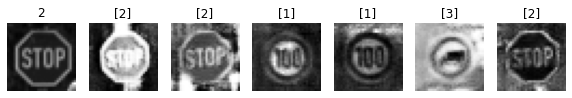

Epoch 85110 g_loss= 0.9588811 d_loss= 1.2672118 real_acc= 0.62 fake_acc= 0.62
Epoch 85120 g_loss= 0.89424515 d_loss= 1.2716782 real_acc= 0.64 fake_acc= 0.6
Epoch 85130 g_loss= 1.0039252 d_loss= 0.9973824 real_acc= 0.9 fake_acc= 0.66
Epoch 85140 g_loss= 1.1268362 d_loss= 1.0779113 real_acc= 0.68 fake_acc= 0.76
Epoch 85150 g_loss= 1.1620972 d_loss= 0.9999232 real_acc= 0.78 fake_acc= 0.68
Epoch 85160 g_loss= 1.1861706 d_loss= 1.1667788 real_acc= 0.76 fake_acc= 0.66
Epoch 85170 g_loss= 1.1072851 d_loss= 1.0194451 real_acc= 0.76 fake_acc= 0.78
Epoch 85180 g_loss= 1.1330519 d_loss= 1.0966105 real_acc= 0.7 fake_acc= 0.74
Epoch 85190 g_loss= 1.2390629 d_loss= 1.0904832 real_acc= 0.74 fake_acc= 0.78
Epoch 85200 g_loss= 0.96662486 d_loss= 1.1851764 real_acc= 0.7 fake_acc= 0.58


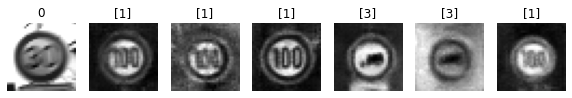

Epoch 85210 g_loss= 1.0123296 d_loss= 1.1311418 real_acc= 0.68 fake_acc= 0.66
Epoch 85220 g_loss= 0.9879508 d_loss= 1.1822038 real_acc= 0.72 fake_acc= 0.68
Epoch 85230 g_loss= 1.1452608 d_loss= 1.1467075 real_acc= 0.72 fake_acc= 0.7
Epoch 85240 g_loss= 1.0193962 d_loss= 1.1231239 real_acc= 0.78 fake_acc= 0.62
Epoch 85250 g_loss= 1.288092 d_loss= 1.1219221 real_acc= 0.6 fake_acc= 0.74
Epoch 85260 g_loss= 1.1734282 d_loss= 1.2589852 real_acc= 0.52 fake_acc= 0.72
Epoch 85270 g_loss= 1.0310311 d_loss= 1.1761744 real_acc= 0.68 fake_acc= 0.6
Epoch 85280 g_loss= 1.1330395 d_loss= 0.9913701 real_acc= 0.82 fake_acc= 0.68
Epoch 85290 g_loss= 1.0890797 d_loss= 1.2829227 real_acc= 0.58 fake_acc= 0.7
Epoch 85300 g_loss= 1.0291232 d_loss= 1.1898093 real_acc= 0.7 fake_acc= 0.66


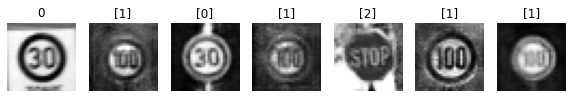

Epoch 85310 g_loss= 1.2616193 d_loss= 1.1724179 real_acc= 0.66 fake_acc= 0.78
Epoch 85320 g_loss= 1.1532856 d_loss= 1.2072258 real_acc= 0.7 fake_acc= 0.68
Epoch 85330 g_loss= 1.1564311 d_loss= 1.1034081 real_acc= 0.88 fake_acc= 0.64
Epoch 85340 g_loss= 1.1895211 d_loss= 1.1724751 real_acc= 0.54 fake_acc= 0.8
Epoch 85350 g_loss= 0.9845375 d_loss= 1.1420058 real_acc= 0.68 fake_acc= 0.66
Epoch 85360 g_loss= 1.1261652 d_loss= 1.1221167 real_acc= 0.68 fake_acc= 0.72
Epoch 85370 g_loss= 1.360579 d_loss= 1.2065995 real_acc= 0.6 fake_acc= 0.76
Epoch 85380 g_loss= 1.0757823 d_loss= 1.1757603 real_acc= 0.6 fake_acc= 0.68
Epoch 85390 g_loss= 0.8153604 d_loss= 1.2143749 real_acc= 0.7 fake_acc= 0.48
Epoch 85400 g_loss= 1.2136358 d_loss= 0.9917746 real_acc= 0.76 fake_acc= 0.84


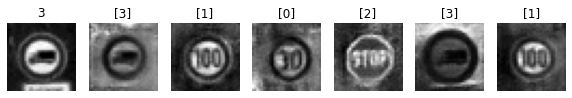

Epoch 85410 g_loss= 1.124443 d_loss= 1.1210389 real_acc= 0.7 fake_acc= 0.68
Epoch 85420 g_loss= 0.902375 d_loss= 1.2020226 real_acc= 0.74 fake_acc= 0.58
Epoch 85430 g_loss= 0.9962113 d_loss= 1.1187558 real_acc= 0.7 fake_acc= 0.78
Epoch 85440 g_loss= 1.2458103 d_loss= 1.109731 real_acc= 0.66 fake_acc= 0.68
Epoch 85450 g_loss= 1.0480849 d_loss= 1.0614603 real_acc= 0.78 fake_acc= 0.66
Epoch 85460 g_loss= 1.1206979 d_loss= 1.1873777 real_acc= 0.64 fake_acc= 0.68
Epoch 85470 g_loss= 1.0331852 d_loss= 1.1500607 real_acc= 0.72 fake_acc= 0.66
Epoch 85480 g_loss= 1.1731116 d_loss= 1.0686725 real_acc= 0.68 fake_acc= 0.72
Epoch 85490 g_loss= 1.0287814 d_loss= 1.239872 real_acc= 0.66 fake_acc= 0.66
Epoch 85500 g_loss= 1.0085021 d_loss= 1.2679553 real_acc= 0.64 fake_acc= 0.52


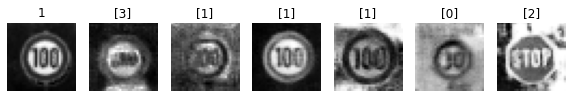

Epoch 85510 g_loss= 0.9901914 d_loss= 1.1561825 real_acc= 0.72 fake_acc= 0.8
Epoch 85520 g_loss= 1.1822239 d_loss= 1.1339793 real_acc= 0.7 fake_acc= 0.72
Epoch 85530 g_loss= 1.2370105 d_loss= 1.0009391 real_acc= 0.8 fake_acc= 0.78
Epoch 85540 g_loss= 1.0269738 d_loss= 1.1720817 real_acc= 0.8 fake_acc= 0.66
Epoch 85550 g_loss= 1.2318805 d_loss= 1.0642327 real_acc= 0.74 fake_acc= 0.82
Epoch 85560 g_loss= 0.9873933 d_loss= 1.1707833 real_acc= 0.64 fake_acc= 0.62
Epoch 85570 g_loss= 1.0605835 d_loss= 1.2984 real_acc= 0.62 fake_acc= 0.6
Epoch 85580 g_loss= 1.2511603 d_loss= 1.1801089 real_acc= 0.52 fake_acc= 0.84
Epoch 85590 g_loss= 1.0815425 d_loss= 0.97169197 real_acc= 0.84 fake_acc= 0.7
Epoch 85600 g_loss= 1.064402 d_loss= 1.0363834 real_acc= 0.8 fake_acc= 0.68


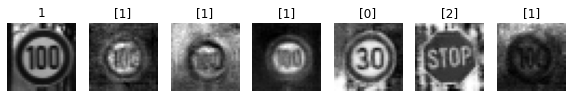

Epoch 85610 g_loss= 1.0794017 d_loss= 1.2595406 real_acc= 0.56 fake_acc= 0.7
Epoch 85620 g_loss= 1.2340074 d_loss= 1.0898333 real_acc= 0.66 fake_acc= 0.82
Epoch 85630 g_loss= 0.97518134 d_loss= 1.1659144 real_acc= 0.74 fake_acc= 0.62
Epoch 85640 g_loss= 1.2556905 d_loss= 1.1505086 real_acc= 0.56 fake_acc= 0.74
Epoch 85650 g_loss= 0.969895 d_loss= 1.2170815 real_acc= 0.66 fake_acc= 0.72
Epoch 85660 g_loss= 1.0907073 d_loss= 1.1241479 real_acc= 0.76 fake_acc= 0.66
Epoch 85670 g_loss= 1.0300114 d_loss= 1.0900266 real_acc= 0.72 fake_acc= 0.7
Epoch 85680 g_loss= 1.0500777 d_loss= 1.104022 real_acc= 0.76 fake_acc= 0.76
Epoch 85690 g_loss= 1.0997368 d_loss= 1.1519481 real_acc= 0.62 fake_acc= 0.7
Epoch 85700 g_loss= 1.0374488 d_loss= 1.1180484 real_acc= 0.72 fake_acc= 0.72


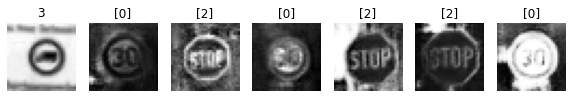

Epoch 85710 g_loss= 0.81918263 d_loss= 1.2360938 real_acc= 0.74 fake_acc= 0.5
Epoch 85720 g_loss= 1.0410736 d_loss= 1.2516662 real_acc= 0.62 fake_acc= 0.62
Epoch 85730 g_loss= 1.0828269 d_loss= 1.1128259 real_acc= 0.62 fake_acc= 0.7
Epoch 85740 g_loss= 0.8146206 d_loss= 1.2277839 real_acc= 0.78 fake_acc= 0.6
Epoch 85750 g_loss= 1.0582397 d_loss= 1.2135247 real_acc= 0.6 fake_acc= 0.7
Epoch 85760 g_loss= 1.1252766 d_loss= 1.0925457 real_acc= 0.78 fake_acc= 0.8
Epoch 85770 g_loss= 1.0596839 d_loss= 1.0535738 real_acc= 0.78 fake_acc= 0.62
Epoch 85780 g_loss= 1.180526 d_loss= 1.0054915 real_acc= 0.82 fake_acc= 0.78
Epoch 85790 g_loss= 0.95031285 d_loss= 1.1203752 real_acc= 0.8 fake_acc= 0.62
Epoch 85800 g_loss= 1.1353707 d_loss= 0.9763874 real_acc= 0.74 fake_acc= 0.72


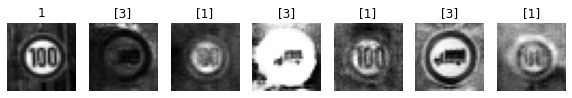

Epoch 85810 g_loss= 1.1671226 d_loss= 1.0596731 real_acc= 0.64 fake_acc= 0.8
Epoch 85820 g_loss= 1.1327397 d_loss= 1.0715892 real_acc= 0.82 fake_acc= 0.66
Epoch 85830 g_loss= 0.9903181 d_loss= 1.1480573 real_acc= 0.7 fake_acc= 0.64
Epoch 85840 g_loss= 0.98491853 d_loss= 1.2928896 real_acc= 0.68 fake_acc= 0.54
Epoch 85850 g_loss= 0.9839028 d_loss= 1.3313982 real_acc= 0.52 fake_acc= 0.62
Epoch 85860 g_loss= 1.0716224 d_loss= 1.12185 real_acc= 0.68 fake_acc= 0.66
Epoch 85870 g_loss= 1.0800285 d_loss= 1.2170869 real_acc= 0.62 fake_acc= 0.66
Epoch 85880 g_loss= 0.9794856 d_loss= 1.1281407 real_acc= 0.84 fake_acc= 0.72
Epoch 85890 g_loss= 0.8781825 d_loss= 1.3247194 real_acc= 0.64 fake_acc= 0.56
Epoch 85900 g_loss= 1.1288812 d_loss= 1.2123027 real_acc= 0.52 fake_acc= 0.8


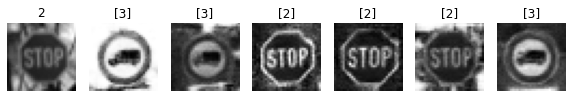

Epoch 85910 g_loss= 1.0015484 d_loss= 1.1675385 real_acc= 0.74 fake_acc= 0.72
Epoch 85920 g_loss= 0.96500367 d_loss= 1.17575 real_acc= 0.72 fake_acc= 0.58
Epoch 85930 g_loss= 1.1037792 d_loss= 1.1583894 real_acc= 0.68 fake_acc= 0.7
Epoch 85940 g_loss= 1.015072 d_loss= 1.2153207 real_acc= 0.68 fake_acc= 0.62
Epoch 85950 g_loss= 0.899078 d_loss= 1.1410826 real_acc= 0.74 fake_acc= 0.62
Epoch 85960 g_loss= 1.0519246 d_loss= 1.2021443 real_acc= 0.62 fake_acc= 0.78
Epoch 85970 g_loss= 1.095064 d_loss= 1.153378 real_acc= 0.64 fake_acc= 0.72
Epoch 85980 g_loss= 0.93680406 d_loss= 1.2807341 real_acc= 0.64 fake_acc= 0.64
Epoch 85990 g_loss= 0.97937155 d_loss= 1.2338662 real_acc= 0.6 fake_acc= 0.72
Epoch 86000 g_loss= 0.90566903 d_loss= 1.2288359 real_acc= 0.66 fake_acc= 0.58


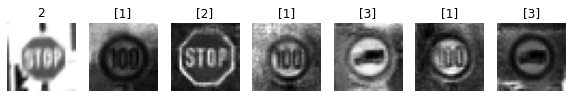

Epoch 86010 g_loss= 1.2424132 d_loss= 1.1129127 real_acc= 0.68 fake_acc= 0.76
Epoch 86020 g_loss= 1.0694693 d_loss= 1.1256664 real_acc= 0.66 fake_acc= 0.76
Epoch 86030 g_loss= 1.0953381 d_loss= 1.0439506 real_acc= 0.82 fake_acc= 0.62
Epoch 86040 g_loss= 1.0947924 d_loss= 1.2781079 real_acc= 0.58 fake_acc= 0.76
Epoch 86050 g_loss= 1.1043363 d_loss= 1.1105773 real_acc= 0.72 fake_acc= 0.78
Epoch 86060 g_loss= 1.0136758 d_loss= 1.2043254 real_acc= 0.6 fake_acc= 0.62
Epoch 86070 g_loss= 1.0813751 d_loss= 1.0856429 real_acc= 0.74 fake_acc= 0.62
Epoch 86080 g_loss= 1.1605718 d_loss= 1.068181 real_acc= 0.74 fake_acc= 0.76
Epoch 86090 g_loss= 1.140611 d_loss= 1.2254626 real_acc= 0.68 fake_acc= 0.64
Epoch 86100 g_loss= 1.0850638 d_loss= 1.0985909 real_acc= 0.7 fake_acc= 0.68


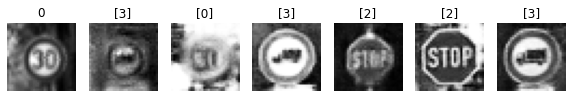

Epoch 86110 g_loss= 0.9430484 d_loss= 1.1734335 real_acc= 0.64 fake_acc= 0.72
Epoch 86120 g_loss= 1.2319379 d_loss= 1.0704794 real_acc= 0.7 fake_acc= 0.68
Epoch 86130 g_loss= 1.177124 d_loss= 1.0482962 real_acc= 0.8 fake_acc= 0.66
Epoch 86140 g_loss= 1.077997 d_loss= 1.121555 real_acc= 0.68 fake_acc= 0.6
Epoch 86150 g_loss= 1.0078009 d_loss= 1.0295632 real_acc= 0.76 fake_acc= 0.64
Epoch 86160 g_loss= 0.94721216 d_loss= 1.1797242 real_acc= 0.66 fake_acc= 0.62
Epoch 86170 g_loss= 1.0445342 d_loss= 1.1301584 real_acc= 0.74 fake_acc= 0.68
Epoch 86180 g_loss= 1.1769562 d_loss= 1.036246 real_acc= 0.76 fake_acc= 0.72
Epoch 86190 g_loss= 1.1407485 d_loss= 1.1422355 real_acc= 0.68 fake_acc= 0.72
Epoch 86200 g_loss= 1.0101415 d_loss= 1.2706795 real_acc= 0.62 fake_acc= 0.58


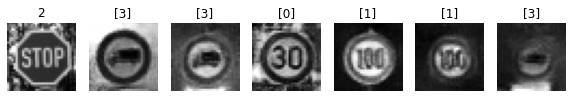

Epoch 86210 g_loss= 1.0574851 d_loss= 1.2013843 real_acc= 0.64 fake_acc= 0.6
Epoch 86220 g_loss= 1.0967966 d_loss= 1.1241728 real_acc= 0.74 fake_acc= 0.76
Epoch 86230 g_loss= 1.1464379 d_loss= 1.2073307 real_acc= 0.5 fake_acc= 0.78
Epoch 86240 g_loss= 1.038228 d_loss= 1.2123926 real_acc= 0.68 fake_acc= 0.74
Epoch 86250 g_loss= 0.95077723 d_loss= 1.3081897 real_acc= 0.72 fake_acc= 0.46
Epoch 86260 g_loss= 1.2211031 d_loss= 0.9423175 real_acc= 0.76 fake_acc= 0.76
Epoch 86270 g_loss= 0.9286003 d_loss= 1.0803311 real_acc= 0.8 fake_acc= 0.7
Epoch 86280 g_loss= 0.96591 d_loss= 1.1787083 real_acc= 0.64 fake_acc= 0.72
Epoch 86290 g_loss= 1.1170477 d_loss= 1.2454066 real_acc= 0.66 fake_acc= 0.68
Epoch 86300 g_loss= 1.0662022 d_loss= 1.1021283 real_acc= 0.78 fake_acc= 0.64


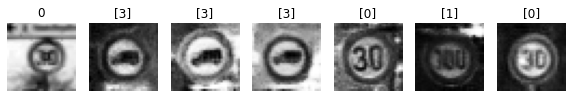

Epoch 86310 g_loss= 1.098041 d_loss= 1.3245171 real_acc= 0.48 fake_acc= 0.7
Epoch 86320 g_loss= 1.1154304 d_loss= 1.1369545 real_acc= 0.66 fake_acc= 0.74
Epoch 86330 g_loss= 1.0269138 d_loss= 1.1725909 real_acc= 0.62 fake_acc= 0.74
Epoch 86340 g_loss= 1.0146827 d_loss= 1.0667559 real_acc= 0.74 fake_acc= 0.72
Epoch 86350 g_loss= 1.0963246 d_loss= 1.0846138 real_acc= 0.64 fake_acc= 0.8
Epoch 86360 g_loss= 1.1295837 d_loss= 1.1992834 real_acc= 0.66 fake_acc= 0.76
Epoch 86370 g_loss= 0.99248385 d_loss= 1.1804392 real_acc= 0.76 fake_acc= 0.5
Epoch 86380 g_loss= 1.1679963 d_loss= 1.0680844 real_acc= 0.7 fake_acc= 0.76
Epoch 86390 g_loss= 1.1940101 d_loss= 0.9493787 real_acc= 0.72 fake_acc= 0.76
Epoch 86400 g_loss= 0.9219453 d_loss= 1.3155622 real_acc= 0.62 fake_acc= 0.58


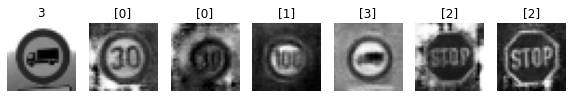

Epoch 86410 g_loss= 1.124007 d_loss= 1.238517 real_acc= 0.62 fake_acc= 0.66
Epoch 86420 g_loss= 0.86562973 d_loss= 1.1203614 real_acc= 0.84 fake_acc= 0.52
Epoch 86430 g_loss= 1.1319677 d_loss= 1.182697 real_acc= 0.62 fake_acc= 0.68
Epoch 86440 g_loss= 1.0973128 d_loss= 1.2738683 real_acc= 0.58 fake_acc= 0.78
Epoch 86450 g_loss= 0.9177792 d_loss= 1.0975761 real_acc= 0.8 fake_acc= 0.64
Epoch 86460 g_loss= 0.93706286 d_loss= 1.1043509 real_acc= 0.8 fake_acc= 0.7
Epoch 86470 g_loss= 1.0136387 d_loss= 1.1549952 real_acc= 0.72 fake_acc= 0.44
Epoch 86480 g_loss= 0.99361557 d_loss= 1.1924269 real_acc= 0.66 fake_acc= 0.66
Epoch 86490 g_loss= 1.1874622 d_loss= 1.1024973 real_acc= 0.7 fake_acc= 0.7
Epoch 86500 g_loss= 1.1248611 d_loss= 1.038426 real_acc= 0.72 fake_acc= 0.72


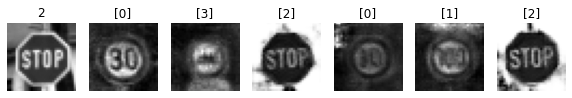

Epoch 86510 g_loss= 1.1626403 d_loss= 1.2035539 real_acc= 0.54 fake_acc= 0.8
Epoch 86520 g_loss= 0.96083504 d_loss= 1.2236485 real_acc= 0.78 fake_acc= 0.52
Epoch 86530 g_loss= 1.054766 d_loss= 1.1917431 real_acc= 0.64 fake_acc= 0.7
Epoch 86540 g_loss= 1.1905183 d_loss= 1.1148098 real_acc= 0.68 fake_acc= 0.74
Epoch 86550 g_loss= 1.3678637 d_loss= 1.0648952 real_acc= 0.72 fake_acc= 0.84
Epoch 86560 g_loss= 1.0662456 d_loss= 1.2146199 real_acc= 0.66 fake_acc= 0.62
Epoch 86570 g_loss= 1.0497466 d_loss= 1.1995425 real_acc= 0.76 fake_acc= 0.72
Epoch 86580 g_loss= 1.0749816 d_loss= 1.1220136 real_acc= 0.76 fake_acc= 0.74
Epoch 86590 g_loss= 0.9717149 d_loss= 1.1781936 real_acc= 0.64 fake_acc= 0.68
Epoch 86600 g_loss= 1.1702318 d_loss= 1.1735711 real_acc= 0.66 fake_acc= 0.7


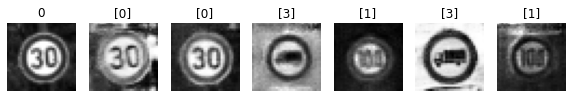

Epoch 86610 g_loss= 1.1752892 d_loss= 1.1685834 real_acc= 0.7 fake_acc= 0.7
Epoch 86620 g_loss= 1.0384244 d_loss= 1.1764135 real_acc= 0.58 fake_acc= 0.7
Epoch 86630 g_loss= 1.0800766 d_loss= 1.1967067 real_acc= 0.66 fake_acc= 0.7
Epoch 86640 g_loss= 1.181546 d_loss= 1.1304932 real_acc= 0.56 fake_acc= 0.8
Epoch 86650 g_loss= 0.94736654 d_loss= 1.3110502 real_acc= 0.64 fake_acc= 0.66
Epoch 86660 g_loss= 0.97430986 d_loss= 1.2682898 real_acc= 0.68 fake_acc= 0.66
Epoch 86670 g_loss= 1.0510439 d_loss= 1.2854091 real_acc= 0.68 fake_acc= 0.72
Epoch 86680 g_loss= 0.86915416 d_loss= 1.225845 real_acc= 0.76 fake_acc= 0.58
Epoch 86690 g_loss= 0.9718898 d_loss= 1.2142577 real_acc= 0.68 fake_acc= 0.68
Epoch 86700 g_loss= 1.1346161 d_loss= 1.1810637 real_acc= 0.58 fake_acc= 0.72


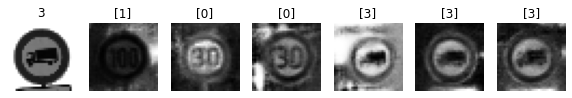

Epoch 86710 g_loss= 1.0647292 d_loss= 1.1785889 real_acc= 0.72 fake_acc= 0.56
Epoch 86720 g_loss= 1.0793238 d_loss= 1.1143502 real_acc= 0.74 fake_acc= 0.56
Epoch 86730 g_loss= 1.1077127 d_loss= 1.2045 real_acc= 0.68 fake_acc= 0.76
Epoch 86740 g_loss= 1.0691869 d_loss= 1.188523 real_acc= 0.64 fake_acc= 0.68
Epoch 86750 g_loss= 1.16945 d_loss= 1.1619916 real_acc= 0.64 fake_acc= 0.72
Epoch 86760 g_loss= 1.279576 d_loss= 1.1738908 real_acc= 0.66 fake_acc= 0.68
Epoch 86770 g_loss= 0.9519775 d_loss= 1.139519 real_acc= 0.8 fake_acc= 0.58
Epoch 86780 g_loss= 0.8923697 d_loss= 1.1844624 real_acc= 0.78 fake_acc= 0.56
Epoch 86790 g_loss= 1.1256222 d_loss= 1.1438472 real_acc= 0.66 fake_acc= 0.76
Epoch 86800 g_loss= 1.2514153 d_loss= 1.1213663 real_acc= 0.58 fake_acc= 0.72


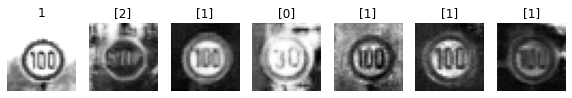

Epoch 86810 g_loss= 1.1193317 d_loss= 1.2144052 real_acc= 0.62 fake_acc= 0.68
Epoch 86820 g_loss= 1.1313848 d_loss= 1.1605949 real_acc= 0.7 fake_acc= 0.68
Epoch 86830 g_loss= 1.0074228 d_loss= 1.0937347 real_acc= 0.7 fake_acc= 0.7
Epoch 86840 g_loss= 1.2095945 d_loss= 1.1144509 real_acc= 0.72 fake_acc= 0.76
Epoch 86850 g_loss= 1.3114711 d_loss= 1.1048595 real_acc= 0.66 fake_acc= 0.74
Epoch 86860 g_loss= 1.0263039 d_loss= 1.1542163 real_acc= 0.66 fake_acc= 0.68
Epoch 86870 g_loss= 1.0877546 d_loss= 1.1426477 real_acc= 0.8 fake_acc= 0.58
Epoch 86880 g_loss= 0.9601925 d_loss= 1.2377559 real_acc= 0.68 fake_acc= 0.58
Epoch 86890 g_loss= 0.99131197 d_loss= 1.1663842 real_acc= 0.68 fake_acc= 0.64
Epoch 86900 g_loss= 1.1738844 d_loss= 1.0478855 real_acc= 0.7 fake_acc= 0.7


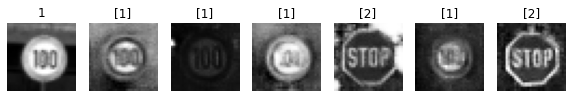

Epoch 86910 g_loss= 1.0108247 d_loss= 1.0451155 real_acc= 0.84 fake_acc= 0.56
Epoch 86920 g_loss= 1.0797085 d_loss= 1.1872144 real_acc= 0.6 fake_acc= 0.7
Epoch 86930 g_loss= 1.0814856 d_loss= 1.1103841 real_acc= 0.7 fake_acc= 0.76
Epoch 86940 g_loss= 1.0673296 d_loss= 1.0640249 real_acc= 0.72 fake_acc= 0.76
Epoch 86950 g_loss= 1.1831776 d_loss= 1.1493723 real_acc= 0.62 fake_acc= 0.7
Epoch 86960 g_loss= 1.1867692 d_loss= 1.1446216 real_acc= 0.7 fake_acc= 0.66
Epoch 86970 g_loss= 1.1258559 d_loss= 1.0356864 real_acc= 0.74 fake_acc= 0.78
Epoch 86980 g_loss= 0.9394218 d_loss= 1.1747963 real_acc= 0.7 fake_acc= 0.62
Epoch 86990 g_loss= 1.0671409 d_loss= 1.0178211 real_acc= 0.84 fake_acc= 0.7
Epoch 87000 g_loss= 1.2017603 d_loss= 1.0315255 real_acc= 0.62 fake_acc= 0.76


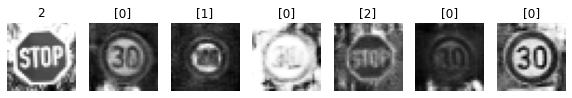

Epoch 87010 g_loss= 1.214923 d_loss= 1.103612 real_acc= 0.6 fake_acc= 0.78
Epoch 87020 g_loss= 1.0357275 d_loss= 1.1696085 real_acc= 0.74 fake_acc= 0.58
Epoch 87030 g_loss= 1.2144436 d_loss= 1.0482054 real_acc= 0.7 fake_acc= 0.8
Epoch 87040 g_loss= 1.0603276 d_loss= 1.0583277 real_acc= 0.82 fake_acc= 0.66
Epoch 87050 g_loss= 1.3655264 d_loss= 1.1786993 real_acc= 0.56 fake_acc= 0.82
Epoch 87060 g_loss= 1.0097097 d_loss= 1.2904465 real_acc= 0.62 fake_acc= 0.72
Epoch 87070 g_loss= 0.993433 d_loss= 1.1158847 real_acc= 0.8 fake_acc= 0.66
Epoch 87080 g_loss= 1.2313018 d_loss= 1.042023 real_acc= 0.7 fake_acc= 0.74
Epoch 87090 g_loss= 1.1720614 d_loss= 1.071713 real_acc= 0.74 fake_acc= 0.66
Epoch 87100 g_loss= 0.97801584 d_loss= 1.2793777 real_acc= 0.54 fake_acc= 0.62


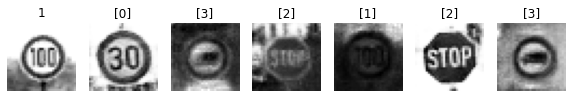

Epoch 87110 g_loss= 1.0204946 d_loss= 1.1234248 real_acc= 0.6 fake_acc= 0.66
Epoch 87120 g_loss= 1.1209066 d_loss= 1.0604767 real_acc= 0.78 fake_acc= 0.66
Epoch 87130 g_loss= 1.0519084 d_loss= 1.3250034 real_acc= 0.52 fake_acc= 0.68
Epoch 87140 g_loss= 0.96704465 d_loss= 1.1288934 real_acc= 0.82 fake_acc= 0.64
Epoch 87150 g_loss= 1.0386889 d_loss= 1.1640344 real_acc= 0.62 fake_acc= 0.82
Epoch 87160 g_loss= 1.1203551 d_loss= 1.1997085 real_acc= 0.64 fake_acc= 0.72
Epoch 87170 g_loss= 1.0582323 d_loss= 1.1054903 real_acc= 0.74 fake_acc= 0.64
Epoch 87180 g_loss= 0.86760354 d_loss= 1.2181064 real_acc= 0.68 fake_acc= 0.66
Epoch 87190 g_loss= 0.9534658 d_loss= 1.2143843 real_acc= 0.68 fake_acc= 0.72
Epoch 87200 g_loss= 1.1084304 d_loss= 1.1060108 real_acc= 0.7 fake_acc= 0.76


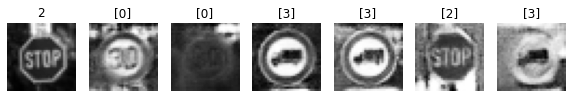

Epoch 87210 g_loss= 0.94170654 d_loss= 1.1113118 real_acc= 0.78 fake_acc= 0.56
Epoch 87220 g_loss= 1.279209 d_loss= 1.0544345 real_acc= 0.76 fake_acc= 0.76
Epoch 87230 g_loss= 0.8831916 d_loss= 1.1628559 real_acc= 0.7 fake_acc= 0.6
Epoch 87240 g_loss= 0.93937474 d_loss= 1.2195466 real_acc= 0.7 fake_acc= 0.56
Epoch 87250 g_loss= 1.3809562 d_loss= 1.1196417 real_acc= 0.62 fake_acc= 0.74
Epoch 87260 g_loss= 0.9675838 d_loss= 1.1329976 real_acc= 0.68 fake_acc= 0.58
Epoch 87270 g_loss= 1.1118897 d_loss= 0.9746162 real_acc= 0.86 fake_acc= 0.7
Epoch 87280 g_loss= 0.9812009 d_loss= 1.2989639 real_acc= 0.68 fake_acc= 0.68
Epoch 87290 g_loss= 1.3994023 d_loss= 1.1344454 real_acc= 0.58 fake_acc= 0.7
Epoch 87300 g_loss= 1.1031404 d_loss= 1.0829688 real_acc= 0.8 fake_acc= 0.68


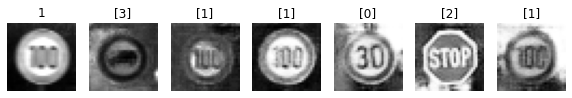

Epoch 87310 g_loss= 1.3205091 d_loss= 1.0626247 real_acc= 0.62 fake_acc= 0.8
Epoch 87320 g_loss= 1.0946546 d_loss= 1.1008122 real_acc= 0.8 fake_acc= 0.68
Epoch 87330 g_loss= 1.17705 d_loss= 0.95322084 real_acc= 0.82 fake_acc= 0.66
Epoch 87340 g_loss= 1.3003097 d_loss= 1.0436456 real_acc= 0.56 fake_acc= 0.88
Epoch 87350 g_loss= 1.1206625 d_loss= 1.2075086 real_acc= 0.68 fake_acc= 0.64
Epoch 87360 g_loss= 1.098183 d_loss= 1.0152755 real_acc= 0.72 fake_acc= 0.66
Epoch 87370 g_loss= 1.1803364 d_loss= 1.1831617 real_acc= 0.58 fake_acc= 0.7
Epoch 87380 g_loss= 1.2331462 d_loss= 1.0760083 real_acc= 0.72 fake_acc= 0.78
Epoch 87390 g_loss= 0.8404742 d_loss= 1.2174757 real_acc= 0.8 fake_acc= 0.48
Epoch 87400 g_loss= 0.9424213 d_loss= 1.2375941 real_acc= 0.68 fake_acc= 0.68


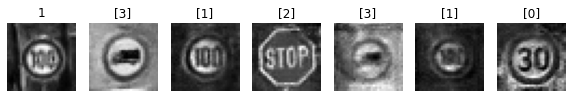

Epoch 87410 g_loss= 1.0280566 d_loss= 1.2403852 real_acc= 0.64 fake_acc= 0.68
Epoch 87420 g_loss= 1.1081543 d_loss= 1.1390812 real_acc= 0.66 fake_acc= 0.7
Epoch 87430 g_loss= 1.2072623 d_loss= 1.09238 real_acc= 0.74 fake_acc= 0.76
Epoch 87440 g_loss= 1.118473 d_loss= 1.0339078 real_acc= 0.74 fake_acc= 0.84
Epoch 87450 g_loss= 0.9741516 d_loss= 1.3932998 real_acc= 0.58 fake_acc= 0.52
Epoch 87460 g_loss= 1.205855 d_loss= 1.1964558 real_acc= 0.54 fake_acc= 0.68
Epoch 87470 g_loss= 1.006306 d_loss= 1.2327507 real_acc= 0.72 fake_acc= 0.56
Epoch 87480 g_loss= 1.0624864 d_loss= 1.1940687 real_acc= 0.74 fake_acc= 0.7
Epoch 87490 g_loss= 0.9785472 d_loss= 1.1054275 real_acc= 0.8 fake_acc= 0.68
Epoch 87500 g_loss= 1.1820967 d_loss= 1.0706258 real_acc= 0.62 fake_acc= 0.66


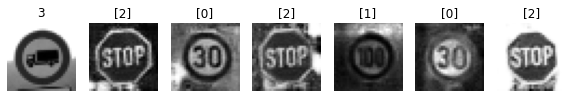

Epoch 87510 g_loss= 0.91787857 d_loss= 1.0680926 real_acc= 0.8 fake_acc= 0.64
Epoch 87520 g_loss= 1.054543 d_loss= 1.0729604 real_acc= 0.68 fake_acc= 0.7
Epoch 87530 g_loss= 1.3369597 d_loss= 1.2417934 real_acc= 0.56 fake_acc= 0.76
Epoch 87540 g_loss= 0.9545242 d_loss= 1.1628842 real_acc= 0.78 fake_acc= 0.5
Epoch 87550 g_loss= 1.129437 d_loss= 1.1332526 real_acc= 0.66 fake_acc= 0.72
Epoch 87560 g_loss= 1.0719806 d_loss= 1.2399065 real_acc= 0.68 fake_acc= 0.74
Epoch 87570 g_loss= 1.1046317 d_loss= 1.2042053 real_acc= 0.68 fake_acc= 0.64
Epoch 87580 g_loss= 1.122381 d_loss= 1.2619326 real_acc= 0.58 fake_acc= 0.66
Epoch 87590 g_loss= 1.1957897 d_loss= 1.0949119 real_acc= 0.64 fake_acc= 0.8
Epoch 87600 g_loss= 1.1020422 d_loss= 1.0938253 real_acc= 0.72 fake_acc= 0.78


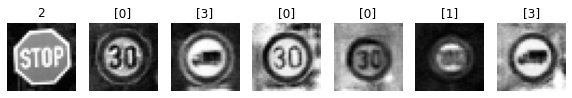

Epoch 87610 g_loss= 0.9913282 d_loss= 1.130996 real_acc= 0.76 fake_acc= 0.68
Epoch 87620 g_loss= 1.1236408 d_loss= 1.1487398 real_acc= 0.66 fake_acc= 0.72
Epoch 87630 g_loss= 1.0910832 d_loss= 1.0659344 real_acc= 0.78 fake_acc= 0.68
Epoch 87640 g_loss= 0.96890265 d_loss= 1.216141 real_acc= 0.72 fake_acc= 0.52
Epoch 87650 g_loss= 0.9481038 d_loss= 1.191263 real_acc= 0.7 fake_acc= 0.6
Epoch 87660 g_loss= 1.0599247 d_loss= 1.0994636 real_acc= 0.76 fake_acc= 0.68
Epoch 87670 g_loss= 1.009481 d_loss= 1.210067 real_acc= 0.68 fake_acc= 0.64
Epoch 87680 g_loss= 1.0856305 d_loss= 1.0462018 real_acc= 0.74 fake_acc= 0.74
Epoch 87690 g_loss= 1.0475988 d_loss= 1.1823647 real_acc= 0.6 fake_acc= 0.7
Epoch 87700 g_loss= 1.1120162 d_loss= 1.0663998 real_acc= 0.72 fake_acc= 0.68


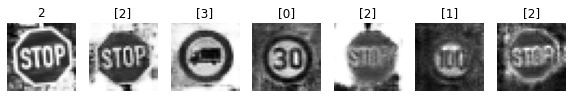

Epoch 87710 g_loss= 1.12645 d_loss= 1.1142406 real_acc= 0.7 fake_acc= 0.76
Epoch 87720 g_loss= 1.0437263 d_loss= 1.2062867 real_acc= 0.54 fake_acc= 0.8
Epoch 87730 g_loss= 0.8863073 d_loss= 1.0843803 real_acc= 0.82 fake_acc= 0.66
Epoch 87740 g_loss= 1.1052608 d_loss= 1.1425691 real_acc= 0.6 fake_acc= 0.8
Epoch 87750 g_loss= 1.252667 d_loss= 1.0471598 real_acc= 0.62 fake_acc= 0.8
Epoch 87760 g_loss= 1.2118527 d_loss= 1.1361096 real_acc= 0.58 fake_acc= 0.7
Epoch 87770 g_loss= 0.94629943 d_loss= 1.1721221 real_acc= 0.66 fake_acc= 0.6
Epoch 87780 g_loss= 0.8584576 d_loss= 1.2979108 real_acc= 0.62 fake_acc= 0.56
Epoch 87790 g_loss= 1.11985 d_loss= 1.1800367 real_acc= 0.6 fake_acc= 0.76
Epoch 87800 g_loss= 1.0450523 d_loss= 1.110007 real_acc= 0.72 fake_acc= 0.66


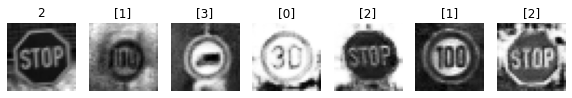

Epoch 87810 g_loss= 1.0526197 d_loss= 1.0693505 real_acc= 0.72 fake_acc= 0.72
Epoch 87820 g_loss= 1.0618231 d_loss= 1.0846906 real_acc= 0.7 fake_acc= 0.68
Epoch 87830 g_loss= 1.2453659 d_loss= 0.96108335 real_acc= 0.78 fake_acc= 0.76
Epoch 87840 g_loss= 1.0222633 d_loss= 1.1146959 real_acc= 0.8 fake_acc= 0.58
Epoch 87850 g_loss= 1.2254485 d_loss= 1.0157518 real_acc= 0.7 fake_acc= 0.68
Epoch 87860 g_loss= 1.2270225 d_loss= 1.1545203 real_acc= 0.56 fake_acc= 0.72
Epoch 87870 g_loss= 1.0149363 d_loss= 1.1597663 real_acc= 0.72 fake_acc= 0.7
Epoch 87880 g_loss= 1.0053642 d_loss= 1.254627 real_acc= 0.68 fake_acc= 0.72
Epoch 87890 g_loss= 1.0471814 d_loss= 1.1074796 real_acc= 0.8 fake_acc= 0.62
Epoch 87900 g_loss= 1.0731854 d_loss= 1.0506662 real_acc= 0.8 fake_acc= 0.7


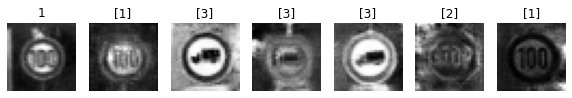

Epoch 87910 g_loss= 1.1657265 d_loss= 1.180951 real_acc= 0.64 fake_acc= 0.74
Epoch 87920 g_loss= 1.1415054 d_loss= 1.0888672 real_acc= 0.7 fake_acc= 0.7
Epoch 87930 g_loss= 0.9816418 d_loss= 1.1164992 real_acc= 0.7 fake_acc= 0.68
Epoch 87940 g_loss= 1.2109121 d_loss= 1.2251023 real_acc= 0.5 fake_acc= 0.8
Epoch 87950 g_loss= 1.2152498 d_loss= 0.952134 real_acc= 0.78 fake_acc= 0.72
Epoch 87960 g_loss= 1.1432033 d_loss= 1.0862527 real_acc= 0.76 fake_acc= 0.68
Epoch 87970 g_loss= 1.4042162 d_loss= 0.94094837 real_acc= 0.72 fake_acc= 0.86
Epoch 87980 g_loss= 1.1078588 d_loss= 1.1428208 real_acc= 0.62 fake_acc= 0.76
Epoch 87990 g_loss= 1.0138366 d_loss= 1.0686815 real_acc= 0.8 fake_acc= 0.64
Epoch 88000 g_loss= 0.98000085 d_loss= 1.1606371 real_acc= 0.64 fake_acc= 0.72


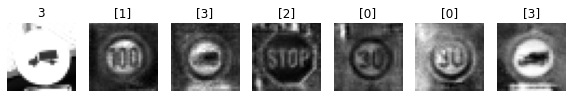

Epoch 88010 g_loss= 1.2316232 d_loss= 1.127109 real_acc= 0.72 fake_acc= 0.66
Epoch 88020 g_loss= 0.99822897 d_loss= 1.2043322 real_acc= 0.78 fake_acc= 0.54
Epoch 88030 g_loss= 1.064079 d_loss= 1.1676184 real_acc= 0.74 fake_acc= 0.58
Epoch 88040 g_loss= 1.0410765 d_loss= 1.1846123 real_acc= 0.66 fake_acc= 0.7
Epoch 88050 g_loss= 1.1631664 d_loss= 1.0960207 real_acc= 0.76 fake_acc= 0.66
Epoch 88060 g_loss= 1.2185414 d_loss= 1.2730001 real_acc= 0.56 fake_acc= 0.76
Epoch 88070 g_loss= 1.0896444 d_loss= 1.1721461 real_acc= 0.68 fake_acc= 0.74
Epoch 88080 g_loss= 0.8593927 d_loss= 1.2681384 real_acc= 0.66 fake_acc= 0.6
Epoch 88090 g_loss= 0.956711 d_loss= 1.2733041 real_acc= 0.66 fake_acc= 0.54
Epoch 88100 g_loss= 1.1848099 d_loss= 1.0956895 real_acc= 0.68 fake_acc= 0.78


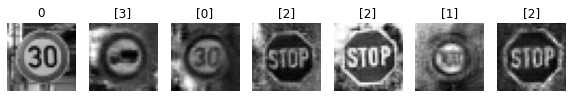

Epoch 88110 g_loss= 1.0962738 d_loss= 1.1265397 real_acc= 0.7 fake_acc= 0.74
Epoch 88120 g_loss= 1.0785413 d_loss= 1.0984753 real_acc= 0.68 fake_acc= 0.66
Epoch 88130 g_loss= 1.1955174 d_loss= 1.0422437 real_acc= 0.76 fake_acc= 0.78
Epoch 88140 g_loss= 1.2111807 d_loss= 1.0611358 real_acc= 0.74 fake_acc= 0.74
Epoch 88150 g_loss= 1.060838 d_loss= 1.3088437 real_acc= 0.7 fake_acc= 0.64
Epoch 88160 g_loss= 1.1107018 d_loss= 1.1903021 real_acc= 0.68 fake_acc= 0.66
Epoch 88170 g_loss= 1.00033 d_loss= 1.1708074 real_acc= 0.76 fake_acc= 0.52
Epoch 88180 g_loss= 0.9729388 d_loss= 1.1858027 real_acc= 0.68 fake_acc= 0.58
Epoch 88190 g_loss= 0.92256933 d_loss= 1.234116 real_acc= 0.72 fake_acc= 0.52
Epoch 88200 g_loss= 0.8903896 d_loss= 1.1637695 real_acc= 0.66 fake_acc= 0.6


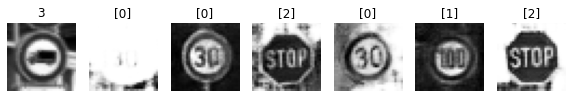

Epoch 88210 g_loss= 1.1164684 d_loss= 1.1454422 real_acc= 0.7 fake_acc= 0.7
Epoch 88220 g_loss= 1.1923608 d_loss= 1.0158839 real_acc= 0.78 fake_acc= 0.68
Epoch 88230 g_loss= 1.180984 d_loss= 1.2450486 real_acc= 0.5 fake_acc= 0.66
Epoch 88240 g_loss= 1.1427891 d_loss= 1.1464685 real_acc= 0.68 fake_acc= 0.76
Epoch 88250 g_loss= 1.1267401 d_loss= 1.1112592 real_acc= 0.64 fake_acc= 0.76
Epoch 88260 g_loss= 1.2116321 d_loss= 1.1580096 real_acc= 0.6 fake_acc= 0.72
Epoch 88270 g_loss= 1.2635075 d_loss= 1.0604079 real_acc= 0.7 fake_acc= 0.78
Epoch 88280 g_loss= 1.1095657 d_loss= 1.1843802 real_acc= 0.64 fake_acc= 0.7
Epoch 88290 g_loss= 0.95080423 d_loss= 1.2251981 real_acc= 0.68 fake_acc= 0.7
Epoch 88300 g_loss= 1.191805 d_loss= 1.0663725 real_acc= 0.7 fake_acc= 0.68


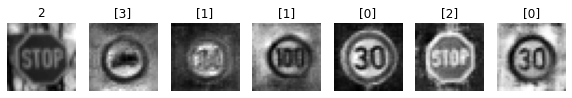

Epoch 88310 g_loss= 1.0854379 d_loss= 1.1380339 real_acc= 0.7 fake_acc= 0.66
Epoch 88320 g_loss= 1.0694162 d_loss= 1.1353492 real_acc= 0.66 fake_acc= 0.74
Epoch 88330 g_loss= 0.9336253 d_loss= 1.3166199 real_acc= 0.68 fake_acc= 0.56
Epoch 88340 g_loss= 1.06926 d_loss= 1.2064872 real_acc= 0.62 fake_acc= 0.7
Epoch 88350 g_loss= 1.1203151 d_loss= 1.1005838 real_acc= 0.68 fake_acc= 0.7
Epoch 88360 g_loss= 1.1309532 d_loss= 1.3344336 real_acc= 0.6 fake_acc= 0.62
Epoch 88370 g_loss= 1.1627346 d_loss= 1.0877738 real_acc= 0.64 fake_acc= 0.66
Epoch 88380 g_loss= 1.1379567 d_loss= 1.170955 real_acc= 0.7 fake_acc= 0.7
Epoch 88390 g_loss= 1.0962136 d_loss= 1.1471126 real_acc= 0.78 fake_acc= 0.66
Epoch 88400 g_loss= 1.1177672 d_loss= 1.0955884 real_acc= 0.7 fake_acc= 0.62


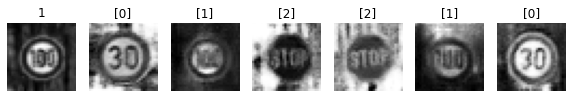

Epoch 88410 g_loss= 0.9737439 d_loss= 1.207706 real_acc= 0.64 fake_acc= 0.64
Epoch 88420 g_loss= 1.1052907 d_loss= 1.0631745 real_acc= 0.78 fake_acc= 0.64
Epoch 88430 g_loss= 1.253137 d_loss= 1.1627784 real_acc= 0.58 fake_acc= 0.7
Epoch 88440 g_loss= 1.0009389 d_loss= 1.2360029 real_acc= 0.7 fake_acc= 0.72
Epoch 88450 g_loss= 0.96010447 d_loss= 1.2977788 real_acc= 0.64 fake_acc= 0.6
Epoch 88460 g_loss= 1.0540805 d_loss= 1.1632175 real_acc= 0.62 fake_acc= 0.68
Epoch 88470 g_loss= 0.9968378 d_loss= 1.1625254 real_acc= 0.64 fake_acc= 0.68
Epoch 88480 g_loss= 0.91569376 d_loss= 1.1394736 real_acc= 0.82 fake_acc= 0.7
Epoch 88490 g_loss= 1.1168598 d_loss= 1.1247785 real_acc= 0.74 fake_acc= 0.62
Epoch 88500 g_loss= 1.1194664 d_loss= 1.0973661 real_acc= 0.74 fake_acc= 0.7


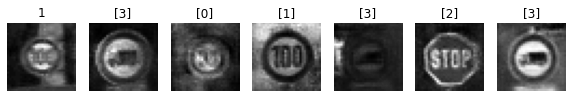

Epoch 88510 g_loss= 0.91384387 d_loss= 1.1046801 real_acc= 0.76 fake_acc= 0.7
Epoch 88520 g_loss= 1.2412281 d_loss= 1.083878 real_acc= 0.6 fake_acc= 0.72
Epoch 88530 g_loss= 0.9327359 d_loss= 1.1440489 real_acc= 0.72 fake_acc= 0.6
Epoch 88540 g_loss= 1.0744748 d_loss= 1.1998854 real_acc= 0.64 fake_acc= 0.62
Epoch 88550 g_loss= 1.1999698 d_loss= 1.0606995 real_acc= 0.72 fake_acc= 0.74
Epoch 88560 g_loss= 1.1171073 d_loss= 1.163171 real_acc= 0.72 fake_acc= 0.68
Epoch 88570 g_loss= 0.85566694 d_loss= 1.2123003 real_acc= 0.7 fake_acc= 0.58
Epoch 88580 g_loss= 1.0787416 d_loss= 1.2491713 real_acc= 0.64 fake_acc= 0.78
Epoch 88590 g_loss= 1.1464882 d_loss= 1.0512805 real_acc= 0.72 fake_acc= 0.7
Epoch 88600 g_loss= 1.2196603 d_loss= 1.1376414 real_acc= 0.64 fake_acc= 0.8


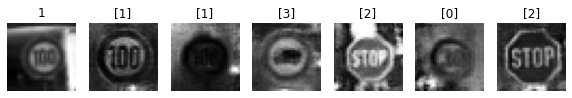

Epoch 88610 g_loss= 1.0205933 d_loss= 1.0717971 real_acc= 0.76 fake_acc= 0.7
Epoch 88620 g_loss= 1.1399349 d_loss= 1.1874728 real_acc= 0.66 fake_acc= 0.82
Epoch 88630 g_loss= 1.2984964 d_loss= 1.0978515 real_acc= 0.68 fake_acc= 0.72
Epoch 88640 g_loss= 0.99487305 d_loss= 1.0745776 real_acc= 0.84 fake_acc= 0.72
Epoch 88650 g_loss= 1.0294719 d_loss= 1.1504469 real_acc= 0.72 fake_acc= 0.7
Epoch 88660 g_loss= 1.0598724 d_loss= 1.1728697 real_acc= 0.64 fake_acc= 0.7
Epoch 88670 g_loss= 1.1782801 d_loss= 1.2329988 real_acc= 0.56 fake_acc= 0.78
Epoch 88680 g_loss= 1.0883424 d_loss= 1.1607475 real_acc= 0.76 fake_acc= 0.56
Epoch 88690 g_loss= 1.0234423 d_loss= 1.0346355 real_acc= 0.78 fake_acc= 0.66
Epoch 88700 g_loss= 1.1192081 d_loss= 1.0587468 real_acc= 0.7 fake_acc= 0.76


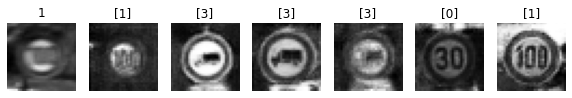

Epoch 88710 g_loss= 1.3858205 d_loss= 1.055932 real_acc= 0.56 fake_acc= 0.84
Epoch 88720 g_loss= 1.0793796 d_loss= 1.1928167 real_acc= 0.72 fake_acc= 0.66
Epoch 88730 g_loss= 0.92184275 d_loss= 1.1032063 real_acc= 0.74 fake_acc= 0.7
Epoch 88740 g_loss= 1.1723659 d_loss= 1.1637964 real_acc= 0.68 fake_acc= 0.76
Epoch 88750 g_loss= 1.1669433 d_loss= 1.1591473 real_acc= 0.64 fake_acc= 0.78
Epoch 88760 g_loss= 1.0007173 d_loss= 1.1855097 real_acc= 0.76 fake_acc= 0.68
Epoch 88770 g_loss= 1.0614818 d_loss= 1.1510664 real_acc= 0.66 fake_acc= 0.66
Epoch 88780 g_loss= 1.1890786 d_loss= 0.97208387 real_acc= 0.8 fake_acc= 0.7
Epoch 88790 g_loss= 1.2205957 d_loss= 1.0676161 real_acc= 0.72 fake_acc= 0.72
Epoch 88800 g_loss= 1.1790982 d_loss= 1.2236717 real_acc= 0.52 fake_acc= 0.78


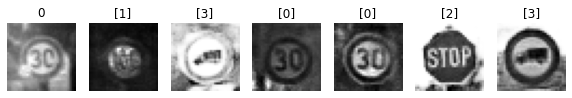

Epoch 88810 g_loss= 1.0332484 d_loss= 1.2264574 real_acc= 0.66 fake_acc= 0.6
Epoch 88820 g_loss= 0.9209881 d_loss= 1.1378603 real_acc= 0.72 fake_acc= 0.64
Epoch 88830 g_loss= 1.1139932 d_loss= 1.3036306 real_acc= 0.62 fake_acc= 0.64
Epoch 88840 g_loss= 1.1441026 d_loss= 1.0675378 real_acc= 0.72 fake_acc= 0.78
Epoch 88850 g_loss= 1.0076448 d_loss= 1.0508602 real_acc= 0.8 fake_acc= 0.72
Epoch 88860 g_loss= 1.1116219 d_loss= 1.2533927 real_acc= 0.62 fake_acc= 0.68
Epoch 88870 g_loss= 1.2287296 d_loss= 1.1084384 real_acc= 0.62 fake_acc= 0.84
Epoch 88880 g_loss= 1.0855495 d_loss= 1.0973375 real_acc= 0.72 fake_acc= 0.74
Epoch 88890 g_loss= 0.8540194 d_loss= 1.3486979 real_acc= 0.76 fake_acc= 0.58
Epoch 88900 g_loss= 1.0392509 d_loss= 1.0041051 real_acc= 0.76 fake_acc= 0.68


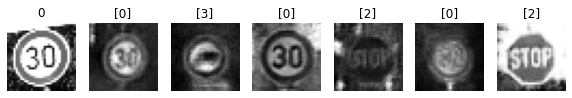

Epoch 88910 g_loss= 1.1853075 d_loss= 1.1887817 real_acc= 0.64 fake_acc= 0.76
Epoch 88920 g_loss= 0.945928 d_loss= 1.2488335 real_acc= 0.78 fake_acc= 0.48
Epoch 88930 g_loss= 1.2508904 d_loss= 1.0888774 real_acc= 0.72 fake_acc= 0.64
Epoch 88940 g_loss= 1.0764041 d_loss= 1.0244246 real_acc= 0.74 fake_acc= 0.78
Epoch 88950 g_loss= 1.0630465 d_loss= 1.0799279 real_acc= 0.72 fake_acc= 0.78
Epoch 88960 g_loss= 1.1292347 d_loss= 1.1614758 real_acc= 0.7 fake_acc= 0.72
Epoch 88970 g_loss= 1.2463598 d_loss= 1.1247289 real_acc= 0.68 fake_acc= 0.72
Epoch 88980 g_loss= 1.2892772 d_loss= 1.1455635 real_acc= 0.62 fake_acc= 0.74
Epoch 88990 g_loss= 1.4054791 d_loss= 1.0056219 real_acc= 0.76 fake_acc= 0.76
Epoch 89000 g_loss= 1.0220772 d_loss= 1.1177804 real_acc= 0.78 fake_acc= 0.64


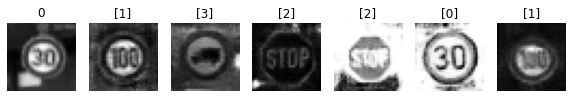

Epoch 89010 g_loss= 1.0144243 d_loss= 1.0999734 real_acc= 0.82 fake_acc= 0.64
Epoch 89020 g_loss= 1.2911626 d_loss= 1.056065 real_acc= 0.66 fake_acc= 0.76
Epoch 89030 g_loss= 0.90605116 d_loss= 1.1769266 real_acc= 0.84 fake_acc= 0.58
Epoch 89040 g_loss= 0.97819024 d_loss= 1.2141862 real_acc= 0.62 fake_acc= 0.68
Epoch 89050 g_loss= 1.2226611 d_loss= 1.0971355 real_acc= 0.62 fake_acc= 0.82
Epoch 89060 g_loss= 1.0316403 d_loss= 1.1650205 real_acc= 0.68 fake_acc= 0.56
Epoch 89070 g_loss= 1.0093251 d_loss= 1.25253 real_acc= 0.64 fake_acc= 0.6
Epoch 89080 g_loss= 1.1557617 d_loss= 1.1976829 real_acc= 0.68 fake_acc= 0.68
Epoch 89090 g_loss= 0.9227428 d_loss= 1.1760062 real_acc= 0.7 fake_acc= 0.58
Epoch 89100 g_loss= 0.9036142 d_loss= 1.3028638 real_acc= 0.74 fake_acc= 0.58


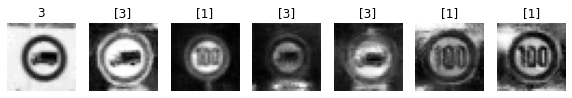

Epoch 89110 g_loss= 1.0272895 d_loss= 1.2980132 real_acc= 0.68 fake_acc= 0.5
Epoch 89120 g_loss= 1.069247 d_loss= 1.1155767 real_acc= 0.72 fake_acc= 0.76
Epoch 89130 g_loss= 1.1562166 d_loss= 1.0643203 real_acc= 0.62 fake_acc= 0.76
Epoch 89140 g_loss= 0.94097155 d_loss= 1.1835108 real_acc= 0.7 fake_acc= 0.6
Epoch 89150 g_loss= 0.97886306 d_loss= 1.1397768 real_acc= 0.7 fake_acc= 0.52
Epoch 89160 g_loss= 1.0700372 d_loss= 1.1633458 real_acc= 0.62 fake_acc= 0.82
Epoch 89170 g_loss= 1.195059 d_loss= 1.0510098 real_acc= 0.66 fake_acc= 0.76
Epoch 89180 g_loss= 1.0597088 d_loss= 1.2310869 real_acc= 0.56 fake_acc= 0.74
Epoch 89190 g_loss= 0.9524238 d_loss= 1.1432507 real_acc= 0.8 fake_acc= 0.58
Epoch 89200 g_loss= 1.4265633 d_loss= 0.9407355 real_acc= 0.78 fake_acc= 0.74


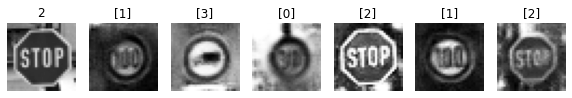

Epoch 89210 g_loss= 1.0525374 d_loss= 1.1176018 real_acc= 0.72 fake_acc= 0.72
Epoch 89220 g_loss= 1.232752 d_loss= 1.2149041 real_acc= 0.56 fake_acc= 0.72
Epoch 89230 g_loss= 0.93162125 d_loss= 1.1970367 real_acc= 0.72 fake_acc= 0.56
Epoch 89240 g_loss= 1.042006 d_loss= 1.2102362 real_acc= 0.72 fake_acc= 0.68
Epoch 89250 g_loss= 1.1159344 d_loss= 1.1607765 real_acc= 0.7 fake_acc= 0.62
Epoch 89260 g_loss= 1.1129522 d_loss= 1.0626 real_acc= 0.7 fake_acc= 0.8
Epoch 89270 g_loss= 1.2153183 d_loss= 1.0640836 real_acc= 0.7 fake_acc= 0.78
Epoch 89280 g_loss= 1.1188033 d_loss= 1.0970721 real_acc= 0.72 fake_acc= 0.72
Epoch 89290 g_loss= 1.0229381 d_loss= 1.1241152 real_acc= 0.72 fake_acc= 0.74
Epoch 89300 g_loss= 1.0242171 d_loss= 1.0794774 real_acc= 0.88 fake_acc= 0.56


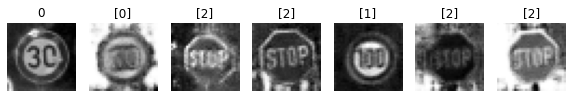

Epoch 89310 g_loss= 1.0111034 d_loss= 0.9893378 real_acc= 0.88 fake_acc= 0.72
Epoch 89320 g_loss= 1.1725237 d_loss= 1.3831208 real_acc= 0.56 fake_acc= 0.72
Epoch 89330 g_loss= 1.1706522 d_loss= 1.0805558 real_acc= 0.72 fake_acc= 0.76
Epoch 89340 g_loss= 1.1450006 d_loss= 1.0871133 real_acc= 0.66 fake_acc= 0.78
Epoch 89350 g_loss= 1.091097 d_loss= 1.1875997 real_acc= 0.66 fake_acc= 0.7
Epoch 89360 g_loss= 1.0242635 d_loss= 1.2013524 real_acc= 0.7 fake_acc= 0.56
Epoch 89370 g_loss= 1.1220584 d_loss= 1.1897149 real_acc= 0.72 fake_acc= 0.66
Epoch 89380 g_loss= 1.2540329 d_loss= 0.9638198 real_acc= 0.82 fake_acc= 0.8
Epoch 89390 g_loss= 0.8324841 d_loss= 1.174144 real_acc= 0.78 fake_acc= 0.52
Epoch 89400 g_loss= 1.1807481 d_loss= 1.1540833 real_acc= 0.64 fake_acc= 0.7


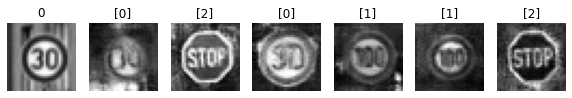

Epoch 89410 g_loss= 1.1595111 d_loss= 1.2079959 real_acc= 0.76 fake_acc= 0.72
Epoch 89420 g_loss= 1.080515 d_loss= 1.0803049 real_acc= 0.68 fake_acc= 0.72
Epoch 89430 g_loss= 1.2124088 d_loss= 1.0793484 real_acc= 0.58 fake_acc= 0.76
Epoch 89440 g_loss= 1.0000749 d_loss= 1.3128545 real_acc= 0.64 fake_acc= 0.6
Epoch 89450 g_loss= 1.1453629 d_loss= 1.0743483 real_acc= 0.62 fake_acc= 0.68
Epoch 89460 g_loss= 1.102895 d_loss= 1.221549 real_acc= 0.62 fake_acc= 0.7
Epoch 89470 g_loss= 1.3190008 d_loss= 1.0606258 real_acc= 0.7 fake_acc= 0.7
Epoch 89480 g_loss= 0.8274609 d_loss= 1.2067282 real_acc= 0.86 fake_acc= 0.48
Epoch 89490 g_loss= 1.0246717 d_loss= 1.2423279 real_acc= 0.68 fake_acc= 0.64
Epoch 89500 g_loss= 1.1987209 d_loss= 1.0716928 real_acc= 0.7 fake_acc= 0.8


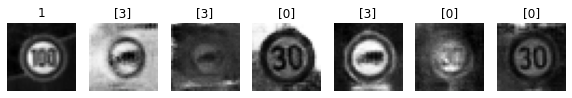

Epoch 89510 g_loss= 1.2372705 d_loss= 1.0100727 real_acc= 0.74 fake_acc= 0.74
Epoch 89520 g_loss= 1.0064459 d_loss= 1.0428545 real_acc= 0.84 fake_acc= 0.7
Epoch 89530 g_loss= 1.1721141 d_loss= 1.1894896 real_acc= 0.7 fake_acc= 0.62
Epoch 89540 g_loss= 1.1423659 d_loss= 1.14327 real_acc= 0.7 fake_acc= 0.66
Epoch 89550 g_loss= 1.0489492 d_loss= 1.2055081 real_acc= 0.66 fake_acc= 0.68
Epoch 89560 g_loss= 1.1441882 d_loss= 1.0769327 real_acc= 0.7 fake_acc= 0.72
Epoch 89570 g_loss= 1.0442585 d_loss= 1.2047616 real_acc= 0.68 fake_acc= 0.64
Epoch 89580 g_loss= 1.2158666 d_loss= 1.1124992 real_acc= 0.72 fake_acc= 0.68
Epoch 89590 g_loss= 1.0536511 d_loss= 1.0657668 real_acc= 0.74 fake_acc= 0.7
Epoch 89600 g_loss= 1.0597947 d_loss= 1.1306126 real_acc= 0.68 fake_acc= 0.78


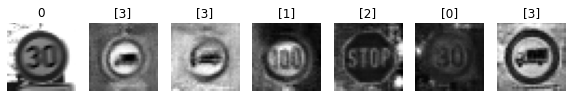

Epoch 89610 g_loss= 0.957179 d_loss= 1.2481287 real_acc= 0.64 fake_acc= 0.58
Epoch 89620 g_loss= 1.1053563 d_loss= 1.2353499 real_acc= 0.64 fake_acc= 0.68
Epoch 89630 g_loss= 1.1648066 d_loss= 1.3136516 real_acc= 0.46 fake_acc= 0.74
Epoch 89640 g_loss= 1.0999649 d_loss= 1.1425122 real_acc= 0.72 fake_acc= 0.66
Epoch 89650 g_loss= 1.0929925 d_loss= 1.1262506 real_acc= 0.64 fake_acc= 0.66
Epoch 89660 g_loss= 1.1961933 d_loss= 1.1228018 real_acc= 0.68 fake_acc= 0.76
Epoch 89670 g_loss= 1.1214957 d_loss= 1.0972898 real_acc= 0.66 fake_acc= 0.8
Epoch 89680 g_loss= 1.0352869 d_loss= 1.1031799 real_acc= 0.72 fake_acc= 0.7
Epoch 89690 g_loss= 1.1162214 d_loss= 1.0679587 real_acc= 0.72 fake_acc= 0.68
Epoch 89700 g_loss= 1.2139715 d_loss= 1.0839903 real_acc= 0.72 fake_acc= 0.78


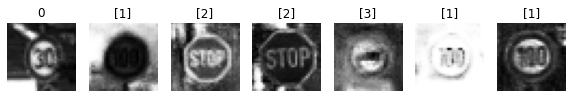

Epoch 89710 g_loss= 1.1519183 d_loss= 0.97943306 real_acc= 0.78 fake_acc= 0.72
Epoch 89720 g_loss= 1.2145796 d_loss= 1.1255777 real_acc= 0.62 fake_acc= 0.76
Epoch 89730 g_loss= 1.0919032 d_loss= 1.1770806 real_acc= 0.6 fake_acc= 0.74
Epoch 89740 g_loss= 1.1427082 d_loss= 1.1926315 real_acc= 0.62 fake_acc= 0.7
Epoch 89750 g_loss= 1.2031066 d_loss= 1.1376134 real_acc= 0.58 fake_acc= 0.82
Epoch 89760 g_loss= 1.0721958 d_loss= 1.0662769 real_acc= 0.82 fake_acc= 0.56
Epoch 89770 g_loss= 1.1987134 d_loss= 1.0519991 real_acc= 0.76 fake_acc= 0.76
Epoch 89780 g_loss= 1.1921445 d_loss= 1.004162 real_acc= 0.74 fake_acc= 0.78
Epoch 89790 g_loss= 1.2473519 d_loss= 1.0607698 real_acc= 0.6 fake_acc= 0.86
Epoch 89800 g_loss= 1.1813961 d_loss= 1.0672671 real_acc= 0.7 fake_acc= 0.66


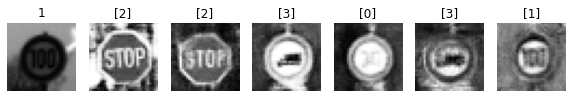

Epoch 89810 g_loss= 1.176312 d_loss= 1.2867625 real_acc= 0.58 fake_acc= 0.74
Epoch 89820 g_loss= 1.1002462 d_loss= 1.1681991 real_acc= 0.72 fake_acc= 0.72
Epoch 89830 g_loss= 0.9993702 d_loss= 1.2345228 real_acc= 0.7 fake_acc= 0.6
Epoch 89840 g_loss= 1.1318676 d_loss= 1.105013 real_acc= 0.74 fake_acc= 0.68
Epoch 89850 g_loss= 1.142178 d_loss= 1.0139977 real_acc= 0.72 fake_acc= 0.82
Epoch 89860 g_loss= 1.0746531 d_loss= 1.106256 real_acc= 0.74 fake_acc= 0.66
Epoch 89870 g_loss= 1.2298832 d_loss= 1.2338233 real_acc= 0.5 fake_acc= 0.74
Epoch 89880 g_loss= 1.124231 d_loss= 1.2910116 real_acc= 0.54 fake_acc= 0.7
Epoch 89890 g_loss= 0.90634316 d_loss= 1.1771241 real_acc= 0.76 fake_acc= 0.62
Epoch 89900 g_loss= 1.3081111 d_loss= 1.0000207 real_acc= 0.66 fake_acc= 0.78


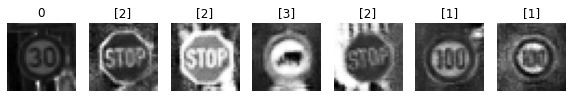

Epoch 89910 g_loss= 1.1064912 d_loss= 1.095627 real_acc= 0.76 fake_acc= 0.64
Epoch 89920 g_loss= 1.0171561 d_loss= 1.2671361 real_acc= 0.62 fake_acc= 0.56
Epoch 89930 g_loss= 1.0851693 d_loss= 1.161226 real_acc= 0.72 fake_acc= 0.7
Epoch 89940 g_loss= 1.0949618 d_loss= 1.0883551 real_acc= 0.66 fake_acc= 0.78
Epoch 89950 g_loss= 1.0992141 d_loss= 1.0785881 real_acc= 0.76 fake_acc= 0.72
Epoch 89960 g_loss= 1.0543462 d_loss= 1.1834486 real_acc= 0.66 fake_acc= 0.72
Epoch 89970 g_loss= 1.0878695 d_loss= 1.1909251 real_acc= 0.64 fake_acc= 0.78
Epoch 89980 g_loss= 1.0749 d_loss= 1.1483607 real_acc= 0.72 fake_acc= 0.72
Epoch 89990 g_loss= 0.87037885 d_loss= 1.2863548 real_acc= 0.76 fake_acc= 0.56
Epoch 90000 g_loss= 0.9153519 d_loss= 1.3170841 real_acc= 0.66 fake_acc= 0.62


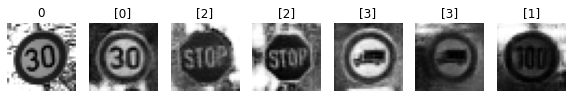

Epoch 90010 g_loss= 1.0061679 d_loss= 1.228729 real_acc= 0.62 fake_acc= 0.66
Epoch 90020 g_loss= 1.036457 d_loss= 1.1094518 real_acc= 0.72 fake_acc= 0.76
Epoch 90030 g_loss= 0.9102776 d_loss= 1.1802428 real_acc= 0.74 fake_acc= 0.54
Epoch 90040 g_loss= 1.0926758 d_loss= 1.0725205 real_acc= 0.74 fake_acc= 0.7
Epoch 90050 g_loss= 1.1728617 d_loss= 1.0954006 real_acc= 0.76 fake_acc= 0.68
Epoch 90060 g_loss= 1.1208591 d_loss= 1.1679537 real_acc= 0.74 fake_acc= 0.68
Epoch 90070 g_loss= 1.1799803 d_loss= 0.9569024 real_acc= 0.78 fake_acc= 0.8
Epoch 90080 g_loss= 1.0888665 d_loss= 1.1003623 real_acc= 0.58 fake_acc= 0.66
Epoch 90090 g_loss= 1.1650529 d_loss= 1.157426 real_acc= 0.6 fake_acc= 0.8
Epoch 90100 g_loss= 1.2505369 d_loss= 1.1165965 real_acc= 0.58 fake_acc= 0.74


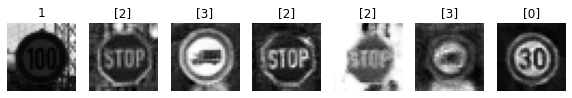

Epoch 90110 g_loss= 1.0909426 d_loss= 1.3355541 real_acc= 0.5 fake_acc= 0.62
Epoch 90120 g_loss= 1.0909902 d_loss= 1.1045712 real_acc= 0.74 fake_acc= 0.66
Epoch 90130 g_loss= 1.306271 d_loss= 1.0644078 real_acc= 0.66 fake_acc= 0.78
Epoch 90140 g_loss= 1.0247952 d_loss= 1.2442375 real_acc= 0.7 fake_acc= 0.62
Epoch 90150 g_loss= 1.0592059 d_loss= 1.0958246 real_acc= 0.76 fake_acc= 0.7
Epoch 90160 g_loss= 1.0975366 d_loss= 1.094425 real_acc= 0.66 fake_acc= 0.68
Epoch 90170 g_loss= 1.164548 d_loss= 1.0237062 real_acc= 0.8 fake_acc= 0.68
Epoch 90180 g_loss= 1.2223758 d_loss= 1.158534 real_acc= 0.66 fake_acc= 0.66
Epoch 90190 g_loss= 0.9412987 d_loss= 1.2773864 real_acc= 0.6 fake_acc= 0.64
Epoch 90200 g_loss= 0.9915583 d_loss= 1.0968682 real_acc= 0.74 fake_acc= 0.6


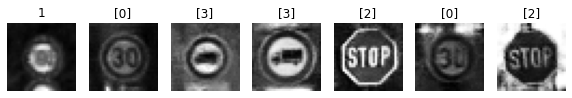

Epoch 90210 g_loss= 1.1853185 d_loss= 0.997095 real_acc= 0.74 fake_acc= 0.84
Epoch 90220 g_loss= 0.8581819 d_loss= 1.1370627 real_acc= 0.86 fake_acc= 0.58
Epoch 90230 g_loss= 1.0509261 d_loss= 1.0825453 real_acc= 0.68 fake_acc= 0.6
Epoch 90240 g_loss= 1.2289099 d_loss= 1.1020122 real_acc= 0.66 fake_acc= 0.7
Epoch 90250 g_loss= 0.91194326 d_loss= 1.0555036 real_acc= 0.9 fake_acc= 0.6
Epoch 90260 g_loss= 1.1861355 d_loss= 1.0653942 real_acc= 0.8 fake_acc= 0.7
Epoch 90270 g_loss= 1.0290799 d_loss= 1.0583957 real_acc= 0.82 fake_acc= 0.68
Epoch 90280 g_loss= 1.2412928 d_loss= 1.1781733 real_acc= 0.56 fake_acc= 0.84
Epoch 90290 g_loss= 1.240701 d_loss= 1.0863144 real_acc= 0.6 fake_acc= 0.84
Epoch 90300 g_loss= 0.945976 d_loss= 1.1411521 real_acc= 0.74 fake_acc= 0.54


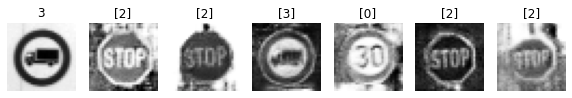

Epoch 90310 g_loss= 1.1609095 d_loss= 0.9979608 real_acc= 0.78 fake_acc= 0.68
Epoch 90320 g_loss= 1.1070701 d_loss= 1.1209319 real_acc= 0.76 fake_acc= 0.68
Epoch 90330 g_loss= 0.9308062 d_loss= 1.2635984 real_acc= 0.66 fake_acc= 0.52
Epoch 90340 g_loss= 1.0033481 d_loss= 1.183536 real_acc= 0.7 fake_acc= 0.68
Epoch 90350 g_loss= 1.2120074 d_loss= 1.0319796 real_acc= 0.7 fake_acc= 0.76
Epoch 90360 g_loss= 0.8986824 d_loss= 1.3320054 real_acc= 0.62 fake_acc= 0.62
Epoch 90370 g_loss= 1.3192313 d_loss= 1.0367873 real_acc= 0.7 fake_acc= 0.72
Epoch 90380 g_loss= 0.9828334 d_loss= 1.1718721 real_acc= 0.76 fake_acc= 0.7
Epoch 90390 g_loss= 0.9312104 d_loss= 1.156197 real_acc= 0.76 fake_acc= 0.6
Epoch 90400 g_loss= 1.1826193 d_loss= 1.1666582 real_acc= 0.66 fake_acc= 0.76


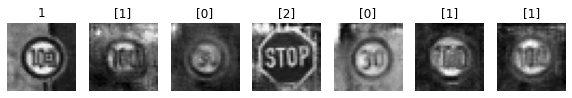

Epoch 90410 g_loss= 1.0550151 d_loss= 1.2421422 real_acc= 0.6 fake_acc= 0.7
Epoch 90420 g_loss= 0.8176698 d_loss= 1.1363263 real_acc= 0.9 fake_acc= 0.42
Epoch 90430 g_loss= 1.4080131 d_loss= 1.0420668 real_acc= 0.66 fake_acc= 0.92
Epoch 90440 g_loss= 1.158288 d_loss= 1.1044027 real_acc= 0.66 fake_acc= 0.78
Epoch 90450 g_loss= 0.9668949 d_loss= 1.278794 real_acc= 0.72 fake_acc= 0.6
Epoch 90460 g_loss= 1.0324669 d_loss= 1.237169 real_acc= 0.56 fake_acc= 0.7
Epoch 90470 g_loss= 1.1921988 d_loss= 1.2075634 real_acc= 0.54 fake_acc= 0.72
Epoch 90480 g_loss= 0.96849006 d_loss= 1.1570694 real_acc= 0.78 fake_acc= 0.58
Epoch 90490 g_loss= 1.1483577 d_loss= 1.0716246 real_acc= 0.64 fake_acc= 0.76
Epoch 90500 g_loss= 1.1567737 d_loss= 1.1071303 real_acc= 0.66 fake_acc= 0.72


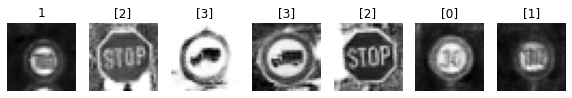

Epoch 90510 g_loss= 1.133295 d_loss= 1.108095 real_acc= 0.62 fake_acc= 0.82
Epoch 90520 g_loss= 1.1990829 d_loss= 1.2156527 real_acc= 0.52 fake_acc= 0.74
Epoch 90530 g_loss= 1.1067075 d_loss= 1.1208928 real_acc= 0.8 fake_acc= 0.72
Epoch 90540 g_loss= 0.7798993 d_loss= 1.3326333 real_acc= 0.72 fake_acc= 0.5
Epoch 90550 g_loss= 0.88019663 d_loss= 1.2958328 real_acc= 0.7 fake_acc= 0.6
Epoch 90560 g_loss= 1.0835748 d_loss= 1.1402595 real_acc= 0.58 fake_acc= 0.76
Epoch 90570 g_loss= 1.0909777 d_loss= 1.092798 real_acc= 0.68 fake_acc= 0.76
Epoch 90580 g_loss= 1.0060651 d_loss= 1.2079804 real_acc= 0.64 fake_acc= 0.64
Epoch 90590 g_loss= 1.178051 d_loss= 1.1539485 real_acc= 0.66 fake_acc= 0.72
Epoch 90600 g_loss= 1.1636347 d_loss= 1.0997539 real_acc= 0.72 fake_acc= 0.64


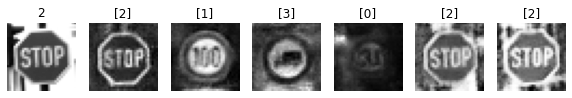

Epoch 90610 g_loss= 1.0197428 d_loss= 1.1326165 real_acc= 0.74 fake_acc= 0.68
Epoch 90620 g_loss= 1.1071188 d_loss= 1.1227734 real_acc= 0.7 fake_acc= 0.64
Epoch 90630 g_loss= 1.047533 d_loss= 1.1219585 real_acc= 0.78 fake_acc= 0.7
Epoch 90640 g_loss= 0.9832561 d_loss= 1.1336699 real_acc= 0.72 fake_acc= 0.66
Epoch 90650 g_loss= 1.0461948 d_loss= 0.9671124 real_acc= 0.86 fake_acc= 0.76
Epoch 90660 g_loss= 0.98171514 d_loss= 1.1371245 real_acc= 0.7 fake_acc= 0.54
Epoch 90670 g_loss= 0.9846996 d_loss= 1.140701 real_acc= 0.72 fake_acc= 0.68
Epoch 90680 g_loss= 1.2644076 d_loss= 1.177043 real_acc= 0.58 fake_acc= 0.8
Epoch 90690 g_loss= 1.2784619 d_loss= 0.97281116 real_acc= 0.76 fake_acc= 0.72
Epoch 90700 g_loss= 1.1662008 d_loss= 1.190133 real_acc= 0.62 fake_acc= 0.68


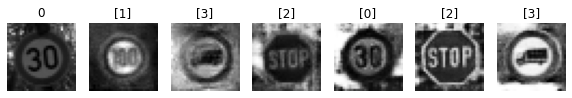

Epoch 90710 g_loss= 0.98548853 d_loss= 1.133539 real_acc= 0.82 fake_acc= 0.6
Epoch 90720 g_loss= 1.2536421 d_loss= 0.9648305 real_acc= 0.72 fake_acc= 0.78
Epoch 90730 g_loss= 1.0025595 d_loss= 1.0732355 real_acc= 0.68 fake_acc= 0.62
Epoch 90740 g_loss= 1.1366093 d_loss= 1.1953831 real_acc= 0.7 fake_acc= 0.72
Epoch 90750 g_loss= 1.1795211 d_loss= 1.0835367 real_acc= 0.64 fake_acc= 0.84
Epoch 90760 g_loss= 1.0337653 d_loss= 1.0596839 real_acc= 0.76 fake_acc= 0.64
Epoch 90770 g_loss= 1.185133 d_loss= 1.214462 real_acc= 0.72 fake_acc= 0.62
Epoch 90780 g_loss= 1.2127516 d_loss= 1.1451339 real_acc= 0.6 fake_acc= 0.78
Epoch 90790 g_loss= 0.9994438 d_loss= 1.1200001 real_acc= 0.72 fake_acc= 0.62
Epoch 90800 g_loss= 0.9942034 d_loss= 1.2394655 real_acc= 0.64 fake_acc= 0.54


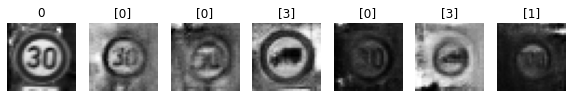

Epoch 90810 g_loss= 1.1834326 d_loss= 1.2242622 real_acc= 0.58 fake_acc= 0.72
Epoch 90820 g_loss= 1.1485068 d_loss= 1.0178977 real_acc= 0.74 fake_acc= 0.7
Epoch 90830 g_loss= 1.0702786 d_loss= 1.1347892 real_acc= 0.8 fake_acc= 0.6
Epoch 90840 g_loss= 1.2738056 d_loss= 0.9719675 real_acc= 0.74 fake_acc= 0.74
Epoch 90850 g_loss= 1.1724015 d_loss= 1.1910673 real_acc= 0.6 fake_acc= 0.66
Epoch 90860 g_loss= 0.9977784 d_loss= 1.1282816 real_acc= 0.76 fake_acc= 0.72
Epoch 90870 g_loss= 1.1754031 d_loss= 1.2170311 real_acc= 0.68 fake_acc= 0.62
Epoch 90880 g_loss= 1.1544633 d_loss= 1.1080215 real_acc= 0.78 fake_acc= 0.66
Epoch 90890 g_loss= 1.0557171 d_loss= 1.1827748 real_acc= 0.8 fake_acc= 0.6
Epoch 90900 g_loss= 1.0443612 d_loss= 1.1248335 real_acc= 0.7 fake_acc= 0.64


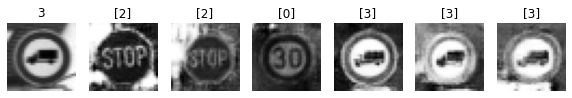

Epoch 90910 g_loss= 1.0393956 d_loss= 1.1218 real_acc= 0.62 fake_acc= 0.68
Epoch 90920 g_loss= 1.1898636 d_loss= 1.164172 real_acc= 0.64 fake_acc= 0.76
Epoch 90930 g_loss= 0.9527901 d_loss= 1.2197948 real_acc= 0.72 fake_acc= 0.54
Epoch 90940 g_loss= 1.1204417 d_loss= 1.0821483 real_acc= 0.72 fake_acc= 0.7
Epoch 90950 g_loss= 0.97681737 d_loss= 1.185534 real_acc= 0.74 fake_acc= 0.6
Epoch 90960 g_loss= 1.1524272 d_loss= 1.2270386 real_acc= 0.54 fake_acc= 0.76
Epoch 90970 g_loss= 1.182619 d_loss= 1.1689695 real_acc= 0.7 fake_acc= 0.76
Epoch 90980 g_loss= 1.1203165 d_loss= 1.1721773 real_acc= 0.66 fake_acc= 0.7
Epoch 90990 g_loss= 1.0949359 d_loss= 0.976587 real_acc= 0.78 fake_acc= 0.74
Epoch 91000 g_loss= 1.1972 d_loss= 1.1255988 real_acc= 0.68 fake_acc= 0.74


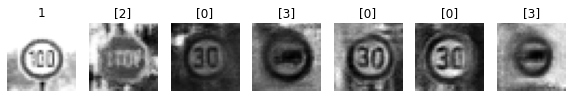

Epoch 91010 g_loss= 0.84927887 d_loss= 1.216806 real_acc= 0.82 fake_acc= 0.56
Epoch 91020 g_loss= 1.1241367 d_loss= 1.0188726 real_acc= 0.8 fake_acc= 0.74
Epoch 91030 g_loss= 1.0090587 d_loss= 1.1467779 real_acc= 0.76 fake_acc= 0.62
Epoch 91040 g_loss= 1.046006 d_loss= 1.080437 real_acc= 0.78 fake_acc= 0.7
Epoch 91050 g_loss= 1.2285424 d_loss= 1.3099067 real_acc= 0.5 fake_acc= 0.68
Epoch 91060 g_loss= 0.9576471 d_loss= 1.2601604 real_acc= 0.7 fake_acc= 0.72
Epoch 91070 g_loss= 1.0817711 d_loss= 1.1760516 real_acc= 0.7 fake_acc= 0.66
Epoch 91080 g_loss= 1.2083925 d_loss= 1.1104434 real_acc= 0.64 fake_acc= 0.76
Epoch 91090 g_loss= 1.2894657 d_loss= 1.0646112 real_acc= 0.64 fake_acc= 0.76
Epoch 91100 g_loss= 1.1441168 d_loss= 1.1058686 real_acc= 0.66 fake_acc= 0.58


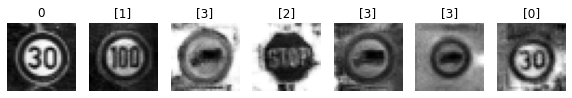

Epoch 91110 g_loss= 1.1385807 d_loss= 1.0556486 real_acc= 0.64 fake_acc= 0.74
Epoch 91120 g_loss= 1.0942806 d_loss= 1.189918 real_acc= 0.74 fake_acc= 0.64
Epoch 91130 g_loss= 1.148138 d_loss= 1.0891275 real_acc= 0.66 fake_acc= 0.76
Epoch 91140 g_loss= 0.97563666 d_loss= 1.2144356 real_acc= 0.7 fake_acc= 0.62
Epoch 91150 g_loss= 0.97897035 d_loss= 1.2926335 real_acc= 0.6 fake_acc= 0.62
Epoch 91160 g_loss= 1.0839629 d_loss= 1.1676714 real_acc= 0.7 fake_acc= 0.72
Epoch 91170 g_loss= 0.973123 d_loss= 1.3017409 real_acc= 0.6 fake_acc= 0.54
Epoch 91180 g_loss= 1.0060695 d_loss= 1.1179769 real_acc= 0.76 fake_acc= 0.7
Epoch 91190 g_loss= 1.1316603 d_loss= 1.1208711 real_acc= 0.7 fake_acc= 0.72
Epoch 91200 g_loss= 1.4568205 d_loss= 1.130605 real_acc= 0.56 fake_acc= 0.84


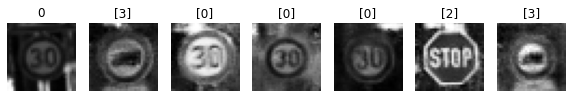

Epoch 91210 g_loss= 0.85253304 d_loss= 1.2152327 real_acc= 0.86 fake_acc= 0.46
Epoch 91220 g_loss= 1.0252712 d_loss= 1.0941806 real_acc= 0.72 fake_acc= 0.66
Epoch 91230 g_loss= 1.1871396 d_loss= 1.1413286 real_acc= 0.46 fake_acc= 0.92
Epoch 91240 g_loss= 1.0204747 d_loss= 1.116652 real_acc= 0.82 fake_acc= 0.7
Epoch 91250 g_loss= 1.0071204 d_loss= 1.1958699 real_acc= 0.76 fake_acc= 0.52
Epoch 91260 g_loss= 1.0103016 d_loss= 1.0985742 real_acc= 0.72 fake_acc= 0.62
Epoch 91270 g_loss= 0.93400085 d_loss= 1.2126918 real_acc= 0.7 fake_acc= 0.64
Epoch 91280 g_loss= 1.1970121 d_loss= 0.9607649 real_acc= 0.68 fake_acc= 0.78
Epoch 91290 g_loss= 1.1186976 d_loss= 1.0392281 real_acc= 0.72 fake_acc= 0.74
Epoch 91300 g_loss= 1.0718664 d_loss= 1.1220286 real_acc= 0.68 fake_acc= 0.72


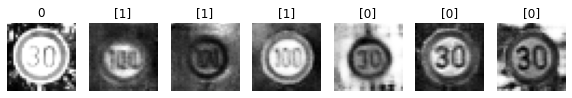

Epoch 91310 g_loss= 0.9243847 d_loss= 1.2283888 real_acc= 0.68 fake_acc= 0.6
Epoch 91320 g_loss= 0.95640755 d_loss= 1.2546461 real_acc= 0.7 fake_acc= 0.54
Epoch 91330 g_loss= 1.0204241 d_loss= 1.1350157 real_acc= 0.62 fake_acc= 0.64
Epoch 91340 g_loss= 1.0965799 d_loss= 1.1311393 real_acc= 0.6 fake_acc= 0.8
Epoch 91350 g_loss= 1.0763298 d_loss= 1.0850374 real_acc= 0.74 fake_acc= 0.68
Epoch 91360 g_loss= 0.9267939 d_loss= 1.121595 real_acc= 0.82 fake_acc= 0.6
Epoch 91370 g_loss= 1.2610949 d_loss= 1.0678087 real_acc= 0.62 fake_acc= 0.76
Epoch 91380 g_loss= 1.0012021 d_loss= 1.1087286 real_acc= 0.78 fake_acc= 0.64
Epoch 91390 g_loss= 1.3068601 d_loss= 1.0813814 real_acc= 0.62 fake_acc= 0.84
Epoch 91400 g_loss= 1.0418259 d_loss= 1.3176656 real_acc= 0.54 fake_acc= 0.72


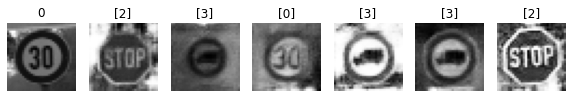

Epoch 91410 g_loss= 1.0168625 d_loss= 1.2365795 real_acc= 0.52 fake_acc= 0.64
Epoch 91420 g_loss= 1.0892771 d_loss= 1.0883036 real_acc= 0.8 fake_acc= 0.7
Epoch 91430 g_loss= 1.111658 d_loss= 0.9796895 real_acc= 0.76 fake_acc= 0.82
Epoch 91440 g_loss= 1.1367191 d_loss= 1.230921 real_acc= 0.52 fake_acc= 0.7
Epoch 91450 g_loss= 1.0343156 d_loss= 1.1051816 real_acc= 0.78 fake_acc= 0.66
Epoch 91460 g_loss= 1.0835917 d_loss= 1.1123953 real_acc= 0.74 fake_acc= 0.62
Epoch 91470 g_loss= 1.1006768 d_loss= 1.0433766 real_acc= 0.74 fake_acc= 0.76
Epoch 91480 g_loss= 1.0207624 d_loss= 1.2219739 real_acc= 0.58 fake_acc= 0.76
Epoch 91490 g_loss= 0.98333246 d_loss= 1.0675212 real_acc= 0.76 fake_acc= 0.7
Epoch 91500 g_loss= 0.85096085 d_loss= 1.1587911 real_acc= 0.8 fake_acc= 0.64


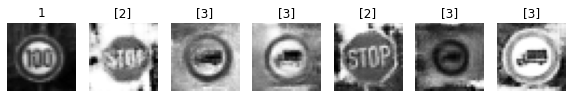

Epoch 91510 g_loss= 1.0468041 d_loss= 1.2066336 real_acc= 0.56 fake_acc= 0.8
Epoch 91520 g_loss= 1.0449228 d_loss= 0.9762124 real_acc= 0.78 fake_acc= 0.78
Epoch 91530 g_loss= 1.097906 d_loss= 1.1286564 real_acc= 0.64 fake_acc= 0.8
Epoch 91540 g_loss= 1.1236024 d_loss= 1.0358037 real_acc= 0.8 fake_acc= 0.74
Epoch 91550 g_loss= 1.1465979 d_loss= 1.1409525 real_acc= 0.76 fake_acc= 0.66
Epoch 91560 g_loss= 1.0257745 d_loss= 1.1120138 real_acc= 0.72 fake_acc= 0.7
Epoch 91570 g_loss= 1.0610015 d_loss= 1.1142478 real_acc= 0.7 fake_acc= 0.68
Epoch 91580 g_loss= 1.0894235 d_loss= 1.1381528 real_acc= 0.78 fake_acc= 0.64
Epoch 91590 g_loss= 1.2125211 d_loss= 1.239234 real_acc= 0.58 fake_acc= 0.74
Epoch 91600 g_loss= 1.041002 d_loss= 1.0353675 real_acc= 0.82 fake_acc= 0.7


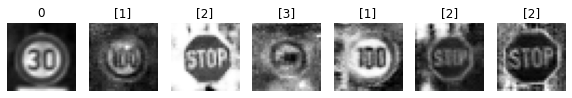

Epoch 91610 g_loss= 1.1642284 d_loss= 1.0790069 real_acc= 0.72 fake_acc= 0.78
Epoch 91620 g_loss= 0.87030864 d_loss= 1.1396606 real_acc= 0.72 fake_acc= 0.56
Epoch 91630 g_loss= 1.0278138 d_loss= 1.1406354 real_acc= 0.74 fake_acc= 0.58
Epoch 91640 g_loss= 1.0596039 d_loss= 1.0881069 real_acc= 0.76 fake_acc= 0.76
Epoch 91650 g_loss= 1.2206192 d_loss= 1.0242268 real_acc= 0.66 fake_acc= 0.82
Epoch 91660 g_loss= 1.1765687 d_loss= 1.029867 real_acc= 0.78 fake_acc= 0.7
Epoch 91670 g_loss= 1.2659599 d_loss= 1.0514559 real_acc= 0.74 fake_acc= 0.72
Epoch 91680 g_loss= 1.0075761 d_loss= 1.2015924 real_acc= 0.68 fake_acc= 0.66
Epoch 91690 g_loss= 0.98717535 d_loss= 1.0945754 real_acc= 0.78 fake_acc= 0.64
Epoch 91700 g_loss= 1.0720496 d_loss= 1.1836885 real_acc= 0.68 fake_acc= 0.66


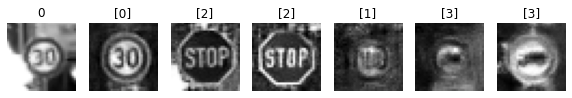

Epoch 91710 g_loss= 1.0035009 d_loss= 1.2239652 real_acc= 0.68 fake_acc= 0.72
Epoch 91720 g_loss= 1.1111273 d_loss= 1.0726205 real_acc= 0.76 fake_acc= 0.7
Epoch 91730 g_loss= 1.0203773 d_loss= 1.0765653 real_acc= 0.74 fake_acc= 0.64
Epoch 91740 g_loss= 1.2301612 d_loss= 1.1867374 real_acc= 0.64 fake_acc= 0.76
Epoch 91750 g_loss= 1.005568 d_loss= 1.17535 real_acc= 0.72 fake_acc= 0.56
Epoch 91760 g_loss= 1.0162182 d_loss= 1.1600931 real_acc= 0.74 fake_acc= 0.52
Epoch 91770 g_loss= 1.0594459 d_loss= 1.1609408 real_acc= 0.68 fake_acc= 0.64
Epoch 91780 g_loss= 1.3983976 d_loss= 1.0636137 real_acc= 0.64 fake_acc= 0.86
Epoch 91790 g_loss= 1.1073142 d_loss= 1.0965972 real_acc= 0.76 fake_acc= 0.62
Epoch 91800 g_loss= 1.0132561 d_loss= 1.1539522 real_acc= 0.72 fake_acc= 0.58


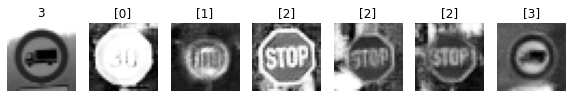

Epoch 91810 g_loss= 1.3487353 d_loss= 1.1319069 real_acc= 0.56 fake_acc= 0.86
Epoch 91820 g_loss= 1.210918 d_loss= 1.0816907 real_acc= 0.72 fake_acc= 0.78
Epoch 91830 g_loss= 0.8963696 d_loss= 1.1576653 real_acc= 0.76 fake_acc= 0.54
Epoch 91840 g_loss= 1.1167527 d_loss= 1.1753829 real_acc= 0.6 fake_acc= 0.66
Epoch 91850 g_loss= 1.0075941 d_loss= 1.2030122 real_acc= 0.76 fake_acc= 0.64
Epoch 91860 g_loss= 1.1144092 d_loss= 1.1128907 real_acc= 0.66 fake_acc= 0.68
Epoch 91870 g_loss= 1.2418233 d_loss= 0.95954055 real_acc= 0.84 fake_acc= 0.78
Epoch 91880 g_loss= 1.1375309 d_loss= 1.2467268 real_acc= 0.58 fake_acc= 0.78
Epoch 91890 g_loss= 1.1979818 d_loss= 1.1370885 real_acc= 0.6 fake_acc= 0.78
Epoch 91900 g_loss= 1.0111431 d_loss= 1.0283852 real_acc= 0.82 fake_acc= 0.64


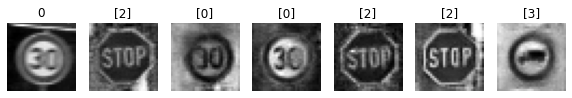

Epoch 91910 g_loss= 1.2049445 d_loss= 1.0699447 real_acc= 0.82 fake_acc= 0.68
Epoch 91920 g_loss= 1.2083933 d_loss= 1.0851829 real_acc= 0.74 fake_acc= 0.74
Epoch 91930 g_loss= 0.95012903 d_loss= 1.2159117 real_acc= 0.72 fake_acc= 0.72
Epoch 91940 g_loss= 1.2124431 d_loss= 1.0090611 real_acc= 0.66 fake_acc= 0.86
Epoch 91950 g_loss= 0.88386285 d_loss= 1.3912098 real_acc= 0.66 fake_acc= 0.52
Epoch 91960 g_loss= 1.0720112 d_loss= 1.0773087 real_acc= 0.76 fake_acc= 0.76
Epoch 91970 g_loss= 0.90302294 d_loss= 1.2118657 real_acc= 0.8 fake_acc= 0.6
Epoch 91980 g_loss= 1.1332035 d_loss= 1.195498 real_acc= 0.68 fake_acc= 0.72
Epoch 91990 g_loss= 1.0169587 d_loss= 1.1834577 real_acc= 0.74 fake_acc= 0.68
Epoch 92000 g_loss= 0.94710815 d_loss= 1.202311 real_acc= 0.68 fake_acc= 0.76


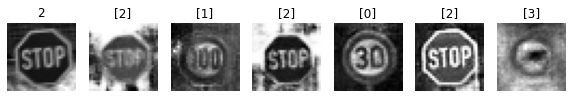

Epoch 92010 g_loss= 1.2136962 d_loss= 1.086587 real_acc= 0.74 fake_acc= 0.78
Epoch 92020 g_loss= 0.88259405 d_loss= 1.218107 real_acc= 0.76 fake_acc= 0.5
Epoch 92030 g_loss= 1.0260262 d_loss= 1.0807981 real_acc= 0.72 fake_acc= 0.74
Epoch 92040 g_loss= 0.998064 d_loss= 1.1820583 real_acc= 0.72 fake_acc= 0.68
Epoch 92050 g_loss= 0.93481195 d_loss= 1.2846143 real_acc= 0.64 fake_acc= 0.6
Epoch 92060 g_loss= 1.1574284 d_loss= 1.0342371 real_acc= 0.7 fake_acc= 0.8
Epoch 92070 g_loss= 1.1349053 d_loss= 1.1293633 real_acc= 0.64 fake_acc= 0.78
Epoch 92080 g_loss= 1.2222915 d_loss= 0.9825256 real_acc= 0.76 fake_acc= 0.78
Epoch 92090 g_loss= 0.9788927 d_loss= 1.1055274 real_acc= 0.76 fake_acc= 0.6
Epoch 92100 g_loss= 1.1984632 d_loss= 1.1151743 real_acc= 0.68 fake_acc= 0.72


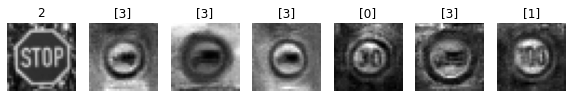

Epoch 92110 g_loss= 1.0804703 d_loss= 1.2886357 real_acc= 0.54 fake_acc= 0.72
Epoch 92120 g_loss= 1.2783093 d_loss= 0.9943031 real_acc= 0.68 fake_acc= 0.86
Epoch 92130 g_loss= 1.1385932 d_loss= 1.0637703 real_acc= 0.78 fake_acc= 0.62
Epoch 92140 g_loss= 1.0075142 d_loss= 1.2298319 real_acc= 0.76 fake_acc= 0.56
Epoch 92150 g_loss= 1.0038072 d_loss= 1.1257472 real_acc= 0.62 fake_acc= 0.72
Epoch 92160 g_loss= 1.1428376 d_loss= 1.2136607 real_acc= 0.64 fake_acc= 0.62
Epoch 92170 g_loss= 0.89987826 d_loss= 1.2725329 real_acc= 0.72 fake_acc= 0.5
Epoch 92180 g_loss= 1.2392296 d_loss= 1.1356673 real_acc= 0.58 fake_acc= 0.86
Epoch 92190 g_loss= 1.1485 d_loss= 1.0938559 real_acc= 0.68 fake_acc= 0.72
Epoch 92200 g_loss= 1.0275768 d_loss= 1.1231167 real_acc= 0.74 fake_acc= 0.68


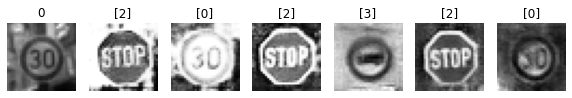

Epoch 92210 g_loss= 1.0706841 d_loss= 1.1317093 real_acc= 0.64 fake_acc= 0.68
Epoch 92220 g_loss= 1.1700926 d_loss= 1.1060284 real_acc= 0.66 fake_acc= 0.82
Epoch 92230 g_loss= 1.0528777 d_loss= 1.1436462 real_acc= 0.72 fake_acc= 0.64
Epoch 92240 g_loss= 1.1349753 d_loss= 1.0783356 real_acc= 0.8 fake_acc= 0.66
Epoch 92250 g_loss= 1.3374046 d_loss= 0.9510555 real_acc= 0.7 fake_acc= 0.84
Epoch 92260 g_loss= 1.0585959 d_loss= 1.1572721 real_acc= 0.68 fake_acc= 0.58
Epoch 92270 g_loss= 0.9430833 d_loss= 1.2549803 real_acc= 0.72 fake_acc= 0.62
Epoch 92280 g_loss= 1.0597881 d_loss= 1.2554381 real_acc= 0.66 fake_acc= 0.7
Epoch 92290 g_loss= 1.1634461 d_loss= 1.1047459 real_acc= 0.62 fake_acc= 0.72
Epoch 92300 g_loss= 1.1923279 d_loss= 1.0721304 real_acc= 0.78 fake_acc= 0.76


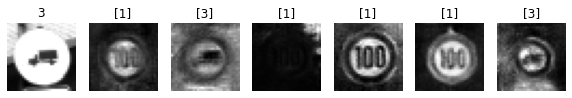

Epoch 92310 g_loss= 1.1821922 d_loss= 1.0372612 real_acc= 0.7 fake_acc= 0.78
Epoch 92320 g_loss= 1.1670388 d_loss= 1.0491822 real_acc= 0.74 fake_acc= 0.76
Epoch 92330 g_loss= 1.196012 d_loss= 0.97490644 real_acc= 0.74 fake_acc= 0.86
Epoch 92340 g_loss= 1.1709778 d_loss= 1.0895109 real_acc= 0.72 fake_acc= 0.62
Epoch 92350 g_loss= 1.0381455 d_loss= 1.1185367 real_acc= 0.76 fake_acc= 0.58
Epoch 92360 g_loss= 1.1116772 d_loss= 1.0944929 real_acc= 0.78 fake_acc= 0.64
Epoch 92370 g_loss= 1.2680534 d_loss= 1.1669141 real_acc= 0.64 fake_acc= 0.7
Epoch 92380 g_loss= 1.0329044 d_loss= 1.1125761 real_acc= 0.76 fake_acc= 0.72
Epoch 92390 g_loss= 1.078709 d_loss= 1.0438356 real_acc= 0.66 fake_acc= 0.8
Epoch 92400 g_loss= 0.9981282 d_loss= 1.2147273 real_acc= 0.72 fake_acc= 0.64


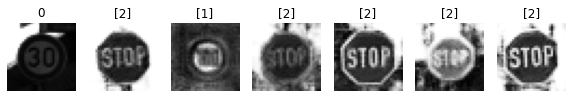

Epoch 92410 g_loss= 1.1841167 d_loss= 1.192493 real_acc= 0.64 fake_acc= 0.7
Epoch 92420 g_loss= 1.0155374 d_loss= 1.2380195 real_acc= 0.74 fake_acc= 0.68
Epoch 92430 g_loss= 1.1765225 d_loss= 1.159217 real_acc= 0.62 fake_acc= 0.82
Epoch 92440 g_loss= 0.8519966 d_loss= 1.188131 real_acc= 0.78 fake_acc= 0.48
Epoch 92450 g_loss= 1.0957131 d_loss= 1.0810163 real_acc= 0.7 fake_acc= 0.7
Epoch 92460 g_loss= 1.262258 d_loss= 1.1665967 real_acc= 0.66 fake_acc= 0.76
Epoch 92470 g_loss= 1.122904 d_loss= 1.1389488 real_acc= 0.7 fake_acc= 0.76
Epoch 92480 g_loss= 0.94779336 d_loss= 1.1799234 real_acc= 0.68 fake_acc= 0.56
Epoch 92490 g_loss= 1.0642481 d_loss= 1.0808724 real_acc= 0.76 fake_acc= 0.74
Epoch 92500 g_loss= 1.1827089 d_loss= 1.285986 real_acc= 0.52 fake_acc= 0.7


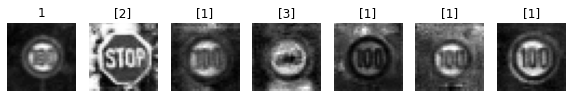

Epoch 92510 g_loss= 1.2475729 d_loss= 0.9889163 real_acc= 0.7 fake_acc= 0.78
Epoch 92520 g_loss= 0.96616876 d_loss= 1.0954666 real_acc= 0.76 fake_acc= 0.68
Epoch 92530 g_loss= 1.1640576 d_loss= 1.1233691 real_acc= 0.66 fake_acc= 0.68
Epoch 92540 g_loss= 0.9681938 d_loss= 1.1857952 real_acc= 0.8 fake_acc= 0.56
Epoch 92550 g_loss= 0.90495926 d_loss= 1.3365242 real_acc= 0.62 fake_acc= 0.52
Epoch 92560 g_loss= 1.0238988 d_loss= 1.1822236 real_acc= 0.68 fake_acc= 0.56
Epoch 92570 g_loss= 1.141186 d_loss= 1.0597684 real_acc= 0.72 fake_acc= 0.7
Epoch 92580 g_loss= 1.0677149 d_loss= 1.2663999 real_acc= 0.7 fake_acc= 0.58
Epoch 92590 g_loss= 0.9431346 d_loss= 1.1818209 real_acc= 0.68 fake_acc= 0.62
Epoch 92600 g_loss= 1.1115037 d_loss= 1.0886402 real_acc= 0.64 fake_acc= 0.84


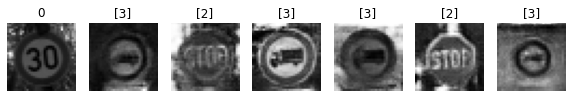

Epoch 92610 g_loss= 1.1743797 d_loss= 1.1307201 real_acc= 0.58 fake_acc= 0.68
Epoch 92620 g_loss= 1.1812695 d_loss= 1.0775633 real_acc= 0.68 fake_acc= 0.7
Epoch 92630 g_loss= 1.1129696 d_loss= 1.2348852 real_acc= 0.66 fake_acc= 0.66
Epoch 92640 g_loss= 1.0161992 d_loss= 1.0310045 real_acc= 0.82 fake_acc= 0.68
Epoch 92650 g_loss= 1.0718116 d_loss= 1.2020438 real_acc= 0.64 fake_acc= 0.6
Epoch 92660 g_loss= 1.142255 d_loss= 1.1220186 real_acc= 0.7 fake_acc= 0.78
Epoch 92670 g_loss= 0.9649519 d_loss= 1.2972709 real_acc= 0.68 fake_acc= 0.62
Epoch 92680 g_loss= 1.0335411 d_loss= 1.164269 real_acc= 0.76 fake_acc= 0.56
Epoch 92690 g_loss= 1.1212807 d_loss= 1.1611204 real_acc= 0.7 fake_acc= 0.6
Epoch 92700 g_loss= 1.1670735 d_loss= 1.1383809 real_acc= 0.66 fake_acc= 0.76


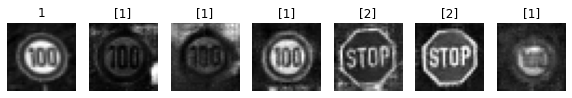

Epoch 92710 g_loss= 1.1277827 d_loss= 1.0586205 real_acc= 0.72 fake_acc= 0.62
Epoch 92720 g_loss= 0.96184623 d_loss= 1.2378342 real_acc= 0.66 fake_acc= 0.64
Epoch 92730 g_loss= 1.0405118 d_loss= 1.250512 real_acc= 0.66 fake_acc= 0.64
Epoch 92740 g_loss= 1.125777 d_loss= 1.0422573 real_acc= 0.78 fake_acc= 0.68
Epoch 92750 g_loss= 1.393654 d_loss= 0.98952574 real_acc= 0.74 fake_acc= 0.88
Epoch 92760 g_loss= 1.2521824 d_loss= 1.1236794 real_acc= 0.58 fake_acc= 0.82
Epoch 92770 g_loss= 0.9568918 d_loss= 1.2517257 real_acc= 0.56 fake_acc= 0.72
Epoch 92780 g_loss= 1.0979942 d_loss= 1.1285497 real_acc= 0.64 fake_acc= 0.64
Epoch 92790 g_loss= 1.3110775 d_loss= 1.0256196 real_acc= 0.72 fake_acc= 0.88
Epoch 92800 g_loss= 1.1761999 d_loss= 1.0850834 real_acc= 0.64 fake_acc= 0.76


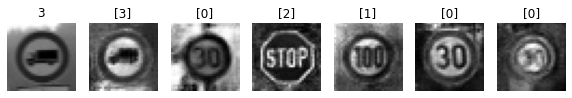

Epoch 92810 g_loss= 1.2021407 d_loss= 1.1487999 real_acc= 0.7 fake_acc= 0.7
Epoch 92820 g_loss= 1.1461084 d_loss= 1.1242694 real_acc= 0.72 fake_acc= 0.7
Epoch 92830 g_loss= 1.2636193 d_loss= 0.9471191 real_acc= 0.76 fake_acc= 0.84
Epoch 92840 g_loss= 1.1429783 d_loss= 1.2569752 real_acc= 0.6 fake_acc= 0.68
Epoch 92850 g_loss= 1.028748 d_loss= 1.1229978 real_acc= 0.68 fake_acc= 0.76
Epoch 92860 g_loss= 1.1659173 d_loss= 1.058034 real_acc= 0.72 fake_acc= 0.78
Epoch 92870 g_loss= 1.2056265 d_loss= 1.0297409 real_acc= 0.72 fake_acc= 0.72
Epoch 92880 g_loss= 1.0791352 d_loss= 1.1781764 real_acc= 0.68 fake_acc= 0.68
Epoch 92890 g_loss= 1.12713 d_loss= 1.074834 real_acc= 0.76 fake_acc= 0.72
Epoch 92900 g_loss= 1.1331458 d_loss= 1.153443 real_acc= 0.66 fake_acc= 0.72


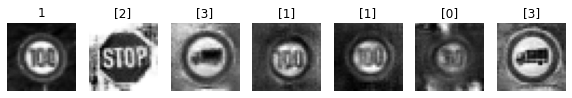

Epoch 92910 g_loss= 1.2147046 d_loss= 1.1540844 real_acc= 0.72 fake_acc= 0.66
Epoch 92920 g_loss= 1.0890348 d_loss= 1.025761 real_acc= 0.8 fake_acc= 0.72
Epoch 92930 g_loss= 1.251906 d_loss= 1.3411283 real_acc= 0.48 fake_acc= 0.78
Epoch 92940 g_loss= 1.1753759 d_loss= 1.2574714 real_acc= 0.58 fake_acc= 0.76
Epoch 92950 g_loss= 1.106609 d_loss= 1.1059427 real_acc= 0.66 fake_acc= 0.8
Epoch 92960 g_loss= 1.0111606 d_loss= 1.0277351 real_acc= 0.82 fake_acc= 0.62
Epoch 92970 g_loss= 1.0369755 d_loss= 1.1939571 real_acc= 0.7 fake_acc= 0.62
Epoch 92980 g_loss= 1.0523309 d_loss= 1.176883 real_acc= 0.62 fake_acc= 0.6
Epoch 92990 g_loss= 0.9741983 d_loss= 1.1135316 real_acc= 0.72 fake_acc= 0.74
Epoch 93000 g_loss= 1.064377 d_loss= 1.0402849 real_acc= 0.72 fake_acc= 0.74


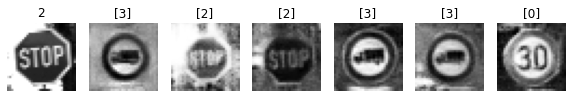

Epoch 93010 g_loss= 1.2302614 d_loss= 1.0265524 real_acc= 0.72 fake_acc= 0.76
Epoch 93020 g_loss= 1.1503147 d_loss= 0.9820771 real_acc= 0.82 fake_acc= 0.68
Epoch 93030 g_loss= 1.2970657 d_loss= 1.057229 real_acc= 0.62 fake_acc= 0.82
Epoch 93040 g_loss= 1.025559 d_loss= 1.0638926 real_acc= 0.8 fake_acc= 0.72
Epoch 93050 g_loss= 1.0214033 d_loss= 1.1675192 real_acc= 0.64 fake_acc= 0.66
Epoch 93060 g_loss= 1.1556785 d_loss= 1.1645153 real_acc= 0.76 fake_acc= 0.64
Epoch 93070 g_loss= 1.074652 d_loss= 1.1488166 real_acc= 0.72 fake_acc= 0.72
Epoch 93080 g_loss= 1.2702271 d_loss= 1.0709887 real_acc= 0.68 fake_acc= 0.84
Epoch 93090 g_loss= 1.1445602 d_loss= 1.1243832 real_acc= 0.7 fake_acc= 0.7
Epoch 93100 g_loss= 1.0729916 d_loss= 1.0759426 real_acc= 0.84 fake_acc= 0.64


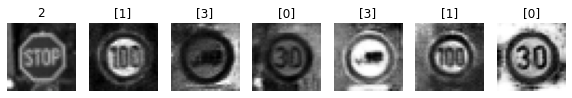

Epoch 93110 g_loss= 0.96514124 d_loss= 1.2748036 real_acc= 0.6 fake_acc= 0.62
Epoch 93120 g_loss= 1.1002223 d_loss= 1.127658 real_acc= 0.66 fake_acc= 0.84
Epoch 93130 g_loss= 1.0363363 d_loss= 1.1381882 real_acc= 0.74 fake_acc= 0.66
Epoch 93140 g_loss= 1.0779744 d_loss= 1.1596737 real_acc= 0.64 fake_acc= 0.68
Epoch 93150 g_loss= 1.1175338 d_loss= 1.1758034 real_acc= 0.64 fake_acc= 0.76
Epoch 93160 g_loss= 1.0584656 d_loss= 1.0852923 real_acc= 0.68 fake_acc= 0.78
Epoch 93170 g_loss= 1.1032217 d_loss= 1.1550424 real_acc= 0.72 fake_acc= 0.7
Epoch 93180 g_loss= 1.1074779 d_loss= 1.161647 real_acc= 0.66 fake_acc= 0.64
Epoch 93190 g_loss= 1.1500974 d_loss= 1.0567518 real_acc= 0.68 fake_acc= 0.68
Epoch 93200 g_loss= 0.91924447 d_loss= 1.3872645 real_acc= 0.52 fake_acc= 0.5


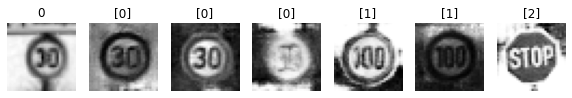

Epoch 93210 g_loss= 1.1301764 d_loss= 1.102396 real_acc= 0.6 fake_acc= 0.84
Epoch 93220 g_loss= 1.0958072 d_loss= 1.1265894 real_acc= 0.74 fake_acc= 0.7
Epoch 93230 g_loss= 1.0106868 d_loss= 1.0787343 real_acc= 0.72 fake_acc= 0.7
Epoch 93240 g_loss= 1.2626452 d_loss= 1.0081525 real_acc= 0.74 fake_acc= 0.84
Epoch 93250 g_loss= 1.1891342 d_loss= 1.1885314 real_acc= 0.44 fake_acc= 0.76
Epoch 93260 g_loss= 1.0335698 d_loss= 1.1885045 real_acc= 0.64 fake_acc= 0.72
Epoch 93270 g_loss= 0.8734961 d_loss= 1.227874 real_acc= 0.7 fake_acc= 0.6
Epoch 93280 g_loss= 0.9003354 d_loss= 1.2203772 real_acc= 0.76 fake_acc= 0.5
Epoch 93290 g_loss= 1.0525092 d_loss= 1.2780306 real_acc= 0.64 fake_acc= 0.64
Epoch 93300 g_loss= 1.0438358 d_loss= 1.2510334 real_acc= 0.64 fake_acc= 0.58


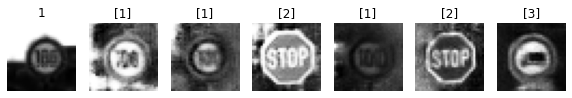

Epoch 93310 g_loss= 1.1920218 d_loss= 1.1027616 real_acc= 0.62 fake_acc= 0.82
Epoch 93320 g_loss= 1.1619608 d_loss= 1.2784271 real_acc= 0.58 fake_acc= 0.68
Epoch 93330 g_loss= 1.1250995 d_loss= 1.0590091 real_acc= 0.74 fake_acc= 0.76
Epoch 93340 g_loss= 1.1548692 d_loss= 1.1336508 real_acc= 0.64 fake_acc= 0.7
Epoch 93350 g_loss= 1.2886517 d_loss= 1.0569638 real_acc= 0.72 fake_acc= 0.82
Epoch 93360 g_loss= 1.1702911 d_loss= 1.1171216 real_acc= 0.62 fake_acc= 0.7
Epoch 93370 g_loss= 1.0251575 d_loss= 1.1520245 real_acc= 0.64 fake_acc= 0.74
Epoch 93380 g_loss= 1.1407703 d_loss= 1.1689593 real_acc= 0.68 fake_acc= 0.8
Epoch 93390 g_loss= 1.0887026 d_loss= 1.1407986 real_acc= 0.72 fake_acc= 0.64
Epoch 93400 g_loss= 0.8544594 d_loss= 1.1607494 real_acc= 0.84 fake_acc= 0.48


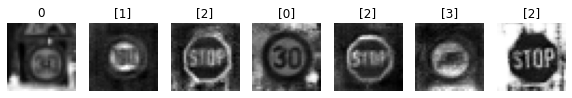

Epoch 93410 g_loss= 1.0710546 d_loss= 1.2203759 real_acc= 0.6 fake_acc= 0.78
Epoch 93420 g_loss= 1.0383506 d_loss= 1.2870941 real_acc= 0.6 fake_acc= 0.78
Epoch 93430 g_loss= 0.9674247 d_loss= 1.1539931 real_acc= 0.72 fake_acc= 0.66
Epoch 93440 g_loss= 1.0074666 d_loss= 1.151441 real_acc= 0.72 fake_acc= 0.64
Epoch 93450 g_loss= 1.0594639 d_loss= 1.1222309 real_acc= 0.82 fake_acc= 0.58
Epoch 93460 g_loss= 0.91007924 d_loss= 1.1495726 real_acc= 0.76 fake_acc= 0.58
Epoch 93470 g_loss= 0.96631134 d_loss= 1.2306286 real_acc= 0.64 fake_acc= 0.66
Epoch 93480 g_loss= 1.0676646 d_loss= 1.0929929 real_acc= 0.82 fake_acc= 0.7
Epoch 93490 g_loss= 0.80949205 d_loss= 1.2429525 real_acc= 0.82 fake_acc= 0.5
Epoch 93500 g_loss= 0.9041197 d_loss= 1.1892414 real_acc= 0.72 fake_acc= 0.62


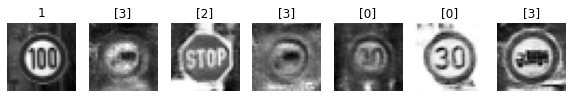

Epoch 93510 g_loss= 1.232846 d_loss= 1.0882454 real_acc= 0.74 fake_acc= 0.8
Epoch 93520 g_loss= 1.0170774 d_loss= 1.1295637 real_acc= 0.76 fake_acc= 0.62
Epoch 93530 g_loss= 1.2179662 d_loss= 1.1159415 real_acc= 0.56 fake_acc= 0.8
Epoch 93540 g_loss= 1.0963883 d_loss= 1.1560678 real_acc= 0.58 fake_acc= 0.7
Epoch 93550 g_loss= 1.0268836 d_loss= 1.0702734 real_acc= 0.78 fake_acc= 0.7
Epoch 93560 g_loss= 1.081902 d_loss= 1.0029117 real_acc= 0.82 fake_acc= 0.78
Epoch 93570 g_loss= 1.0648144 d_loss= 1.1329713 real_acc= 0.72 fake_acc= 0.68
Epoch 93580 g_loss= 1.1517327 d_loss= 1.2266376 real_acc= 0.5 fake_acc= 0.78
Epoch 93590 g_loss= 0.9529056 d_loss= 1.1883143 real_acc= 0.74 fake_acc= 0.6
Epoch 93600 g_loss= 0.9585822 d_loss= 1.1667993 real_acc= 0.8 fake_acc= 0.6


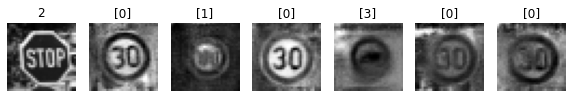

Epoch 93610 g_loss= 1.2797973 d_loss= 1.1461213 real_acc= 0.58 fake_acc= 0.74
Epoch 93620 g_loss= 1.0453155 d_loss= 1.0969234 real_acc= 0.7 fake_acc= 0.66
Epoch 93630 g_loss= 1.1651921 d_loss= 1.1228149 real_acc= 0.8 fake_acc= 0.74
Epoch 93640 g_loss= 1.1649495 d_loss= 1.1118839 real_acc= 0.76 fake_acc= 0.78
Epoch 93650 g_loss= 1.2139899 d_loss= 1.1443573 real_acc= 0.58 fake_acc= 0.74
Epoch 93660 g_loss= 0.97840416 d_loss= 1.2427483 real_acc= 0.7 fake_acc= 0.7
Epoch 93670 g_loss= 1.0190026 d_loss= 1.1227545 real_acc= 0.76 fake_acc= 0.68
Epoch 93680 g_loss= 1.0816969 d_loss= 1.2715092 real_acc= 0.56 fake_acc= 0.76
Epoch 93690 g_loss= 1.274191 d_loss= 1.0349733 real_acc= 0.7 fake_acc= 0.7
Epoch 93700 g_loss= 1.2955168 d_loss= 0.9229605 real_acc= 0.78 fake_acc= 0.84


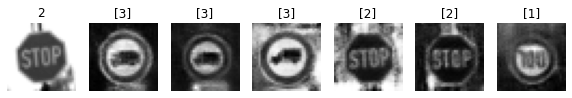

Epoch 93710 g_loss= 0.9177257 d_loss= 1.2205384 real_acc= 0.82 fake_acc= 0.58
Epoch 93720 g_loss= 1.127573 d_loss= 1.1140571 real_acc= 0.6 fake_acc= 0.72
Epoch 93730 g_loss= 0.9637382 d_loss= 1.2314639 real_acc= 0.72 fake_acc= 0.62
Epoch 93740 g_loss= 1.0276799 d_loss= 1.1848874 real_acc= 0.7 fake_acc= 0.68
Epoch 93750 g_loss= 1.28544 d_loss= 1.119498 real_acc= 0.66 fake_acc= 0.72
Epoch 93760 g_loss= 1.1905779 d_loss= 0.9969642 real_acc= 0.76 fake_acc= 0.8
Epoch 93770 g_loss= 1.149376 d_loss= 1.0584383 real_acc= 0.72 fake_acc= 0.64
Epoch 93780 g_loss= 1.0653611 d_loss= 1.2268655 real_acc= 0.56 fake_acc= 0.64
Epoch 93790 g_loss= 0.9789311 d_loss= 0.9867909 real_acc= 0.86 fake_acc= 0.66
Epoch 93800 g_loss= 1.257754 d_loss= 1.196091 real_acc= 0.62 fake_acc= 0.68


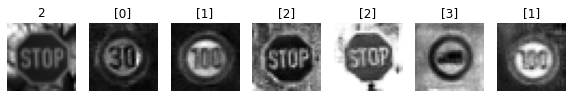

Epoch 93810 g_loss= 1.0096102 d_loss= 1.2206451 real_acc= 0.68 fake_acc= 0.68
Epoch 93820 g_loss= 1.1199212 d_loss= 1.2348692 real_acc= 0.56 fake_acc= 0.66
Epoch 93830 g_loss= 1.0882417 d_loss= 1.1677004 real_acc= 0.66 fake_acc= 0.74
Epoch 93840 g_loss= 1.0796489 d_loss= 1.1240468 real_acc= 0.68 fake_acc= 0.7
Epoch 93850 g_loss= 1.1560527 d_loss= 1.078722 real_acc= 0.72 fake_acc= 0.7
Epoch 93860 g_loss= 1.2607886 d_loss= 1.00768 real_acc= 0.66 fake_acc= 0.84
Epoch 93870 g_loss= 0.94965816 d_loss= 1.1073408 real_acc= 0.74 fake_acc= 0.68
Epoch 93880 g_loss= 1.0569615 d_loss= 1.1883256 real_acc= 0.7 fake_acc= 0.64
Epoch 93890 g_loss= 1.0214351 d_loss= 1.2961099 real_acc= 0.46 fake_acc= 0.7
Epoch 93900 g_loss= 0.9053205 d_loss= 1.2695385 real_acc= 0.64 fake_acc= 0.62


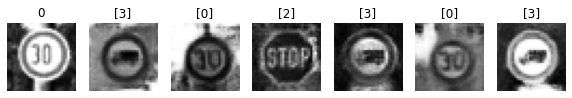

Epoch 93910 g_loss= 1.0847179 d_loss= 1.0614316 real_acc= 0.7 fake_acc= 0.74
Epoch 93920 g_loss= 0.9657123 d_loss= 1.1898661 real_acc= 0.84 fake_acc= 0.6
Epoch 93930 g_loss= 1.1120734 d_loss= 1.138795 real_acc= 0.6 fake_acc= 0.7
Epoch 93940 g_loss= 1.2273501 d_loss= 1.0581546 real_acc= 0.68 fake_acc= 0.78
Epoch 93950 g_loss= 1.1226436 d_loss= 1.1560366 real_acc= 0.68 fake_acc= 0.64
Epoch 93960 g_loss= 1.05788 d_loss= 1.1854131 real_acc= 0.8 fake_acc= 0.58
Epoch 93970 g_loss= 1.0858995 d_loss= 1.1327857 real_acc= 0.66 fake_acc= 0.7
Epoch 93980 g_loss= 1.1245724 d_loss= 1.1041358 real_acc= 0.74 fake_acc= 0.74
Epoch 93990 g_loss= 1.0100685 d_loss= 1.2013383 real_acc= 0.7 fake_acc= 0.68
Epoch 94000 g_loss= 1.2431653 d_loss= 1.1170356 real_acc= 0.56 fake_acc= 0.8


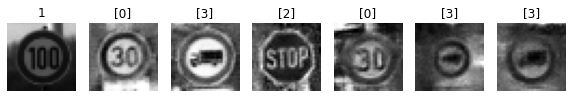

Epoch 94010 g_loss= 1.251726 d_loss= 1.0955203 real_acc= 0.76 fake_acc= 0.78
Epoch 94020 g_loss= 1.0334656 d_loss= 1.2224618 real_acc= 0.84 fake_acc= 0.56
Epoch 94030 g_loss= 1.4403007 d_loss= 1.1722438 real_acc= 0.58 fake_acc= 0.8
Epoch 94040 g_loss= 1.065087 d_loss= 1.1610305 real_acc= 0.64 fake_acc= 0.76
Epoch 94050 g_loss= 1.0201681 d_loss= 1.1163347 real_acc= 0.74 fake_acc= 0.68
Epoch 94060 g_loss= 1.0702957 d_loss= 1.1794673 real_acc= 0.72 fake_acc= 0.7
Epoch 94070 g_loss= 1.0610015 d_loss= 1.0886142 real_acc= 0.78 fake_acc= 0.72
Epoch 94080 g_loss= 1.1203853 d_loss= 1.0805709 real_acc= 0.8 fake_acc= 0.6
Epoch 94090 g_loss= 1.1026348 d_loss= 1.0839736 real_acc= 0.78 fake_acc= 0.6
Epoch 94100 g_loss= 1.1930512 d_loss= 1.1727233 real_acc= 0.58 fake_acc= 0.74


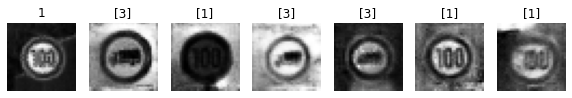

Epoch 94110 g_loss= 1.1048354 d_loss= 1.218442 real_acc= 0.66 fake_acc= 0.68
Epoch 94120 g_loss= 0.98452395 d_loss= 1.094065 real_acc= 0.72 fake_acc= 0.66
Epoch 94130 g_loss= 1.1644363 d_loss= 1.19286 real_acc= 0.62 fake_acc= 0.7
Epoch 94140 g_loss= 0.96785873 d_loss= 1.2135792 real_acc= 0.68 fake_acc= 0.7
Epoch 94150 g_loss= 1.3474885 d_loss= 0.9828142 real_acc= 0.62 fake_acc= 0.96
Epoch 94160 g_loss= 1.0442936 d_loss= 1.1770866 real_acc= 0.66 fake_acc= 0.68
Epoch 94170 g_loss= 1.0349076 d_loss= 1.0935082 real_acc= 0.74 fake_acc= 0.64
Epoch 94180 g_loss= 1.0762126 d_loss= 1.1844074 real_acc= 0.66 fake_acc= 0.64
Epoch 94190 g_loss= 1.0567024 d_loss= 1.2151887 real_acc= 0.6 fake_acc= 0.7
Epoch 94200 g_loss= 1.0737053 d_loss= 1.1024805 real_acc= 0.72 fake_acc= 0.72


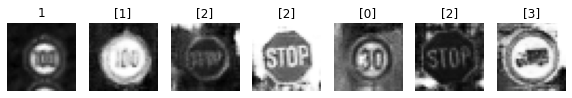

Epoch 94210 g_loss= 1.0626038 d_loss= 1.1321871 real_acc= 0.72 fake_acc= 0.72
Epoch 94220 g_loss= 1.2437265 d_loss= 1.1368141 real_acc= 0.66 fake_acc= 0.7
Epoch 94230 g_loss= 1.1707146 d_loss= 1.0845625 real_acc= 0.66 fake_acc= 0.76
Epoch 94240 g_loss= 1.1029282 d_loss= 1.1577432 real_acc= 0.74 fake_acc= 0.66
Epoch 94250 g_loss= 0.9536323 d_loss= 1.1966045 real_acc= 0.72 fake_acc= 0.58
Epoch 94260 g_loss= 1.1145308 d_loss= 1.1733619 real_acc= 0.56 fake_acc= 0.72
Epoch 94270 g_loss= 0.94231796 d_loss= 1.1402189 real_acc= 0.8 fake_acc= 0.58
Epoch 94280 g_loss= 1.3345344 d_loss= 1.1216054 real_acc= 0.72 fake_acc= 0.64
Epoch 94290 g_loss= 1.1299996 d_loss= 1.083387 real_acc= 0.66 fake_acc= 0.82
Epoch 94300 g_loss= 1.0757362 d_loss= 1.1203854 real_acc= 0.72 fake_acc= 0.7


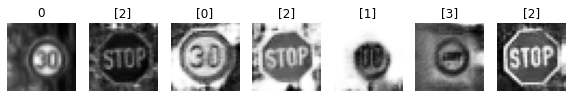

Epoch 94310 g_loss= 1.0421175 d_loss= 1.1522819 real_acc= 0.74 fake_acc= 0.64
Epoch 94320 g_loss= 1.4196014 d_loss= 1.0630887 real_acc= 0.62 fake_acc= 0.8
Epoch 94330 g_loss= 1.0283399 d_loss= 1.0614347 real_acc= 0.82 fake_acc= 0.62
Epoch 94340 g_loss= 0.8802285 d_loss= 1.2220438 real_acc= 0.72 fake_acc= 0.54
Epoch 94350 g_loss= 1.142574 d_loss= 1.1468209 real_acc= 0.64 fake_acc= 0.74
Epoch 94360 g_loss= 1.0052043 d_loss= 1.2647097 real_acc= 0.6 fake_acc= 0.62
Epoch 94370 g_loss= 1.1597081 d_loss= 1.0869746 real_acc= 0.7 fake_acc= 0.72
Epoch 94380 g_loss= 1.0189096 d_loss= 1.1786413 real_acc= 0.68 fake_acc= 0.74
Epoch 94390 g_loss= 0.95117426 d_loss= 1.1800301 real_acc= 0.7 fake_acc= 0.54
Epoch 94400 g_loss= 1.0801704 d_loss= 1.1002011 real_acc= 0.78 fake_acc= 0.66


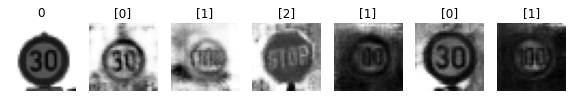

Epoch 94410 g_loss= 1.2154698 d_loss= 1.02207 real_acc= 0.68 fake_acc= 0.78
Epoch 94420 g_loss= 1.1260306 d_loss= 1.0639496 real_acc= 0.76 fake_acc= 0.72
Epoch 94430 g_loss= 1.1153129 d_loss= 1.0900759 real_acc= 0.7 fake_acc= 0.7
Epoch 94440 g_loss= 1.1183681 d_loss= 1.0911021 real_acc= 0.64 fake_acc= 0.76
Epoch 94450 g_loss= 1.2091203 d_loss= 1.0778799 real_acc= 0.7 fake_acc= 0.76
Epoch 94460 g_loss= 1.2371593 d_loss= 1.0849109 real_acc= 0.7 fake_acc= 0.8
Epoch 94470 g_loss= 1.030727 d_loss= 1.1834538 real_acc= 0.64 fake_acc= 0.74
Epoch 94480 g_loss= 0.93699247 d_loss= 1.1785437 real_acc= 0.76 fake_acc= 0.56
Epoch 94490 g_loss= 1.205972 d_loss= 1.07555 real_acc= 0.78 fake_acc= 0.76
Epoch 94500 g_loss= 1.0831658 d_loss= 1.0760189 real_acc= 0.7 fake_acc= 0.66


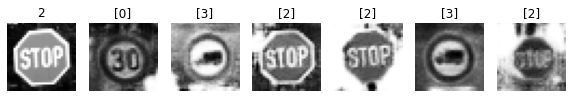

Epoch 94510 g_loss= 0.9257714 d_loss= 1.1761079 real_acc= 0.76 fake_acc= 0.56
Epoch 94520 g_loss= 1.2933503 d_loss= 1.0596023 real_acc= 0.62 fake_acc= 0.88
Epoch 94530 g_loss= 1.2605522 d_loss= 1.1354585 real_acc= 0.58 fake_acc= 0.78
Epoch 94540 g_loss= 0.9549011 d_loss= 1.1501533 real_acc= 0.74 fake_acc= 0.62
Epoch 94550 g_loss= 1.0879453 d_loss= 1.0994492 real_acc= 0.78 fake_acc= 0.6
Epoch 94560 g_loss= 1.0309108 d_loss= 1.1565715 real_acc= 0.74 fake_acc= 0.7
Epoch 94570 g_loss= 1.1651816 d_loss= 1.2283137 real_acc= 0.66 fake_acc= 0.66
Epoch 94580 g_loss= 1.0391072 d_loss= 1.2589006 real_acc= 0.62 fake_acc= 0.68
Epoch 94590 g_loss= 1.1273881 d_loss= 1.1119642 real_acc= 0.7 fake_acc= 0.7
Epoch 94600 g_loss= 1.0969273 d_loss= 1.1726906 real_acc= 0.6 fake_acc= 0.7


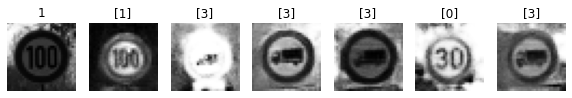

Epoch 94610 g_loss= 1.0145044 d_loss= 1.1353106 real_acc= 0.76 fake_acc= 0.66
Epoch 94620 g_loss= 1.0431461 d_loss= 1.1293406 real_acc= 0.76 fake_acc= 0.66
Epoch 94630 g_loss= 1.0851735 d_loss= 1.1562936 real_acc= 0.58 fake_acc= 0.72
Epoch 94640 g_loss= 0.9799061 d_loss= 1.2540885 real_acc= 0.66 fake_acc= 0.6
Epoch 94650 g_loss= 1.0675685 d_loss= 1.1203724 real_acc= 0.74 fake_acc= 0.64
Epoch 94660 g_loss= 0.9952447 d_loss= 1.2033286 real_acc= 0.64 fake_acc= 0.6
Epoch 94670 g_loss= 1.0717944 d_loss= 1.0383136 real_acc= 0.72 fake_acc= 0.76
Epoch 94680 g_loss= 1.2195214 d_loss= 1.1251633 real_acc= 0.64 fake_acc= 0.8
Epoch 94690 g_loss= 1.2259662 d_loss= 1.0754647 real_acc= 0.7 fake_acc= 0.76
Epoch 94700 g_loss= 1.1247367 d_loss= 1.0823915 real_acc= 0.74 fake_acc= 0.74


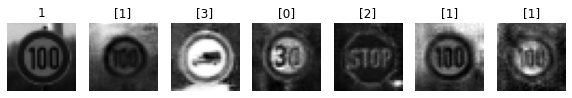

Epoch 94710 g_loss= 1.083035 d_loss= 1.1842072 real_acc= 0.58 fake_acc= 0.72
Epoch 94720 g_loss= 1.2310839 d_loss= 1.1194313 real_acc= 0.66 fake_acc= 0.78
Epoch 94730 g_loss= 1.1062485 d_loss= 1.1365993 real_acc= 0.68 fake_acc= 0.62
Epoch 94740 g_loss= 0.9296688 d_loss= 1.1623304 real_acc= 0.72 fake_acc= 0.58
Epoch 94750 g_loss= 0.9446434 d_loss= 1.3349175 real_acc= 0.6 fake_acc= 0.62
Epoch 94760 g_loss= 1.1051246 d_loss= 1.1253186 real_acc= 0.64 fake_acc= 0.78
Epoch 94770 g_loss= 1.1823914 d_loss= 1.0621245 real_acc= 0.68 fake_acc= 0.72
Epoch 94780 g_loss= 1.1298395 d_loss= 1.0903724 real_acc= 0.74 fake_acc= 0.66
Epoch 94790 g_loss= 1.0609488 d_loss= 1.1973095 real_acc= 0.8 fake_acc= 0.56
Epoch 94800 g_loss= 1.2544203 d_loss= 1.2808509 real_acc= 0.54 fake_acc= 0.82


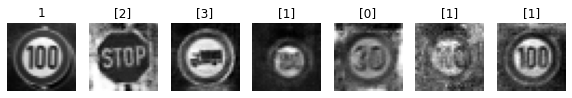

Epoch 94810 g_loss= 1.0182468 d_loss= 1.1547265 real_acc= 0.72 fake_acc= 0.66
Epoch 94820 g_loss= 1.0090588 d_loss= 1.0280995 real_acc= 0.86 fake_acc= 0.64
Epoch 94830 g_loss= 1.1076324 d_loss= 1.1579032 real_acc= 0.58 fake_acc= 0.66
Epoch 94840 g_loss= 1.0431417 d_loss= 1.1233867 real_acc= 0.7 fake_acc= 0.66
Epoch 94850 g_loss= 1.2233328 d_loss= 1.0614401 real_acc= 0.74 fake_acc= 0.76
Epoch 94860 g_loss= 1.0719613 d_loss= 1.2821028 real_acc= 0.6 fake_acc= 0.68
Epoch 94870 g_loss= 1.139759 d_loss= 1.2191455 real_acc= 0.64 fake_acc= 0.7
Epoch 94880 g_loss= 1.265121 d_loss= 1.0294731 real_acc= 0.72 fake_acc= 0.7
Epoch 94890 g_loss= 1.0694104 d_loss= 1.1315639 real_acc= 0.74 fake_acc= 0.7
Epoch 94900 g_loss= 0.8662874 d_loss= 1.1395092 real_acc= 0.76 fake_acc= 0.64


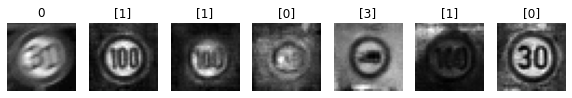

Epoch 94910 g_loss= 1.2018965 d_loss= 1.2294254 real_acc= 0.54 fake_acc= 0.68
Epoch 94920 g_loss= 1.030222 d_loss= 1.1870339 real_acc= 0.7 fake_acc= 0.66
Epoch 94930 g_loss= 1.0314447 d_loss= 1.1066699 real_acc= 0.7 fake_acc= 0.7
Epoch 94940 g_loss= 1.1524383 d_loss= 1.1235509 real_acc= 0.74 fake_acc= 0.7
Epoch 94950 g_loss= 1.1329726 d_loss= 1.1354122 real_acc= 0.72 fake_acc= 0.64
Epoch 94960 g_loss= 0.9501329 d_loss= 1.3067429 real_acc= 0.7 fake_acc= 0.58
Epoch 94970 g_loss= 1.1114343 d_loss= 1.2062812 real_acc= 0.62 fake_acc= 0.7
Epoch 94980 g_loss= 0.9672773 d_loss= 1.1070403 real_acc= 0.72 fake_acc= 0.74
Epoch 94990 g_loss= 1.0814341 d_loss= 1.171869 real_acc= 0.66 fake_acc= 0.66
Epoch 95000 g_loss= 1.1451597 d_loss= 1.1560254 real_acc= 0.6 fake_acc= 0.72


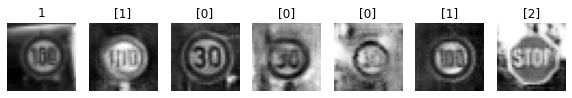

Epoch 95010 g_loss= 1.0201614 d_loss= 1.1947415 real_acc= 0.6 fake_acc= 0.68
Epoch 95020 g_loss= 0.85417783 d_loss= 1.2406427 real_acc= 0.7 fake_acc= 0.62
Epoch 95030 g_loss= 1.1558654 d_loss= 1.1350558 real_acc= 0.68 fake_acc= 0.68
Epoch 95040 g_loss= 1.1738763 d_loss= 1.1318147 real_acc= 0.66 fake_acc= 0.76
Epoch 95050 g_loss= 1.2035878 d_loss= 1.1341043 real_acc= 0.68 fake_acc= 0.74
Epoch 95060 g_loss= 1.0803826 d_loss= 1.1393077 real_acc= 0.7 fake_acc= 0.72
Epoch 95070 g_loss= 1.0983424 d_loss= 1.166929 real_acc= 0.64 fake_acc= 0.72
Epoch 95080 g_loss= 1.1021509 d_loss= 1.1654888 real_acc= 0.6 fake_acc= 0.62
Epoch 95090 g_loss= 1.198585 d_loss= 1.0346094 real_acc= 0.78 fake_acc= 0.74
Epoch 95100 g_loss= 1.0441476 d_loss= 1.1639345 real_acc= 0.72 fake_acc= 0.62


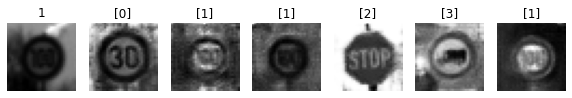

Epoch 95110 g_loss= 0.9612463 d_loss= 1.1253774 real_acc= 0.74 fake_acc= 0.62
Epoch 95120 g_loss= 1.1830827 d_loss= 1.1110363 real_acc= 0.68 fake_acc= 0.7
Epoch 95130 g_loss= 1.2215567 d_loss= 0.9536985 real_acc= 0.78 fake_acc= 0.76
Epoch 95140 g_loss= 1.0173361 d_loss= 1.2180574 real_acc= 0.62 fake_acc= 0.64
Epoch 95150 g_loss= 0.9993085 d_loss= 1.176439 real_acc= 0.76 fake_acc= 0.66
Epoch 95160 g_loss= 1.3115587 d_loss= 1.0251079 real_acc= 0.7 fake_acc= 0.76
Epoch 95170 g_loss= 1.1130933 d_loss= 1.1843113 real_acc= 0.64 fake_acc= 0.76
Epoch 95180 g_loss= 0.96419215 d_loss= 1.110083 real_acc= 0.78 fake_acc= 0.64
Epoch 95190 g_loss= 0.9696014 d_loss= 1.1804646 real_acc= 0.76 fake_acc= 0.54
Epoch 95200 g_loss= 1.2950917 d_loss= 1.0549526 real_acc= 0.64 fake_acc= 0.84


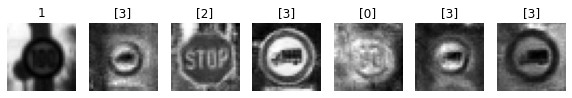

Epoch 95210 g_loss= 1.1847823 d_loss= 1.1500443 real_acc= 0.58 fake_acc= 0.78
Epoch 95220 g_loss= 1.1104522 d_loss= 1.063667 real_acc= 0.82 fake_acc= 0.74
Epoch 95230 g_loss= 0.8953288 d_loss= 1.0845077 real_acc= 0.8 fake_acc= 0.62
Epoch 95240 g_loss= 1.0883702 d_loss= 1.1423132 real_acc= 0.76 fake_acc= 0.64
Epoch 95250 g_loss= 1.1980325 d_loss= 1.1853051 real_acc= 0.6 fake_acc= 0.74
Epoch 95260 g_loss= 1.012987 d_loss= 1.1549051 real_acc= 0.7 fake_acc= 0.64
Epoch 95270 g_loss= 1.1842533 d_loss= 1.2206686 real_acc= 0.6 fake_acc= 0.64
Epoch 95280 g_loss= 1.1728088 d_loss= 0.9752863 real_acc= 0.84 fake_acc= 0.72
Epoch 95290 g_loss= 1.1328281 d_loss= 1.1288717 real_acc= 0.64 fake_acc= 0.7
Epoch 95300 g_loss= 1.009047 d_loss= 1.1823584 real_acc= 0.68 fake_acc= 0.6


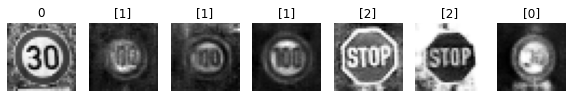

Epoch 95310 g_loss= 1.0125675 d_loss= 1.0937636 real_acc= 0.8 fake_acc= 0.7
Epoch 95320 g_loss= 1.0776366 d_loss= 1.164408 real_acc= 0.6 fake_acc= 0.72
Epoch 95330 g_loss= 0.9842361 d_loss= 1.1770644 real_acc= 0.66 fake_acc= 0.66
Epoch 95340 g_loss= 1.228634 d_loss= 1.078254 real_acc= 0.66 fake_acc= 0.84
Epoch 95350 g_loss= 0.9893524 d_loss= 1.2648484 real_acc= 0.66 fake_acc= 0.6
Epoch 95360 g_loss= 1.2571893 d_loss= 1.0382929 real_acc= 0.74 fake_acc= 0.76
Epoch 95370 g_loss= 1.2077453 d_loss= 1.1190004 real_acc= 0.64 fake_acc= 0.76
Epoch 95380 g_loss= 0.87078094 d_loss= 1.1595529 real_acc= 0.78 fake_acc= 0.66
Epoch 95390 g_loss= 0.8519023 d_loss= 1.2017887 real_acc= 0.82 fake_acc= 0.6
Epoch 95400 g_loss= 1.3057371 d_loss= 1.0693333 real_acc= 0.6 fake_acc= 0.78


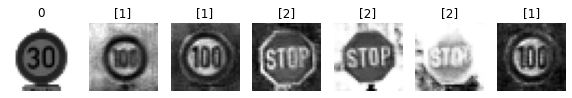

Epoch 95410 g_loss= 1.1725074 d_loss= 1.1388266 real_acc= 0.62 fake_acc= 0.74
Epoch 95420 g_loss= 1.0716169 d_loss= 1.1201768 real_acc= 0.66 fake_acc= 0.76
Epoch 95430 g_loss= 1.1265827 d_loss= 1.1834292 real_acc= 0.72 fake_acc= 0.72
Epoch 95440 g_loss= 1.1521959 d_loss= 0.99638265 real_acc= 0.7 fake_acc= 0.76
Epoch 95450 g_loss= 1.1891209 d_loss= 1.2270006 real_acc= 0.52 fake_acc= 0.82
Epoch 95460 g_loss= 1.0364211 d_loss= 1.1327045 real_acc= 0.78 fake_acc= 0.62
Epoch 95470 g_loss= 0.9651808 d_loss= 1.1679859 real_acc= 0.72 fake_acc= 0.7
Epoch 95480 g_loss= 1.1465372 d_loss= 1.0731173 real_acc= 0.72 fake_acc= 0.7
Epoch 95490 g_loss= 1.0427564 d_loss= 1.0758307 real_acc= 0.74 fake_acc= 0.7
Epoch 95500 g_loss= 1.0059896 d_loss= 1.180778 real_acc= 0.66 fake_acc= 0.62


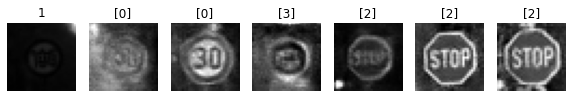

Epoch 95510 g_loss= 0.94698775 d_loss= 1.0935376 real_acc= 0.8 fake_acc= 0.72
Epoch 95520 g_loss= 1.0184151 d_loss= 1.23926 real_acc= 0.56 fake_acc= 0.62
Epoch 95530 g_loss= 0.9818696 d_loss= 1.2189777 real_acc= 0.72 fake_acc= 0.66
Epoch 95540 g_loss= 1.0727335 d_loss= 1.0954533 real_acc= 0.68 fake_acc= 0.72
Epoch 95550 g_loss= 1.1260501 d_loss= 1.0480921 real_acc= 0.76 fake_acc= 0.64
Epoch 95560 g_loss= 0.9046073 d_loss= 1.1490507 real_acc= 0.68 fake_acc= 0.62
Epoch 95570 g_loss= 1.1601 d_loss= 1.0000042 real_acc= 0.76 fake_acc= 0.76
Epoch 95580 g_loss= 1.13359 d_loss= 1.0842085 real_acc= 0.64 fake_acc= 0.8
Epoch 95590 g_loss= 0.9665939 d_loss= 1.1265533 real_acc= 0.74 fake_acc= 0.7
Epoch 95600 g_loss= 1.1294508 d_loss= 1.1402826 real_acc= 0.7 fake_acc= 0.74


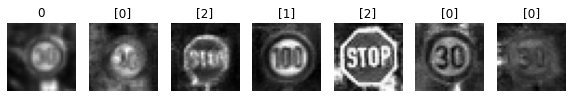

Epoch 95610 g_loss= 1.2229859 d_loss= 1.1332242 real_acc= 0.62 fake_acc= 0.78
Epoch 95620 g_loss= 1.1550138 d_loss= 1.1626631 real_acc= 0.7 fake_acc= 0.64
Epoch 95630 g_loss= 1.3156862 d_loss= 1.0379343 real_acc= 0.64 fake_acc= 0.78
Epoch 95640 g_loss= 0.9770619 d_loss= 1.1714098 real_acc= 0.8 fake_acc= 0.6
Epoch 95650 g_loss= 1.2141333 d_loss= 1.0365145 real_acc= 0.72 fake_acc= 0.7
Epoch 95660 g_loss= 1.1512811 d_loss= 1.0704525 real_acc= 0.68 fake_acc= 0.74
Epoch 95670 g_loss= 1.1901432 d_loss= 1.0685897 real_acc= 0.74 fake_acc= 0.72
Epoch 95680 g_loss= 1.0428244 d_loss= 1.1210026 real_acc= 0.66 fake_acc= 0.64
Epoch 95690 g_loss= 0.9907705 d_loss= 1.1652777 real_acc= 0.74 fake_acc= 0.64
Epoch 95700 g_loss= 1.2455062 d_loss= 1.1298245 real_acc= 0.68 fake_acc= 0.76


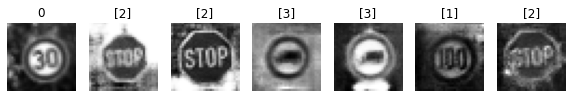

Epoch 95710 g_loss= 0.90647936 d_loss= 1.2147872 real_acc= 0.8 fake_acc= 0.46
Epoch 95720 g_loss= 1.1202849 d_loss= 1.2319345 real_acc= 0.58 fake_acc= 0.8
Epoch 95730 g_loss= 0.96190155 d_loss= 1.2883118 real_acc= 0.66 fake_acc= 0.52
Epoch 95740 g_loss= 0.8688142 d_loss= 1.2157232 real_acc= 0.84 fake_acc= 0.46
Epoch 95750 g_loss= 0.9752865 d_loss= 1.366401 real_acc= 0.52 fake_acc= 0.62
Epoch 95760 g_loss= 0.8805338 d_loss= 1.2074049 real_acc= 0.76 fake_acc= 0.62
Epoch 95770 g_loss= 1.1107823 d_loss= 1.1867516 real_acc= 0.62 fake_acc= 0.72
Epoch 95780 g_loss= 1.1488758 d_loss= 1.14489 real_acc= 0.62 fake_acc= 0.84
Epoch 95790 g_loss= 1.0890625 d_loss= 1.0410796 real_acc= 0.84 fake_acc= 0.72
Epoch 95800 g_loss= 1.0206815 d_loss= 1.224893 real_acc= 0.62 fake_acc= 0.68


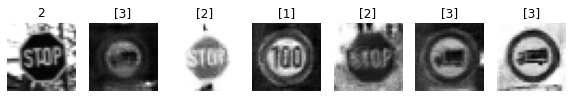

Epoch 95810 g_loss= 1.0462924 d_loss= 1.232512 real_acc= 0.68 fake_acc= 0.62
Epoch 95820 g_loss= 0.89845335 d_loss= 1.1662408 real_acc= 0.82 fake_acc= 0.58
Epoch 95830 g_loss= 1.1115471 d_loss= 1.0213091 real_acc= 0.74 fake_acc= 0.76
Epoch 95840 g_loss= 1.3237516 d_loss= 0.9523083 real_acc= 0.82 fake_acc= 0.74
Epoch 95850 g_loss= 1.2196889 d_loss= 1.0855942 real_acc= 0.72 fake_acc= 0.8
Epoch 95860 g_loss= 0.95786893 d_loss= 1.1569734 real_acc= 0.8 fake_acc= 0.62
Epoch 95870 g_loss= 1.0870199 d_loss= 1.1230581 real_acc= 0.7 fake_acc= 0.72
Epoch 95880 g_loss= 1.1245483 d_loss= 1.1374747 real_acc= 0.66 fake_acc= 0.74
Epoch 95890 g_loss= 1.213179 d_loss= 1.1290126 real_acc= 0.72 fake_acc= 0.72
Epoch 95900 g_loss= 1.1435134 d_loss= 1.2065058 real_acc= 0.64 fake_acc= 0.7


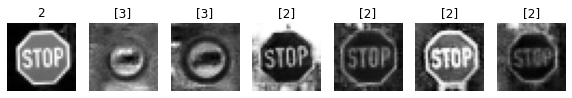

Epoch 95910 g_loss= 1.0873731 d_loss= 1.1543219 real_acc= 0.66 fake_acc= 0.7
Epoch 95920 g_loss= 1.1818581 d_loss= 0.9365511 real_acc= 0.8 fake_acc= 0.74
Epoch 95930 g_loss= 1.3316036 d_loss= 1.0323539 real_acc= 0.7 fake_acc= 0.82
Epoch 95940 g_loss= 0.97527045 d_loss= 1.230599 real_acc= 0.64 fake_acc= 0.64
Epoch 95950 g_loss= 0.9455231 d_loss= 1.1901003 real_acc= 0.74 fake_acc= 0.6
Epoch 95960 g_loss= 1.2755401 d_loss= 1.1462352 real_acc= 0.64 fake_acc= 0.68
Epoch 95970 g_loss= 1.3266625 d_loss= 1.0689769 real_acc= 0.62 fake_acc= 0.8
Epoch 95980 g_loss= 1.055683 d_loss= 1.1577034 real_acc= 0.68 fake_acc= 0.58
Epoch 95990 g_loss= 0.8663213 d_loss= 1.2685778 real_acc= 0.72 fake_acc= 0.54
Epoch 96000 g_loss= 0.9950387 d_loss= 1.2002318 real_acc= 0.66 fake_acc= 0.7


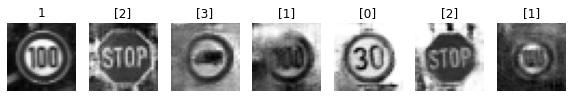

Epoch 96010 g_loss= 0.9263156 d_loss= 1.1996156 real_acc= 0.8 fake_acc= 0.64
Epoch 96020 g_loss= 1.1444322 d_loss= 1.1045856 real_acc= 0.72 fake_acc= 0.7
Epoch 96030 g_loss= 1.0362836 d_loss= 1.1820031 real_acc= 0.62 fake_acc= 0.66
Epoch 96040 g_loss= 1.0159869 d_loss= 1.1884131 real_acc= 0.6 fake_acc= 0.72
Epoch 96050 g_loss= 1.2110581 d_loss= 1.0165988 real_acc= 0.7 fake_acc= 0.78
Epoch 96060 g_loss= 0.93764794 d_loss= 1.1270933 real_acc= 0.68 fake_acc= 0.66
Epoch 96070 g_loss= 1.2391243 d_loss= 1.0552018 real_acc= 0.74 fake_acc= 0.74
Epoch 96080 g_loss= 1.1195495 d_loss= 1.3586386 real_acc= 0.68 fake_acc= 0.6
Epoch 96090 g_loss= 0.932461 d_loss= 1.2020268 real_acc= 0.7 fake_acc= 0.56
Epoch 96100 g_loss= 1.153852 d_loss= 1.1881456 real_acc= 0.64 fake_acc= 0.76


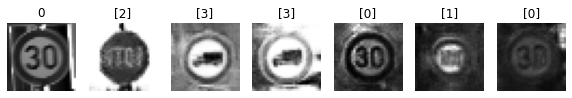

Epoch 96110 g_loss= 1.0973344 d_loss= 1.2469772 real_acc= 0.62 fake_acc= 0.7
Epoch 96120 g_loss= 0.91928947 d_loss= 1.1943564 real_acc= 0.74 fake_acc= 0.56
Epoch 96130 g_loss= 1.0001429 d_loss= 1.1097939 real_acc= 0.82 fake_acc= 0.7
Epoch 96140 g_loss= 1.1444187 d_loss= 1.1354213 real_acc= 0.7 fake_acc= 0.72
Epoch 96150 g_loss= 1.0201776 d_loss= 1.226651 real_acc= 0.72 fake_acc= 0.58
Epoch 96160 g_loss= 0.90287226 d_loss= 1.1614811 real_acc= 0.82 fake_acc= 0.54
Epoch 96170 g_loss= 1.1929629 d_loss= 1.1696162 real_acc= 0.66 fake_acc= 0.68
Epoch 96180 g_loss= 1.0090393 d_loss= 1.3023839 real_acc= 0.66 fake_acc= 0.64
Epoch 96190 g_loss= 1.165382 d_loss= 1.1668704 real_acc= 0.62 fake_acc= 0.72
Epoch 96200 g_loss= 1.1008662 d_loss= 1.142697 real_acc= 0.64 fake_acc= 0.82


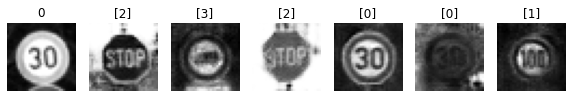

Epoch 96210 g_loss= 1.0582418 d_loss= 1.1646482 real_acc= 0.62 fake_acc= 0.7
Epoch 96220 g_loss= 1.0844859 d_loss= 1.1605682 real_acc= 0.74 fake_acc= 0.72
Epoch 96230 g_loss= 0.97583807 d_loss= 1.1383215 real_acc= 0.74 fake_acc= 0.62
Epoch 96240 g_loss= 1.125304 d_loss= 1.1399338 real_acc= 0.68 fake_acc= 0.74
Epoch 96250 g_loss= 0.8192616 d_loss= 1.2400789 real_acc= 0.64 fake_acc= 0.48
Epoch 96260 g_loss= 1.0388896 d_loss= 1.190717 real_acc= 0.82 fake_acc= 0.72
Epoch 96270 g_loss= 0.9374652 d_loss= 1.0911989 real_acc= 0.8 fake_acc= 0.62
Epoch 96280 g_loss= 1.26085 d_loss= 1.1284685 real_acc= 0.62 fake_acc= 0.76
Epoch 96290 g_loss= 1.2737205 d_loss= 1.1635547 real_acc= 0.6 fake_acc= 0.72
Epoch 96300 g_loss= 1.0510924 d_loss= 1.1730344 real_acc= 0.6 fake_acc= 0.68


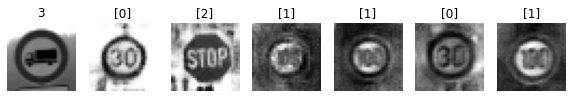

Epoch 96310 g_loss= 1.0075859 d_loss= 1.1835966 real_acc= 0.72 fake_acc= 0.64
Epoch 96320 g_loss= 1.2027074 d_loss= 1.2056899 real_acc= 0.64 fake_acc= 0.74
Epoch 96330 g_loss= 0.9791447 d_loss= 1.1599464 real_acc= 0.78 fake_acc= 0.64
Epoch 96340 g_loss= 1.1181957 d_loss= 1.0647019 real_acc= 0.66 fake_acc= 0.86
Epoch 96350 g_loss= 1.0686666 d_loss= 1.2826333 real_acc= 0.5 fake_acc= 0.62
Epoch 96360 g_loss= 1.2101187 d_loss= 1.0786066 real_acc= 0.7 fake_acc= 0.7
Epoch 96370 g_loss= 1.11562 d_loss= 1.1756754 real_acc= 0.6 fake_acc= 0.76
Epoch 96380 g_loss= 0.9203922 d_loss= 1.3052962 real_acc= 0.66 fake_acc= 0.56
Epoch 96390 g_loss= 1.0872918 d_loss= 1.0706741 real_acc= 0.74 fake_acc= 0.7
Epoch 96400 g_loss= 0.9713734 d_loss= 1.201967 real_acc= 0.66 fake_acc= 0.64


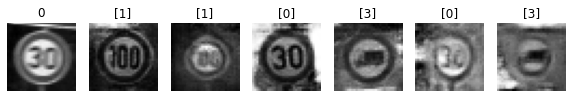

Epoch 96410 g_loss= 1.1033945 d_loss= 1.1322486 real_acc= 0.7 fake_acc= 0.64
Epoch 96420 g_loss= 1.1074771 d_loss= 1.1432495 real_acc= 0.7 fake_acc= 0.76
Epoch 96430 g_loss= 1.1306837 d_loss= 1.149007 real_acc= 0.74 fake_acc= 0.72
Epoch 96440 g_loss= 1.0972204 d_loss= 1.1425195 real_acc= 0.76 fake_acc= 0.62
Epoch 96450 g_loss= 1.1258788 d_loss= 1.1623108 real_acc= 0.66 fake_acc= 0.7
Epoch 96460 g_loss= 1.2629566 d_loss= 1.1121466 real_acc= 0.56 fake_acc= 0.8
Epoch 96470 g_loss= 1.093292 d_loss= 1.1874425 real_acc= 0.68 fake_acc= 0.7
Epoch 96480 g_loss= 1.1100585 d_loss= 1.1265309 real_acc= 0.64 fake_acc= 0.8
Epoch 96490 g_loss= 1.1008779 d_loss= 1.1009417 real_acc= 0.72 fake_acc= 0.72
Epoch 96500 g_loss= 1.2807426 d_loss= 1.0684781 real_acc= 0.78 fake_acc= 0.8


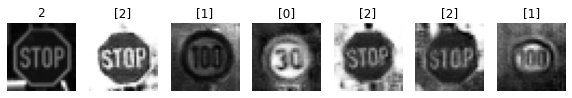

Epoch 96510 g_loss= 1.2164024 d_loss= 1.166734 real_acc= 0.56 fake_acc= 0.7
Epoch 96520 g_loss= 0.8958138 d_loss= 1.1531663 real_acc= 0.74 fake_acc= 0.64
Epoch 96530 g_loss= 1.0690821 d_loss= 1.1535728 real_acc= 0.62 fake_acc= 0.68
Epoch 96540 g_loss= 1.2512971 d_loss= 1.1899561 real_acc= 0.58 fake_acc= 0.78
Epoch 96550 g_loss= 0.7965785 d_loss= 1.3446388 real_acc= 0.72 fake_acc= 0.44
Epoch 96560 g_loss= 0.9856501 d_loss= 1.2161908 real_acc= 0.74 fake_acc= 0.56
Epoch 96570 g_loss= 1.0578809 d_loss= 1.0365407 real_acc= 0.84 fake_acc= 0.68
Epoch 96580 g_loss= 1.0249709 d_loss= 1.3087463 real_acc= 0.58 fake_acc= 0.62
Epoch 96590 g_loss= 0.95189196 d_loss= 1.1643775 real_acc= 0.7 fake_acc= 0.64
Epoch 96600 g_loss= 0.9913238 d_loss= 1.3011668 real_acc= 0.68 fake_acc= 0.54


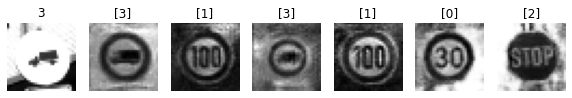

Epoch 96610 g_loss= 1.0092096 d_loss= 1.187079 real_acc= 0.72 fake_acc= 0.68
Epoch 96620 g_loss= 1.0888714 d_loss= 1.2340931 real_acc= 0.58 fake_acc= 0.74
Epoch 96630 g_loss= 1.2161388 d_loss= 1.138492 real_acc= 0.72 fake_acc= 0.72
Epoch 96640 g_loss= 1.0748886 d_loss= 1.1006043 real_acc= 0.72 fake_acc= 0.68
Epoch 96650 g_loss= 1.1405725 d_loss= 1.097381 real_acc= 0.74 fake_acc= 0.72
Epoch 96660 g_loss= 1.0774527 d_loss= 1.1371264 real_acc= 0.76 fake_acc= 0.68
Epoch 96670 g_loss= 1.0428247 d_loss= 1.2275692 real_acc= 0.62 fake_acc= 0.7
Epoch 96680 g_loss= 1.1455569 d_loss= 1.0771406 real_acc= 0.76 fake_acc= 0.72
Epoch 96690 g_loss= 1.0504955 d_loss= 1.0887139 real_acc= 0.7 fake_acc= 0.72
Epoch 96700 g_loss= 1.17259 d_loss= 1.0819583 real_acc= 0.6 fake_acc= 0.72


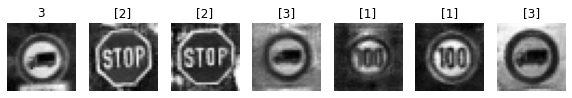

Epoch 96710 g_loss= 1.0695403 d_loss= 1.1223779 real_acc= 0.76 fake_acc= 0.68
Epoch 96720 g_loss= 1.1333594 d_loss= 1.1316516 real_acc= 0.62 fake_acc= 0.78
Epoch 96730 g_loss= 1.2130553 d_loss= 1.1662829 real_acc= 0.64 fake_acc= 0.74
Epoch 96740 g_loss= 0.9591229 d_loss= 1.1538489 real_acc= 0.72 fake_acc= 0.64
Epoch 96750 g_loss= 1.1168735 d_loss= 1.0688384 real_acc= 0.72 fake_acc= 0.76
Epoch 96760 g_loss= 1.0867198 d_loss= 1.2105174 real_acc= 0.62 fake_acc= 0.78
Epoch 96770 g_loss= 1.0050448 d_loss= 1.1811004 real_acc= 0.66 fake_acc= 0.72
Epoch 96780 g_loss= 0.90299606 d_loss= 1.155498 real_acc= 0.86 fake_acc= 0.56
Epoch 96790 g_loss= 1.2358912 d_loss= 1.0673304 real_acc= 0.66 fake_acc= 0.76
Epoch 96800 g_loss= 0.98114866 d_loss= 1.1563827 real_acc= 0.72 fake_acc= 0.68


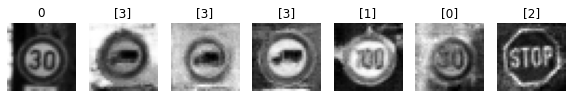

Epoch 96810 g_loss= 1.1606697 d_loss= 1.1270918 real_acc= 0.66 fake_acc= 0.64
Epoch 96820 g_loss= 1.1208643 d_loss= 1.1197503 real_acc= 0.68 fake_acc= 0.72
Epoch 96830 g_loss= 1.0062282 d_loss= 1.1039133 real_acc= 0.76 fake_acc= 0.6
Epoch 96840 g_loss= 1.1641536 d_loss= 1.0997398 real_acc= 0.68 fake_acc= 0.68
Epoch 96850 g_loss= 1.0743991 d_loss= 1.1779625 real_acc= 0.6 fake_acc= 0.76
Epoch 96860 g_loss= 0.91931504 d_loss= 1.145097 real_acc= 0.68 fake_acc= 0.58
Epoch 96870 g_loss= 1.0872384 d_loss= 1.039293 real_acc= 0.82 fake_acc= 0.66
Epoch 96880 g_loss= 1.5304132 d_loss= 1.1186742 real_acc= 0.56 fake_acc= 0.74
Epoch 96890 g_loss= 1.0281057 d_loss= 1.1112716 real_acc= 0.74 fake_acc= 0.76
Epoch 96900 g_loss= 1.4902042 d_loss= 0.86673915 real_acc= 0.72 fake_acc= 0.88


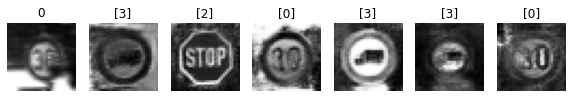

Epoch 96910 g_loss= 1.0830661 d_loss= 1.1736946 real_acc= 0.7 fake_acc= 0.66
Epoch 96920 g_loss= 1.1801171 d_loss= 1.2149918 real_acc= 0.7 fake_acc= 0.66
Epoch 96930 g_loss= 1.2349463 d_loss= 1.1779022 real_acc= 0.66 fake_acc= 0.66
Epoch 96940 g_loss= 1.1374121 d_loss= 1.1235652 real_acc= 0.68 fake_acc= 0.66
Epoch 96950 g_loss= 1.0692265 d_loss= 1.080898 real_acc= 0.76 fake_acc= 0.68
Epoch 96960 g_loss= 1.1264864 d_loss= 1.0868819 real_acc= 0.72 fake_acc= 0.7
Epoch 96970 g_loss= 1.0162973 d_loss= 1.1426029 real_acc= 0.82 fake_acc= 0.56
Epoch 96980 g_loss= 1.0569372 d_loss= 1.101738 real_acc= 0.66 fake_acc= 0.76
Epoch 96990 g_loss= 1.0658306 d_loss= 1.1796112 real_acc= 0.7 fake_acc= 0.62
Epoch 97000 g_loss= 1.12539 d_loss= 1.0639814 real_acc= 0.76 fake_acc= 0.8


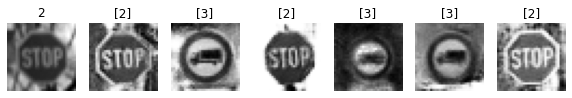

Epoch 97010 g_loss= 0.897432 d_loss= 1.3880373 real_acc= 0.64 fake_acc= 0.5
Epoch 97020 g_loss= 1.2000687 d_loss= 1.0333425 real_acc= 0.74 fake_acc= 0.82
Epoch 97030 g_loss= 0.8826318 d_loss= 1.2518334 real_acc= 0.72 fake_acc= 0.56
Epoch 97040 g_loss= 1.1178693 d_loss= 1.0393207 real_acc= 0.78 fake_acc= 0.74
Epoch 97050 g_loss= 0.9321066 d_loss= 1.3287723 real_acc= 0.68 fake_acc= 0.58
Epoch 97060 g_loss= 1.3390286 d_loss= 0.9815973 real_acc= 0.72 fake_acc= 0.78
Epoch 97070 g_loss= 0.924868 d_loss= 1.1755437 real_acc= 0.64 fake_acc= 0.56
Epoch 97080 g_loss= 1.0366111 d_loss= 1.1412364 real_acc= 0.74 fake_acc= 0.62
Epoch 97090 g_loss= 1.1593578 d_loss= 1.14417 real_acc= 0.64 fake_acc= 0.66
Epoch 97100 g_loss= 1.2308853 d_loss= 0.98284197 real_acc= 0.88 fake_acc= 0.64


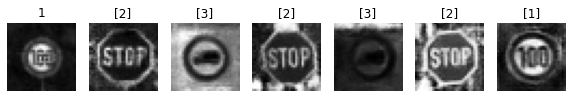

Epoch 97110 g_loss= 1.2169085 d_loss= 1.18643 real_acc= 0.64 fake_acc= 0.62
Epoch 97120 g_loss= 1.1822113 d_loss= 0.993103 real_acc= 0.8 fake_acc= 0.8
Epoch 97130 g_loss= 1.1256939 d_loss= 1.1971151 real_acc= 0.58 fake_acc= 0.7
Epoch 97140 g_loss= 0.9913651 d_loss= 1.1734102 real_acc= 0.72 fake_acc= 0.62
Epoch 97150 g_loss= 1.1423426 d_loss= 1.1496351 real_acc= 0.7 fake_acc= 0.68
Epoch 97160 g_loss= 1.0593021 d_loss= 1.109195 real_acc= 0.74 fake_acc= 0.58
Epoch 97170 g_loss= 1.1965495 d_loss= 1.055475 real_acc= 0.76 fake_acc= 0.86
Epoch 97180 g_loss= 1.3528711 d_loss= 1.1027703 real_acc= 0.66 fake_acc= 0.78
Epoch 97190 g_loss= 0.929403 d_loss= 1.2578115 real_acc= 0.72 fake_acc= 0.5
Epoch 97200 g_loss= 1.2580543 d_loss= 1.1608068 real_acc= 0.62 fake_acc= 0.74


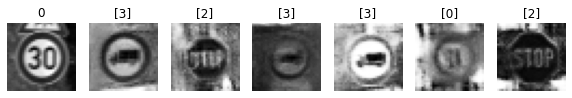

Epoch 97210 g_loss= 1.1334114 d_loss= 1.3143666 real_acc= 0.56 fake_acc= 0.76
Epoch 97220 g_loss= 0.92126536 d_loss= 1.1850698 real_acc= 0.72 fake_acc= 0.52
Epoch 97230 g_loss= 0.91057175 d_loss= 1.3262537 real_acc= 0.62 fake_acc= 0.66
Epoch 97240 g_loss= 1.0057503 d_loss= 1.1116853 real_acc= 0.8 fake_acc= 0.64
Epoch 97250 g_loss= 1.0081236 d_loss= 1.2166228 real_acc= 0.68 fake_acc= 0.68
Epoch 97260 g_loss= 1.2395945 d_loss= 1.3741107 real_acc= 0.62 fake_acc= 0.74
Epoch 97270 g_loss= 1.0729479 d_loss= 1.0677661 real_acc= 0.74 fake_acc= 0.6
Epoch 97280 g_loss= 1.1161883 d_loss= 1.2260214 real_acc= 0.6 fake_acc= 0.76
Epoch 97290 g_loss= 1.1281841 d_loss= 1.0454001 real_acc= 0.8 fake_acc= 0.7
Epoch 97300 g_loss= 1.092327 d_loss= 1.129246 real_acc= 0.74 fake_acc= 0.68


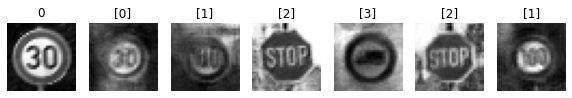

Epoch 97310 g_loss= 1.044466 d_loss= 1.264787 real_acc= 0.64 fake_acc= 0.68
Epoch 97320 g_loss= 1.1729982 d_loss= 1.1714725 real_acc= 0.56 fake_acc= 0.74
Epoch 97330 g_loss= 0.8837589 d_loss= 1.1541872 real_acc= 0.78 fake_acc= 0.56
Epoch 97340 g_loss= 0.9869416 d_loss= 1.1576589 real_acc= 0.68 fake_acc= 0.6
Epoch 97350 g_loss= 0.95734406 d_loss= 1.1597569 real_acc= 0.68 fake_acc= 0.62
Epoch 97360 g_loss= 1.0016788 d_loss= 1.0888739 real_acc= 0.74 fake_acc= 0.76
Epoch 97370 g_loss= 0.89471 d_loss= 1.3060007 real_acc= 0.66 fake_acc= 0.52
Epoch 97380 g_loss= 1.043977 d_loss= 1.1707903 real_acc= 0.74 fake_acc= 0.68
Epoch 97390 g_loss= 1.0247071 d_loss= 1.0125884 real_acc= 0.84 fake_acc= 0.68
Epoch 97400 g_loss= 1.1270081 d_loss= 1.1061361 real_acc= 0.78 fake_acc= 0.72


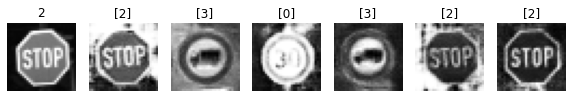

Epoch 97410 g_loss= 1.3982556 d_loss= 0.9478065 real_acc= 0.86 fake_acc= 0.76
Epoch 97420 g_loss= 1.0968777 d_loss= 1.041192 real_acc= 0.76 fake_acc= 0.74
Epoch 97430 g_loss= 0.8926711 d_loss= 1.1084797 real_acc= 0.82 fake_acc= 0.54
Epoch 97440 g_loss= 1.1665566 d_loss= 1.2456678 real_acc= 0.48 fake_acc= 0.72
Epoch 97450 g_loss= 1.244061 d_loss= 1.0967941 real_acc= 0.72 fake_acc= 0.8
Epoch 97460 g_loss= 1.0430408 d_loss= 1.1620513 real_acc= 0.76 fake_acc= 0.62
Epoch 97470 g_loss= 1.1960924 d_loss= 1.0598204 real_acc= 0.66 fake_acc= 0.78
Epoch 97480 g_loss= 1.1868223 d_loss= 1.0868435 real_acc= 0.76 fake_acc= 0.74
Epoch 97490 g_loss= 1.1244015 d_loss= 1.0626469 real_acc= 0.66 fake_acc= 0.72
Epoch 97500 g_loss= 0.9988488 d_loss= 1.1971838 real_acc= 0.6 fake_acc= 0.7


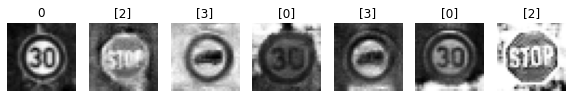

Epoch 97510 g_loss= 1.0988709 d_loss= 1.0939064 real_acc= 0.76 fake_acc= 0.62
Epoch 97520 g_loss= 1.0835458 d_loss= 1.1674064 real_acc= 0.64 fake_acc= 0.64
Epoch 97530 g_loss= 1.1374077 d_loss= 1.1849247 real_acc= 0.7 fake_acc= 0.68
Epoch 97540 g_loss= 1.2066206 d_loss= 1.1063137 real_acc= 0.52 fake_acc= 0.8
Epoch 97550 g_loss= 0.977205 d_loss= 1.1934097 real_acc= 0.66 fake_acc= 0.66
Epoch 97560 g_loss= 1.063851 d_loss= 1.1257753 real_acc= 0.7 fake_acc= 0.7
Epoch 97570 g_loss= 1.1466374 d_loss= 1.0180657 real_acc= 0.82 fake_acc= 0.84
Epoch 97580 g_loss= 0.9943115 d_loss= 1.2686869 real_acc= 0.66 fake_acc= 0.68
Epoch 97590 g_loss= 1.0359402 d_loss= 1.2168963 real_acc= 0.6 fake_acc= 0.72
Epoch 97600 g_loss= 1.1319184 d_loss= 1.1408035 real_acc= 0.56 fake_acc= 0.74


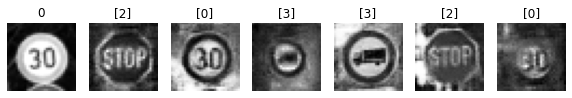

Epoch 97610 g_loss= 1.1718158 d_loss= 1.2877127 real_acc= 0.48 fake_acc= 0.7
Epoch 97620 g_loss= 0.8698003 d_loss= 1.2873313 real_acc= 0.66 fake_acc= 0.54
Epoch 97630 g_loss= 1.178517 d_loss= 1.0358872 real_acc= 0.76 fake_acc= 0.76
Epoch 97640 g_loss= 1.167464 d_loss= 1.1304175 real_acc= 0.72 fake_acc= 0.58
Epoch 97650 g_loss= 1.3203676 d_loss= 1.0808969 real_acc= 0.56 fake_acc= 0.88
Epoch 97660 g_loss= 1.0779017 d_loss= 1.1251163 real_acc= 0.7 fake_acc= 0.68
Epoch 97670 g_loss= 1.1647682 d_loss= 1.104422 real_acc= 0.7 fake_acc= 0.76
Epoch 97680 g_loss= 1.0293232 d_loss= 1.2428973 real_acc= 0.68 fake_acc= 0.58
Epoch 97690 g_loss= 1.0664055 d_loss= 0.9837275 real_acc= 0.8 fake_acc= 0.72
Epoch 97700 g_loss= 1.1695768 d_loss= 1.1758413 real_acc= 0.68 fake_acc= 0.68


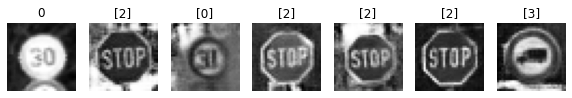

Epoch 97710 g_loss= 1.1033278 d_loss= 1.1390073 real_acc= 0.72 fake_acc= 0.72
Epoch 97720 g_loss= 1.1077168 d_loss= 1.205066 real_acc= 0.68 fake_acc= 0.76
Epoch 97730 g_loss= 0.9812181 d_loss= 1.2468499 real_acc= 0.66 fake_acc= 0.58
Epoch 97740 g_loss= 1.1795272 d_loss= 1.0838314 real_acc= 0.74 fake_acc= 0.8
Epoch 97750 g_loss= 1.0810609 d_loss= 1.1033511 real_acc= 0.7 fake_acc= 0.78
Epoch 97760 g_loss= 1.2570134 d_loss= 1.1401098 real_acc= 0.66 fake_acc= 0.78
Epoch 97770 g_loss= 0.9980608 d_loss= 1.2166259 real_acc= 0.7 fake_acc= 0.64
Epoch 97780 g_loss= 1.032163 d_loss= 1.131435 real_acc= 0.74 fake_acc= 0.64
Epoch 97790 g_loss= 0.99413073 d_loss= 1.2275461 real_acc= 0.74 fake_acc= 0.56
Epoch 97800 g_loss= 1.0276312 d_loss= 1.1764446 real_acc= 0.7 fake_acc= 0.6


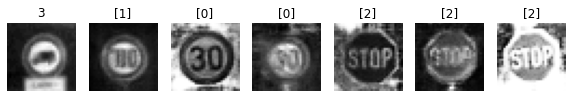

Epoch 97810 g_loss= 1.3048339 d_loss= 1.1988218 real_acc= 0.46 fake_acc= 0.84
Epoch 97820 g_loss= 1.0085486 d_loss= 1.1884861 real_acc= 0.6 fake_acc= 0.76
Epoch 97830 g_loss= 1.1113849 d_loss= 1.1532056 real_acc= 0.56 fake_acc= 0.76
Epoch 97840 g_loss= 0.8384253 d_loss= 1.2251571 real_acc= 0.8 fake_acc= 0.46
Epoch 97850 g_loss= 0.9211162 d_loss= 1.1797234 real_acc= 0.74 fake_acc= 0.62
Epoch 97860 g_loss= 1.0976044 d_loss= 1.1410971 real_acc= 0.58 fake_acc= 0.72
Epoch 97870 g_loss= 0.97128 d_loss= 1.272465 real_acc= 0.66 fake_acc= 0.66
Epoch 97880 g_loss= 1.2957883 d_loss= 1.0024827 real_acc= 0.78 fake_acc= 0.78
Epoch 97890 g_loss= 1.0911512 d_loss= 1.0850695 real_acc= 0.8 fake_acc= 0.72
Epoch 97900 g_loss= 0.93983835 d_loss= 1.283725 real_acc= 0.74 fake_acc= 0.58


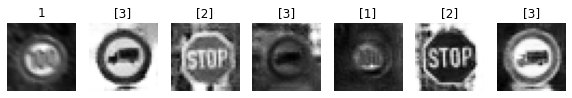

Epoch 97910 g_loss= 1.1332924 d_loss= 1.1793084 real_acc= 0.7 fake_acc= 0.64
Epoch 97920 g_loss= 1.1239432 d_loss= 1.20381 real_acc= 0.64 fake_acc= 0.64
Epoch 97930 g_loss= 1.0173326 d_loss= 1.1203882 real_acc= 0.78 fake_acc= 0.66
Epoch 97940 g_loss= 1.0431905 d_loss= 1.0825872 real_acc= 0.8 fake_acc= 0.66
Epoch 97950 g_loss= 1.1587563 d_loss= 1.1367751 real_acc= 0.72 fake_acc= 0.72
Epoch 97960 g_loss= 1.1341261 d_loss= 1.209741 real_acc= 0.56 fake_acc= 0.8
Epoch 97970 g_loss= 0.9682196 d_loss= 1.1161516 real_acc= 0.8 fake_acc= 0.7
Epoch 97980 g_loss= 1.1182318 d_loss= 1.2138376 real_acc= 0.66 fake_acc= 0.7
Epoch 97990 g_loss= 1.1048557 d_loss= 1.1087315 real_acc= 0.72 fake_acc= 0.74
Epoch 98000 g_loss= 1.0811429 d_loss= 1.0873613 real_acc= 0.74 fake_acc= 0.74


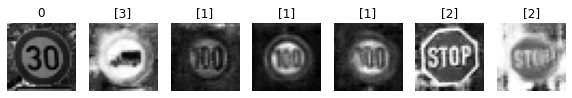

Epoch 98010 g_loss= 1.187724 d_loss= 1.1522965 real_acc= 0.62 fake_acc= 0.68
Epoch 98020 g_loss= 0.99017316 d_loss= 1.1342533 real_acc= 0.82 fake_acc= 0.64
Epoch 98030 g_loss= 1.092643 d_loss= 1.071289 real_acc= 0.72 fake_acc= 0.66
Epoch 98040 g_loss= 1.2425326 d_loss= 1.1401987 real_acc= 0.76 fake_acc= 0.74
Epoch 98050 g_loss= 1.1964986 d_loss= 1.0858264 real_acc= 0.82 fake_acc= 0.68
Epoch 98060 g_loss= 1.2331809 d_loss= 1.0452747 real_acc= 0.72 fake_acc= 0.78
Epoch 98070 g_loss= 0.9389841 d_loss= 1.2777004 real_acc= 0.72 fake_acc= 0.6
Epoch 98080 g_loss= 1.049634 d_loss= 1.1039131 real_acc= 0.7 fake_acc= 0.72
Epoch 98090 g_loss= 0.93412215 d_loss= 1.1724904 real_acc= 0.66 fake_acc= 0.62
Epoch 98100 g_loss= 0.9867295 d_loss= 1.1700187 real_acc= 0.68 fake_acc= 0.68


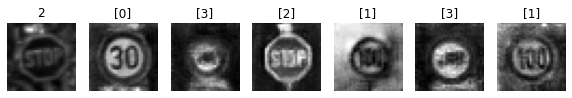

Epoch 98110 g_loss= 1.1676619 d_loss= 1.0998228 real_acc= 0.68 fake_acc= 0.74
Epoch 98120 g_loss= 0.990318 d_loss= 1.1802552 real_acc= 0.7 fake_acc= 0.68
Epoch 98130 g_loss= 1.0633423 d_loss= 1.1726849 real_acc= 0.6 fake_acc= 0.74
Epoch 98140 g_loss= 0.980038 d_loss= 1.2613442 real_acc= 0.68 fake_acc= 0.6
Epoch 98150 g_loss= 1.2122676 d_loss= 1.170357 real_acc= 0.64 fake_acc= 0.66
Epoch 98160 g_loss= 1.2413546 d_loss= 1.178379 real_acc= 0.6 fake_acc= 0.7
Epoch 98170 g_loss= 0.9951517 d_loss= 1.2553196 real_acc= 0.78 fake_acc= 0.62
Epoch 98180 g_loss= 1.0488895 d_loss= 1.1967919 real_acc= 0.7 fake_acc= 0.76
Epoch 98190 g_loss= 1.0682011 d_loss= 1.2327976 real_acc= 0.68 fake_acc= 0.74
Epoch 98200 g_loss= 1.1329328 d_loss= 1.0900819 real_acc= 0.7 fake_acc= 0.7


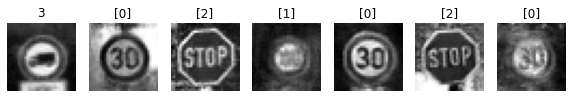

Epoch 98210 g_loss= 1.024898 d_loss= 1.1951104 real_acc= 0.74 fake_acc= 0.62
Epoch 98220 g_loss= 0.97016656 d_loss= 1.2690597 real_acc= 0.66 fake_acc= 0.58
Epoch 98230 g_loss= 1.1094842 d_loss= 1.1983316 real_acc= 0.6 fake_acc= 0.66
Epoch 98240 g_loss= 0.9547335 d_loss= 1.2423124 real_acc= 0.56 fake_acc= 0.58
Epoch 98250 g_loss= 1.2237821 d_loss= 1.1696199 real_acc= 0.58 fake_acc= 0.8
Epoch 98260 g_loss= 1.2668531 d_loss= 1.1798315 real_acc= 0.68 fake_acc= 0.76
Epoch 98270 g_loss= 1.0961491 d_loss= 1.0174142 real_acc= 0.8 fake_acc= 0.72
Epoch 98280 g_loss= 0.9829313 d_loss= 1.0991235 real_acc= 0.82 fake_acc= 0.62
Epoch 98290 g_loss= 1.1321914 d_loss= 1.1357065 real_acc= 0.68 fake_acc= 0.74
Epoch 98300 g_loss= 0.92613006 d_loss= 1.1029086 real_acc= 0.8 fake_acc= 0.58


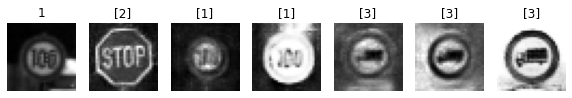

Epoch 98310 g_loss= 1.1664943 d_loss= 1.1576611 real_acc= 0.58 fake_acc= 0.7
Epoch 98320 g_loss= 1.193538 d_loss= 1.1124938 real_acc= 0.66 fake_acc= 0.62
Epoch 98330 g_loss= 1.0924026 d_loss= 1.1097255 real_acc= 0.72 fake_acc= 0.72
Epoch 98340 g_loss= 0.9979231 d_loss= 1.2056589 real_acc= 0.64 fake_acc= 0.72
Epoch 98350 g_loss= 1.0073164 d_loss= 1.2132533 real_acc= 0.64 fake_acc= 0.64
Epoch 98360 g_loss= 1.1444771 d_loss= 1.1366236 real_acc= 0.64 fake_acc= 0.74
Epoch 98370 g_loss= 0.9698389 d_loss= 1.104012 real_acc= 0.84 fake_acc= 0.5
Epoch 98380 g_loss= 1.1835458 d_loss= 1.129653 real_acc= 0.62 fake_acc= 0.68
Epoch 98390 g_loss= 1.1149284 d_loss= 1.1430635 real_acc= 0.62 fake_acc= 0.74
Epoch 98400 g_loss= 1.1222205 d_loss= 1.246315 real_acc= 0.64 fake_acc= 0.66


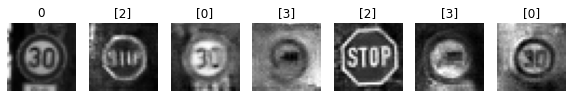

Epoch 98410 g_loss= 0.9607928 d_loss= 1.2016644 real_acc= 0.74 fake_acc= 0.68
Epoch 98420 g_loss= 1.245058 d_loss= 1.111951 real_acc= 0.62 fake_acc= 0.76
Epoch 98430 g_loss= 0.7971758 d_loss= 1.2702339 real_acc= 0.8 fake_acc= 0.44
Epoch 98440 g_loss= 1.0088567 d_loss= 1.1139162 real_acc= 0.74 fake_acc= 0.56
Epoch 98450 g_loss= 1.1125816 d_loss= 0.90196705 real_acc= 0.76 fake_acc= 0.84
Epoch 98460 g_loss= 1.1301389 d_loss= 1.1900964 real_acc= 0.58 fake_acc= 0.76
Epoch 98470 g_loss= 1.2560368 d_loss= 1.2186491 real_acc= 0.58 fake_acc= 0.74
Epoch 98480 g_loss= 1.0805928 d_loss= 1.1026038 real_acc= 0.72 fake_acc= 0.7
Epoch 98490 g_loss= 1.2894522 d_loss= 0.9749228 real_acc= 0.74 fake_acc= 0.78
Epoch 98500 g_loss= 1.3059831 d_loss= 1.227711 real_acc= 0.54 fake_acc= 0.74


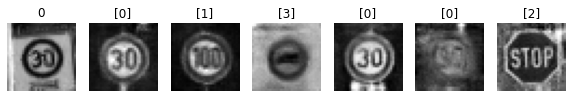

Epoch 98510 g_loss= 1.232313 d_loss= 1.1428182 real_acc= 0.64 fake_acc= 0.7
Epoch 98520 g_loss= 1.1849027 d_loss= 1.1101791 real_acc= 0.58 fake_acc= 0.82
Epoch 98530 g_loss= 1.0461109 d_loss= 1.1316075 real_acc= 0.64 fake_acc= 0.66
Epoch 98540 g_loss= 0.9652735 d_loss= 1.18717 real_acc= 0.76 fake_acc= 0.66
Epoch 98550 g_loss= 1.0666426 d_loss= 1.1050713 real_acc= 0.64 fake_acc= 0.72
Epoch 98560 g_loss= 1.0866395 d_loss= 1.1455791 real_acc= 0.64 fake_acc= 0.66
Epoch 98570 g_loss= 1.04231 d_loss= 1.2237847 real_acc= 0.74 fake_acc= 0.72
Epoch 98580 g_loss= 0.9262163 d_loss= 1.2427063 real_acc= 0.66 fake_acc= 0.56
Epoch 98590 g_loss= 1.0759281 d_loss= 0.9991119 real_acc= 0.78 fake_acc= 0.78
Epoch 98600 g_loss= 1.142682 d_loss= 1.031281 real_acc= 0.72 fake_acc= 0.8


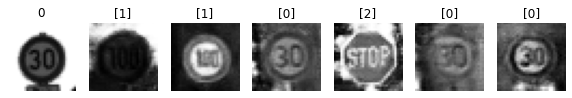

Epoch 98610 g_loss= 1.3671467 d_loss= 1.0950098 real_acc= 0.68 fake_acc= 0.7
Epoch 98620 g_loss= 0.93076974 d_loss= 1.1599157 real_acc= 0.76 fake_acc= 0.58
Epoch 98630 g_loss= 1.1485143 d_loss= 1.1902232 real_acc= 0.58 fake_acc= 0.72
Epoch 98640 g_loss= 1.0668087 d_loss= 1.1130707 real_acc= 0.76 fake_acc= 0.72
Epoch 98650 g_loss= 1.0370567 d_loss= 1.0569494 real_acc= 0.8 fake_acc= 0.74
Epoch 98660 g_loss= 1.2706398 d_loss= 1.0345147 real_acc= 0.64 fake_acc= 0.78
Epoch 98670 g_loss= 1.1766926 d_loss= 1.0582119 real_acc= 0.74 fake_acc= 0.76
Epoch 98680 g_loss= 1.1020185 d_loss= 1.2309864 real_acc= 0.54 fake_acc= 0.72
Epoch 98690 g_loss= 0.9772335 d_loss= 1.1363828 real_acc= 0.68 fake_acc= 0.72
Epoch 98700 g_loss= 0.97407204 d_loss= 1.1316866 real_acc= 0.76 fake_acc= 0.66


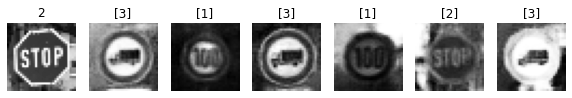

Epoch 98710 g_loss= 1.1030246 d_loss= 1.2675786 real_acc= 0.56 fake_acc= 0.72
Epoch 98720 g_loss= 0.95020777 d_loss= 0.9938568 real_acc= 0.82 fake_acc= 0.7
Epoch 98730 g_loss= 1.0586858 d_loss= 1.0909905 real_acc= 0.7 fake_acc= 0.7
Epoch 98740 g_loss= 1.1505896 d_loss= 1.0835917 real_acc= 0.8 fake_acc= 0.66
Epoch 98750 g_loss= 1.1504785 d_loss= 1.0126767 real_acc= 0.74 fake_acc= 0.7
Epoch 98760 g_loss= 1.1955756 d_loss= 1.1266823 real_acc= 0.68 fake_acc= 0.74
Epoch 98770 g_loss= 1.1155896 d_loss= 1.1475528 real_acc= 0.74 fake_acc= 0.62
Epoch 98780 g_loss= 0.92796457 d_loss= 1.1109624 real_acc= 0.78 fake_acc= 0.6
Epoch 98790 g_loss= 0.9368217 d_loss= 1.2200252 real_acc= 0.68 fake_acc= 0.56
Epoch 98800 g_loss= 0.995537 d_loss= 1.1368318 real_acc= 0.8 fake_acc= 0.6


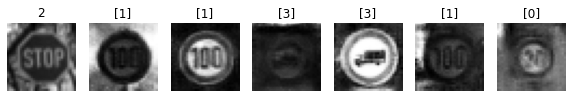

Epoch 98810 g_loss= 1.1384711 d_loss= 1.1194289 real_acc= 0.84 fake_acc= 0.62
Epoch 98820 g_loss= 1.2182072 d_loss= 1.0229592 real_acc= 0.74 fake_acc= 0.8
Epoch 98830 g_loss= 0.840666 d_loss= 1.2265735 real_acc= 0.66 fake_acc= 0.64
Epoch 98840 g_loss= 1.0545155 d_loss= 1.2033281 real_acc= 0.6 fake_acc= 0.6
Epoch 98850 g_loss= 1.1127071 d_loss= 1.1753969 real_acc= 0.6 fake_acc= 0.74
Epoch 98860 g_loss= 1.0891386 d_loss= 1.126744 real_acc= 0.76 fake_acc= 0.66
Epoch 98870 g_loss= 1.1558357 d_loss= 1.1134933 real_acc= 0.68 fake_acc= 0.7
Epoch 98880 g_loss= 1.1797401 d_loss= 1.0627782 real_acc= 0.7 fake_acc= 0.82
Epoch 98890 g_loss= 0.9873342 d_loss= 1.1990614 real_acc= 0.72 fake_acc= 0.66
Epoch 98900 g_loss= 1.184671 d_loss= 1.0731053 real_acc= 0.74 fake_acc= 0.74


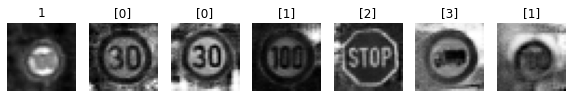

Epoch 98910 g_loss= 1.019448 d_loss= 1.1540477 real_acc= 0.72 fake_acc= 0.58
Epoch 98920 g_loss= 0.9443035 d_loss= 1.0968993 real_acc= 0.8 fake_acc= 0.66
Epoch 98930 g_loss= 1.0320128 d_loss= 1.1412787 real_acc= 0.78 fake_acc= 0.6
Epoch 98940 g_loss= 1.2656673 d_loss= 1.1106209 real_acc= 0.56 fake_acc= 0.88
Epoch 98950 g_loss= 1.034643 d_loss= 1.1033394 real_acc= 0.66 fake_acc= 0.74
Epoch 98960 g_loss= 1.0243385 d_loss= 1.1279975 real_acc= 0.78 fake_acc= 0.68
Epoch 98970 g_loss= 1.0894107 d_loss= 1.1746938 real_acc= 0.56 fake_acc= 0.8
Epoch 98980 g_loss= 1.018915 d_loss= 1.2354231 real_acc= 0.62 fake_acc= 0.72
Epoch 98990 g_loss= 1.0958831 d_loss= 1.1061021 real_acc= 0.7 fake_acc= 0.72
Epoch 99000 g_loss= 1.123458 d_loss= 1.1475918 real_acc= 0.64 fake_acc= 0.74


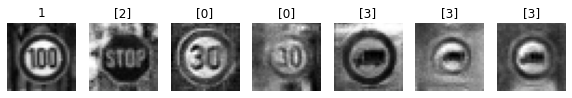

Epoch 99010 g_loss= 0.9610331 d_loss= 1.2976758 real_acc= 0.66 fake_acc= 0.6
Epoch 99020 g_loss= 1.2636806 d_loss= 1.175179 real_acc= 0.64 fake_acc= 0.72
Epoch 99030 g_loss= 1.2046845 d_loss= 0.95431954 real_acc= 0.8 fake_acc= 0.76
Epoch 99040 g_loss= 0.94359344 d_loss= 1.2343645 real_acc= 0.66 fake_acc= 0.62
Epoch 99050 g_loss= 1.1167953 d_loss= 1.076208 real_acc= 0.72 fake_acc= 0.76
Epoch 99060 g_loss= 1.1029983 d_loss= 1.1281103 real_acc= 0.68 fake_acc= 0.72
Epoch 99070 g_loss= 1.1212876 d_loss= 1.1640055 real_acc= 0.74 fake_acc= 0.72
Epoch 99080 g_loss= 1.1535158 d_loss= 1.0790884 real_acc= 0.68 fake_acc= 0.8
Epoch 99090 g_loss= 1.1641551 d_loss= 1.1235874 real_acc= 0.68 fake_acc= 0.72
Epoch 99100 g_loss= 1.0670515 d_loss= 1.1218643 real_acc= 0.72 fake_acc= 0.72


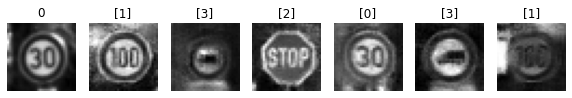

Epoch 99110 g_loss= 1.0842413 d_loss= 1.10759 real_acc= 0.74 fake_acc= 0.58
Epoch 99120 g_loss= 1.3136934 d_loss= 1.0545506 real_acc= 0.68 fake_acc= 0.8
Epoch 99130 g_loss= 1.222793 d_loss= 1.088886 real_acc= 0.72 fake_acc= 0.74
Epoch 99140 g_loss= 1.1910728 d_loss= 1.2174752 real_acc= 0.66 fake_acc= 0.66
Epoch 99150 g_loss= 1.1902541 d_loss= 1.1236979 real_acc= 0.66 fake_acc= 0.74
Epoch 99160 g_loss= 1.0806854 d_loss= 1.040874 real_acc= 0.72 fake_acc= 0.76
Epoch 99170 g_loss= 0.933949 d_loss= 1.1229572 real_acc= 0.76 fake_acc= 0.66
Epoch 99180 g_loss= 1.04509 d_loss= 1.1506219 real_acc= 0.72 fake_acc= 0.74
Epoch 99190 g_loss= 1.3549728 d_loss= 1.1725286 real_acc= 0.56 fake_acc= 0.88
Epoch 99200 g_loss= 1.0220139 d_loss= 1.3028504 real_acc= 0.54 fake_acc= 0.62


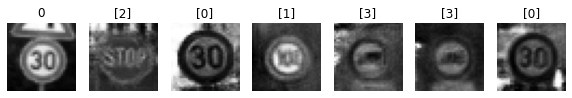

Epoch 99210 g_loss= 0.91074103 d_loss= 1.0404389 real_acc= 0.82 fake_acc= 0.54
Epoch 99220 g_loss= 1.0033121 d_loss= 1.1748502 real_acc= 0.76 fake_acc= 0.62
Epoch 99230 g_loss= 1.1739471 d_loss= 1.060466 real_acc= 0.78 fake_acc= 0.66
Epoch 99240 g_loss= 1.1713356 d_loss= 1.1249888 real_acc= 0.7 fake_acc= 0.72
Epoch 99250 g_loss= 0.9383833 d_loss= 1.2175473 real_acc= 0.72 fake_acc= 0.58
Epoch 99260 g_loss= 1.1423311 d_loss= 1.0663956 real_acc= 0.62 fake_acc= 0.78
Epoch 99270 g_loss= 1.2301112 d_loss= 0.9755176 real_acc= 0.82 fake_acc= 0.76
Epoch 99280 g_loss= 1.1458856 d_loss= 0.9756701 real_acc= 0.76 fake_acc= 0.78
Epoch 99290 g_loss= 1.0460941 d_loss= 1.1009009 real_acc= 0.8 fake_acc= 0.72
Epoch 99300 g_loss= 0.91357285 d_loss= 1.1628491 real_acc= 0.82 fake_acc= 0.6


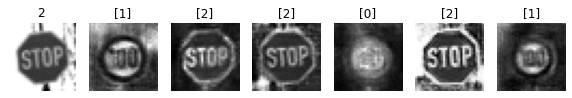

Epoch 99310 g_loss= 1.0543431 d_loss= 1.0480659 real_acc= 0.9 fake_acc= 0.54
Epoch 99320 g_loss= 1.1834356 d_loss= 1.152982 real_acc= 0.7 fake_acc= 0.74
Epoch 99330 g_loss= 1.2134364 d_loss= 1.1784236 real_acc= 0.58 fake_acc= 0.7
Epoch 99340 g_loss= 1.1638798 d_loss= 1.022793 real_acc= 0.78 fake_acc= 0.78
Epoch 99350 g_loss= 1.0592176 d_loss= 1.0881321 real_acc= 0.72 fake_acc= 0.72
Epoch 99360 g_loss= 1.1119925 d_loss= 1.1234231 real_acc= 0.66 fake_acc= 0.76
Epoch 99370 g_loss= 1.32022 d_loss= 0.9813743 real_acc= 0.7 fake_acc= 0.82
Epoch 99380 g_loss= 1.2077272 d_loss= 0.97641754 real_acc= 0.7 fake_acc= 0.8
Epoch 99390 g_loss= 1.2030978 d_loss= 1.1037986 real_acc= 0.68 fake_acc= 0.72
Epoch 99400 g_loss= 0.97791785 d_loss= 1.2195117 real_acc= 0.78 fake_acc= 0.62


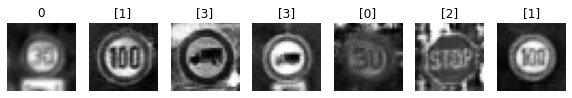

Epoch 99410 g_loss= 1.1728072 d_loss= 1.294781 real_acc= 0.44 fake_acc= 0.8
Epoch 99420 g_loss= 1.0592513 d_loss= 1.106234 real_acc= 0.68 fake_acc= 0.66
Epoch 99430 g_loss= 1.2152812 d_loss= 1.0531561 real_acc= 0.72 fake_acc= 0.76
Epoch 99440 g_loss= 1.1685921 d_loss= 1.1286514 real_acc= 0.58 fake_acc= 0.74
Epoch 99450 g_loss= 1.1663955 d_loss= 1.0541666 real_acc= 0.76 fake_acc= 0.8
Epoch 99460 g_loss= 1.2331696 d_loss= 1.0267792 real_acc= 0.78 fake_acc= 0.78
Epoch 99470 g_loss= 0.9359938 d_loss= 1.1376519 real_acc= 0.82 fake_acc= 0.6
Epoch 99480 g_loss= 0.9668904 d_loss= 1.1397402 real_acc= 0.78 fake_acc= 0.66
Epoch 99490 g_loss= 1.1825031 d_loss= 0.94084966 real_acc= 0.82 fake_acc= 0.7
Epoch 99500 g_loss= 1.1976849 d_loss= 1.24668 real_acc= 0.62 fake_acc= 0.74


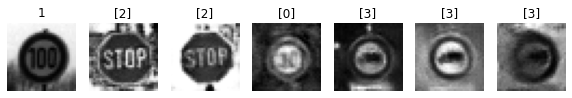

Epoch 99510 g_loss= 1.061184 d_loss= 1.0689237 real_acc= 0.76 fake_acc= 0.64
Epoch 99520 g_loss= 1.0463843 d_loss= 1.0760667 real_acc= 0.7 fake_acc= 0.7
Epoch 99530 g_loss= 1.0853966 d_loss= 1.087702 real_acc= 0.8 fake_acc= 0.64
Epoch 99540 g_loss= 1.058285 d_loss= 1.0917163 real_acc= 0.72 fake_acc= 0.66
Epoch 99550 g_loss= 1.3299063 d_loss= 0.96978766 real_acc= 0.78 fake_acc= 0.8
Epoch 99560 g_loss= 1.3066165 d_loss= 1.1650587 real_acc= 0.52 fake_acc= 0.86
Epoch 99570 g_loss= 1.003873 d_loss= 1.1510103 real_acc= 0.68 fake_acc= 0.74
Epoch 99580 g_loss= 1.1111364 d_loss= 1.0848773 real_acc= 0.74 fake_acc= 0.7
Epoch 99590 g_loss= 1.005849 d_loss= 1.1792636 real_acc= 0.64 fake_acc= 0.6
Epoch 99600 g_loss= 1.2582219 d_loss= 1.0083959 real_acc= 0.7 fake_acc= 0.78


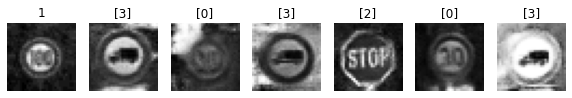

Epoch 99610 g_loss= 1.1178981 d_loss= 1.2141163 real_acc= 0.6 fake_acc= 0.64
Epoch 99620 g_loss= 1.0215809 d_loss= 1.1588215 real_acc= 0.86 fake_acc= 0.58
Epoch 99630 g_loss= 1.0928128 d_loss= 1.1617248 real_acc= 0.68 fake_acc= 0.72
Epoch 99640 g_loss= 1.2310164 d_loss= 1.0505846 real_acc= 0.72 fake_acc= 0.82
Epoch 99650 g_loss= 0.93964744 d_loss= 1.2675388 real_acc= 0.68 fake_acc= 0.5
Epoch 99660 g_loss= 1.0055581 d_loss= 1.2225618 real_acc= 0.74 fake_acc= 0.66
Epoch 99670 g_loss= 1.0513059 d_loss= 1.1328909 real_acc= 0.74 fake_acc= 0.64
Epoch 99680 g_loss= 1.0892879 d_loss= 1.1970077 real_acc= 0.66 fake_acc= 0.7
Epoch 99690 g_loss= 1.1096307 d_loss= 1.0511084 real_acc= 0.72 fake_acc= 0.82
Epoch 99700 g_loss= 0.95134145 d_loss= 1.2687085 real_acc= 0.68 fake_acc= 0.62


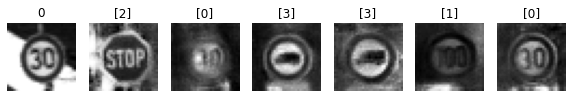

Epoch 99710 g_loss= 1.0669502 d_loss= 1.1128592 real_acc= 0.66 fake_acc= 0.66
Epoch 99720 g_loss= 1.065014 d_loss= 1.1937194 real_acc= 0.66 fake_acc= 0.7
Epoch 99730 g_loss= 0.9754318 d_loss= 1.0962901 real_acc= 0.78 fake_acc= 0.62
Epoch 99740 g_loss= 1.1675799 d_loss= 1.0473762 real_acc= 0.76 fake_acc= 0.8
Epoch 99750 g_loss= 1.2967442 d_loss= 1.0637759 real_acc= 0.72 fake_acc= 0.76
Epoch 99760 g_loss= 1.1077161 d_loss= 1.1660669 real_acc= 0.6 fake_acc= 0.74
Epoch 99770 g_loss= 1.2500745 d_loss= 1.0498477 real_acc= 0.76 fake_acc= 0.72
Epoch 99780 g_loss= 1.222392 d_loss= 1.2188337 real_acc= 0.64 fake_acc= 0.7
Epoch 99790 g_loss= 1.2314081 d_loss= 1.1418589 real_acc= 0.54 fake_acc= 0.68
Epoch 99800 g_loss= 0.9461045 d_loss= 1.2250735 real_acc= 0.76 fake_acc= 0.6


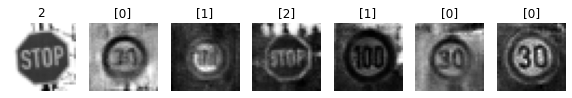

Epoch 99810 g_loss= 1.4304913 d_loss= 0.90910935 real_acc= 0.84 fake_acc= 0.86
Epoch 99820 g_loss= 0.85449445 d_loss= 1.1987265 real_acc= 0.74 fake_acc= 0.46
Epoch 99830 g_loss= 1.1463838 d_loss= 1.0634528 real_acc= 0.76 fake_acc= 0.74
Epoch 99840 g_loss= 1.1950798 d_loss= 1.0569986 real_acc= 0.62 fake_acc= 0.78
Epoch 99850 g_loss= 0.7866952 d_loss= 1.3048966 real_acc= 0.74 fake_acc= 0.46
Epoch 99860 g_loss= 1.0463978 d_loss= 1.1472011 real_acc= 0.74 fake_acc= 0.64
Epoch 99870 g_loss= 1.1842184 d_loss= 1.2860667 real_acc= 0.44 fake_acc= 0.82
Epoch 99880 g_loss= 1.0977464 d_loss= 1.1201959 real_acc= 0.62 fake_acc= 0.8
Epoch 99890 g_loss= 0.8916173 d_loss= 1.1699951 real_acc= 0.66 fake_acc= 0.7
Epoch 99900 g_loss= 1.0537865 d_loss= 1.105639 real_acc= 0.8 fake_acc= 0.64


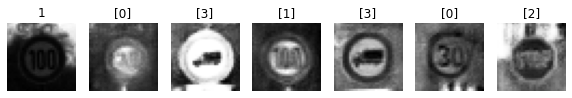

Epoch 99910 g_loss= 1.1760197 d_loss= 1.0759383 real_acc= 0.78 fake_acc= 0.72
Epoch 99920 g_loss= 0.8148585 d_loss= 1.2059717 real_acc= 0.74 fake_acc= 0.56
Epoch 99930 g_loss= 1.1376884 d_loss= 1.1481178 real_acc= 0.66 fake_acc= 0.68
Epoch 99940 g_loss= 1.093326 d_loss= 1.1549 real_acc= 0.78 fake_acc= 0.74
Epoch 99950 g_loss= 1.0197335 d_loss= 1.0938603 real_acc= 0.8 fake_acc= 0.64
Epoch 99960 g_loss= 1.0512098 d_loss= 1.2532108 real_acc= 0.5 fake_acc= 0.68
Epoch 99970 g_loss= 1.0731373 d_loss= 1.0731809 real_acc= 0.74 fake_acc= 0.74
Epoch 99980 g_loss= 1.314722 d_loss= 1.0380349 real_acc= 0.56 fake_acc= 0.86
Epoch 99990 g_loss= 1.2747359 d_loss= 1.2394419 real_acc= 0.54 fake_acc= 0.78
Done


In [59]:
epochs = 40000
for epoch in range(epochs):
    # take some random samples
    new_samples,new_labels = sample_from_dataset(50,samples)
    #print(new_samples.shape)
    # perform one training step (epoch)
    do_step(new_samples, new_labels)
    
    if epoch % 100 == 0:
        # show one real image and some fake images generated by generator using noise seed
        #display.clear_output(wait=True)
        num_examples_to_generate = 6
        seed = tf.random.normal([num_examples_to_generate, noise_dim])
        random_labels = np.random.randint(4, size=num_examples_to_generate)
        random_labels = np.expand_dims(random_labels,axis=1)
        predictions = generator([seed,random_labels], training=False)
        fig = plt.figure(figsize=(10,10))
        r = random.randrange(len(samples))
        plt.subplot(1, num_examples_to_generate+1, 1)
        plt.imshow(samples[r, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.title(labels[r])
        plt.axis('off')
        for i in range(predictions.shape[0]):
            plt.subplot(1, num_examples_to_generate+1, i+2)
            #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
            plt.imshow(predictions[i, :, :, 0], cmap='gray')
            plt.title("{}".format(random_labels[i]))
            plt.axis('off')
        plt.show()    
print("Done")

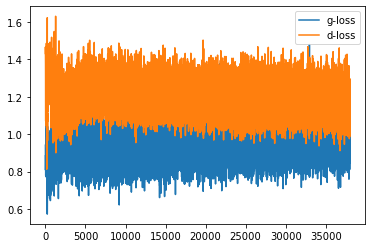

In [50]:
nph = np.array(history)

plt.plot(nph[:,0], label='g-loss')
plt.plot(nph[:,1], label='d-los
plts')
plt.legend()
plt.show()

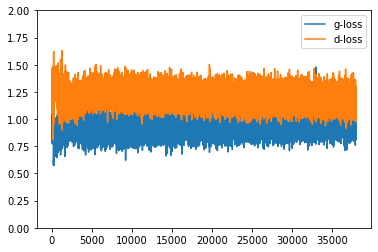

In [54]:
nph = np.array(history)

plt.plot(nph[:,0], label='g-loss')
plt.plot(nph[:,1], label='d-loss')
plt.ylim([0,2])
plt.legend()
plt.show()

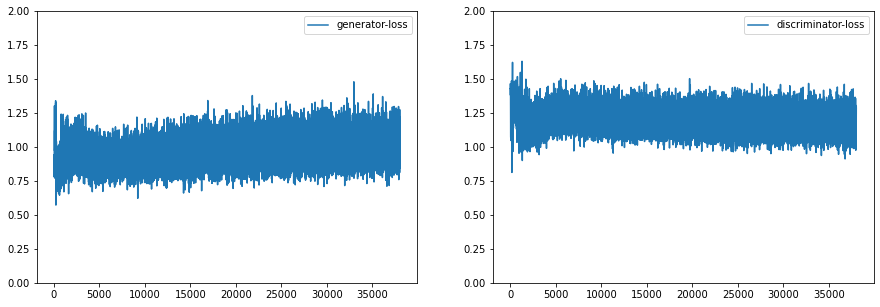

In [55]:
nph = np.array(history)
plt.figure(figsize=(15, 5))
ax = plt.subplot(1, 2, 1)
plt.ylim([0,2])
plt.plot(nph[:,0], label='generator-loss')
plt.legend()
ax = plt.subplot(1, 2, 2)
plt.plot(nph[:,1], label='discriminator-loss')
plt.ylim([0,2])
plt.legend()
plt.show()

In [ ]:
nph = np.array(history)

plt.plot(nph[:,2], label='acc-real')
plt.plot(nph[:,3], label='acc-fak
plt.legend()e')
plt.show()

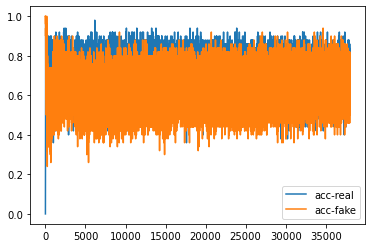

In [56]:
nph = np.array(history)

plt.plot(nph[:,2], label='acc-real')
plt.plot(nph[:,3], label='acc-fake')
plt.legend()
plt.show()

In [62]:
generator.save_weights('generator_4c_80k_weights')

In [61]:
generator.save('generator_4c_80k.h5')

In [67]:
discriminator.save_weights('discriminator_4c_80k_weights.h5')

(36, 100)
(36, 1)


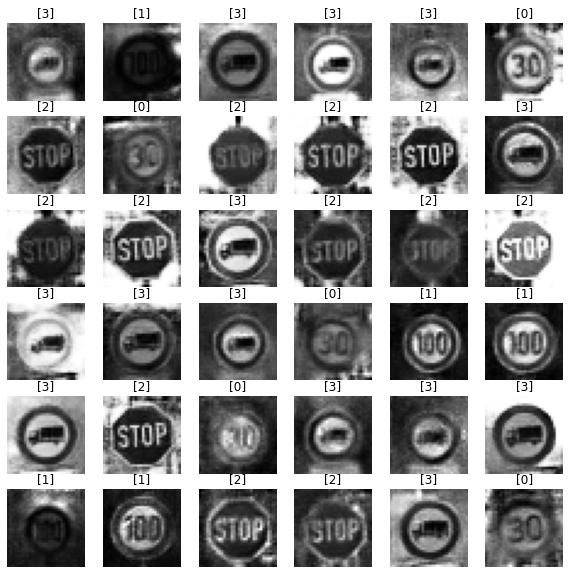

In [63]:
noise_dim = 100
num_examples_to_generate = 36
seed = tf.random.normal([num_examples_to_generate, noise_dim])
random_labels = np.random.randint(4, size=num_examples_to_generate)
random_labels = np.expand_dims(random_labels,axis=1)

print(seed.shape)
print(random_labels.shape)
predictions = generator([seed,random_labels])
fig = plt.figure(figsize=(10,10))
# r = random.randrange(len(samples))
# plt.subplot(1, num_examples_to_generate+1, 1)
#plt.imshow(samples[r, :, :, 0] * 127.5 + 127.5, cmap='gray')
#plt.axis('off')
for i in range(predictions.shape[0]):
    plt.subplot(6, 6, i+1)
    #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
    plt.imshow(predictions[i, :, :, 0], cmap='gray')
    plt.title("{}".format(random_labels[i]))
    plt.axis('off')
plt.show()    